<a href="https://colab.research.google.com/github/SarraLKSC/Salamander_Individual_Identification/blob/main/Notebooks/Patch_wise_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import cv2
import math
import random
import sklearn
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.svm import SVC
from matplotlib import patches
from google.colab import drive
import matplotlib.pyplot as plt
from skimage.draw import ellipse
from sklearn.cluster import KMeans
from skimage.transform import rotate
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import mahalanobis
from sklearn.neighbors import KNeighborsClassifier
from skimage.measure import label, regionprops, regionprops_table

In [ ]:
#register_heif_opener()
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
images =["/content/drive/MyDrive/boleil_annotated/best_pattern_spot/"+ doc for doc in os.listdir("/content/drive/MyDrive/boleil_annotated/best_pattern_spot")]
img_root="/content/drive/MyDrive/boleil_annotated/best_pattern_spot"


In [ ]:
images.sort()

In [ ]:
len(images)

306

In [ ]:
BATCH=0
def load_batch(batch=0,size=50):
  """
    return a batch of data of given size as a dictionary for which the key is the path and the item is the loaded image
  """
  msk_samples={}
  start=50*batch
  end=len(images) #start+50

  for i in range(start,end):

    if i>len(images):
      return msk_samples

    msk_= np.asarray(Image.open(os.path.join(img_root,images[i])).convert('L'))
    msk_samples[images[i]]=msk_

    print("\r"+str(i)+"/"+str(len(images)),end="")

  return msk_samples

def map_path_id(keys):
  """
   returns a dictionary for which the key is the id and the item is the path
   this dictionary is later on used to easily leverage the dict of data
  """
  dict_keys={}

  for k in keys :
    id= "".join(filter(str.isdigit, k))
    id = int(id)
    if id in dict_keys.keys():
      dict_keys[id].append(k)
    else:
      dict_keys[id]=[k]

  return dict_keys

In [ ]:
def get_centroid(img):
  """
    return the centroid of the pattern foreground in binary image img
  """

  img = img.astype(np.uint8)  # Convert the image to uint8 data type
  contours, _ = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnt =np.concatenate(contours)
  cnt = cnt.reshape(-1, 2)
  centroid = np.mean(cnt, axis=0)

  return centroid[0],centroid[1]


def get_patchs(image,patch_size=32,stride=0,centroid=False):
  """
    generate patchs from input image
    by default outputs 32x32 patchs without stride
    if centroid= True => we return the list of coordinates of each path with respect to the foreground centroid
  """
  patches=[]
  coords =[]
  cx,cy= get_centroid(image)

  image_height, image_width = image.shape
  if stride== 0:
    num_patches_vertical = image_height // patch_size
    num_patches_horizontal = image_width // patch_size

    for i in range(num_patches_vertical):
      for j in range(num_patches_horizontal):
        patch = image[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size]
        patches.append(patch)
        x= (i*patch_size) - cx + patch_size // 2
        y= (j*patch_size) - cy + patch_size // 2
        coords.append((x,y))

  else :
    num_patches_vertical = (image_height - patch_size) // stride + 1
    num_patches_horizontal = (image_width - patch_size) // stride + 1

    for i in range(num_patches_vertical):
      for j in range(num_patches_horizontal):
        patch = image[i * stride: i * stride + patch_size, j * stride: j * stride + patch_size]
        patches.append(patch)
        x= (i * stride) - cx + patch_size // 2
        y= (j * stride) - cy + patch_size // 2
        coords.append((x,y))

 # print(len(patches))
  if centroid:
    return patches,coords
  else:
    return patches

def moments_reduction(patch,pix=False,id=None):
  """
    generate the vector of central normalized moments for a patch
    returns a vector of shape (7,) with nu values or shape (8,) with nu values and assigned id label
  """
  moments=[]
  sum_patch= np.sum(patch)
  contours,_= cv2.findContours(patch, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  if len(contours)>0:
    cnt=np.concatenate(contours)
  else: cnt=contours
  mmnt= cv2.moments(cnt)
  moments=list(mmnt.values())
 # nu_keys=list(mmnt)[-7:]

 # for key in nu_keys:
 #   moments.append(mmnt[key])
 # pca=PCA(n_components=7)
 # reduced_pixels= pca.fit_transform(patch.flatten())
 # moments.extend(reduced_pixels)
  if pix:
    moments.extend(patch.flatten())
  if id is not None:
    moments.append(int(id))

  return moments

def vector_reduction(patch,id=None):
  """
    generate the vector of flattened patch
    returns a vector of shape (1024,) with pixel values or shape (1025,) with assigned id label
  """
  vectors=patch.flatten()
  if id is not None:
    vectors=np.append(vectors,int(id))
  return vectors

def centroid_reduction(patch,centroid,pixel=True,nu=False,id=None):
  """
    return a feature vector composed of (x,y) the position of the patch with respect ot the centroid of the pattern,
    followed by nu moments and/or pixels based on boolan parameters passed in the function, and the id.
  """

  vector=[]
  ## vector starts with localisation information x,y
  vector.append(centroid[0])
  vector.append(centroid[1])
  if nu:
    vector.extend(moments_reduction(patch))
  if pixel:
    vector.extend(patch.flatten())
  if id is not None:
    vector.append(int(id))

  return vector

def decode_features(feature_vect):
  pixel_vect=feature_vect[-1024:]
  img= np.reshape(pixel_vect, (32, 32))

  return img


def get_non_zero_patchs(image,patch_size=32,stride=0,centroid=False):
  """
  apply selection to the patchs generated by get_patchs function to filter out zero patches
  """

  if centroid:
   patches, coords = get_patchs(image, patch_size, stride, centroid)
   filter_patches = [np.sum(patch) != 0 for patch in patches]
   non_zero_patches = [patch for patch, flag in zip(patches, filter_patches) if flag]
   non_zero_coords = [coord for coord, flag in zip(coords, filter_patches) if flag]

   return non_zero_patches, non_zero_coords

  else:
    patchs= get_patchs(image,patch_size,stride,centroid)
    filter_patches = [np.sum(patch)!=0 for patch in patches]
    non_zero_patches = [patch for patch,flag in zip(patches,filter_patches) if flag]

    return non_zero_patches

def non_zero_patchs_idx(image):
  idx=[]

  image= cv2.resize(image,(256,256))
  patchs=get_patchs(image,stride=16)####)

  for i,p in enumerate(patchs):

    somme= np.sum(p)
    if somme !=0:
      idx.append(i)
  return(np.asarray(idx))

In [ ]:
def get_data(reshaped=False,nu=True,images_too=False,skip_img=None):
  """
    returns dataset made of the loaded batch
    if nu = True returns the moments vector
    if reshapred = True returns reshaped dataset
    if images_too= True returns original data as well
    skip_img parameter is used during evaluation to set a query image aside from the training data.
  """
  ZEROES=False
  STRIDE=16
  SIZE=32
  dataset= []
  data= load_batch(BATCH)
  for name,img in data.items():
    if skip_img != None:
      if name == skip_img:
        continue
    img= cv2.resize(img,(256,256))
    id= "".join(filter(str.isdigit, name))
    id = int(id)

    if ZEROES:  #if we keep zero patches in data
      patchs= get_patchs(img,patch_size=SIZE,stride=STRIDE,)
      if nu:
        nu_patches  =[moments_reduction(p,id) for p in patchs]
      #nu_patches  =[centroid_reduction(p,c,pixel=True,nu=True,id=id) for (p,c) in zip(patchs,coords)] ##vector of coords, nu moments, pixels
      else:
        nu_patches=[vector_reduction(p,id) for p in patchs]
      #nu_patches  =[centroid_reduction(p,c,pixel=True,id=id) for (p,c) in zip(patchs,coords)]  ##vector of coords, pixels

      dataset.append(np.array(nu_patches))

    else: #if we filter out zero patches from data
      patchs= get_patchs(img,stride=STRIDE)
      if nu:
        nu_patches  =[dataset.append(moments_reduction(p,pix=True,id=id)) for p in patchs]
        #nu_patches  =[dataset.append(centroid_reduction(p,c,pixel=True,nu=True,id=id)) for (p,c) in zip(patchs,coords)] ##vector of coords, nu moments, pixels
      else:
        nu_patches=[dataset.append(vector_reduction(p,id)) for p in patchs]
      #nu_patches  =[centroid_reduction(p,c,pixel=True,id=id) for (p,c) in zip(patchs,coords)]  ##vector of coords, pixels

  if reshaped:
    return reshape_data(np.array(dataset))
  if images_too:
    return np.array(dataset),data
  else:
    return np.array(dataset)


In [ ]:
def reshape_data(dataset,nu=True):
  """
    reshapes the dataset so that the patches are presented together
    i.e first row is all the first top left corner of all samples and last row is all the bottom right corner of all samples

  """

  # 1) Transpose the dataset to have the rows as the first dimension
  # 2) Reshape the transposed dataset to get 64 datasets of shape (50, 8)
  print(dataset.shape)
  if len(dataset.shape)==3:
    _,nb_patchs,nb_dims= dataset.shape

    if nu:
      transposed_dataset = np.transpose(dataset, (1, 0, 2))
      separated_datasets = np.reshape(transposed_dataset, (nb_patchs, 150, 1048)) ##### 64 now 255
    else:
      transposed_dataset = np.transpose(dataset, (1, 0, 2))
      separated_datasets = np.reshape(transposed_dataset, (nb_patchs, 150, 1025)) ##### 64 now 255

      return separated_datasets
  return dataset


def plot_blocks(img,patch_size=32,stride=0):
  """
    plot the image with red vertical and horizontal lines that allow to vizualize the patch separation
    in the case of a stride a blue rectangle to shows the size of patch
  """

  img=cv2.resize(img,(256,256))
  fig, ax = plt.subplots()

  ax.imshow(img, cmap='gray')

  grid_color = 'red'
  grid_linewidth = 0.5
  patch_color = 'blue'
  patch_linewidth = 3

  if stride ==0:
    for i in range(8):
      ax.axvline(i*32, color=grid_color, linewidth=grid_linewidth)

    for i in range(8):
      ax.axhline(i*32, color=grid_color, linewidth=grid_linewidth)

  else:
    num_patches_vertical = img.shape[0] // stride
    num_patches_horizontal = img.shape[1] // stride

    for i in range(num_patches_vertical):
        ax.axhline(i * stride, color=grid_color, linewidth=grid_linewidth)

    for i in range(num_patches_horizontal):
        ax.axvline(i * stride, color=grid_color, linewidth=grid_linewidth)
    rect = patches.Rectangle((0, 0), patch_size, patch_size, linewidth=patch_linewidth,
                             edgecolor=patch_color, facecolor='none')
    ax.add_patch(rect)

  ax.set_aspect('equal')
  plt.show()

In [ ]:
LABELS=[]
def patch_solo_knns(dataset,samples_too=False):
  """
  build and train knn classifier on dataset
  samples_too : boolean value dictating if we return labels of the knn samples
  returns a trained knn classifier
  """

  if len(dataset.shape)==3:
    nb_patchs,nb_samples,nb_dims= dataset.shape

    trainset= np.reshape(dataset,(nb_patchs*nb_samples,nb_dims))
  else :
    nb_patchs,nb_dims= dataset.shape
    trainset=dataset

  np.random.shuffle(trainset)
  train_samples,train_labels= trainset[:,:24] , trainset[:,-1]
  test_samples,test_labels  = trainset[-100:,:24] , trainset[-100:,-1]

  train_samples = train_samples.astype(np.float32)
  train_labels = train_labels.astype(np.float32)

  test_samples = test_samples.astype(np.float32)
  test_labels = test_labels.astype(np.float32)

  LABELS=train_labels
  SAMPLES=trainset[:,:-1] #train_samples

  print("len(train)={}. ; len(test)={}".format(len(train_samples),len(test_samples)))

   # Compute the covariance matrix for Mahalanobis distance
  epsilon = 1e-6  # Small positive constant for regularization
  cov_matrix = np.cov(train_samples, rowvar=False)
  inv_cov_matrix = np.linalg.inv(cov_matrix + epsilon * np.eye(cov_matrix.shape[0]))

  def mahalanobis_distance(x, y):
    return mahalanobis(x, y, inv_cov_matrix)

  knn = KNeighborsClassifier(n_neighbors=5, metric=mahalanobis_distance)
  knn.fit(train_samples, train_labels)

  dist,neighbors = knn.kneighbors(test_samples,n_neighbors=5)
  result = knn.predict(test_samples)

  if samples_too:
    return knn,LABELS,SAMPLES
  return knn,LABELS


def get_solo_knn_votes(image,solo_knn,nu=True):
  """
    gets the votes assigned for each patch of image based on the solo_knn classifier.
    image: the image to predict on, it is split in patches and transformed in feature vector before infering the KNN
  """
  STRIDE=16
  patch_votes=[]
  patch_indices=[]
  patch_dist=[]

  # resize image to 256,256
  image=cv2.resize(image,(256,256))

  # get patchs of the image
  patchs=get_patchs(image,stride=16) #####)
  non_zero_idx=non_zero_patchs_idx(image)

  # get nu moments vectors
  if nu:
    nu_patches  =[moments_reduction(p,pix=False) for i,p in enumerate(patchs) if i in non_zero_idx]
   # nu_patches  =[centroid_reduction(p,c,pixel=True,nu=True,id=id) for i,(p,c) in zip(patchs,coords)] ##vector of coords, nu moments, pixels

  else :
    nu_patches  =[vector_reduction(p) for i,p in enumerate(patchs) if i in non_zero_idx]
  nu_patches  =np.asarray(nu_patches)

  # get knn vote for each patch

  for i,patche in enumerate(nu_patches):
    print("\rsolo KNN vote "+str(i)+"/"+str(len(nu_patches)),end="")
    # run prediction for patch i
    patche =patche.astype(np.float32)  # Convert to CV_32F

    tmp=np.asarray( [patche])
    tmp=tmp.astype(np.float32)

    result = solo_knn.predict(tmp)
    distances, indices = solo_knn.kneighbors(tmp, n_neighbors=5)

    # append the prediction of patch i to the patch votes
    patch_votes.append(result.flatten())
    patch_indices.append(indices.flatten())
    patch_dist.append(distances.flatten())

  print("\nshape of input patch feature vector {}".format(tmp.shape))
  return patch_votes,patch_indices,patch_dist


def solo_knn_results(image,dataset,displayed=True,return_df=False):
  """
    display intermediate results such as the KNN predictions for each patch and the selected non-zero patchs result and frequence of the selected votes
  """
  if len(dataset.shape)==3:
    nb_patchs,_,dims= dataset.shape
  else :
    nb_patchs = 225
    dims=dataset.shape[1]

  nu=True
  if dims==1025:
    nu=False

  patch_KNN,LABELS,SAMPLES= patch_solo_knns(dataset,samples_too=True)

  patch_votes,patch_indices,patch_dist= get_solo_knn_votes(image,patch_KNN,nu)
  df=pd.DataFrame(np.asarray(patch_votes).reshape(len(patch_votes),),columns=["votes"])
  df["indices"]=patch_indices
  df['neighbours'] = df['indices'].apply(lambda x: [LABELS[i] for i in x])
  df["dist"]=patch_dist
  df['votes'] = patch_votes #df['neighbours'].apply(lambda x: x[0])

  pd.set_option("display.max_rows", None)

  non_zero_idx=non_zero_patchs_idx(image)
  print("non_zero_idx= : {}".format(non_zero_idx))
  print("df index = {}".format(df.index.to_list()))
  extracted_values = df['votes'] #df.iloc[non_zero_idx]['votes']
  selected_rows = df#.loc[non_zero_idx]

  if displayed:
    display(selected_rows)

  exploded_df = df.explode("indices")

  # Get the distinct values from the exploded "neighbours" column
  distinct_values = exploded_df["indices"].unique()

  value_counts = extracted_values.value_counts()
  frequency_df = pd.DataFrame({'votes': value_counts.index, 'frequency': value_counts.values})

  if displayed:
    display(frequency_df)
  if return_df:
    return frequency_df,SAMPLES


In [ ]:
def patch_solo_svm(dataset, samples_too=False):

    if len(dataset.shape) == 3:
        nb_patchs, nb_samples, nb_dims = dataset.shape
        trainset = np.reshape(dataset, (nb_patchs * nb_samples, nb_dims))
    else:
        nb_patchs, nb_dims = dataset.shape
        trainset = dataset

    print(nb_dims)
    train_samples, train_labels = trainset[:, :24], trainset[:, -1]
    test_samples, test_labels = trainset[-100:, :24], trainset[-100:, -1]

    train_samples = train_samples.astype(np.float32)
    train_labels = train_labels.astype(np.float32)

    test_samples = test_samples.astype(np.float32)
    test_labels = test_labels.astype(np.float32)

    LABELS = train_labels

    # Create and fit SVM model
    svm = SVC(kernel='rbf', C=10,decision_function_shape="ovo", class_weight='balanced')  # You can choose different kernel and parameters
    svm.fit(train_samples, train_labels)

    # Predict on test set
    result = svm.predict(test_samples)

    if samples_too:
        return svm, LABELS, trainset[:, :-1]
    return svm, LABELS


def get_solo_svm_votes(image,solo_svm,nu=True):

  STRIDE=16
  patch_votes=[]
  SIZE=256
  # resize image to 256,256
  image=cv2.resize(image,(SIZE,SIZE))
  # get patchs of the image
  patchs=get_patchs(image,stride=STRIDE) #####)
  non_zero_idx=non_zero_patchs_idx(image)
  #patchs= get_non_zero_patchs(img,stride=STRIDE)


  # get nu moments vectors
  if nu:
    nu_patches  =[moments_reduction(p,pix=False) for i,p in enumerate(patchs) if i in non_zero_idx]
   # nu_patches  =[centroid_reduction(p,c,pixel=True,nu=True,id=id) for i,(p,c) in zip(patchs,coords)] ##vector of coords, nu moments, pixels

  else :
    nu_patches  =[vector_reduction(p) for i,p in enumerate(patchs) if i in non_zero_idx]
  nu_patches  =np.asarray(nu_patches)
  #print("nu patches {} ; element of it {}".format(nu_patches.shape,nu_patches[0].shape))
  # get knn vote for each patch
  #print(solo_knn.classes_)
  for i,patche in enumerate(nu_patches):
    print("\rsolo KNN vote "+str(i)+"/"+str(len(nu_patches)),end="")
    # run prediction for patch i on knn that was trained on patchs of position i
    patche =patche.astype(np.float32)  # Convert to CV_32F

    tmp=np.asarray( [patche])
    tmp=tmp.astype(np.float32)

    result = solo_svm.predict(tmp)

    # Get the labels of the neighboring samples
   # neighbor_labels = solo_knn.classes_[indices]

    # append the prediction of patch i to the patch votes
    patch_votes.append(result.flatten())

  print("\nshape of input patch feature vector {}".format(tmp.shape))
  return patch_votes

def solo_svm_results(image,dataset,displayed=True,return_df=False):
  """
    display intermediate results such as the svm predictions for each patch and the selected non-zero patchs result and frequence of the selected votes
  """
  if len(dataset.shape)==3:
    nb_patchs,_,dims= dataset.shape
  else :
    nb_patchs = 225
    dims=dataset.shape[1]

  nu=True
  if dims==1025:
    nu=False
  #print("gonna go patch solo knns")
  patch_svm,LABELS,SAMPLES= patch_solo_svm(dataset,samples_too=True)
  #print("gonna go get solo knns votes")
  patch_votes= get_solo_svm_votes(image,patch_svm,nu)

  df=pd.DataFrame(np.asarray(patch_votes).reshape(len(patch_votes),),columns=["votes"])

  df['votes'] = patch_votes #df['neighbours'].apply(lambda x: x[0])

  pd.set_option("display.max_rows", None)

  non_zero_idx=non_zero_patchs_idx(image)
  extracted_values = df['votes'] #df.iloc[non_zero_idx]['votes']
  selected_rows = df #df.loc[non_zero_idx]

  if displayed:
    display(selected_rows)


  # Get the distinct values from the exploded "neighbours" column

  # Print the distinct values
  #print(distinct_values)
  if len(LABELS)==0:
    print("LABELS was not assigned inside the knn vote function ")
  else:
    print(LABELS)
  value_counts = extracted_values.value_counts()
  frequency_df = pd.DataFrame({'votes': value_counts.index, 'frequency': value_counts.values})

  if displayed:
    display(frequency_df)
  if return_df:
    return frequency_df,SAMPLES


In [ ]:
def display_votes(image,dataset,images):
  """
      display for each non-zero patch of the image to predict, the corresponding patch of the predicted identity
  """
  if len(dataset.shape)==3:
    nb_patchs,_,dims= dataset.shape
  else :
    nb_patchs = 225
    dims=dataset.shape[1]

  nu=True
  if dims==1025:
    nu=False
  #train KNNs
  patch_KNN= patch_knns(dataset)
  #run KNNs on image
  patch_votes,patch_neighbours,patch_dist= get_knn_votes(image,patch_KNN,nu)



  #get image patches
  image= cv2.resize(image,(256,256))
  patchs=get_patchs(image,stride=16)#####)
  #get non-zero patches and their votes
  non_zero_idx=non_zero_patchs_idx(image)

  #build df of results
  df=pd.DataFrame(np.asarray(patch_votes).reshape(nb_patchs,),columns=["votes"],index=non_zero_idx)
  df["neighbors"]=patch_neighbours
  df["dist"]=patch_dist

  extracted_values = df.iloc[non_zero_idx]['votes']
  extracted_neighbors = df.iloc[non_zero_idx]['neighbors']

  for idx in non_zero_idx:
    fig=plt.figure(figsize=(13,13))
    predicted_id= extracted_values[idx]

    neighbors=extracted_neighbors[idx]#[0] # get the ids that were voted by neighboring points
    neighbors=np.delete(neighbors,np.where(neighbors==predicted_id)) # remove the predicted id as it will be displayed already
    neighbors = np.delete(neighbors, np.where([n not in dict_keys_path.keys() for n in neighbors]))

    #print(extracted_neighbors)
    print(neighbors)
    l=len(neighbors)

    key_id= dict_keys_path[predicted_id] # get the image key for the predicted id in the dictionary of paths for images
    print("nb images of this id = {}".format(len(key_id)))

    dup=len(key_id)+1 # if len(key_id)==1 i.e one unique image of salam id then dup=2 and we expect 2+l subplots: to_predict image, predicted image and l neighbors images
                      # if len(key_id)>1 i.e one or more image duplicates of salam id then dup=2+len(key_id) and we expect dup+l subplots: to_predict image, predicted image and its duplicates and l neighbors images
                      # we use duplicate for lack of better word but it refers to different images (spot patterns) of the same individual

    plt.subplot(1,dup+l,1)
    plt.imshow(patchs[idx],cmap="gray")
    plt.title(" patch {} voted id ={}".format(idx,predicted_id))
    plt.axis("off")

    plt.subplot(1,dup+l,2)
    predicted= dataset_dict[key_id[0]]
    predicted= cv2.resize(predicted,(256,256))
    voted_patch=get_patchs(predicted,stride=16)[idx] ## recouvrement
    plt.imshow(voted_patch,cmap="gray")
    plt.axis("off")

    if len(key_id)>1:
      #print(" more than one image it has {} duplicates".format(len(key_id)))
      #print(" we have l= {}; dup= {}".format(l,dup))
      for j in range(1,len(key_id)):

        plt.subplot(1,dup+l,2+j)
        predicted_dup= dataset_dict[key_id[j]]
        predicted_dup= cv2.resize(predicted_dup,(256,256))
        voted_patch_dup=get_patchs(predicted_dup,stride=16)[idx] ### recouvrement
        plt.imshow(voted_patch_dup,cmap="gray")
        plt.title("dup")
        plt.axis("off")
        print("FOR IDX= {} : first one : {} ; other {}".format(idx,key_id[0],key_id[j]))


    for i in range (1+dup,1+dup+l):
      plt.subplot(1,dup+l,i)
      key_id= dict_keys_path[neighbors[i-dup-1]][0]
      neighbor=dataset_dict[key_id]
      neighbor= cv2.resize(neighbor,(256,256))
      neigh_patch=get_patchs(neighbor,stride=16)[idx] ### recouvrement
      plt.imshow(neigh_patch,cmap="gray")
      plt.title("id= {}".format(int(neighbors[i-dup-1])))
      plt.axis("off")

    plt.show()


def display_solo_votes(image,dataset,images):
  """
      display for each non-zero patch of the image to predict, the corresponding patch of the predicted identity
  """
  if len(dataset.shape)==3:
    nb_patchs,_,dims= dataset.shape
  else :
    nb_patchs = 225
    dims=dataset.shape[1]

  nu=True
  if dims==1025:
    nu=False
  #train KNNs
  patch_KNN,LABELS,SAMPLES= patch_solo_knns(dataset,samples_too=True)

  print("SAMPLES shape = {}; SAMPLES[4332] shape = {};".format(SAMPLES.shape,SAMPLES[4332].shape))
  #run KNNs on image
  patch_votes,patch_indices,patch_dist= get_solo_knn_votes(image,patch_KNN,nu)

  #get image patches
  image= cv2.resize(image,(256,256))
  patchs=get_patchs(image,stride=16)########)
  #get non-zero patches and their votes
  non_zero_idx=non_zero_patchs_idx(image)
  #build df of results
  df=pd.DataFrame(np.asarray(patch_votes).reshape(len(patch_votes),),columns=["votes"],index=non_zero_idx)
  df["indices"]=patch_indices
  df['neighbours'] = df['indices'].apply(lambda x: [LABELS[i] for i in x])
  df["dist"]=patch_dist

  extracted_values = df['votes'] #df.iloc[non_zero_idx]['votes']
  extracted_neighbors =df['neighbours'] # df.iloc[non_zero_idx]['neighbours']
  extracted_indices = df['indices']#df.iloc[non_zero_idx]['indices']

  for idx in non_zero_idx:
    fig=plt.figure(figsize=(13,13))
    predicted_id= extracted_values[idx]
    neighbors=extracted_neighbors[idx]
    indices = extracted_indices[idx]

    print("neighbors: {} ; indices: {}".format(neighbors,indices))
    #print("len neighbors : {} ; len indices : {}".format(len(neighbors),len(indices)))

    plt.subplot(1,6,1)
    plt.imshow(patchs[idx],cmap="gray")
    plt.title(" patch {} voted id ={}".format(idx,predicted_id))
    plt.axis("off")
    for i in range (2,7):

      plt.subplot(1,6,i)
      indice= indices[i-2]
      sample= SAMPLES[int(indice)]
      #print("for the point {} : indices : {} of type {}; sample has shape {}".format((i-2),indice,type(indice),sample.shape))

      img = decode_features(sample)
      plt.imshow(img,cmap="gray")
      plt.title("label {}".format(LABELS[indice]))
      plt.axis("off")

    plt.show()


In [ ]:
data,dataset_dict=get_data(nu=True,images_too=True)
print("\nshape of dataset : {} ; shape of each sample : {}".format(data.shape,data[0].shape))
reshaped_data=reshape_data(data,nu=True)
print("\nshape of dataset : {} ; shape of each patch dataset : {}".format(reshaped_data.shape,reshaped_data[0].shape))

305/306
shape of dataset : (68850, 1049) ; shape of each sample : (1049,)
(68850, 1049)

shape of dataset : (68850, 1049) ; shape of each patch dataset : (1049,)


In [ ]:
data,dataset_dict=get_data(nu=True,images_too=True)
print("\nshape of dataset : {} ; shape of each sample : {}".format(data.shape,data[0].shape))
reshaped_data=reshape_data(data,nu=True)
print("\nshape of dataset : {} ; shape of each patch dataset : {}".format(reshaped_data.shape,reshaped_data[0].shape))

305/306/content/drive/MyDrive/boleil_annotated/best_pattern_spot/001.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/002.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/002b.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/002c.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/003.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/003b.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/004.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/004b.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/005.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/006.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/007.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/010.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/011.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/011b.png
/content/drive/MyDrive/boleil_annotated/best_pattern_spot/014b.p

KeyboardInterrupt: ignored

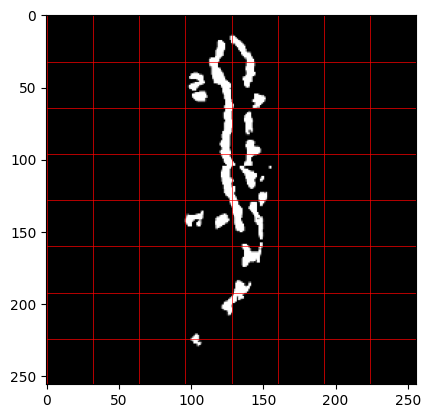

'/content/drive/MyDrive/boleil_annotated/best_pattern_spot/005.png'

In [ ]:
samples_img=list(dataset_dict.values())[8]
plot_blocks(samples_img)
non_zero_idx=non_zero_patchs_idx(samples_img)
list(dataset_dict.keys())[8]

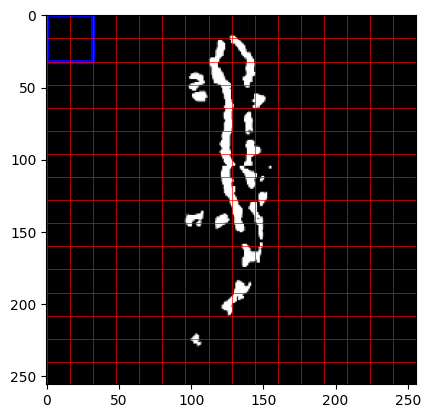

In [ ]:
plot_blocks(samples_img,32,16)

In [ ]:

def get_scenario_paths(dataset_dict,closed_set=True):
  """
     In the case of closed set evaluation this function returns the paths of all images concerned i.e with occurrence > 1
     In the case of open set evaluation this function returns the paths of all images concerned i.e with occurrence = 1
  """
  dataset_dict_helper=map_path_id(dataset_dict.keys())
  identities = list(dataset_dict_helper.keys())
  occurrences = [len(paths) for paths in dataset_dict_helper.values()]
  path_lists = list(dataset_dict_helper.values())

  # Create a DataFrame
  data = {"identity": identities, "occurrence": occurrences, "path": path_lists}
  df = pd.DataFrame(data)
  if closed_set:
    filtered_df = df[df['occurrence'] > 1]
  else:
   filtered_df = df[df['occurrence']  < 2]

  concatenated_paths = []
  for paths in filtered_df['path']:
      concatenated_paths.extend(paths)
  return concatenated_paths

In [ ]:
keys=list(dataset_dict.keys())
dict_keys_path= map_path_id(keys)
to_predict=list(dataset_dict.values())[26]


In [ ]:
list(dataset_dict.keys())[27]

'/content/drive/MyDrive/boleil_annotated/best_pattern_spot/024.png'

In [ ]:
to_predict=list(dataset_dict.values())[27]
v_,SAMPLES=solo_knn_results(to_predict,reshaped_data,return_df=True)

len(train)=68850. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  19  20  21  22  23  24  34  35  36  37  38  39  50  51
  52  53  54  66  67  68  81  82  83  84  85  94  95  96  97  98  99 100
 109 110 111 112 113 114 125 126 127 128 129 141 142 143 156 157 158 172
 173 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[24.0],"[42292, 28662, 13343, 63246, 58901]","[24.0, 96.0, 173.0, 310.0, 63.0]","[0.0, 1.1456797901106193, 1.1468573253636833, ..."
1,[24.0],"[61618, 1777, 18244, 54681, 47108]","[24.0, 112.0, 109.0, 187.0, 68.0]","[0.0, 3.3294446205280153, 3.4422075711093645, ..."
2,[24.0],"[31478, 46500, 49579, 13842, 54268]","[24.0, 248.0, 285.0, 137.0, 161.0]","[0.0, 1.8151758643225597, 2.0730468955711325, ..."
3,[24.0],"[7255, 7702, 59344, 44084, 32901]","[24.0, 162.0, 315.0, 124.0, 97.0]","[0.0, 0.3034814319022445, 0.3350738657232438, ..."
4,[24.0],"[14691, 50544, 19452, 24373, 2517]","[24.0, 233.0, 141.0, 30.0, 110.0]","[0.0, 0.0352348452436152, 0.09090317450861697,..."
5,[2.0],"[19742, 26957, 59929, 23555, 37201]","[24.0, 2.0, 43.0, 116.0, 74.0]","[0.0, 0.47365484190208595, 0.5457584941859663,..."
6,[24.0],"[60371, 44404, 18271, 26074, 34526]","[24.0, 207.0, 36.0, 29.0, 64.0]","[0.0, 4.656003480534404, 4.879079659558504, 4...."
7,[11.0],"[36888, 57810, 13144, 6926, 66294]","[24.0, 34.0, 254.0, 11.0, 222.0]","[0.0, 3.495653131758258, 3.605392602428449, 3...."
8,[24.0],"[42197, 41184, 44773, 31606, 22074]","[24.0, 274.0, 222.0, 80.0, 101.0]","[0.0, 1.5749967872797535, 2.0104848981280683, ..."
9,[4.0],"[34820, 7174, 750, 4416, 27642]","[24.0, 315.0, 124.0, 166.0, 4.0]","[0.0, 0.3690348039652838, 0.4878484616070176, ..."


,votes,frequency
0,[24.0],44
1,[34.0],4
2,[2.0],3
3,[4.0],2
4,[7.0],2
5,[11.0],1
6,[23.0],1
7,[20.0],1
8,[14.0],1
9,[3.0],1


In [ ]:
sample_image= list(dataset_dict.values())[27]
altered_1= sample_image.copy()
altered_1[64:128,190:220]=0
altered_2= sample_image.copy()
altered_2[64:128,190:220]=0
altered_2[220:280,195:220]=0
altered_3= sample_image.copy()
altered_3[64:128,190:220]=0
altered_3[220:280,195:220]=0
altered_3[0:45,195:220]=0

In [ ]:
v_,SAMPLES=solo_knn_results(altered_1,reshaped_data,return_df=True)

len(train)=68850. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  19  20  21  22  23  24  34  35  36  37  38  39  50  51
  52  53  54  66  67  68  81  82  83  84  85  94  95  96  97  98  99 100
 109 110 111 112 113 114 125 126 127 128 129 141 142 143 156 157 158 172
 173 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[24.0],"[63641, 50406, 14226, 18879, 17696]","[24.0, 96.0, 173.0, 310.0, 63.0]","[0.0, 1.1456797901147282, 1.1468573253728136, ..."
1,[24.0],"[43495, 41608, 45764, 28833, 13253]","[24.0, 112.0, 109.0, 187.0, 68.0]","[0.0, 3.329444620514338, 3.4422075711677347, 3..."
2,[24.0],"[68494, 43023, 19824, 58103, 21260]","[24.0, 248.0, 285.0, 137.0, 161.0]","[0.0, 1.8151758643107132, 2.073046895554469, 2..."
3,[24.0],"[21186, 15410, 2037, 32912, 26021]","[24.0, 162.0, 315.0, 124.0, 97.0]","[0.0, 0.30348143190249666, 0.3350738657180899,..."
4,[24.0],"[43256, 32557, 19489, 38241, 46876]","[24.0, 233.0, 141.0, 30.0, 110.0]","[0.0, 0.035234845243097494, 0.0909031745075813..."
5,[2.0],"[15874, 38157, 26011, 61605, 38155]","[24.0, 2.0, 43.0, 116.0, 74.0]","[0.0, 0.47365484190086266, 0.5457584941870147,..."
6,[24.0],"[41465, 35056, 5792, 46106, 30610]","[24.0, 207.0, 36.0, 29.0, 64.0]","[0.0, 4.656003480488852, 4.879079659523326, 4...."
7,[11.0],"[33923, 32487, 60215, 35344, 21481]","[24.0, 254.0, 34.0, 11.0, 222.0]","[0.2141168618618462, 3.4549693182741215, 3.561..."
8,[24.0],"[37511, 11816, 7320, 58740, 56378]","[24.0, 274.0, 222.0, 80.0, 101.0]","[0.2058531062785901, 1.4492200542978093, 1.994..."
9,[4.0],"[11576, 49658, 9728, 23864, 26316]","[24.0, 315.0, 124.0, 166.0, 4.0]","[0.0, 0.3690348039699321, 0.48784846160594497,..."


,votes,frequency
0,[24.0],37
1,[57.0],4
2,[2.0],3
3,[4.0],2
4,[3.0],2
5,[20.0],1
6,[19.0],1
7,[92.0],1
8,[70.0],1
9,[7.0],1


In [ ]:
v_,SAMPLES=solo_knn_results(altered_2,reshaped_data,return_df=True)

len(train)=68850. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  19  20  21  22  23  24  34  35  36  37  38  39  50  51
  52  53  54  66  67  68  81  82  83  84  85  94  95  96  97  98  99 100
 109 110 111 112 113 114 125 126 127 128 129 141 142 143 156 157 158 172
 173 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[24.0],"[18081, 34240, 32960, 15560, 22410]","[24.0, 96.0, 173.0, 310.0, 63.0]","[0.0, 1.1456797901115674, 1.1468573253494643, ..."
1,[24.0],"[58996, 7680, 39290, 58322, 62739]","[24.0, 112.0, 109.0, 187.0, 68.0]","[0.0, 3.3294446205164903, 3.4422075711478644, ..."
2,[24.0],"[58802, 14380, 36780, 20847, 19220]","[24.0, 248.0, 285.0, 137.0, 161.0]","[0.0, 1.8151758643158165, 2.0730468955590737, ..."
3,[24.0],"[64462, 35466, 5617, 50307, 58441]","[24.0, 162.0, 315.0, 124.0, 97.0]","[0.0, 0.30348143190068166, 0.33507386572338765..."
4,[24.0],"[67972, 56375, 35430, 39472, 36128]","[24.0, 233.0, 141.0, 30.0, 110.0]","[0.0, 0.03523484524381042, 0.09090317450818998..."
5,[2.0],"[50183, 11670, 42882, 35823, 38013]","[24.0, 2.0, 43.0, 116.0, 74.0]","[0.0, 0.47365484189689516, 0.5457584941843847,..."
6,[24.0],"[6127, 40183, 24076, 41915, 47779]","[24.0, 207.0, 36.0, 29.0, 64.0]","[0.0, 4.656003480479046, 4.879079659561433, 4...."
7,[11.0],"[55174, 13695, 60086, 15448, 25572]","[24.0, 254.0, 34.0, 11.0, 222.0]","[0.21411686186308104, 3.454969318295291, 3.561..."
8,[24.0],"[44636, 54674, 29311, 36299, 27499]","[24.0, 274.0, 222.0, 80.0, 101.0]","[0.20585310628147743, 1.449220054326596, 1.994..."
9,[4.0],"[10121, 58099, 17472, 36593, 66484]","[24.0, 315.0, 124.0, 166.0, 4.0]","[0.0, 0.3690348039687463, 0.48784846160545087,..."


,votes,frequency
0,[24.0],33
1,[34.0],5
2,[10.0],3
3,[4.0],2
4,[3.0],2
5,[2.0],2
6,[14.0],1
7,[22.0],1
8,[51.0],1
9,[49.0],1


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
v_,SAMPLES=solo_knn_results(altered_3,reshaped_data,return_df=True)

len(train)=68850. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  19  20  21  22  23  24  34  35  36  37  38  39  50  51
  52  53  54  66  67  68  81  82  83  84  85  94  95  96  97  98  99 100
 109 110 111 112 113 114 125 126 127 128 129 141 142 143 156 157 158 172
 173 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[24.0],"[13083, 9193, 36009, 28144, 36095]","[24.0, 96.0, 173.0, 310.0, 63.0]","[0.0, 1.1456797901175204, 1.1468573253612375, ..."
1,[36.0],"[46918, 6761, 8695, 35810, 15264]","[204.0, 265.0, 97.0, 167.0, 36.0]","[3.0704071153414274, 3.825376739172488, 3.9203..."
2,[58.0],"[38951, 48675, 54344, 5764, 4892]","[266.0, 98.0, 199.0, 237.0, 58.0]","[0.6747022593949911, 0.8547053200138739, 0.890..."
3,[157.0],"[37808, 56002, 34760, 16968, 15013]","[281.0, 202.0, 157.0, 274.0, 174.0]","[0.5807899341272255, 0.6172050259890823, 0.625..."
4,[24.0],"[16012, 21284, 43859, 10837, 55897]","[24.0, 233.0, 141.0, 30.0, 110.0]","[0.0, 0.03523484524479721, 0.09090317450842128..."
5,[2.0],"[61740, 54674, 7208, 40499, 55937]","[24.0, 2.0, 43.0, 116.0, 74.0]","[0.0, 0.4736548418927636, 0.545758494182492, 0..."
6,[24.0],"[13797, 31911, 1303, 47791, 15997]","[24.0, 207.0, 36.0, 29.0, 64.0]","[0.0, 4.656003480548544, 4.879079659635368, 4...."
7,[25.0],"[11755, 25969, 53324, 41434, 26384]","[44.0, 25.0, 110.0, 138.0, 167.0]","[4.330642273848088, 4.919432030676888, 5.13421..."
8,[101.0],"[34805, 10035, 14626, 14827, 53972]","[157.0, 101.0, 149.0, 273.0, 265.0]","[1.5899723189547756, 1.6648789980577612, 1.748..."
9,[4.0],"[43894, 65661, 16674, 23977, 51009]","[4.0, 310.0, 35.0, 180.0, 174.0]","[0.5840727824625939, 0.7649528170212883, 0.767..."


,votes,frequency
0,[24.0],31
1,[34.0],5
2,[10.0],3
3,[2.0],2
4,[4.0],2
5,[32.0],1
6,[22.0],1
7,[49.0],1
8,[76.0],1
9,[70.0],1


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(v_, *['frequency'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(v_, *['frequency'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(v_, *['frequency'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(v_, *['frequency'], **{})
chart

# New section

In [ ]:
path="/content/drive/MyDrive/boleil_annotated/best_pattern_spot/002.png"
non_unique_identities= get_scenario_paths(dataset_dict, closed_set= True)
hits={}
for path in non_unique_identities :

  print(path)
  image= np.array(Image.open(path).convert("L"))
  data,dataset_dict=get_data(nu=True,skip_img=path,images_too=True)
  reshaped_data=reshape_data(data,nu=True)
  #display_solo_votes(image,reshaped_data,dataset_dict)
  v_,SAMPLES=solo_knn_results(image,reshaped_data,return_df=True)

/content/drive/MyDrive/boleil_annotated/best_pattern_spot/002.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 56/57
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  65  66  67  68  80  81  82  83  84  85  95  96  97  98  99 100 110
 111 112 113 125 126 127 128 141 142 143 156 157 158 172 173 187 188 202
 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]


,votes,indices,neighbours,dist
0,[42.0],"[7257, 62029, 49338, 46454, 9012]","[42.0, 215.0, 78.0, 70.0, 46.0]","[1.2278126336651485, 1.4018339231750285, 1.550..."
1,[74.0],"[25796, 27690, 34183, 47217, 20668]","[295.0, 74.0, 127.0, 96.0, 314.0]","[2.293997511057758, 2.4986686266416394, 2.5921..."
2,[74.0],"[10072, 31585, 41877, 15406, 48694]","[113.0, 216.0, 289.0, 74.0, 318.0]","[0.9386369030917949, 1.065741921731393, 1.0662..."
3,[27.0],"[13327, 11779, 27518, 19794, 55450]","[27.0, 185.0, 69.0, 278.0, 45.0]","[1.616365928819619, 1.6311393312406592, 1.7226..."
4,[28.0],"[42373, 42375, 42370, 42374, 42369]","[173.0, 28.0, 134.0, 238.0, 122.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[10.0],"[47280, 61539, 8263, 65222, 20291]","[142.0, 46.0, 10.0, 39.0, 218.0]","[2.222389461745159, 2.376384583035273, 2.39532..."
6,[182.0],"[13811, 9358, 23353, 58102, 13533]","[78.0, 279.0, 182.0, 182.0, 274.0]","[3.787367739880695, 4.101755326806125, 4.17042..."
7,[24.0],"[27804, 20918, 57726, 61350, 36929]","[150.0, 313.0, 143.0, 24.0, 35.0]","[3.1415775543895275, 4.298392660805415, 4.5607..."
8,[22.0],"[43929, 26616, 34538, 55081, 40807]","[131.0, 23.0, 22.0, 45.0, 198.0]","[3.6971747861581967, 4.000487023218176, 4.0213..."
9,[92.0],"[47997, 50254, 24434, 48358, 49812]","[142.0, 176.0, 92.0, 97.0, 197.0]","[0.532474589413267, 0.9918435348884176, 1.1155..."


,votes,frequency
0,[2.0],5
1,[14.0],3
2,[4.0],3
3,[40.0],2
4,[57.0],2
5,[19.0],2
6,[74.0],2
7,[116.0],2
8,[32.0],2
9,[141.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/002b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  79  80  81  82  83  94  95  96  97  98  99 100 110
 111 112 113 114 115 125 126 127 128 140 141 142 155 156 157 171 172 186
 187 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[21.0],"[13129, 67862, 51929, 52881, 9140]","[21.0, 166.0, 181.0, 283.0, 163.0]","[0.6045551947557959, 0.6930204154772711, 0.716..."
1,[48.0],"[1956, 23849, 52421, 32609, 32485]","[183.0, 48.0, 249.0, 269.0, 162.0]","[1.1361787964241814, 1.3650961213736397, 1.458..."
2,[54.0],"[15797, 55785, 23949, 58174, 3242]","[265.0, 166.0, 54.0, 181.0, 182.0]","[1.9911036690959991, 2.4171522842300845, 2.584..."
3,[21.0],"[24880, 59305, 58971, 63552, 40351]","[185.0, 45.0, 21.0, 263.0, 108.0]","[0.7105228500617567, 0.9585510039917533, 1.240..."
4,[54.0],"[68235, 65296, 44051, 22312, 2923]","[126.0, 54.0, 175.0, 243.0, 81.0]","[0.6814681249164224, 0.9494861405864438, 1.135..."
5,[38.0],"[66688, 22026, 5793, 5003, 14856]","[187.0, 38.0, 163.0, 313.0, 104.0]","[2.9044736191409455, 3.337209313466509, 3.4926..."
6,[59.0],"[47758, 41002, 29667, 17990, 6919]","[89.0, 59.0, 108.0, 264.0, 132.0]","[6.389000472718409, 7.332831524994379, 8.50130..."
7,[202.0],"[15605, 35680, 8773, 45742, 39203]","[76.0, 79.0, 174.0, 202.0, 202.0]","[1.756296325464235, 1.8707999563740974, 2.4105..."
8,[11.0],"[50187, 45728, 55137, 31655, 3639]","[15.0, 140.0, 11.0, 255.0, 85.0]","[0.29096028194196627, 0.5008667846630673, 0.57..."
9,[3.0],"[64278, 5872, 15832, 42307, 11673]","[145.0, 3.0, 221.0, 54.0, 99.0]","[1.5744665654756653, 1.6667904845607389, 1.693..."


,votes,frequency
0,[4.0],6
1,[46.0],4
2,[3.0],3
3,[19.0],3
4,[32.0],3
5,[21.0],3
6,[54.0],2
7,[53.0],2
8,[104.0],2
9,[48.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/002c.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 77/78
shape of input patch feature vector (1, 24)
non_zero_idx= : [  7   8   9  10  21  22  23  24  25  36  37  38  39  40  51  52  53  54
  55  66  67  68  69  70  81  82  83  84  85  97  98  99 100 110 111 112
 113 114 115 125 126 127 128 129 130 140 141 142 143 144 145 156 157 158
 159 160 171 172 173 174 175 186 187 188 189 202 203 204 205 206 207 208
 218 219 220 221 222 223]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]


,votes,indices,neighbours,dist
0,[44.0],"[61455, 29257, 25415, 25846, 45569]","[44.0, 295.0, 315.0, 287.0, 46.0]","[1.0335932454356116, 1.1221375995902925, 1.226..."
1,[58.0],"[65672, 19511, 35189, 68409, 33349]","[186.0, 74.0, 58.0, 314.0, 229.0]","[2.7858713803701316, 2.873517264313584, 3.0272..."
2,[58.0],"[58295, 61292, 56659, 41694, 58023]","[90.0, 96.0, 138.0, 108.0, 58.0]","[0.3647804528146163, 0.8797843105644854, 0.980..."
3,[2.0],"[43560, 36627, 25108, 59152, 1713]","[2.0, 134.0, 15.0, 266.0, 187.0]","[0.09655141340751518, 0.10227257356248957, 0.1..."
4,[97.0],"[42395, 42398, 42392, 42397, 42390]","[296.0, 194.0, 97.0, 202.0, 278.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[10.0],"[66131, 58622, 42611, 33129, 3031]","[179.0, 10.0, 286.0, 44.0, 34.0]","[1.1791098692343525, 1.6816995903202845, 1.744..."
6,[175.0],"[35102, 61407, 61918, 1313, 45383]","[272.0, 175.0, 222.0, 199.0, 297.0]","[4.678600279713788, 5.280183149760726, 5.71347..."
7,[42.0],"[63194, 54502, 20572, 325, 54317]","[133.0, 42.0, 213.0, 117.0, 73.0]","[1.888938272609127, 1.993970758870925, 2.27176..."
8,[19.0],"[41147, 28494, 26880, 7106, 60187]","[153.0, 173.0, 208.0, 19.0, 274.0]","[1.1766463611809492, 1.2666596811650057, 1.625..."
9,[97.0],"[42395, 42398, 42392, 42397, 42390]","[296.0, 194.0, 97.0, 202.0, 278.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[97.0],6
1,[58.0],4
2,[2.0],4
3,[44.0],3
4,[5.0],3
5,[34.0],3
6,[15.0],3
7,[19.0],2
8,[68.0],2
9,[36.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/003.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  64  65  66  67  68  79  80  81  82  83  84  85  94  95  96  97  98
  99 100 110 111 112 113 114 115 126 127 128 141 142 143 156 157 158 171
 172 186 187 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[74.0],"[40318, 47258, 55956, 33078, 21566]","[92.0, 277.0, 74.0, 154.0, 142.0]","[1.0826289170165688, 1.122915981404632, 1.2439..."
1,[7.0],"[7546, 28990, 20253, 53748, 16453]","[254.0, 85.0, 81.0, 274.0, 7.0]","[3.029904912623983, 4.012890756223546, 4.42762..."
2,[48.0],"[30155, 54288, 56992, 12405, 7307]","[48.0, 252.0, 241.0, 200.0, 170.0]","[3.835865430481371, 3.9216051931898397, 4.3863..."
3,[21.0],"[58709, 1533, 54628, 46987, 31083]","[45.0, 21.0, 185.0, 183.0, 38.0]","[1.2818241367726362, 1.3227138947043664, 1.700..."
4,[26.0],"[57662, 63062, 22443, 60450, 4867]","[175.0, 160.0, 26.0, 213.0, 216.0]","[0.0, 0.11975018025761645, 0.13892969742503566..."
5,[69.0],"[29601, 50226, 59932, 4190, 21995]","[69.0, 301.0, 285.0, 294.0, 140.0]","[2.0534219662003346, 2.061916355921448, 2.3646..."
6,[3.0],"[45656, 31429, 54027, 45008, 54059]","[25.0, 3.0, 21.0, 59.0, 34.0]","[20.09926291233001, 20.68796543159998, 20.9697..."
7,[64.0],"[44642, 54086, 28937, 28394, 43683]","[134.0, 120.0, 143.0, 64.0, 297.0]","[5.532173544167149, 6.3849497575783065, 6.4861..."
8,[77.0],"[62977, 16364, 59287, 46406, 6117]","[148.0, 272.0, 79.0, 183.0, 77.0]","[2.286276417836141, 3.2237572219731, 3.4659303..."
9,[58.0],"[23071, 1809, 58286, 12243, 51515]","[175.0, 70.0, 275.0, 294.0, 58.0]","[0.0, 0.10427399434730214, 0.1152324524294807,..."


,votes,frequency
0,[21.0],6
1,[2.0],4
2,[22.0],3
3,[48.0],3
4,[69.0],3
5,[7.0],3
6,[4.0],3
7,[37.0],2
8,[32.0],2
9,[53.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/003b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 67/68
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8  19  20  21  22  23  34  35  36  37  38  39  50  51
  52  53  54  66  67  68  69  81  82  83  84  85  86  94  95  96  97  98
  99 100 101 109 110 111 112 113 114 115 126 127 128 129 142 143 144 157
 158 159 172 173 174 187 188 189 202 203 215 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]


,votes,indices,neighbours,dist
0,[15.0],"[16483, 15007, 5741, 43702, 68286]","[192.0, 113.0, 228.0, 222.0, 15.0]","[1.6468760013444608, 1.7149050846288916, 1.736..."
1,[21.0],"[61942, 61610, 15771, 11566, 58619]","[279.0, 21.0, 239.0, 273.0, 264.0]","[3.4664777791252974, 3.7271350239586662, 3.882..."
2,[27.0],"[8737, 8685, 15485, 50528, 26598]","[152.0, 85.0, 145.0, 27.0, 142.0]","[3.1174015723190367, 3.6453002753107184, 3.668..."
3,[5.0],"[16090, 2386, 21295, 38294, 17296]","[36.0, 246.0, 64.0, 98.0, 5.0]","[3.249567684156786, 3.4419441029687134, 3.5013..."
4,[24.0],"[9007, 28921, 16890, 49332, 53435]","[57.0, 54.0, 38.0, 24.0, 93.0]","[0.2865277098791112, 0.47388316739913255, 0.69..."
5,[25.0],"[16721, 11526, 5273, 5070, 16301]","[295.0, 269.0, 54.0, 25.0, 32.0]","[1.745206980180128, 1.9758920207440258, 1.9862..."
6,[68.0],"[61761, 56688, 23285, 29657, 64708]","[145.0, 101.0, 68.0, 203.0, 160.0]","[2.656861242310872, 4.29349460994821, 4.664634..."
7,[32.0],"[32115, 13042, 10224, 2600, 37611]","[21.0, 59.0, 97.0, 32.0, 32.0]","[12.048168112685635, 14.072128979384754, 15.02..."
8,[40.0],"[64847, 63953, 5551, 50768, 53592]","[150.0, 298.0, 233.0, 77.0, 40.0]","[3.7763578199078527, 4.09119823327089, 4.12431..."
9,[15.0],"[55660, 35879, 63488, 60642, 11140]","[142.0, 237.0, 43.0, 15.0, 249.0]","[1.258062703472863, 1.3256115692372228, 1.3384..."


,votes,frequency
0,[48.0],6
1,[5.0],4
2,[11.0],4
3,[33.0],3
4,[21.0],3
5,[15.0],2
6,[4.0],2
7,[6.0],2
8,[116.0],2
9,[44.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/004.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 76/77
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8  18  19  20  21  22  23  33  34  35  36  37  38  48
  49  50  51  52  53  64  65  66  67  68  80  81  82  83  95  96  97  98
 110 111 112 113 124 125 126 127 128 139 140 141 142 143 154 155 156 157
 158 170 171 172 173 182 183 184 185 186 187 188 195 197 198 199 200 201
 202 210 212 213 214]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]


,votes,indices,neighbours,dist
0,[4.0],"[57937, 34854, 34851, 34850, 34852]","[4.0, 96.0, 206.0, 180.0, 48.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[6.0],"[37850, 36011, 47960, 23677, 32764]","[6.0, 219.0, 98.0, 118.0, 80.0]","[2.3555077654799854, 2.726671338471531, 3.0584..."
2,[105.0],"[26253, 43208, 42623, 58830, 48726]","[105.0, 300.0, 156.0, 171.0, 210.0]","[5.556808820378462, 6.047652516933169, 6.46286..."
3,[17.0],"[9116, 35438, 21133, 49662, 7640]","[48.0, 17.0, 294.0, 105.0, 218.0]","[1.6011877806190282, 1.9808441904360665, 2.141..."
4,[33.0],"[57479, 54148, 27434, 4785, 44959]","[109.0, 131.0, 140.0, 33.0, 66.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[4.0],"[57937, 34854, 34851, 34850, 34852]","[4.0, 96.0, 206.0, 180.0, 48.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
6,[17.0],"[46349, 5364, 27453, 21462, 61419]","[279.0, 121.0, 59.0, 322.0, 17.0]","[2.693869945225787, 3.1939332139684486, 3.2186..."
7,[88.0],"[8766, 37682, 1372, 16110, 28489]","[279.0, 88.0, 96.0, 291.0, 249.0]","[7.335561864141188, 7.435208127821203, 7.92614..."
8,[104.0],"[5238, 34300, 45604, 66884, 13326]","[205.0, 114.0, 104.0, 279.0, 142.0]","[8.772277441746954, 9.275794718983084, 9.41048..."
9,[34.0],"[26873, 30573, 38490, 61688, 15640]","[58.0, 34.0, 160.0, 201.0, 79.0]","[2.210701238467928, 2.513645851950264, 2.52244..."


,votes,frequency
0,[4.0],5
1,[34.0],5
2,[32.0],4
3,[21.0],4
4,[22.0],4
5,[42.0],3
6,[2.0],2
7,[31.0],2
8,[68.0],2
9,[3.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/004b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 65/66
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  40  49  50  51  52
  53  54  55  64  65  66  67  68  69  70  79  80  81  82  83  94  95  96
  97  98 109 110 111 112 124 125 126 127 128 139 140 141 142 143 154 155
 156 169 170 171 184 185 186 187 201 202 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]


,votes,indices,neighbours,dist
0,[17.0],"[56295, 49068, 61120, 64016, 36353]","[322.0, 26.0, 264.0, 163.0, 17.0]","[0.6015430241654284, 0.6727845401303724, 0.818..."
1,[48.0],"[22748, 51964, 49497, 54576, 25575]","[259.0, 53.0, 48.0, 207.0, 48.0]","[1.559467449967598, 1.8284982619809933, 2.2260..."
2,[77.0],"[5067, 28649, 65720, 56905, 62363]","[269.0, 88.0, 77.0, 316.0, 185.0]","[2.8782020707687628, 3.9364380225261866, 4.125..."
3,[79.0],"[33210, 24456, 53303, 33648, 57628]","[79.0, 184.0, 157.0, 296.0, 79.0]","[1.407736774532309, 1.5005967403616978, 1.5582..."
4,[49.0],"[49689, 32314, 64201, 9691, 61073]","[49.0, 136.0, 54.0, 199.0, 234.0]","[0.8642099716496621, 1.0780947863678885, 1.218..."
5,[45.0],"[38367, 12390, 17866, 41308, 37663]","[45.0, 293.0, 246.0, 268.0, 119.0]","[5.802329612984755, 6.954685651083784, 6.97056..."
6,[3.0],"[15769, 56808, 11301, 20637, 40079]","[300.0, 3.0, 263.0, 283.0, 243.0]","[4.850974768268663, 4.961518101129286, 5.21267..."
7,[22.0],"[3303, 1882, 9578, 47482, 25593]","[117.0, 199.0, 79.0, 22.0, 44.0]","[1.1166409226899434, 1.4285123812966132, 1.902..."
8,[46.0],"[56735, 31603, 64595, 15964, 1469]","[90.0, 273.0, 46.0, 300.0, 207.0]","[0.16397004540460158, 0.6330596909961443, 0.69..."
9,[4.0],"[44301, 25756, 54950, 37788, 13694]","[4.0, 11.0, 17.0, 42.0, 243.0]","[1.947753277814424, 2.598550303320413, 2.65268..."


,votes,frequency
0,[2.0],6
1,[24.0],6
2,[34.0],5
3,[21.0],4
4,[4.0],2
5,[23.0],2
6,[97.0],2
7,[14.0],2
8,[78.0],2
9,[3.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/011.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7  19  20  21  22  23  24  34  35  36  37  38  39  49  50
  51  52  53  64  65  66  67  68  79  80  81  82  83  94  95  96  97  98
 109 110 111 112 113 114 124 125 126 127 128 129 140 141 142 143 144 154
 155 156 157 169 170 171 184 185]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[14.0],"[28088, 55040, 55295, 30295, 53021]","[143.0, 219.0, 202.0, 82.0, 14.0]","[0.687087367612813, 0.7515818026138436, 0.8026..."
1,[108.0],"[914, 2418, 48695, 48302, 35974]","[234.0, 143.0, 189.0, 108.0, 149.0]","[1.6626832792817487, 2.172873797056436, 2.2737..."
2,[48.0],"[67113, 50441, 41101, 34104, 16621]","[297.0, 234.0, 133.0, 153.0, 48.0]","[5.128093489612714, 5.317988585902991, 5.37008..."
3,[29.0],"[34848, 18278, 24125, 38659, 61425]","[153.0, 82.0, 133.0, 29.0, 299.0]","[1.8225321591812742, 1.8338748082193863, 1.872..."
4,[190.0],"[788, 64248, 42010, 3208, 5601]","[202.0, 218.0, 222.0, 269.0, 190.0]","[0.8568258980995669, 0.9200044373560331, 0.974..."
5,[15.0],"[48892, 19010, 14970, 38724, 26104]","[15.0, 211.0, 205.0, 301.0, 32.0]","[3.407107321974407, 3.717257964491224, 3.76018..."
6,[3.0],"[45879, 29269, 52788, 12235, 43220]","[235.0, 70.0, 121.0, 32.0, 3.0]","[4.999862859502256, 5.188985983761746, 5.32004..."
7,[117.0],"[53460, 58525, 55971, 43382, 5730]","[151.0, 315.0, 198.0, 117.0, 142.0]","[1.963371762630361, 2.0238646537430816, 2.0711..."
8,[16.0],"[27458, 8316, 51109, 6269, 61301]","[16.0, 172.0, 110.0, 145.0, 299.0]","[0.3006124697579184, 0.5167785411373539, 0.572..."
9,[85.0],"[38704, 44865, 62134, 45050, 47685]","[85.0, 101.0, 194.0, 142.0, 97.0]","[0.29657229784045785, 0.4162519110335661, 0.45..."


,votes,frequency
0,[14.0],4
1,[43.0],4
2,[5.0],4
3,[15.0],4
4,[54.0],2
5,[78.0],2
6,[32.0],2
7,[27.0],2
8,[68.0],2
9,[37.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/011b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  34  35  36  37  38  39  49  50  51  52
  53  54  66  67  68  79  80  81  82  83  94  95  96  97  98  99 100 110
 111 112 113 114 115 126 127 128 129 130 141 142 143 156 157 171 172 186
 187 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[25.0],"[46678, 15350, 25298, 2203, 48802]","[114.0, 268.0, 25.0, 228.0, 132.0]","[0.8661345873759143, 1.022961928713567, 1.0364..."
1,[32.0],"[60189, 11657, 14993, 39119, 65734]","[70.0, 117.0, 32.0, 43.0, 322.0]","[3.998060758472463, 4.5336498507966905, 4.6294..."
2,[80.0],"[55397, 58960, 36512, 30927, 63910]","[297.0, 320.0, 80.0, 286.0, 81.0]","[2.6874279788130946, 2.951941004144253, 3.0019..."
3,[88.0],"[9297, 59392, 22600, 19492, 20936]","[282.0, 182.0, 315.0, 116.0, 88.0]","[0.5749323848563697, 1.0492459388276776, 1.111..."
4,[3.0],"[51370, 66083, 1732, 20868, 33012]","[3.0, 192.0, 15.0, 96.0, 138.0]","[0.8622784903021649, 1.1853491494933048, 1.349..."
5,[72.0],"[60233, 6408, 11449, 53999, 62744]","[295.0, 143.0, 112.0, 72.0, 93.0]","[2.2350726083362753, 2.3599490028173085, 3.183..."
6,[11.0],"[3830, 5762, 13416, 24961, 30325]","[174.0, 11.0, 273.0, 32.0, 29.0]","[2.0228040103781604, 2.216044362605989, 2.3115..."
7,[7.0],"[40662, 58244, 35318, 14650, 49710]","[74.0, 248.0, 26.0, 7.0, 106.0]","[0.541628042277751, 0.590324301067412, 0.63972..."
8,[28.0],"[63441, 18257, 9507, 43023, 46690]","[224.0, 299.0, 141.0, 265.0, 28.0]","[0.19015345323371885, 0.26682494651991073, 0.3..."
9,[22.0],"[47221, 56745, 43053, 62419, 59146]","[181.0, 22.0, 249.0, 233.0, 78.0]","[0.337927926740899, 0.3480428692517253, 0.3970..."


,votes,frequency
0,[32.0],5
1,[3.0],4
2,[15.0],4
3,[2.0],3
4,[77.0],2
5,[4.0],2
6,[20.0],2
7,[46.0],2
8,[23.0],2
9,[38.0],1


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/015.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 49/50
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  21  22  23  24  36  37  38  39  50  51  52  53  54  65  66
  67  68  69  80  81  82  83  84  95  96  97  98  99 111 112 113 114 126
 127 128 129 141 142 143 144 156 157 158 171 172 186 187]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


,votes,indices,neighbours,dist
0,[66.0],"[5057, 50604, 32648, 28972, 15733]","[66.0, 297.0, 298.0, 305.0, 139.0]","[1.2679401638898078, 1.500991341304929, 1.5381..."
1,[101.0],"[37933, 44515, 68235, 2054, 32299]","[101.0, 15.0, 101.0, 66.0, 140.0]","[2.4773710164266998, 2.926260062615297, 3.2393..."
2,[88.0],"[29682, 48758, 58180, 61841, 40654]","[161.0, 278.0, 88.0, 90.0, 133.0]","[0.9260601257041287, 1.2191865972724294, 1.561..."
3,[58.0],"[55284, 37564, 4563, 32003, 64203]","[58.0, 123.0, 246.0, 127.0, 218.0]","[2.345517640346602, 2.8354996586780983, 3.1571..."
4,[54.0],"[45380, 55244, 32250, 4825, 39511]","[54.0, 79.0, 54.0, 175.0, 263.0]","[4.413332219323709, 4.461622224729457, 4.61527..."
5,[29.0],"[58802, 23833, 66947, 51116, 26526]","[203.0, 29.0, 175.0, 297.0, 290.0]","[1.7547692052397166, 2.867512282002309, 2.9341..."
6,[2.0],"[43888, 38240, 29280, 2261, 2422]","[2.0, 140.0, 255.0, 85.0, 229.0]","[0.29091234703407287, 0.4072271375651169, 0.42..."
7,[3.0],"[40618, 60699, 37089, 51590, 50429]","[96.0, 11.0, 107.0, 138.0, 3.0]","[1.1932752778153977, 1.3503981799099778, 1.770..."
8,[30.0],"[38925, 44827, 65542, 63120, 43901]","[30.0, 69.0, 317.0, 76.0, 58.0]","[1.914948815845402, 3.2049011418175564, 3.9215..."
9,[11.0],"[13657, 30699, 66803, 30823, 50524]","[316.0, 265.0, 73.0, 79.0, 11.0]","[2.3314228565340387, 2.485787629581836, 2.5464..."


,votes,frequency
0,[2.0],7
1,[101.0],5
2,[26.0],4
3,[58.0],3
4,[3.0],3
5,[11.0],2
6,[30.0],2
7,[40.0],2
8,[4.0],2
9,[54.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/015c.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  19  20  21  22  23  34  35  36  37  38  39  50  51  52  53
  54  66  67  68  81  82  83  84  85  95  96  97  98  99 100 110 111 112
 113 114 115 126 127 128 141 142 143 156 157 158 171 172 173 186 187 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[39.0],"[49524, 6520, 9638, 18233, 48388]","[39.0, 72.0, 40.0, 289.0, 228.0]","[0.7777217191684466, 0.957407244684438, 1.0018..."
1,[101.0],"[27085, 66191, 58766, 64741, 827]","[66.0, 15.0, 101.0, 28.0, 101.0]","[2.497486020868905, 2.9247591092622773, 3.1411..."
2,[59.0],"[42080, 41112, 67856, 61711, 54394]","[101.0, 59.0, 152.0, 156.0, 166.0]","[1.0711636971930778, 1.1540633257304607, 1.198..."
3,[11.0],"[31039, 57615, 58660, 66567, 34628]","[110.0, 141.0, 48.0, 11.0, 23.0]","[0.026775807055743762, 0.04530981402379451, 0...."
4,[55.0],"[20100, 4869, 11227, 7406, 64752]","[195.0, 55.0, 268.0, 237.0, 80.0]","[0.5906717941356523, 0.6924559481746361, 0.848..."
5,[21.0],"[3412, 57331, 32724, 48698, 42791]","[204.0, 21.0, 237.0, 209.0, 290.0]","[3.091120371111734, 3.222132304394016, 3.40833..."
6,[100.0],"[24846, 66992, 13690, 44537, 27190]","[310.0, 285.0, 131.0, 100.0, 191.0]","[3.1743540332269418, 3.2763474321670865, 3.473..."
7,[49.0],"[54707, 29340, 57396, 32837, 66308]","[237.0, 233.0, 106.0, 224.0, 49.0]","[0.8821564758570217, 1.106612123769952, 1.1272..."
8,[11.0],"[1229, 3453, 50058, 45943, 48432]","[132.0, 110.0, 141.0, 85.0, 11.0]","[0.02253328310271714, 0.02253328310271714, 0.0..."
9,[81.0],"[35193, 30546, 9395, 27646, 64098]","[131.0, 81.0, 117.0, 213.0, 105.0]","[1.8864475852628646, 1.919649651516392, 2.2496..."


,votes,frequency
0,[11.0],4
1,[55.0],3
2,[21.0],3
3,[2.0],3
4,[19.0],2
5,[101.0],2
6,[38.0],2
7,[32.0],2
8,[14.0],2
9,[46.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/021.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 71/72
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  50  51  52  53  54  65
  66  67  68  69  81  82  83  84  96  97  98  99 109 110 111 112 113 114
 115 123 124 125 126 127 128 129 130 138 139 140 141 142 143 144 145 156
 157 158 159 171 172 173 186 187 188 189 202 203 204 205 217 218 219 220]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]


,votes,indices,neighbours,dist
0,[194.0],"[6778, 31356, 10691, 3910, 3149]","[77.0, 194.0, 171.0, 194.0, 11.0]","[0.455305523109764, 0.5215076515687381, 0.5419..."
1,[88.0],"[67227, 37644, 487, 55256, 34590]","[207.0, 205.0, 104.0, 317.0, 88.0]","[1.0626396817921233, 1.5568156021661204, 1.584..."
2,[47.0],"[63025, 49467, 48251, 7151, 35954]","[256.0, 163.0, 161.0, 47.0, 166.0]","[2.141473870342883, 2.8261209291159397, 3.1237..."
3,[2.0],"[54526, 52556, 15432, 46844, 11603]","[323.0, 185.0, 2.0, 134.0, 219.0]","[1.1482722680340531, 1.223220199155327, 1.2409..."
4,[29.0],"[28910, 22984, 21294, 42500, 65204]","[117.0, 198.0, 34.0, 146.0, 29.0]","[1.0692679428285023, 1.108916492301443, 1.1114..."
5,[40.0],"[4489, 45727, 13208, 56933, 48561]","[120.0, 40.0, 114.0, 48.0, 142.0]","[1.2835425007135541, 1.2968446285205115, 1.580..."
6,[42.0],"[54373, 52524, 19531, 39150, 54180]","[42.0, 234.0, 187.0, 105.0, 243.0]","[3.378292367340504, 4.076130586855068, 4.43537..."
7,[53.0],"[48274, 25324, 21517, 27728, 42519]","[285.0, 53.0, 77.0, 172.0, 219.0]","[2.063344602380475, 2.248923575553614, 2.33614..."
8,[2.0],"[18665, 31474, 59524, 51373, 39290]","[295.0, 51.0, 181.0, 2.0, 26.0]","[0.5883469293667789, 0.6404049840973101, 0.709..."
9,[19.0],"[51113, 58151, 17802, 37438, 40081]","[269.0, 297.0, 19.0, 69.0, 199.0]","[1.8132873665959885, 1.832595343546037, 1.9614..."


,votes,frequency
0,[14.0],5
1,[3.0],4
2,[2.0],4
3,[42.0],4
4,[40.0],3
5,[22.0],2
6,[101.0],2
7,[7.0],2
8,[39.0],2
9,[51.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/021b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  81  82  83  84  96  97  98  99 100 110 111 112 113
 114 115 125 126 127 128 129 140 141 142 143 156 157 158 171 172 173 187
 188 189 202 203 204]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[79.0],"[16578, 33351, 67588, 51320, 49383]","[208.0, 79.0, 105.0, 191.0, 185.0]","[0.17160103179707417, 0.29871506730948555, 0.3..."
1,[11.0],"[15193, 46945, 51114, 3891, 15046]","[299.0, 211.0, 44.0, 207.0, 11.0]","[1.3986201943385275, 1.8924267338303915, 1.944..."
2,[29.0],"[5203, 41347, 41504, 60644, 24366]","[29.0, 200.0, 241.0, 273.0, 79.0]","[1.8452513443583018, 2.2062898042974375, 2.247..."
3,[17.0],"[24608, 4536, 61866, 37331, 46235]","[17.0, 144.0, 204.0, 76.0, 126.0]","[0.4676197647429231, 0.8019478130178573, 0.828..."
4,[22.0],"[10656, 47226, 25309, 11365, 23047]","[190.0, 151.0, 290.0, 22.0, 102.0]","[0.08182655384179824, 0.1256109991086372, 0.22..."
5,[28.0],"[1078, 22525, 25617, 29677, 64427]","[28.0, 316.0, 175.0, 103.0, 130.0]","[2.590021279460866, 2.645429156294094, 2.66940..."
6,[4.0],"[14697, 14705, 51779, 4410, 3217]","[55.0, 4.0, 57.0, 105.0, 168.0]","[5.188070457428283, 5.554095017771651, 5.98628..."
7,[55.0],"[59423, 2299, 42562, 4739, 56069]","[104.0, 106.0, 211.0, 111.0, 55.0]","[2.7783904241506434, 3.011683015179231, 3.0700..."
8,[88.0],"[9926, 60962, 30447, 16601, 42270]","[111.0, 114.0, 88.0, 196.0, 130.0]","[1.0995749774862313, 1.2605478989913599, 1.371..."
9,[98.0],"[50934, 30034, 59818, 50450, 35731]","[280.0, 157.0, 168.0, 320.0, 98.0]","[0.18677148797097787, 0.22251702646957203, 0.2..."


,votes,frequency
0,[3.0],4
1,[22.0],3
2,[70.0],3
3,[79.0],2
4,[40.0],2
5,[11.0],2
6,[23.0],2
7,[24.0],2
8,[31.0],2
9,[55.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/021c.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  10  20  21  22  23  24  25  35  36  37  38  39  40  50
  51  52  53  54  65  66  67  68  69  80  81  82  83  94  95  96  97  98
 109 110 111 112 113 124 125 126 127 128 140 141 142 143 155 156 157 171
 172 186 187 188 189 202 203 204]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[5.0],"[44633, 12935, 23069, 62869, 45564]","[233.0, 309.0, 31.0, 5.0, 32.0]","[0.31982048163634924, 0.3677956035540671, 0.40..."
1,[22.0],"[62619, 22079, 55135, 47327, 7786]","[207.0, 144.0, 22.0, 63.0, 286.0]","[2.322276184555775, 3.003831553016872, 3.01680..."
2,[38.0],"[6887, 4348, 47286, 60808, 34552]","[172.0, 38.0, 181.0, 170.0, 69.0]","[3.9749101313499198, 4.806965156912404, 5.0825..."
3,[2.0],"[36607, 12228, 49106, 28125, 53372]","[32.0, 197.0, 2.0, 79.0, 205.0]","[2.437500669011729, 2.8483497891203866, 3.1319..."
4,[3.0],"[22499, 26114, 57374, 63057, 49435]","[142.0, 320.0, 286.0, 70.0, 3.0]","[0.8700753658338682, 1.0894898549817804, 1.325..."
5,[2.0],"[14836, 39464, 41368, 1260, 66083]","[299.0, 298.0, 178.0, 191.0, 2.0]","[0.10903037353380977, 0.15754642325840806, 0.1..."
6,[160.0],"[51173, 13199, 37630, 11681, 27518]","[298.0, 255.0, 160.0, 160.0, 59.0]","[1.3007945524176514, 1.5510369337202161, 1.910..."
7,[21.0],"[49350, 55219, 28808, 2139, 26363]","[238.0, 97.0, 73.0, 21.0, 48.0]","[6.750488725377387, 6.78937554549176, 6.880039..."
8,[3.0],"[59919, 22037, 67771, 3040, 37476]","[32.0, 3.0, 36.0, 133.0, 187.0]","[4.411729239386826, 4.831481309863258, 5.06215..."
9,[11.0],"[24679, 21471, 2400, 58390, 14406]","[11.0, 19.0, 112.0, 228.0, 70.0]","[3.781803014008586, 3.851765783080658, 3.85719..."


,votes,frequency
0,[2.0],5
1,[3.0],5
2,[5.0],4
3,[55.0],3
4,[27.0],3
5,[23.0],2
6,[33.0],2
7,[76.0],2
8,[22.0],2
9,[37.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/022.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  80  81  82  83  95  96  97  98  99 100 110 111 112 113
 114 115 126 127 128 129 142 143 157 158 172 173 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[24.0],"[42825, 22335, 22965, 12745, 55111]","[73.0, 80.0, 78.0, 160.0, 24.0]","[0.7672755808060996, 1.0710299256558402, 1.071..."
1,[32.0],"[65654, 50333, 47638, 18834, 7166]","[317.0, 222.0, 59.0, 32.0, 282.0]","[3.222805032416923, 3.437731501921187, 3.82417..."
2,[68.0],"[43352, 29833, 34089, 40591, 7774]","[109.0, 68.0, 99.0, 222.0, 186.0]","[0.5384235981156408, 0.7795438846828291, 1.171..."
3,[34.0],"[42367, 42369, 42363, 42368, 42362]","[73.0, 285.0, 130.0, 175.0, 34.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
4,[78.0],"[38974, 22453, 45294, 43805, 67705]","[209.0, 217.0, 310.0, 78.0, 105.0]","[1.4485859608293825, 1.7716066457647563, 2.056..."
5,[25.0],"[33930, 29333, 39103, 21427, 65665]","[68.0, 45.0, 317.0, 112.0, 25.0]","[3.112194628893823, 3.302553981926066, 4.15898..."
6,[122.0],"[8310, 29711, 28870, 49853, 47172]","[219.0, 190.0, 274.0, 122.0, 124.0]","[4.264539505087254, 4.317804283410704, 4.46698..."
7,[69.0],"[66215, 33367, 30455, 17254, 16063]","[107.0, 291.0, 69.0, 103.0, 161.0]","[1.6504555219877697, 1.7314500027553663, 1.803..."
8,[6.0],"[61494, 53075, 37789, 10093, 5091]","[120.0, 229.0, 219.0, 6.0, 69.0]","[0.11845056766589636, 0.1848232445639578, 0.21..."
9,[106.0],"[39500, 56563, 56155, 39356, 22588]","[280.0, 106.0, 179.0, 290.0, 205.0]","[0.9649754621994966, 1.027887874462187, 1.0410..."


,votes,frequency
0,[34.0],3
1,[2.0],3
2,[53.0],2
3,[25.0],2
4,[32.0],2
5,[43.0],2
6,[106.0],2
7,[5.0],2
8,[58.0],2
9,[24.0],1


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/022b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 57/58
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  79  80  81  82  83  94  95  96  97  98  99 100 109 110 111 112 113
 114 115 125 126 127 128 129 141 142 143 156 157 158 171 172 173 187 188
 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


,votes,indices,neighbours,dist
0,[70.0],"[15809, 4691, 35527, 47487, 50828]","[221.0, 179.0, 70.0, 107.0, 112.0]","[0.5977906884086817, 1.0432987738084827, 1.183..."
1,[33.0],"[62228, 58862, 52458, 39117, 11253]","[301.0, 101.0, 33.0, 163.0, 127.0]","[2.6925476282289567, 2.8928602590607513, 3.053..."
2,[76.0],"[43098, 8453, 11418, 36016, 51273]","[247.0, 111.0, 124.0, 180.0, 76.0]","[2.48566928392861, 2.706147382500003, 2.745714..."
3,[57.0],"[26153, 54570, 40340, 27649, 43172]","[297.0, 134.0, 199.0, 57.0, 196.0]","[0.4166961775004448, 0.42320032677333097, 0.43..."
4,[16.0],"[53820, 65812, 10182, 64253, 46951]","[47.0, 57.0, 135.0, 16.0, 285.0]","[1.0846595305729765, 1.368386531195553, 1.6008..."
5,[69.0],"[32160, 32464, 68481, 52767, 60460]","[69.0, 100.0, 140.0, 268.0, 198.0]","[2.890158344089408, 3.8465902238001695, 4.0059..."
6,[53.0],"[35608, 25494, 64943, 62467, 61516]","[279.0, 217.0, 107.0, 53.0, 82.0]","[2.0273939121413855, 2.412685549457189, 2.4299..."
7,[26.0],"[15847, 61692, 61824, 45620, 61157]","[32.0, 191.0, 74.0, 58.0, 26.0]","[1.902839670413465, 1.917324610186059, 1.97741..."
8,[49.0],"[28484, 26035, 30868, 12640, 53611]","[106.0, 49.0, 93.0, 82.0, 85.0]","[1.297833461454111, 1.8554897352292044, 2.0360..."
9,[80.0],"[5385, 42417, 21915, 18232, 52420]","[301.0, 216.0, 89.0, 80.0, 154.0]","[3.64011032268609, 3.843476159841244, 3.873205..."


,votes,frequency
0,[48.0],3
1,[15.0],3
2,[21.0],3
3,[4.0],3
4,[6.0],3
5,[31.0],2
6,[29.0],2
7,[73.0],2
8,[2.0],2
9,[3.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/032.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 73/74
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  19  20  21  22  23  24  33  34  35  36  37  38  39  48
  49  50  51  52  53  54  55  66  67  68  69  70  81  82  83  84  96  97
  98  99 100 101 111 112 113 114 115 116 125 126 127 128 129 130 131 140
 141 142 143 144 157 158 159 172 173 174 187 188 189 201 202 203 204 215
 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]


,votes,indices,neighbours,dist
0,[25.0],"[53865, 35897, 61707, 45188, 3014]","[25.0, 237.0, 141.0, 289.0, 80.0]","[0.5853392930179058, 0.9884781137452567, 1.183..."
1,[22.0],"[16736, 50845, 27618, 44658, 39766]","[22.0, 149.0, 287.0, 58.0, 153.0]","[5.614947255571776, 6.3126208837530795, 6.3585..."
2,[114.0],"[13792, 48693, 23876, 30775, 29219]","[157.0, 131.0, 138.0, 114.0, 141.0]","[1.0002217932638595, 1.0297802028927683, 1.061..."
3,[111.0],"[42340, 42342, 42336, 42341, 42335]","[266.0, 149.0, 204.0, 119.0, 111.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
4,[69.0],"[64113, 59279, 48829, 66030, 50054]","[199.0, 96.0, 69.0, 151.0, 204.0]","[0.1744138426857142, 0.18873146266941535, 0.24..."
5,[30.0],"[35994, 42950, 23939, 15652, 29669]","[199.0, 129.0, 46.0, 300.0, 30.0]","[0.2397128350818381, 0.26146379966508687, 0.31..."
6,[25.0],"[14763, 36231, 54874, 32805, 61225]","[235.0, 25.0, 34.0, 142.0, 29.0]","[1.8846575097318186, 1.944950669605575, 1.9573..."
7,[73.0],"[66269, 38229, 25243, 5397, 15510]","[73.0, 180.0, 279.0, 231.0, 140.0]","[3.7866712124485913, 4.134929376054549, 4.9970..."
8,[11.0],"[31377, 34733, 16581, 48590, 49429]","[11.0, 243.0, 109.0, 131.0, 266.0]","[0.855945456979598, 1.236596838491009, 1.36291..."
9,[111.0],"[42340, 42342, 42336, 42341, 42335]","[266.0, 149.0, 204.0, 119.0, 111.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[111.0],12
1,[2.0],5
2,[11.0],4
3,[21.0],3
4,[40.0],3
5,[3.0],3
6,[44.0],3
7,[59.0],2
8,[14.0],2
9,[32.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/032b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99 100 110
 111 112 113 114 115 124 125 126 127 128 129 139 140 141 142 143 154 155
 156 157 158 172 173 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[73.0],"[54801, 55773, 42529, 20973, 31487]","[106.0, 73.0, 203.0, 89.0, 119.0]","[0.5903888302285651, 0.9547113025363885, 1.261..."
1,[53.0],"[62110, 8966, 802, 252, 36060]","[53.0, 80.0, 55.0, 117.0, 163.0]","[6.473717695476576, 8.4336401141092, 8.4555037..."
2,[43.0],"[35830, 65196, 44006, 16385, 39479]","[43.0, 277.0, 93.0, 116.0, 51.0]","[1.5685537186229712, 1.6744853556858221, 1.680..."
3,[40.0],"[29282, 42691, 27761, 24648, 67898]","[69.0, 221.0, 40.0, 310.0, 89.0]","[0.758422774724291, 0.7928593786038187, 0.9642..."
4,[44.0],"[24330, 9500, 38923, 35499, 63527]","[44.0, 161.0, 157.0, 317.0, 184.0]","[0.46397045877542686, 0.5305803096648812, 0.54..."
5,[7.0],"[627, 54395, 61058, 58730, 20952]","[7.0, 183.0, 38.0, 19.0, 144.0]","[7.159576951623669, 8.728151112698962, 9.77214..."
6,[32.0],"[16549, 59009, 56018, 27104, 26825]","[32.0, 32.0, 100.0, 190.0, 197.0]","[5.774933314678488, 5.971386124406144, 6.15958..."
7,[54.0],"[63418, 3814, 40027, 65455, 63344]","[192.0, 277.0, 54.0, 217.0, 149.0]","[3.363026418342862, 3.386299134919454, 3.38720..."
8,[43.0],"[53263, 2458, 16565, 65066, 61610]","[43.0, 221.0, 310.0, 197.0, 119.0]","[0.9223313571454645, 1.0292692242713894, 1.080..."
9,[79.0],"[51684, 42332, 26566, 37869, 49940]","[207.0, 286.0, 79.0, 238.0, 305.0]","[0.5016466411026784, 0.6575669564666788, 0.737..."


,votes,frequency
0,[11.0],10
1,[21.0],3
2,[32.0],3
3,[74.0],2
4,[78.0],2
5,[29.0],2
6,[19.0],2
7,[76.0],2
8,[16.0],2
9,[26.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/032c.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 73/74
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  25  34  35  36  37  38  39  40  49
  50  51  52  53  54  66  67  68  69  80  81  82  83  84  85  86  95  96
  97  98  99 100 101 110 111 112 113 114 115 116 125 126 127 128 129 130
 142 143 144 145 157 158 159 172 173 174 186 187 188 189 201 202 203 215
 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]


,votes,indices,neighbours,dist
0,[48.0],"[59806, 9712, 1910, 12748, 25093]","[259.0, 252.0, 48.0, 207.0, 150.0]","[1.0557794945038586, 1.3826966881833567, 1.544..."
1,[46.0],"[57146, 32401, 42333, 58527, 46011]","[79.0, 190.0, 90.0, 46.0, 274.0]","[2.282317638797245, 2.51873610727855, 2.529631..."
2,[259.0],"[54082, 54978, 62556, 3547, 30435]","[259.0, 40.0, 199.0, 185.0, 259.0]","[4.628655215113703, 4.812480373760538, 4.86930..."
3,[46.0],"[63974, 62622, 26835, 21650, 15203]","[46.0, 255.0, 217.0, 46.0, 16.0]","[1.3794133815618057, 1.684074212788797, 1.7402..."
4,[26.0],"[33883, 66755, 59473, 26066, 19637]","[114.0, 26.0, 184.0, 143.0, 259.0]","[0.5510974028458757, 0.603017352430347, 0.6895..."
5,[21.0],"[3676, 8359, 21213, 65243, 30271]","[107.0, 131.0, 21.0, 149.0, 285.0]","[1.8980687530411413, 2.401174236366548, 2.9024..."
6,[34.0],"[58952, 17464, 33056, 37093, 18142]","[114.0, 44.0, 53.0, 34.0, 317.0]","[4.48985116296595, 4.572510744952655, 4.834641..."
7,[4.0],"[61479, 30366, 11240, 62910, 21223]","[4.0, 149.0, 33.0, 198.0, 310.0]","[3.769361848893597, 3.8992802923213774, 4.1331..."
8,[21.0],"[45646, 45914, 66913, 54101, 50449]","[25.0, 42.0, 49.0, 121.0, 21.0]","[0.8890168350837796, 0.9574897473570623, 1.005..."
9,[19.0],"[31169, 56253, 61358, 9761, 59081]","[74.0, 309.0, 19.0, 280.0, 32.0]","[0.06100799411428674, 0.09907234210805049, 0.0..."


,votes,frequency
0,[46.0],5
1,[21.0],4
2,[4.0],4
3,[48.0],3
4,[22.0],3
5,[2.0],3
6,[55.0],2
7,[102.0],2
8,[10.0],2
9,[68.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/032d.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 75/76
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8   9  19  20  21  22  23  24  34  35  36  37  38  39
  49  50  51  52  53  54  55  64  65  66  67  68  69  70  82  83  84  85
  97  98  99 100 112 113 114 115 127 128 129 130 131 142 143 144 145 146
 158 159 160 161 172 173 174 175 187 188 189 190 201 202 203 204 212 213
 214 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]


,votes,indices,neighbours,dist
0,[2.0],"[60750, 37651, 12428, 17722, 59221]","[287.0, 233.0, 295.0, 2.0, 274.0]","[1.3286711271797274, 1.3946443248330094, 1.489..."
1,[4.0],"[38893, 67881, 39476, 13015, 54370]","[4.0, 26.0, 111.0, 107.0, 32.0]","[2.4262314606874487, 3.5168551536056896, 4.147..."
2,[32.0],"[47864, 66266, 67322, 59266, 63815]","[48.0, 259.0, 107.0, 32.0, 41.0]","[2.579905050399217, 4.170310574331806, 4.17851..."
3,[16.0],"[47856, 54858, 65879, 51486, 8605]","[282.0, 210.0, 196.0, 189.0, 16.0]","[2.2603481616588157, 2.695607069607942, 2.9634..."
4,[161.0],"[18837, 68047, 54746, 40853, 26074]","[185.0, 161.0, 181.0, 300.0, 317.0]","[1.5345608007847165, 1.5845698350509922, 1.594..."
5,[92.0],"[26508, 28861, 53988, 51724, 50477]","[168.0, 279.0, 92.0, 198.0, 290.0]","[0.6441240491304802, 0.7976062290145829, 0.867..."
6,[28.0],"[59170, 13396, 51893, 65095, 22915]","[28.0, 107.0, 37.0, 296.0, 68.0]","[1.4720532301526048, 1.7226605105504875, 1.918..."
7,[6.0],"[55245, 43475, 37778, 44037, 39610]","[34.0, 69.0, 6.0, 219.0, 299.0]","[3.6532679846384197, 3.732648095990073, 5.3828..."
8,[34.0],"[56040, 366, 58177, 14287, 64877]","[285.0, 34.0, 93.0, 111.0, 48.0]","[4.2253364025337286, 5.38859647848718, 6.30126..."
9,[16.0],"[4004, 52381, 13429, 61151, 63632]","[35.0, 279.0, 316.0, 16.0, 243.0]","[4.8669225390206465, 4.937510368072711, 5.0610..."


,votes,frequency
0,[16.0],6
1,[7.0],6
2,[21.0],4
3,[2.0],3
4,[34.0],3
5,[1.0],3
6,[32.0],3
7,[106.0],2
8,[6.0],2
9,[4.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/034.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 49/50
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  82  83  84  94  95  96  97  98  99 109 110 111 112
 113 114 124 125 126 127 128 129 142 143 157 158 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


,votes,indices,neighbours,dist
0,[42.0],"[31998, 25415, 55185, 21237, 33076]","[42.0, 109.0, 69.0, 48.0, 70.0]","[0.9221327098383044, 0.990145917450027, 1.0540..."
1,[32.0],"[17622, 43302, 66777, 600, 57537]","[259.0, 32.0, 307.0, 97.0, 222.0]","[4.670629167711706, 6.073569867859489, 6.14778..."
2,[64.0],"[20070, 47462, 22613, 18530, 12933]","[199.0, 66.0, 259.0, 64.0, 132.0]","[0.9617477226768453, 1.1560416592544096, 1.181..."
3,[6.0],"[36736, 36737, 36732, 36730, 36733]","[73.0, 69.0, 15.0, 145.0, 6.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
4,[53.0],"[9579, 5740, 65483, 25676, 38702]","[314.0, 296.0, 68.0, 53.0, 266.0]","[0.27789433024468624, 0.32122293718025813, 0.3..."
5,[49.0],"[57456, 47643, 17212, 67576, 35138]","[49.0, 68.0, 217.0, 113.0, 71.0]","[2.808902633503171, 2.829817982083323, 2.84231..."
6,[4.0],"[59728, 57192, 58420, 55039, 21465]","[79.0, 107.0, 126.0, 81.0, 4.0]","[4.435927923485014, 4.69429840477359, 4.975510..."
7,[59.0],"[31185, 2038, 56717, 26529, 19550]","[142.0, 182.0, 113.0, 59.0, 163.0]","[0.8124423421858826, 1.2700779866223466, 1.457..."
8,[80.0],"[62444, 48430, 23472, 324, 53677]","[280.0, 142.0, 85.0, 273.0, 80.0]","[0.3004078162614607, 0.35499913374801173, 0.36..."
9,[4.0],"[13162, 16734, 56431, 68406, 16019]","[209.0, 199.0, 309.0, 4.0, 269.0]","[0.5018957269742557, 0.5459049290256696, 0.552..."


,votes,frequency
0,[32.0],4
1,[4.0],3
2,[40.0],2
3,[263.0],2
4,[43.0],2
5,[38.0],2
6,[26.0],2
7,[39.0],2
8,[35.0],2
9,[59.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/034b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 84/85
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8  19  20  21  22  23  34  35  36  37  38  39  49  50
  51  52  53  54  64  65  66  67  68  69  70  82  83  84  85  97  98  99
 100 108 109 110 111 112 113 114 115 123 124 125 126 127 128 129 130 138
 139 140 141 142 143 144 145 156 157 158 159 160 171 172 173 174 175 176
 186 187 188 190 191 200 201 202 203 215 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]


,votes,indices,neighbours,dist
0,[6.0],"[24930, 50299, 36772, 33695, 52418]","[301.0, 32.0, 142.0, 303.0, 6.0]","[1.4163480037603562, 1.839273819620033, 2.0439..."
1,[37.0],"[19163, 23117, 20670, 5268, 7361]","[197.0, 106.0, 37.0, 73.0, 130.0]","[4.132034793512607, 4.6358385867657805, 4.7723..."
2,[6.0],"[20246, 31735, 34277, 12567, 10768]","[6.0, 118.0, 172.0, 168.0, 105.0]","[3.558374009818986, 3.6745999896260146, 3.7882..."
3,[32.0],"[11979, 63738, 32124, 44245, 48130]","[171.0, 297.0, 32.0, 160.0, 79.0]","[1.6267684771597868, 2.293388482676763, 2.5185..."
4,[29.0],"[5907, 23613, 51921, 19958, 18439]","[29.0, 266.0, 323.0, 318.0, 174.0]","[0.21871422771697524, 0.22016529856325948, 0.2..."
5,[2.0],"[50678, 41123, 55089, 4164, 12391]","[290.0, 2.0, 195.0, 107.0, 278.0]","[0.7011326995544503, 1.5247708494859673, 1.820..."
6,[32.0],"[11258, 62589, 24227, 755, 62224]","[32.0, 278.0, 69.0, 85.0, 153.0]","[3.653494567148367, 5.616885592598968, 5.68518..."
7,[32.0],"[45049, 54316, 33149, 60320, 20111]","[285.0, 32.0, 32.0, 32.0, 221.0]","[4.878121221288788, 5.394426245384795, 7.89089..."
8,[57.0],"[29564, 9057, 19380, 8977, 29872]","[175.0, 71.0, 265.0, 57.0, 290.0]","[2.263210386985559, 3.2713520818676254, 3.2877..."
9,[27.0],"[51906, 56480, 16376, 50690, 54670]","[27.0, 322.0, 81.0, 29.0, 51.0]","[0.4368155479857544, 0.43792179158337685, 0.48..."


,votes,frequency
0,[32.0],6
1,[2.0],5
2,[4.0],4
3,[15.0],4
4,[69.0],3
5,[27.0],3
6,[21.0],3
7,[44.0],3
8,[41.0],3
9,[6.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/040.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 65/66
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  65  66  67  68  69  81  82  83  84  94  95  96  97  98  99 109
 110 111 112 113 114 125 126 127 128 129 130 140 141 142 143 144 145 156
 157 158 171 172 185 186 187 200 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]


,votes,indices,neighbours,dist
0,[68.0],"[49617, 21922, 49259, 54855, 45468]","[203.0, 219.0, 196.0, 68.0, 263.0]","[0.0, 0.0, 0.0, 0.034244496737527816, 0.056408..."
1,[44.0],"[58305, 43232, 46418, 27029, 57423]","[120.0, 171.0, 292.0, 59.0, 44.0]","[1.3895293639613335, 2.522176137401987, 2.5541..."
2,[58.0],"[19095, 37487, 16316, 19848, 19644]","[58.0, 215.0, 76.0, 96.0, 248.0]","[2.89628683054396, 3.048741671170921, 3.683216..."
3,[113.0],"[52606, 12594, 44889, 20414, 32898]","[215.0, 315.0, 119.0, 162.0, 113.0]","[0.9871426849358269, 1.5414751622291953, 1.648..."
4,[26.0],"[60546, 44799, 7515, 19136, 17687]","[209.0, 29.0, 26.0, 229.0, 100.0]","[0.04551586054466581, 0.25090461253684154, 0.3..."
5,[34.0],"[52858, 62357, 53879, 36104, 30280]","[140.0, 197.0, 34.0, 92.0, 104.0]","[0.03457994763652335, 0.08215825395032908, 0.1..."
6,[32.0],"[16005, 51477, 23807, 7308, 17728]","[317.0, 253.0, 310.0, 187.0, 32.0]","[2.207747084155215, 2.305390537005063, 2.55278..."
7,[58.0],"[43806, 14566, 65450, 8116, 54553]","[289.0, 215.0, 58.0, 107.0, 74.0]","[3.740258420228478, 4.313802440241816, 4.35731..."
8,[2.0],"[9726, 9517, 57733, 34386, 60274]","[2.0, 273.0, 182.0, 228.0, 118.0]","[1.5413140939932541, 1.598005154192269, 1.6159..."
9,[70.0],"[54453, 61177, 35463, 8423, 23098]","[320.0, 318.0, 186.0, 78.0, 70.0]","[1.2940281323722715, 1.4145258206715838, 1.436..."


,votes,frequency
0,[32.0],6
1,[22.0],4
2,[2.0],3
3,[27.0],3
4,[68.0],2
5,[41.0],2
6,[21.0],2
7,[30.0],2
8,[69.0],2
9,[15.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/040b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8  19  20  21  22  23  34  35  36  37  38  50  51  52
  53  65  66  67  68  80  81  82  83  84  85  95  96  97  98  99 100 110
 111 112 113 114 115 125 126 127 128 129 140 141 142 143 144 156 157 158
 159 172 173 174 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[42.0],"[5747, 16133, 47218, 5619, 48236]","[151.0, 47.0, 42.0, 287.0, 57.0]","[0.08180447745566873, 0.08180447745566873, 0.1..."
1,[119.0],"[10618, 57721, 33171, 12852, 9059]","[310.0, 203.0, 178.0, 119.0, 213.0]","[0.6727256114349972, 1.1197231248404282, 1.519..."
2,[1.0],"[16824, 57222, 39497, 45035, 46882]","[48.0, 47.0, 31.0, 185.0, 1.0]","[2.702528804300166, 3.041780599556596, 3.38119..."
3,[279.0],"[12341, 25598, 53733, 28316, 64000]","[221.0, 26.0, 19.0, 279.0, 279.0]","[1.6191870555285874, 1.9686743370725495, 2.594..."
4,[1.0],"[61950, 18966, 7925, 47398, 29352]","[6.0, 175.0, 204.0, 1.0, 71.0]","[0.7016074175731183, 0.7238901670783313, 0.785..."
5,[99.0],"[4541, 33797, 68182, 65260, 35940]","[121.0, 99.0, 303.0, 219.0, 181.0]","[0.7009303818503653, 0.7387575472613843, 0.748..."
6,[1.0],"[46882, 36074, 11562, 64169, 63782]","[1.0, 190.0, 59.0, 259.0, 41.0]","[2.5315536888367016, 2.7643282627767554, 2.879..."
7,[36.0],"[6159, 18926, 2660, 34131, 5692]","[82.0, 201.0, 36.0, 222.0, 44.0]","[3.6854343900896716, 3.8596900830751806, 5.691..."
8,[54.0],"[22600, 5028, 6794, 58049, 38992]","[73.0, 208.0, 67.0, 54.0, 317.0]","[1.9701830807131653, 2.3901552776243853, 2.461..."
9,[6.0],"[50175, 37601, 9986, 25468, 5769]","[6.0, 70.0, 130.0, 68.0, 175.0]","[1.247951293702487, 1.7937235683450206, 1.8495..."


,votes,frequency
0,[32.0],7
1,[2.0],4
2,[1.0],4
3,[15.0],3
4,[4.0],3
5,[29.0],3
6,[21.0],3
7,[34.0],2
8,[36.0],2
9,[54.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/044.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 71/72
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  20  21  22  23  35  36  37  38  50  51  52  53  65  66  67
  68  80  81  82  83  84  85  95  96  97  98  99 100 101 111 112 113 114
 115 116 125 126 127 128 129 140 141 142 143 144 145 155 156 157 158 159
 160 173 174 175 187 188 189 190 200 201 202 203 204 215 216 217 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]


,votes,indices,neighbours,dist
0,[2.0],"[55463, 836, 36986, 61531, 49177]","[2.0, 274.0, 74.0, 3.0, 287.0]","[1.0326621315169005, 1.0757960550700083, 1.286..."
1,[5.0],"[60538, 41029, 60321, 45074, 35078]","[239.0, 5.0, 117.0, 207.0, 46.0]","[2.1257619464685824, 2.6609130498743125, 2.998..."
2,[79.0],"[67361, 44821, 41136, 66038, 16002]","[180.0, 182.0, 79.0, 141.0, 130.0]","[0.7837794413824137, 1.005208240612864, 1.0653..."
3,[3.0],"[51939, 64714, 25934, 36343, 62346]","[179.0, 97.0, 3.0, 196.0, 113.0]","[0.08728257210714169, 0.08728257210714169, 0.0..."
4,[59.0],"[31425, 65232, 31330, 42443, 42312]","[194.0, 59.0, 67.0, 76.0, 140.0]","[1.4591730797983653, 1.6533296539847477, 1.703..."
5,[131.0],"[2040, 23092, 55736, 10717, 24006]","[207.0, 205.0, 163.0, 305.0, 131.0]","[7.326965995917778, 8.10069310254749, 8.283006..."
6,[46.0],"[46491, 55164, 58264, 65289, 53471]","[234.0, 46.0, 217.0, 139.0, 57.0]","[0.8682994926402645, 1.0874324960027224, 1.091..."
7,[57.0],"[54043, 65708, 14673, 65086, 45032]","[98.0, 104.0, 57.0, 133.0, 175.0]","[1.796124061506714, 1.89866000917102, 2.163137..."
8,[38.0],"[23498, 12840, 52486, 27323, 40626]","[269.0, 253.0, 97.0, 105.0, 38.0]","[4.712348695720383, 4.7203841106268944, 5.3325..."
9,[48.0],"[46086, 22173, 8276, 56540, 31990]","[181.0, 187.0, 211.0, 48.0, 285.0]","[3.131000913789076, 3.1489114064898196, 3.1683..."


,votes,frequency
0,[2.0],4
1,[20.0],4
2,[26.0],3
3,[29.0],3
4,[48.0],3
5,[23.0],3
6,[70.0],3
7,[79.0],2
8,[45.0],2
9,[14.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/044b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 57/58
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53  65
  66  67  68  69  80  81  82  83  84  85  94  95  96  97  98  99 100 109
 110 111 112 113 124 125 126 127 128 141 142 143 157 158 172 173 187 188
 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


,votes,indices,neighbours,dist
0,[24.0],"[28676, 24962, 24688, 28549, 3758]","[289.0, 161.0, 24.0, 160.0, 54.0]","[0.9132740899268341, 0.9205456048499115, 0.950..."
1,[1.0],"[1680, 14839, 23786, 68378, 57003]","[29.0, 287.0, 33.0, 1.0, 123.0]","[3.4508233791630185, 4.601566673047373, 4.7135..."
2,[16.0],"[22032, 32137, 12302, 15356, 62088]","[217.0, 152.0, 286.0, 16.0, 59.0]","[0.7146544353372095, 1.4992176592511173, 1.573..."
3,[32.0],"[37803, 16833, 2260, 26864, 11957]","[194.0, 32.0, 184.0, 235.0, 307.0]","[0.3295908913199749, 0.46394019820326793, 0.47..."
4,[6.0],"[30232, 8660, 18356, 61742, 35427]","[219.0, 315.0, 19.0, 80.0, 6.0]","[1.2673031960952361, 1.473878772338668, 1.6780..."
5,[17.0],"[35897, 41609, 59863, 41592, 21934]","[17.0, 200.0, 80.0, 48.0, 187.0]","[4.953770412411683, 5.715571813667998, 5.74337..."
6,[42.0],"[21431, 725, 7916, 56535, 48711]","[197.0, 42.0, 205.0, 320.0, 290.0]","[1.0311414664098595, 1.162039405582995, 1.1726..."
7,[27.0],"[64980, 29178, 48015, 22376, 38107]","[176.0, 256.0, 57.0, 32.0, 27.0]","[0.0696485612615448, 0.14219121065590984, 0.14..."
8,[71.0],"[60044, 1743, 7554, 14326, 64013]","[323.0, 205.0, 265.0, 71.0, 224.0]","[0.30626901569920006, 0.40884905815253086, 0.4..."
9,[66.0],"[37836, 37832, 11801, 50702, 48506]","[66.0, 175.0, 77.0, 135.0, 218.0]","[2.6213439331950537, 3.424804794684327, 3.5205..."


,votes,frequency
0,[46.0],5
1,[32.0],4
2,[4.0],2
3,[55.0],2
4,[21.0],2
5,[53.0],2
6,[70.0],2
7,[14.0],2
8,[17.0],2
9,[27.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/046.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  39  50  51  52  53  54
  66  67  68  81  82  83  84  96  97  98  99 100 109 110 111 112 113 114
 115 124 125 126 127 128 129 140 141 142 143 156 157 158 171 172 173 186
 187 188 201 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[26.0],"[42477, 42479, 42475, 42478, 42474]","[32.0, 68.0, 26.0, 148.0, 153.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[98.0],"[14770, 32524, 6150, 31741, 39211]","[252.0, 215.0, 221.0, 98.0, 118.0]","[0.9086783521945213, 1.0612242977164887, 1.283..."
2,[44.0],"[20919, 14575, 18964, 11952, 22023]","[318.0, 305.0, 117.0, 44.0, 98.0]","[2.8728654973049617, 3.0062590051431406, 3.319..."
3,[59.0],"[19951, 26067, 15725, 60639, 21893]","[64.0, 157.0, 101.0, 59.0, 156.0]","[1.1041469961344403, 1.375073053331577, 1.4761..."
4,[2.0],"[44685, 32241, 46850, 30606, 40034]","[2.0, 268.0, 107.0, 48.0, 142.0]","[2.3749434797318805, 2.393803730044963, 2.4227..."
5,[2.0],"[4629, 56452, 6745, 4665, 24021]","[3.0, 26.0, 2.0, 211.0, 218.0]","[2.2919565163850564, 2.358346766915358, 2.3754..."
6,[44.0],"[63362, 64959, 35422, 26654, 40882]","[73.0, 54.0, 181.0, 276.0, 44.0]","[7.325274415635561, 10.739542402070393, 10.967..."
7,[44.0],"[28981, 41939, 20040, 64464, 45306]","[44.0, 181.0, 247.0, 279.0, 57.0]","[1.0876836021725076, 1.273550594271311, 1.2751..."
8,[15.0],"[22477, 29433, 36254, 36917, 21125]","[248.0, 132.0, 114.0, 15.0, 190.0]","[1.405253694989444, 1.626522325926268, 1.65786..."
9,[54.0],"[65936, 67058, 60981, 62910, 10722]","[199.0, 78.0, 219.0, 279.0, 54.0]","[3.444441251538491, 3.475904708859403, 3.48518..."


,votes,frequency
0,[44.0],4
1,[2.0],3
2,[40.0],3
3,[24.0],2
4,[80.0],2
5,[29.0],2
6,[39.0],2
7,[27.0],2
8,[57.0],2
9,[3.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/046b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  69  79  80  81  82  83  84  94  95  96  97  98  99 100 110
 111 112 113 114 115 125 126 127 128 129 130 141 142 143 156 157 158 171
 172 173 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[2.0],"[37876, 42877, 62548, 7570, 43284]","[216.0, 131.0, 295.0, 2.0, 114.0]","[1.101957550743547, 1.1993582488427457, 1.2547..."
1,[70.0],"[67204, 41905, 28562, 1996, 24447]","[204.0, 159.0, 209.0, 130.0, 70.0]","[1.8581466451593152, 3.1086413944602835, 3.589..."
2,[32.0],"[61795, 40086, 9190, 1331, 63413]","[68.0, 32.0, 286.0, 78.0, 315.0]","[1.3704683699641342, 1.3772478213527648, 1.479..."
3,[19.0],"[30423, 26921, 4411, 40481, 4410]","[99.0, 143.0, 78.0, 19.0, 124.0]","[0.10557422702839854, 0.167231129387333, 0.195..."
4,[76.0],"[32651, 33530, 5325, 64625, 61861]","[76.0, 296.0, 209.0, 138.0, 100.0]","[1.0310785905460842, 1.7466859962081231, 1.839..."
5,[63.0],"[39965, 25678, 52840, 39037, 53786]","[255.0, 309.0, 231.0, 124.0, 63.0]","[3.7547018123260947, 4.083954993350284, 4.1488..."
6,[45.0],"[61671, 44217, 46429, 15136, 42490]","[45.0, 104.0, 314.0, 175.0, 186.0]","[1.8786558894859284, 1.99370292016862, 1.99964..."
7,[57.0],"[3141, 39982, 37626, 44380, 3264]","[78.0, 57.0, 54.0, 57.0, 174.0]","[0.6145182600395004, 0.7543830661618742, 1.083..."
8,[6.0],"[66953, 59179, 62284, 5356, 48233]","[103.0, 141.0, 196.0, 26.0, 6.0]","[0.019680392949239945, 0.05906941357507233, 0...."
9,[97.0],"[17910, 9715, 9302, 34804, 65628]","[186.0, 187.0, 97.0, 265.0, 215.0]","[1.9787239159744356, 1.989074192702333, 2.2538..."


,votes,frequency
0,[2.0],10
1,[57.0],5
2,[32.0],3
3,[6.0],3
4,[15.0],2
5,[55.0],2
6,[3.0],2
7,[70.0],2
8,[4.0],2
9,[25.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/048.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  39  40  50  51  52  53
  54  55  65  66  67  68  69  80  81  82  83  94  95  96  97  98 109 110
 111 112 113 114 124 125 126 127 128 129 140 141 142 143 144 155 156 157
 170 171 172 185 186 187 201 202 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[6.0],"[22199, 11136, 19213, 14172, 14764]","[6.0, 23.0, 11.0, 211.0, 141.0]","[0.028966251157360373, 0.058800150822042624, 0..."
1,[20.0],"[39773, 61580, 43276, 57479, 19110]","[107.0, 32.0, 42.0, 20.0, 34.0]","[0.9111501229744868, 0.9486525964432164, 0.967..."
2,[98.0],"[43469, 14729, 40949, 33373, 52751]","[98.0, 168.0, 300.0, 265.0, 234.0]","[4.203529022770997, 4.371701521835685, 4.39010..."
3,[118.0],"[43809, 15707, 32998, 3234, 45046]","[118.0, 279.0, 120.0, 229.0, 323.0]","[0.6421052161704123, 1.0112250272566108, 1.162..."
4,[6.0],"[169, 45891, 67670, 42843, 48541]","[104.0, 6.0, 101.0, 85.0, 97.0]","[0.0, 0.03554487119505477, 0.03554487119505477..."
5,[101.0],"[65014, 21812, 64219, 27885, 48385]","[254.0, 237.0, 146.0, 124.0, 101.0]","[1.2429732845497894, 1.2587274091752767, 1.423..."
6,[72.0],"[3372, 15184, 57313, 32703, 49469]","[98.0, 104.0, 72.0, 139.0, 278.0]","[4.416790375362905, 4.867939354795586, 5.05190..."
7,[38.0],"[18438, 34953, 42242, 57462, 34047]","[58.0, 200.0, 104.0, 266.0, 38.0]","[0.3280578528464894, 0.9571950986381663, 1.190..."
8,[11.0],"[67481, 58322, 6853, 18655, 36456]","[120.0, 11.0, 109.0, 91.0, 129.0]","[0.560183546398411, 0.6601319018150071, 0.7073..."
9,[27.0],"[38436, 35112, 29092, 37526, 31267]","[27.0, 126.0, 300.0, 27.0, 282.0]","[2.7374210322461505, 2.9714841866490342, 3.107..."


,votes,frequency
0,[11.0],4
1,[66.0],3
2,[22.0],3
3,[27.0],3
4,[10.0],3
5,[2.0],3
6,[74.0],2
7,[70.0],2
8,[3.0],2
9,[30.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/048b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 69/70
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99 100 110
 111 112 113 114 115 125 126 127 128 129 130 140 141 142 143 144 155 156
 157 158 159 170 171 172 173 174 187 188 189 202 203 204 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]


,votes,indices,neighbours,dist
0,[45.0],"[22538, 46046, 41365, 37587, 13628]","[45.0, 276.0, 314.0, 246.0, 132.0]","[0.8351867491637669, 0.8676468111722834, 0.897..."
1,[70.0],"[48207, 9842, 34274, 7072, 22396]","[246.0, 316.0, 70.0, 296.0, 163.0]","[1.2764961022349708, 1.4167861642866382, 1.467..."
2,[38.0],"[40999, 14351, 63069, 3204, 60346]","[296.0, 38.0, 219.0, 234.0, 134.0]","[3.082617228832518, 3.849644818494658, 4.37748..."
3,[80.0],"[31712, 7383, 38164, 52084, 4900]","[90.0, 114.0, 305.0, 219.0, 80.0]","[0.4300738760382512, 0.7723757096087465, 1.074..."
4,[3.0],"[20343, 18778, 50443, 64860, 32480]","[39.0, 175.0, 156.0, 143.0, 3.0]","[0.2278831689099106, 0.4545566751993737, 0.510..."
5,[39.0],"[20098, 55547, 10286, 16081, 51655]","[137.0, 39.0, 246.0, 153.0, 248.0]","[2.947714337140422, 5.802448144621594, 6.18470..."
6,[17.0],"[22676, 49936, 777, 14966, 28609]","[140.0, 313.0, 17.0, 69.0, 21.0]","[1.9212288179779362, 1.9809157187795505, 2.012..."
7,[66.0],"[28955, 6761, 7825, 29300, 19206]","[313.0, 81.0, 139.0, 192.0, 66.0]","[4.192409103232565, 4.250891648809891, 4.30536..."
8,[81.0],"[59451, 63287, 14889, 39196, 3235]","[264.0, 272.0, 179.0, 132.0, 81.0]","[1.9602478668544967, 2.115334913967507, 2.1320..."
9,[59.0],"[8897, 16577, 44286, 10621, 34416]","[246.0, 81.0, 59.0, 203.0, 310.0]","[1.8442879088276525, 1.8510118811557015, 2.088..."


,votes,frequency
0,[2.0],4
1,[47.0],4
2,[21.0],3
3,[11.0],3
4,[46.0],3
5,[26.0],3
6,[68.0],2
7,[33.0],2
8,[70.0],2
9,[20.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/054.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 64/65
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  34  35  36  37  38  39  49  50  51
  52  53  54  66  67  68  81  82  83  94  95  96  97  98  99 100 101 109
 110 111 112 113 114 115 116 124 125 126 127 128 129 141 142 143 156 157
 158 171 172 173 186 187 188 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]


,votes,indices,neighbours,dist
0,[21.0],"[25780, 43845, 60976, 49994, 16615]","[269.0, 218.0, 219.0, 21.0, 90.0]","[0.2728774535800144, 0.33743003083488443, 0.58..."
1,[32.0],"[14626, 41843, 23360, 5899, 13150]","[291.0, 41.0, 44.0, 287.0, 32.0]","[5.034118989594484, 5.232316520176575, 5.32369..."
2,[2.0],"[15629, 41507, 4720, 15269, 14711]","[187.0, 181.0, 41.0, 2.0, 246.0]","[1.9009655017747327, 1.9216453185350544, 2.490..."
3,[32.0],"[31786, 59416, 59003, 32421, 3905]","[32.0, 41.0, 217.0, 303.0, 141.0]","[0.7200545223643278, 0.9491947611041306, 1.172..."
4,[126.0],"[36394, 57744, 22824, 24422, 42380]","[290.0, 234.0, 136.0, 291.0, 126.0]","[0.6674313679834375, 0.8406415911578642, 0.869..."
5,[44.0],"[49367, 19935, 63456, 47624, 291]","[259.0, 166.0, 313.0, 248.0, 44.0]","[3.9895823793533363, 4.301572567846374, 4.3174..."
6,[40.0],"[42983, 58577, 46019, 54810, 55811]","[67.0, 316.0, 40.0, 208.0, 314.0]","[2.27060413236543, 2.3783625505842902, 2.46292..."
7,[32.0],"[12930, 12227, 30082, 7926, 51892]","[120.0, 73.0, 98.0, 54.0, 32.0]","[2.794673726303584, 2.9821918622841808, 3.5149..."
8,[4.0],"[23867, 59517, 45905, 34693, 65865]","[315.0, 213.0, 14.0, 4.0, 202.0]","[0.6301441505295232, 0.9356894037259906, 1.027..."
9,[16.0],"[42388, 42390, 42386, 42389, 42385]","[41.0, 108.0, 16.0, 48.0, 93.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[32.0],7
1,[21.0],4
2,[25.0],4
3,[2.0],3
4,[5.0],3
5,[11.0],3
6,[14.0],3
7,[70.0],2
8,[22.0],2
9,[57.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/054b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 64/65
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8  19  20  21  22  23  34  35  36  37  38  39  40  50
  51  52  53  54  55  66  67  68  81  82  83  84  85  94  95  96  97  98
  99 100 109 110 111 112 113 114 124 125 126 127 128 141 142 143 156 157
 158 171 172 173 186 187 188 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]


,votes,indices,neighbours,dist
0,[16.0],"[34976, 34977, 34974, 34973, 34975]","[246.0, 16.0, 234.0, 102.0, 279.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[25.0],"[11025, 63978, 67217, 7839, 2199]","[47.0, 54.0, 180.0, 173.0, 25.0]","[0.7008368052187175, 1.4545268346615436, 1.496..."
2,[37.0],"[34225, 9072, 44257, 37162, 29891]","[130.0, 70.0, 76.0, 297.0, 37.0]","[3.0296404677239224, 3.1937759659901075, 3.324..."
3,[46.0],"[62082, 64882, 22640, 20970, 26039]","[46.0, 287.0, 101.0, 104.0, 291.0]","[3.360973803638118, 3.8484551020046434, 3.9982..."
4,[19.0],"[2729, 26927, 44996, 14816, 28519]","[273.0, 275.0, 19.0, 316.0, 21.0]","[0.8384997368341112, 1.0339776254204616, 1.148..."
5,[26.0],"[8378, 17461, 51253, 39574, 19655]","[34.0, 203.0, 196.0, 26.0, 78.0]","[0.0, 0.05206178609009014, 0.05206178609009014..."
6,[55.0],"[31935, 67755, 14659, 890, 3782]","[239.0, 67.0, 122.0, 55.0, 96.0]","[1.657876471331868, 2.17580851296875, 2.458402..."
7,[74.0],"[66989, 47559, 13116, 33566, 68244]","[156.0, 323.0, 205.0, 74.0, 93.0]","[3.0722111847344356, 3.8424828820502674, 3.892..."
8,[26.0],"[10624, 65202, 29813, 8940, 41476]","[263.0, 54.0, 41.0, 224.0, 26.0]","[2.267435483454973, 2.2799781344552494, 2.4136..."
9,[34.0],"[34956, 20732, 25735, 50245, 54816]","[96.0, 34.0, 42.0, 70.0, 57.0]","[1.325021075085799, 1.575903354359764, 1.64767..."


,votes,frequency
0,[16.0],7
1,[26.0],4
2,[11.0],3
3,[10.0],3
4,[34.0],3
5,[2.0],3
6,[37.0],3
7,[70.0],2
8,[15.0],2
9,[45.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/054c.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  39  50  51  52  53  54
  66  67  68  81  82  83  84  85  94  95  96  97  98  99 100 109 110 111
 112 113 114 115 124 125 126 127 128 141 142 143 156 157 158 171 172 173
 186 187 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[2.0],"[42391, 42396, 42388, 42392, 42387]","[2.0, 174.0, 278.0, 96.0, 70.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[32.0],"[37490, 54464, 20406, 43161, 10203]","[185.0, 48.0, 32.0, 184.0, 142.0]","[0.9052608988711744, 1.1229780064050474, 1.179..."
2,[54.0],"[34714, 10505, 10112, 31783, 21089]","[106.0, 101.0, 120.0, 93.0, 54.0]","[3.1998877347136885, 3.2880450168088657, 3.381..."
3,[59.0],"[67366, 39096, 41797, 6760, 13530]","[140.0, 66.0, 132.0, 59.0, 59.0]","[1.0017307034742058, 1.1497842477050866, 1.327..."
4,[70.0],"[48736, 20646, 199, 57934, 18329]","[70.0, 298.0, 96.0, 114.0, 173.0]","[0.9735673474384096, 1.1125638349301672, 1.163..."
5,[1.0],"[11687, 20080, 36876, 10783, 9704]","[122.0, 57.0, 215.0, 1.0, 317.0]","[2.454174336098611, 2.8121412240406576, 3.1187..."
6,[54.0],"[40927, 42905, 5352, 36816, 19690]","[54.0, 263.0, 154.0, 141.0, 224.0]","[2.2812794923003064, 2.6709661859099882, 3.442..."
7,[58.0],"[57440, 15118, 25835, 66461, 56492]","[58.0, 101.0, 154.0, 141.0, 88.0]","[1.5674242533714808, 1.6180877349679414, 1.676..."
8,[131.0],"[58914, 27626, 51147, 16428, 42891]","[19.0, 122.0, 131.0, 131.0, 16.0]","[1.3423086457703013, 1.5817255966597346, 1.601..."
9,[172.0],"[58742, 65357, 28866, 21182, 23689]","[241.0, 31.0, 70.0, 172.0, 172.0]","[2.0159381031817905, 2.083939464935568, 2.0895..."


,votes,frequency
0,[2.0],7
1,[54.0],3
2,[24.0],3
3,[7.0],3
4,[32.0],3
5,[46.0],2
6,[44.0],2
7,[3.0],2
8,[70.0],2
9,[58.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/055.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  69  80  81  82  83  84  95  96  97  98  99 110 111 112 113
 114 126 127 128 129 141 142 143 156 157 158 171 172 173 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[2.0],"[19877, 62363, 58712, 13480, 2416]","[53.0, 34.0, 101.0, 2.0, 57.0]","[1.0528496962018141, 1.5004777799860878, 1.644..."
1,[32.0],"[23802, 33285, 47969, 24847, 57457]","[157.0, 57.0, 32.0, 269.0, 163.0]","[7.076662888962187, 8.248147884050583, 8.46074..."
2,[21.0],"[12501, 48586, 49485, 51089, 54616]","[70.0, 179.0, 104.0, 21.0, 106.0]","[3.091906823281554, 3.113543711061737, 3.24446..."
3,[54.0],"[28196, 67748, 40760, 12918, 33400]","[132.0, 54.0, 255.0, 252.0, 269.0]","[0.8638502877132163, 1.0773674165863045, 1.145..."
4,[2.0],"[36245, 68095, 953, 9379, 4127]","[2.0, 170.0, 189.0, 293.0, 316.0]","[1.89363752877562, 1.9085576453271205, 2.12971..."
5,[4.0],"[51788, 38556, 63012, 57376, 31279]","[4.0, 196.0, 93.0, 297.0, 11.0]","[6.364847677806728, 8.815994677946135, 9.68900..."
6,[151.0],"[45719, 45770, 45989, 8210, 23399]","[151.0, 168.0, 279.0, 195.0, 291.0]","[4.461413322519041, 4.474276744015507, 4.83980..."
7,[42.0],"[5603, 46335, 40040, 28991, 29050]","[322.0, 42.0, 167.0, 46.0, 104.0]","[1.0142766759298394, 1.0428976097340645, 1.676..."
8,[58.0],"[46089, 3993, 10865, 48501, 41440]","[122.0, 58.0, 215.0, 213.0, 67.0]","[0.20429280968155836, 0.265097417397992, 0.275..."
9,[100.0],"[45796, 4649, 46102, 62703, 63958]","[264.0, 100.0, 170.0, 133.0, 111.0]","[1.6378978462174814, 2.5574803961726404, 2.683..."


,votes,frequency
0,[2.0],3
1,[21.0],3
2,[6.0],2
3,[33.0],2
4,[34.0],2
5,[51.0],2
6,[32.0],2
7,[69.0],2
8,[107.0],2
9,[3.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/055c.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 52/53
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  65  66  67  68  69  81  82  83  84  96  97  98  99 111 112 113 114 126
 127 128 129 141 142 143 144 156 157 158 171 172 173 186 187 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


,votes,indices,neighbours,dist
0,[24.0],"[55489, 30021, 53833, 46725, 33135]","[68.0, 194.0, 80.0, 24.0, 35.0]","[0.9657597120981469, 1.0716109899033506, 1.227..."
1,[51.0],"[19766, 61850, 20327, 63672, 15542]","[10.0, 140.0, 96.0, 51.0, 51.0]","[3.1826695854757983, 3.2478390686552028, 3.282..."
2,[10.0],"[35590, 39073, 4077, 38282, 65518]","[269.0, 96.0, 130.0, 93.0, 10.0]","[1.9978850603877043, 2.051619244756483, 2.0641..."
3,[82.0],"[42325, 42327, 42323, 42326, 42321]","[272.0, 91.0, 275.0, 82.0, 171.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
4,[20.0],"[5372, 12320, 67316, 66489, 5007]","[289.0, 20.0, 228.0, 184.0, 141.0]","[1.5354000340349045, 1.6255102339188499, 1.658..."
5,[35.0],"[22915, 60947, 33116, 38485, 66353]","[113.0, 132.0, 35.0, 69.0, 101.0]","[2.8232900667823446, 3.0416967124490273, 3.238..."
6,[32.0],"[27030, 37379, 41734, 27715, 61205]","[259.0, 317.0, 103.0, 269.0, 32.0]","[2.523285620902852, 2.5497500128955504, 2.5540..."
7,[14.0],"[20430, 16537, 24140, 51173, 30262]","[40.0, 276.0, 189.0, 85.0, 14.0]","[0.623113220883313, 0.7503493911400704, 0.8127..."
8,[3.0],"[15283, 27938, 28718, 17262, 29747]","[309.0, 303.0, 276.0, 3.0, 105.0]","[0.026738027232222784, 0.1122695661309237, 0.1..."
9,[51.0],"[61538, 22961, 22704, 52525, 38081]","[142.0, 265.0, 184.0, 51.0, 290.0]","[2.837089697801584, 2.9008854573195153, 3.7545..."


,votes,frequency
0,[3.0],5
1,[21.0],4
2,[7.0],3
3,[51.0],3
4,[4.0],3
5,[2.0],3
6,[14.0],3
7,[15.0],2
8,[46.0],2
9,[32.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/057.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 51/52
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  69  80  81  82  83  84  95  96  97  98  99 111 112 113 114
 126 127 128 129 141 142 143 156 157 158 172 173 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


,votes,indices,neighbours,dist
0,[58.0],"[25107, 59641, 25260, 18920, 27440]","[184.0, 96.0, 58.0, 182.0, 88.0]","[1.0171851172531914, 1.040298255635049, 1.1119..."
1,[2.0],"[907, 9965, 67726, 36987, 30537]","[157.0, 43.0, 209.0, 2.0, 159.0]","[5.182660061067131, 5.523089884821865, 6.01779..."
2,[114.0],"[57869, 45274, 49295, 45445, 618]","[51.0, 113.0, 114.0, 114.0, 116.0]","[1.3466713853718535, 1.818740892692082, 1.8330..."
3,[7.0],"[2537, 18603, 38187, 65653, 33831]","[199.0, 22.0, 7.0, 134.0, 248.0]","[0.3554990206246879, 0.4312510191200003, 0.481..."
4,[39.0],"[5132, 21457, 68302, 31970, 24807]","[179.0, 190.0, 39.0, 107.0, 68.0]","[1.343813060858625, 1.409409560546205, 1.50996..."
5,[40.0],"[20797, 56686, 49668, 12254, 23402]","[289.0, 205.0, 40.0, 297.0, 55.0]","[23.085832399217658, 25.919071124519267, 26.72..."
6,[58.0],"[40828, 816, 12700, 17516, 52148]","[157.0, 199.0, 102.0, 290.0, 58.0]","[2.1453869663215404, 2.335795944837085, 2.4230..."
7,[46.0],"[65493, 1297, 8636, 14964, 37381]","[107.0, 78.0, 109.0, 46.0, 218.0]","[0.9932458826581284, 1.0589943420444388, 1.112..."
8,[66.0],"[42380, 42383, 42378, 42381, 42374]","[66.0, 104.0, 80.0, 151.0, 111.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
9,[149.0],"[32677, 31119, 7323, 2605, 67222]","[149.0, 239.0, 291.0, 178.0, 320.0]","[2.2809994400873657, 2.411808227623884, 3.0641..."


,votes,frequency
0,[46.0],6
1,[54.0],3
2,[21.0],3
3,[19.0],3
4,[58.0],2
5,[14.0],2
6,[2.0],2
7,[66.0],2
8,[149.0],2
9,[27.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/057b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 65/66
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  69  81  82  83  84  97  98  99 110 111 112 113 114
 125 126 127 128 129 130 140 141 142 143 144 145 157 158 159 172 173 174
 186 187 188 189 200 201 202 203 215 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]


,votes,indices,neighbours,dist
0,[54.0],"[37153, 48641, 27882, 42066, 53926]","[79.0, 54.0, 104.0, 199.0, 136.0]","[0.6070499789217604, 0.7762749596863499, 0.777..."
1,[14.0],"[61213, 2123, 21380, 540, 28334]","[14.0, 282.0, 104.0, 199.0, 276.0]","[1.3059181639967488, 1.571225902037844, 1.6632..."
2,[79.0],"[59009, 49542, 29332, 26414, 61752]","[100.0, 202.0, 79.0, 79.0, 217.0]","[3.0990228174318455, 3.6719712470337185, 3.773..."
3,[54.0],"[40282, 23285, 31563, 67864, 3953]","[275.0, 273.0, 316.0, 173.0, 54.0]","[0.8721115211767256, 1.0150908246805848, 1.276..."
4,[44.0],"[3624, 54368, 6212, 23808, 21637]","[45.0, 218.0, 269.0, 93.0, 44.0]","[0.680428020823434, 0.7487639494655862, 0.8375..."
5,[32.0],"[63265, 35572, 36286, 26347, 27459]","[32.0, 142.0, 140.0, 286.0, 70.0]","[1.7330335435101227, 1.8625774425794537, 1.885..."
6,[121.0],"[5788, 9904, 27207, 9633, 67224]","[121.0, 174.0, 156.0, 235.0, 305.0]","[4.259170533779254, 4.286463858114658, 4.41044..."
7,[59.0],"[43057, 35680, 20564, 22924, 7146]","[59.0, 101.0, 170.0, 294.0, 182.0]","[1.2018740065353724, 1.424489071152299, 1.5720..."
8,[48.0],"[42497, 42499, 42495, 42498, 42493]","[58.0, 299.0, 48.0, 139.0, 132.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
9,[10.0],"[15675, 29462, 55006, 30476, 1895]","[10.0, 102.0, 66.0, 286.0, 76.0]","[1.5184736017725666, 1.5442912409612544, 1.628..."


,votes,frequency
0,[2.0],4
1,[48.0],4
2,[3.0],3
3,[44.0],3
4,[1.0],2
5,[68.0],2
6,[21.0],2
7,[11.0],2
8,[101.0],2
9,[54.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/058.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  21  22  23  24  25  35  36  37  38  39  40  50  51  52  53
  54  65  66  67  68  79  80  81  82  83  94  95  96  97  98 110 111 112
 113 114 115 125 126 127 128 129 130 141 142 143 144 145 156 157 158 171
 172 173 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[15.0],"[10237, 13036, 37253, 42843, 9522]","[178.0, 297.0, 15.0, 305.0, 101.0]","[0.9844203990640003, 1.4191376185421822, 1.799..."
1,[59.0],"[7150, 51516, 53883, 4710, 39355]","[73.0, 118.0, 297.0, 103.0, 59.0]","[1.7761489654196365, 2.0861682133258794, 2.728..."
2,[7.0],"[41274, 17689, 48747, 1037, 45537]","[7.0, 79.0, 101.0, 72.0, 122.0]","[0.9597433240759774, 1.365502288078058, 1.4650..."
3,[69.0],"[33774, 52365, 56545, 64372, 35786]","[69.0, 289.0, 215.0, 318.0, 79.0]","[0.8714496731093481, 1.486406555615496, 1.5440..."
4,[59.0],"[65999, 14474, 17277, 15729, 379]","[59.0, 93.0, 252.0, 318.0, 69.0]","[3.039691462826339, 3.776654484246043, 3.79115..."
5,[2.0],"[49514, 35070, 22989, 20085, 17720]","[186.0, 70.0, 2.0, 229.0, 149.0]","[2.7702426319733053, 2.8461486863820906, 3.023..."
6,[10.0],"[14243, 50583, 36557, 31560, 12117]","[15.0, 10.0, 90.0, 176.0, 55.0]","[0.5262636798208121, 0.8665357589752076, 0.970..."
7,[103.0],"[42320, 42324, 42312, 42321, 42311]","[134.0, 106.0, 142.0, 156.0, 103.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
8,[17.0],"[64716, 21781, 6173, 39195, 18795]","[222.0, 17.0, 171.0, 229.0, 53.0]","[0.15342291022353619, 0.46173013686941183, 0.5..."
9,[160.0],"[3602, 45794, 51160, 20955, 66282]","[160.0, 313.0, 234.0, 206.0, 263.0]","[2.7055463989163635, 2.813626328591833, 2.8187..."


,votes,frequency
0,[103.0],8
1,[2.0],4
2,[58.0],3
3,[69.0],3
4,[59.0],3
5,[15.0],2
6,[46.0],2
7,[3.0],2
8,[70.0],2
9,[54.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/058b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  79  80  81  82  83  94  95  96  97  98  99 100 109 110
 111 112 113 114 115 125 126 127 128 129 141 142 143 156 157 158 171 172
 173 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[44.0],"[9947, 30767, 1867, 12296, 57070]","[309.0, 44.0, 239.0, 129.0, 133.0]","[1.8202565141993485, 2.231798402334838, 2.4405..."
1,[2.0],"[43296, 3116, 62240, 4842, 4944]","[215.0, 40.0, 96.0, 2.0, 295.0]","[2.5939220690579012, 2.8930888769797485, 3.431..."
2,[4.0],"[56483, 62335, 48267, 24905, 29744]","[160.0, 295.0, 4.0, 246.0, 187.0]","[1.5827838281786866, 2.0802239893925765, 2.203..."
3,[79.0],"[11953, 64105, 28612, 58514, 56732]","[291.0, 79.0, 98.0, 185.0, 231.0]","[0.1645994081028498, 0.19881522727491152, 0.23..."
4,[19.0],"[31343, 23246, 43035, 15533, 11421]","[201.0, 116.0, 157.0, 19.0, 219.0]","[0.09958337672353453, 0.1117486907257584, 0.12..."
5,[5.0],"[18949, 14085, 10950, 11569, 6061]","[85.0, 70.0, 5.0, 301.0, 39.0]","[1.2104065321253334, 1.2216636917264063, 1.465..."
6,[2.0],"[56556, 12547, 17458, 31329, 42218]","[160.0, 40.0, 289.0, 2.0, 74.0]","[3.940496982164703, 4.354165219550871, 4.41011..."
7,[25.0],"[26046, 66278, 11522, 36879, 22746]","[25.0, 78.0, 44.0, 192.0, 222.0]","[1.324141596194187, 1.6671457809733026, 1.8831..."
8,[80.0],"[8735, 14843, 28158, 40333, 24192]","[140.0, 80.0, 219.0, 149.0, 126.0]","[0.4551793587346015, 0.8342190641142035, 0.956..."
9,[36.0],"[16264, 37845, 25284, 3427, 54676]","[241.0, 36.0, 273.0, 210.0, 41.0]","[0.4958771660948745, 0.4964881081441804, 0.644..."


,votes,frequency
0,[2.0],8
1,[58.0],4
2,[44.0],3
3,[33.0],3
4,[11.0],3
5,[21.0],3
6,[54.0],3
7,[34.0],3
8,[15.0],2
9,[19.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/059.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 52/53
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  21  22  23  24  36  37  38  39  51  52  53  54  66  67  68
  81  82  83  84  96  97  98  99 110 111 112 113 114 125 126 127 128 141
 142 143 156 157 158 171 172 173 186 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


,votes,indices,neighbours,dist
0,[43.0],"[37877, 7943, 23, 53176, 14137]","[200.0, 241.0, 43.0, 179.0, 268.0]","[0.4235850693060345, 0.6633491403927644, 0.680..."
1,[40.0],"[18332, 45470, 58289, 26837, 18302]","[213.0, 310.0, 40.0, 178.0, 206.0]","[1.980732324787772, 2.2108204396949382, 2.2538..."
2,[139.0],"[37793, 3791, 5412, 8276, 53497]","[235.0, 131.0, 237.0, 139.0, 139.0]","[0.8756471494654298, 0.9485541142758152, 0.961..."
3,[5.0],"[18466, 17636, 44897, 64261, 53738]","[26.0, 166.0, 5.0, 70.0, 88.0]","[2.1721683293885445, 2.543709490098111, 2.6995..."
4,[49.0],"[10696, 20128, 57473, 6993, 8134]","[49.0, 49.0, 218.0, 64.0, 34.0]","[5.907750157119365, 5.9824276970278705, 7.0290..."
5,[101.0],"[2246, 18351, 64402, 65487, 51793]","[322.0, 252.0, 281.0, 101.0, 224.0]","[2.629112406437336, 2.7139368697379607, 2.7577..."
6,[44.0],"[9861, 2366, 5772, 42694, 44840]","[6.0, 44.0, 105.0, 76.0, 44.0]","[0.11292976291083925, 0.18581889114439853, 0.2..."
7,[73.0],"[34090, 9299, 66314, 26024, 41832]","[73.0, 286.0, 309.0, 141.0, 249.0]","[1.722313417522641, 1.7396969550281396, 1.8179..."
8,[11.0],"[12261, 15229, 9291, 3837, 14702]","[275.0, 80.0, 92.0, 11.0, 132.0]","[3.26187263162316, 3.5145497842139024, 3.88367..."
9,[63.0],"[35337, 67000, 35414, 46085, 16376]","[265.0, 80.0, 74.0, 133.0, 63.0]","[144.36225599911762, 186.72326054951512, 189.2..."


,votes,frequency
0,[40.0],3
1,[11.0],3
2,[27.0],3
3,[21.0],3
4,[46.0],2
5,[48.0],2
6,[7.0],2
7,[101.0],2
8,[44.0],2
9,[45.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/059b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  66  67  68  69  81  82  83  96  97  98  99 100 111 112 113 114
 115 125 126 127 128 129 140 141 142 143 157 158 172 173 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[32.0],"[20371, 51817, 48916, 62797, 19469]","[64.0, 156.0, 63.0, 32.0, 211.0]","[0.08389429721116522, 0.08784830639718098, 0.1..."
1,[70.0],"[60742, 65826, 37842, 36111, 60224]","[309.0, 292.0, 215.0, 70.0, 218.0]","[1.7603766094832154, 1.8970765339149698, 2.104..."
2,[58.0],"[41304, 8052, 6471, 45436, 12991]","[58.0, 297.0, 118.0, 73.0, 182.0]","[2.8442362465541957, 2.9552611930451205, 3.157..."
3,[19.0],"[47431, 20403, 26428, 29946, 34978]","[149.0, 255.0, 309.0, 19.0, 171.0]","[1.348345405003482, 1.8461612379311714, 2.2127..."
4,[22.0],"[42359, 42362, 42357, 42361, 42356]","[285.0, 317.0, 41.0, 282.0, 22.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[41.0],"[32267, 21629, 62618, 62304, 32767]","[41.0, 211.0, 80.0, 55.0, 197.0]","[1.6294043056587637, 1.9339696344064776, 1.944..."
6,[21.0],"[23887, 20386, 42285, 11137, 61597]","[77.0, 184.0, 183.0, 21.0, 90.0]","[4.172344454589568, 4.4149275576247025, 4.5111..."
7,[58.0],"[31248, 38863, 7167, 24946, 30253]","[58.0, 69.0, 318.0, 252.0, 289.0]","[3.037895922965468, 3.465751711858883, 3.94356..."
8,[69.0],"[8136, 56601, 4342, 54038, 45654]","[289.0, 281.0, 111.0, 140.0, 69.0]","[1.3664209731478172, 1.6093539527797016, 1.768..."
9,[22.0],"[42359, 42362, 42357, 42361, 42356]","[285.0, 317.0, 41.0, 282.0, 22.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[58.0],4
1,[3.0],4
2,[34.0],3
3,[22.0],3
4,[32.0],2
5,[40.0],2
6,[45.0],2
7,[10.0],2
8,[54.0],2
9,[69.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/068.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  80  81  82  83  84  85  95  96  97  98  99 100 110 111 112 113
 114 126 127 128 129 130 141 142 143 144 145 156 157 158 159 171 172 173
 186 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[35.0],"[19870, 44314, 25788, 35007, 5601]","[55.0, 126.0, 35.0, 141.0, 233.0]","[0.9660492167016864, 1.354890775051948, 1.5190..."
1,[78.0],"[7174, 1000, 6109, 20736, 30524]","[25.0, 78.0, 78.0, 112.0, 178.0]","[2.2992021001891603, 2.6396010993321277, 2.797..."
2,[10.0],"[39283, 20492, 23575, 26985, 13887]","[315.0, 10.0, 46.0, 173.0, 286.0]","[1.0111196069420656, 1.1873389519516904, 1.371..."
3,[55.0],"[52240, 17676, 16224, 13425, 65188]","[160.0, 55.0, 107.0, 68.0, 74.0]","[0.0, 0.10297936752178602, 0.11806564707667098..."
4,[28.0],"[29164, 8268, 24035, 16357, 8459]","[190.0, 101.0, 28.0, 88.0, 187.0]","[1.3932997264933569, 1.5594739769607397, 1.649..."
5,[100.0],"[21914, 41600, 3165, 20129, 21216]","[101.0, 187.0, 100.0, 317.0, 119.0]","[3.115311403314393, 3.51537177386291, 3.620718..."
6,[14.0],"[62203, 35774, 33660, 55679, 37029]","[310.0, 14.0, 32.0, 287.0, 274.0]","[3.619729293795741, 3.7524796242044727, 4.7988..."
7,[57.0],"[14810, 36432, 2507, 14966, 26819]","[209.0, 141.0, 183.0, 263.0, 57.0]","[0.7172633357585143, 0.842709028226299, 0.8444..."
8,[26.0],"[24188, 39655, 59594, 13319, 31430]","[54.0, 149.0, 26.0, 206.0, 113.0]","[3.11762651161382, 4.012315502831389, 4.057354..."
9,[11.0],"[26040, 29304, 36486, 19433, 32371]","[54.0, 11.0, 178.0, 112.0, 38.0]","[4.194376056565395, 4.202698198394739, 4.28257..."


,votes,frequency
0,[21.0],5
1,[32.0],4
2,[4.0],3
3,[19.0],3
4,[2.0],3
5,[20.0],3
6,[48.0],2
7,[26.0],2
8,[11.0],2
9,[15.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/068b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 66/67
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  79  80  81  82  83  84  94  95  96  97  98  99 109
 110 111 112 113 114 115 125 126 127 128 129 130 140 141 142 143 144 155
 156 157 170 171 172 185 186 187 200 201 202 215 216]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]


,votes,indices,neighbours,dist
0,[17.0],"[39456, 14688, 36745, 56988, 46992]","[21.0, 17.0, 209.0, 203.0, 305.0]","[1.3081257484188549, 1.695133711255985, 1.8106..."
1,[25.0],"[40713, 59010, 16840, 20025, 63431]","[222.0, 25.0, 313.0, 317.0, 216.0]","[2.80577783460351, 2.8498287514430714, 2.87582..."
2,[22.0],"[59657, 65242, 67030, 58828, 48879]","[109.0, 22.0, 222.0, 74.0, 216.0]","[0.6990061992915674, 0.7798935952286332, 0.951..."
3,[10.0],"[24648, 60057, 68528, 21573, 19943]","[55.0, 10.0, 17.0, 68.0, 160.0]","[0.10086429460584043, 0.14677516112327796, 0.1..."
4,[25.0],"[7469, 43816, 64874, 55152, 5279]","[159.0, 40.0, 54.0, 134.0, 25.0]","[1.5550087109021293, 1.8264202292593743, 1.835..."
5,[22.0],"[48783, 60542, 49063, 23937, 57478]","[25.0, 22.0, 317.0, 45.0, 127.0]","[2.612893772350197, 3.1153561638135243, 3.1508..."
6,[55.0],"[12363, 14873, 57510, 53394, 43253]","[196.0, 216.0, 313.0, 215.0, 55.0]","[1.2662519784554427, 1.4602096852241568, 1.579..."
7,[44.0],"[33409, 32229, 21435, 19468, 53976]","[221.0, 80.0, 44.0, 200.0, 110.0]","[2.4362883705801206, 2.476107158398658, 2.8365..."
8,[71.0],"[46309, 49880, 85, 66335, 35209]","[317.0, 71.0, 160.0, 263.0, 217.0]","[0.31201601370087734, 0.359798516363545, 0.393..."
9,[11.0],"[37135, 45644, 52283, 50797, 43783]","[198.0, 111.0, 11.0, 211.0, 82.0]","[1.4780126147141448, 1.933860997388033, 2.0369..."


,votes,frequency
0,[11.0],5
1,[2.0],4
2,[25.0],4
3,[79.0],3
4,[22.0],3
5,[29.0],3
6,[43.0],2
7,[21.0],2
8,[135.0],2
9,[19.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/069.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 64/65
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  25  35  36  37  38  39  40  50  51  52
  53  54  55  64  65  66  67  68  79  80  81  82  83  94  95  96  97  98
 110 111 112 113 114 125 126 127 128 129 140 141 142 143 144 155 156 157
 170 171 172 185 186 187 201 202 217 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]


,votes,indices,neighbours,dist
0,[34.0],"[28612, 57885, 27891, 22504, 9869]","[318.0, 99.0, 289.0, 34.0, 72.0]","[0.7088175956243069, 0.7156461590671779, 0.905..."
1,[58.0],"[15023, 62346, 17061, 28268, 25386]","[103.0, 297.0, 141.0, 58.0, 139.0]","[3.1235875014906003, 3.4019542417002, 3.582626..."
2,[113.0],"[44011, 59941, 34484, 41514, 35966]","[229.0, 297.0, 187.0, 113.0, 160.0]","[1.5233047845810945, 1.552535636291624, 1.7183..."
3,[5.0],"[42439, 42441, 42437, 42440, 42436]","[5.0, 59.0, 112.0, 34.0, 287.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
4,[58.0],"[37728, 17805, 24422, 26911, 8244]","[58.0, 295.0, 79.0, 215.0, 101.0]","[0.8715473187059795, 1.7988087040217142, 1.869..."
5,[40.0],"[63219, 64428, 51834, 30700, 59151]","[59.0, 317.0, 215.0, 289.0, 40.0]","[3.464290447900433, 3.557255509522018, 3.94224..."
6,[104.0],"[46909, 35603, 36086, 52061, 10649]","[295.0, 215.0, 246.0, 104.0, 313.0]","[2.4616655987596023, 2.855550905577801, 2.9518..."
7,[40.0],"[30762, 65308, 34487, 22033, 22325]","[92.0, 104.0, 78.0, 97.0, 40.0]","[2.0949559808517217, 2.2649669662924854, 2.367..."
8,[51.0],"[62969, 24722, 61222, 1308, 37733]","[73.0, 51.0, 53.0, 105.0, 117.0]","[0.5314325172269071, 0.5886060852420695, 0.718..."
9,[43.0],"[50104, 19746, 44006, 26315, 47155]","[100.0, 43.0, 57.0, 81.0, 286.0]","[0.42336496868165896, 0.45403811368916447, 0.4..."


,votes,frequency
0,[5.0],5
1,[3.0],4
2,[21.0],3
3,[32.0],3
4,[40.0],3
5,[51.0],3
6,[58.0],3
7,[44.0],2
8,[22.0],2
9,[19.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/069c.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 56/57
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  10  21  22  23  24  25  35  36  37  38  39  40  50  51
  52  53  54  66  67  68  69  79  80  81  82  83  84  94  95  96  97  98
  99 111 112 113 114 126 127 128 141 142 143 156 157 171 172 186 187 201
 202 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]


,votes,indices,neighbours,dist
0,[7.0],"[8462, 60822, 44218, 18576, 55519]","[231.0, 7.0, 33.0, 229.0, 181.0]","[0.7075057177299768, 0.8742449712903315, 0.958..."
1,[79.0],"[1637, 35215, 53381, 20944, 14162]","[197.0, 148.0, 279.0, 79.0, 294.0]","[2.721943570415331, 2.7702213210049376, 2.9051..."
2,[2.0],"[62992, 61720, 52633, 31076, 17664]","[213.0, 2.0, 185.0, 32.0, 5.0]","[3.2113896386213723, 3.32676591832911, 3.63323..."
3,[2.0],"[14536, 37177, 11037, 6388, 33775]","[278.0, 27.0, 112.0, 2.0, 185.0]","[1.3775139622566528, 1.5633460742242136, 1.573..."
4,[20.0],"[42386, 42388, 42383, 42387, 42382]","[20.0, 57.0, 187.0, 109.0, 138.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[69.0],"[26874, 50007, 24536, 67925, 41591]","[69.0, 198.0, 314.0, 101.0, 315.0]","[1.680274511948348, 1.9028582320129488, 2.1094..."
6,[73.0],"[16600, 32609, 56039, 39322, 31416]","[198.0, 112.0, 305.0, 152.0, 73.0]","[3.0451723313232093, 3.4871082811260714, 3.647..."
7,[47.0],"[48722, 34169, 2242, 40675, 51483]","[187.0, 191.0, 47.0, 295.0, 183.0]","[5.186080337241681, 5.215401136907377, 5.33948..."
8,[31.0],"[61560, 35525, 47773, 21780, 51832]","[93.0, 123.0, 31.0, 278.0, 200.0]","[2.5159599588149, 2.885517457562901, 3.3134069..."
9,[20.0],"[42386, 42388, 42383, 42387, 42382]","[20.0, 57.0, 187.0, 109.0, 138.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[2.0],5
1,[20.0],5
2,[30.0],3
3,[22.0],2
4,[73.0],2
5,[31.0],2
6,[46.0],2
7,[32.0],2
8,[15.0],2
9,[1.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/070.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 64/65
shape of input patch feature vector (1, 24)
non_zero_idx= : [  7   8   9  10  21  22  23  24  25  36  37  38  39  40  51  52  53  54
  64  65  66  67  68  69  70  79  80  81  82  83  84  85  94  95  96  97
  98  99 100 110 111 112 113 114 115 126 127 128 141 142 143 156 157 158
 171 172 173 186 187 188 202 203 204 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]


,votes,indices,neighbours,dist
0,[2.0],"[27414, 16544, 2332, 1887, 5953]","[215.0, 178.0, 42.0, 279.0, 2.0]","[1.2159388835329905, 1.3278614822916197, 1.384..."
1,[48.0],"[28478, 68060, 54323, 9471, 4302]","[187.0, 48.0, 122.0, 54.0, 186.0]","[6.262461596366217, 6.550335846565988, 6.61158..."
2,[31.0],"[29693, 18725, 58299, 55401, 40123]","[55.0, 149.0, 292.0, 31.0, 105.0]","[3.0948593242987634, 3.5215774223832175, 3.842..."
3,[43.0],"[61247, 10329, 66214, 23279, 16835]","[43.0, 151.0, 119.0, 317.0, 97.0]","[0.597517803068977, 0.8019195900921893, 0.9248..."
4,[5.0],"[21068, 10256, 59082, 67725, 20849]","[301.0, 5.0, 24.0, 268.0, 58.0]","[0.6166997742819701, 0.8745342749619031, 1.048..."
5,[48.0],"[54783, 62096, 66709, 14017, 32194]","[48.0, 71.0, 159.0, 114.0, 246.0]","[2.686605011080744, 3.3711837938149687, 3.4461..."
6,[25.0],"[27963, 53281, 1634, 32459, 17639]","[201.0, 85.0, 25.0, 71.0, 44.0]","[4.718658638842467, 4.98493893445012, 5.628778..."
7,[48.0],"[20738, 40936, 24318, 319, 56512]","[296.0, 48.0, 184.0, 309.0, 322.0]","[0.9717154330631427, 1.4684423554225665, 1.485..."
8,[7.0],"[50492, 33835, 24054, 49949, 26618]","[238.0, 191.0, 7.0, 41.0, 167.0]","[0.345958065678356, 0.4736650770074268, 0.6203..."
9,[19.0],"[12140, 355, 42609, 16273, 41086]","[186.0, 263.0, 203.0, 19.0, 92.0]","[151.18175941181144, 184.7967486456283, 232.71..."


,votes,frequency
0,[21.0],5
1,[43.0],4
2,[156.0],4
3,[48.0],3
4,[29.0],2
5,[22.0],2
6,[23.0],2
7,[54.0],2
8,[32.0],2
9,[1.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/070c.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  10  21  22  23  24  25  35  36  37  38  39  40  50  51
  52  53  54  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99
 110 111 112 113 114 125 126 127 128 140 141 142 156 157 158 171 172 173
 187 188 202 203 204 217 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[2.0],"[42469, 42471, 42467, 42470, 42466]","[2.0, 187.0, 152.0, 313.0, 53.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[34.0],"[16803, 52657, 66669, 52987, 49961]","[54.0, 34.0, 184.0, 53.0, 42.0]","[1.1248016054650214, 1.128303292658887, 1.2048..."
2,[4.0],"[49914, 59010, 38829, 630, 14374]","[5.0, 192.0, 130.0, 4.0, 72.0]","[3.6555073591278204, 5.615420317758121, 5.8046..."
3,[58.0],"[42461, 7573, 32342, 56639, 32278]","[181.0, 58.0, 313.0, 63.0, 254.0]","[0.4281399206707552, 1.4240196860134577, 1.462..."
4,[2.0],"[42469, 42471, 42467, 42470, 42466]","[2.0, 187.0, 152.0, 313.0, 53.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[43.0],"[63460, 68313, 25593, 2532, 40735]","[298.0, 200.0, 59.0, 43.0, 54.0]","[0.7472680163415192, 0.7497178648666295, 0.851..."
6,[15.0],"[38711, 32628, 57441, 18802, 42303]","[317.0, 224.0, 247.0, 15.0, 246.0]","[3.001027614584787, 3.0896880158943922, 3.0975..."
7,[32.0],"[46906, 52541, 994, 59695, 67711]","[299.0, 32.0, 73.0, 34.0, 323.0]","[3.656123510173393, 3.811007493056172, 4.97537..."
8,[4.0],"[4888, 37171, 64232, 6404, 67961]","[11.0, 4.0, 184.0, 316.0, 285.0]","[1.9365603946581063, 1.9791742398384058, 2.012..."
9,[93.0],"[44071, 38580, 61894, 36916, 12825]","[310.0, 127.0, 200.0, 241.0, 93.0]","[0.14113373124887854, 0.3837506061913314, 0.40..."


,votes,frequency
0,[2.0],9
1,[4.0],4
2,[36.0],3
3,[32.0],3
4,[48.0],2
5,[24.0],2
6,[38.0],2
7,[55.0],2
8,[101.0],2
9,[3.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/070d.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 56/57
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  65  66
  67  68  69  80  81  82  83  84  95  96  97  98  99 110 111 112 113 114
 126 127 128 129 141 142 143 156 157 158 172 173 174 187 188 189 202 203
 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]


,votes,indices,neighbours,dist
0,[33.0],"[40584, 21922, 15995, 20933, 23924]","[152.0, 231.0, 265.0, 33.0, 201.0]","[0.805445183290466, 0.863347552652353, 0.96243..."
1,[26.0],"[66100, 54213, 26689, 19981, 28828]","[93.0, 301.0, 26.0, 211.0, 178.0]","[1.3339885216832326, 1.5262812852374439, 1.776..."
2,[76.0],"[65958, 67953, 24616, 37067, 45722]","[90.0, 76.0, 206.0, 197.0, 102.0]","[1.9457754916982262, 2.0059156905990725, 2.291..."
3,[34.0],"[51997, 29669, 14912, 51183, 48506]","[154.0, 167.0, 323.0, 297.0, 34.0]","[1.034993548759133, 1.0602244242603962, 1.0870..."
4,[32.0],"[38368, 28904, 66667, 50286, 17954]","[142.0, 88.0, 55.0, 178.0, 32.0]","[2.045351257180973, 2.3269037198928086, 2.4415..."
5,[59.0],"[40871, 62333, 21567, 5439, 63237]","[211.0, 153.0, 69.0, 224.0, 59.0]","[4.756137506427116, 4.828591140133494, 4.90867..."
6,[54.0],"[23953, 15161, 3153, 26595, 29236]","[150.0, 102.0, 119.0, 132.0, 54.0]","[2.9247382285546983, 4.609933135071086, 4.9646..."
7,[31.0],"[11617, 788, 17098, 26876, 8596]","[105.0, 31.0, 293.0, 181.0, 175.0]","[3.611632892093718, 3.993992992901918, 4.02157..."
8,[32.0],"[65395, 47619, 52512, 10943, 57106]","[259.0, 32.0, 129.0, 90.0, 265.0]","[1.6225624110603294, 1.741085409237704, 1.8505..."
9,[21.0],"[34796, 41062, 54811, 61417, 19283]","[21.0, 36.0, 318.0, 276.0, 200.0]","[2.734186335103647, 3.175396569131694, 3.50158..."


,votes,frequency
0,[3.0],4
1,[21.0],4
2,[38.0],4
3,[34.0],3
4,[32.0],3
5,[23.0],3
6,[1.0],2
7,[2.0],2
8,[43.0],2
9,[54.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/073.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 57/58
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  79  80  81  82  83  94  95  96  97  98  99 100 109 110
 111 112 113 114 115 125 126 127 128 129 130 141 142 143 156 157 158 171
 172 173 186 187]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


,votes,indices,neighbours,dist
0,[2.0],"[15397, 23666, 65798, 64520, 16386]","[32.0, 89.0, 106.0, 51.0, 2.0]","[0.9541985983714666, 0.961529856522942, 1.0631..."
1,[26.0],"[16676, 62629, 38156, 55693, 14680]","[190.0, 156.0, 157.0, 26.0, 93.0]","[2.8104753652017584, 3.1314784264337834, 3.364..."
2,[2.0],"[44760, 34234, 29530, 52966, 15520]","[71.0, 301.0, 237.0, 2.0, 154.0]","[1.519861957838503, 1.6814975035614408, 1.7478..."
3,[1.0],"[26735, 6749, 1172, 27822, 30582]","[71.0, 89.0, 6.0, 70.0, 1.0]","[0.5853197156557292, 0.8228520876164995, 0.880..."
4,[44.0],"[61167, 40268, 23940, 45491, 51342]","[307.0, 44.0, 89.0, 107.0, 222.0]","[1.645405697687788, 1.7478313926619167, 1.7562..."
5,[14.0],"[4975, 9645, 27988, 64823, 46271]","[32.0, 14.0, 217.0, 180.0, 309.0]","[3.7848717250274877, 4.558963015468633, 4.8231..."
6,[6.0],"[56484, 59781, 30508, 38374, 39399]","[40.0, 6.0, 54.0, 187.0, 76.0]","[1.970112076453454, 2.8747805968043854, 3.0368..."
7,[15.0],"[33182, 6345, 48667, 60946, 56050]","[54.0, 120.0, 55.0, 269.0, 15.0]","[2.982603612443204, 2.984821245610331, 3.16958..."
8,[22.0],"[38693, 56699, 23740, 52148, 25889]","[22.0, 144.0, 160.0, 217.0, 204.0]","[0.11422895284951111, 0.11422895284951111, 0.3..."
9,[14.0],"[50893, 34292, 66608, 2955, 5497]","[22.0, 176.0, 14.0, 201.0, 19.0]","[1.5742970532532552, 1.7081375486295685, 1.893..."


,votes,frequency
0,[14.0],4
1,[22.0],4
2,[6.0],3
3,[51.0],3
4,[3.0],3
5,[2.0],2
6,[34.0],2
7,[40.0],2
8,[48.0],2
9,[69.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/073b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  50  51  52  53  54  65
  66  67  68  69  80  81  82  83  84  85  95  96  97  98  99 100 110 111
 112 113 114 115 125 126 127 128 129 140 141 142 143 144 157 158 159 172
 173 174 187 188 189 201 202 203 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[51.0],"[38774, 47679, 46992, 48232, 26492]","[145.0, 294.0, 51.0, 183.0, 315.0]","[0.08876974558680645, 0.1509995031316133, 0.16..."
1,[101.0],"[23652, 26130, 59805, 62257, 12053]","[132.0, 119.0, 101.0, 234.0, 196.0]","[0.7999269986438776, 0.893989175307625, 1.1440..."
2,[58.0],"[58958, 46260, 30281, 56325, 25704]","[58.0, 118.0, 297.0, 182.0, 255.0]","[1.7765931510117008, 1.941010833154562, 2.8722..."
3,[5.0],"[58924, 51178, 40237, 28652, 63488]","[68.0, 160.0, 203.0, 5.0, 174.0]","[2.2066732227945565, 2.3540607747538838, 2.384..."
4,[35.0],"[41777, 2577, 15816, 41045, 48917]","[35.0, 247.0, 239.0, 208.0, 290.0]","[0.24445819365248186, 0.3759780783705413, 0.42..."
5,[28.0],"[37817, 65149, 39320, 67496, 15918]","[105.0, 28.0, 34.0, 174.0, 313.0]","[1.634546421792811, 1.6885407752712245, 1.7043..."
6,[54.0],"[26702, 55952, 61066, 68040, 68086]","[54.0, 118.0, 76.0, 119.0, 279.0]","[4.833425513590268, 5.092600411477799, 5.12915..."
7,[77.0],"[59936, 41952, 64759, 27858, 1434]","[289.0, 104.0, 168.0, 255.0, 77.0]","[1.422449450100144, 1.878188830964458, 1.93805..."
8,[54.0],"[42811, 367, 62366, 37755, 65584]","[121.0, 66.0, 54.0, 146.0, 246.0]","[0.7680229619126376, 0.8221290991343283, 0.829..."
9,[219.0],"[44437, 35267, 48147, 60858, 9871]","[219.0, 59.0, 219.0, 2.0, 265.0]","[1.7321213821937447, 2.553431553124631, 2.5594..."


,votes,frequency
0,[28.0],4
1,[69.0],3
2,[40.0],3
3,[54.0],3
4,[1.0],3
5,[51.0],2
6,[17.0],2
7,[76.0],2
8,[24.0],2
9,[42.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/076.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  65  66  67  68  80  81  82  83  84  85  95  96  97  98  99 100
 110 111 112 113 114 125 126 127 128 141 142 143 157 158 172 173 187 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[42.0],"[51785, 53015, 44061, 46217, 7642]","[42.0, 54.0, 219.0, 216.0, 167.0]","[0.3887565584925409, 0.4265286065473277, 0.558..."
1,[40.0],"[26446, 19842, 42270, 11638, 13093]","[292.0, 173.0, 40.0, 229.0, 70.0]","[3.0416363596110028, 3.9153409444959615, 4.297..."
2,[146.0],"[2694, 57657, 2350, 66964, 25522]","[160.0, 216.0, 146.0, 215.0, 295.0]","[3.2803352514865476, 3.359838113280353, 3.3655..."
3,[57.0],"[27974, 18536, 39869, 39141, 50168]","[186.0, 111.0, 309.0, 142.0, 57.0]","[1.6301210562010207, 1.8374192224878831, 2.021..."
4,[70.0],"[61182, 45181, 54546, 57046, 40980]","[282.0, 70.0, 170.0, 120.0, 135.0]","[0.08542678576665048, 0.12298370471410193, 0.1..."
5,[113.0],"[63603, 25053, 44765, 47387, 43130]","[322.0, 113.0, 219.0, 129.0, 148.0]","[0.7469413631973897, 0.75623056313794, 0.83547..."
6,[34.0],"[44357, 22909, 6385, 30525, 65498]","[79.0, 102.0, 34.0, 44.0, 280.0]","[1.3401806004132777, 1.543782724414473, 1.7515..."
7,[17.0],"[34555, 49258, 26891, 30766, 47124]","[313.0, 279.0, 17.0, 269.0, 53.0]","[3.934170324647476, 4.194459818952672, 4.25455..."
8,[30.0],"[63814, 45391, 58011, 8444, 36800]","[30.0, 323.0, 241.0, 70.0, 113.0]","[3.2842713599808366, 3.8260370064110876, 3.829..."
9,[48.0],"[4448, 60076, 49940, 64620, 60026]","[255.0, 121.0, 66.0, 48.0, 176.0]","[0.06543710561790197, 0.0819390135644872, 0.08..."


,votes,frequency
0,[70.0],4
1,[54.0],4
2,[21.0],4
3,[44.0],3
4,[22.0],2
5,[57.0],2
6,[34.0],2
7,[17.0],2
8,[51.0],2
9,[41.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/076b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  49  50  51
  52  53  54  64  65  66  67  68  79  80  81  82  83  94  95  96  97  98
 109 110 111 112 113 114 125 126 127 128 129 141 142 143 144 156 157 158
 171 172 173 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[16.0],"[13920, 37773, 67654, 56235, 13379]","[16.0, 108.0, 320.0, 99.0, 73.0]","[0.9079818385012461, 0.9103094121227646, 0.940..."
1,[14.0],"[57388, 27563, 55073, 58669, 52451]","[57.0, 14.0, 141.0, 37.0, 282.0]","[2.3415766859957743, 2.3458527503094926, 2.391..."
2,[121.0],"[32742, 5121, 27665, 58254, 43761]","[121.0, 213.0, 323.0, 320.0, 290.0]","[4.207068103391805, 4.332608613478899, 4.42948..."
3,[2.0],"[32681, 63019, 61924, 55009, 14505]","[30.0, 93.0, 2.0, 174.0, 192.0]","[1.5580365642045644, 1.7431941814044118, 1.756..."
4,[6.0],"[47554, 52983, 29242, 64986, 23931]","[46.0, 6.0, 301.0, 44.0, 59.0]","[0.16336538059549013, 0.18507947288925303, 0.2..."
5,[2.0],"[50376, 21947, 48254, 19807, 64650]","[174.0, 132.0, 202.0, 2.0, 112.0]","[0.9954467395004459, 1.04281909780498, 1.04299..."
6,[118.0],"[59618, 29473, 33623, 46131, 27889]","[202.0, 166.0, 118.0, 186.0, 201.0]","[1.3789937453947743, 1.7533709769452461, 1.856..."
7,[7.0],"[22673, 12254, 38909, 1683, 15609]","[70.0, 159.0, 7.0, 59.0, 144.0]","[18.10465801550996, 22.196656268350722, 23.496..."
8,[49.0],"[44625, 6209, 63588, 52462, 66852]","[113.0, 49.0, 157.0, 136.0, 140.0]","[3.486263698790347, 3.88655079189924, 4.275374..."
9,[2.0],"[23594, 63439, 41166, 36636, 11403]","[58.0, 143.0, 2.0, 2.0, 32.0]","[1.0598159697231806, 1.0726922679920665, 1.234..."


,votes,frequency
0,[2.0],7
1,[10.0],3
2,[7.0],3
3,[59.0],3
4,[34.0],2
5,[119.0],2
6,[58.0],2
7,[3.0],2
8,[26.0],2
9,[30.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/078.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  50  51  52  53  65  66
  67  68  80  81  82  83  84  95  96  97  98  99 110 111 112 113 114 125
 126 127 128 129 140 141 142 143 144 156 157 158 172 173 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[21.0],"[29913, 59653, 60777, 23572, 7805]","[22.0, 160.0, 21.0, 73.0, 44.0]","[1.0726215327786304, 1.1948539057602314, 1.213..."
1,[68.0],"[32989, 4518, 8023, 22559, 54015]","[78.0, 315.0, 101.0, 68.0, 313.0]","[1.9251112321574706, 2.300161286514665, 2.7827..."
2,[25.0],"[44047, 54290, 30424, 55770, 56825]","[315.0, 25.0, 209.0, 162.0, 78.0]","[1.0183975866966286, 1.2206111246143454, 1.305..."
3,[126.0],"[44381, 32563, 57641, 44389, 30861]","[126.0, 248.0, 130.0, 199.0, 196.0]","[0.3346195413013596, 0.47435843686676343, 0.64..."
4,[22.0],"[22997, 4630, 13877, 48419, 3633]","[22.0, 27.0, 173.0, 209.0, 162.0]","[2.0924738167117596, 2.138713113176379, 2.1737..."
5,[11.0],"[4780, 46077, 17256, 35670, 59117]","[127.0, 295.0, 11.0, 58.0, 25.0]","[4.047859684479416, 4.224295514772905, 4.23572..."
6,[34.0],"[38606, 48144, 64484, 15463, 1635]","[34.0, 182.0, 281.0, 135.0, 183.0]","[2.911215215869447, 3.4366206634822913, 3.6184..."
7,[7.0],"[18505, 5017, 2242, 57221, 10179]","[15.0, 199.0, 37.0, 7.0, 41.0]","[0.7539941205504327, 0.9716536549313423, 1.281..."
8,[15.0],"[5331, 30695, 66639, 33614, 30336]","[224.0, 78.0, 15.0, 135.0, 67.0]","[3.3314758874306643, 3.4082701389322296, 3.437..."
9,[2.0],"[61792, 48629, 26515, 22933, 67162]","[2.0, 112.0, 216.0, 73.0, 182.0]","[3.7917677413923596, 4.172935095721231, 4.2439..."


,votes,frequency
0,[32.0],6
1,[11.0],3
2,[34.0],3
3,[2.0],3
4,[15.0],2
5,[68.0],2
6,[14.0],2
7,[33.0],2
8,[30.0],2
9,[7.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/078b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 57/58
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  79  80  81  82  83  84  94  95  96  97  98  99 110
 111 112 113 114 125 126 127 128 129 141 142 143 157 158 172 173 187 188
 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


,votes,indices,neighbours,dist
0,[2.0],"[43941, 25391, 42616, 48633, 1593]","[114.0, 127.0, 314.0, 180.0, 2.0]","[1.3176276908138136, 1.3404530496514562, 1.420..."
1,[68.0],"[54195, 12709, 22804, 23040, 2516]","[313.0, 78.0, 315.0, 162.0, 68.0]","[1.8748926014142295, 1.9240423550003407, 2.239..."
2,[46.0],"[3209, 50000, 61844, 67216, 54580]","[80.0, 46.0, 273.0, 78.0, 315.0]","[1.446925267497066, 1.5195326562740825, 1.5447..."
3,[46.0],"[14328, 5068, 52507, 22425, 15631]","[143.0, 46.0, 124.0, 99.0, 315.0]","[0.07905110167196809, 0.19557077758126667, 0.1..."
4,[30.0],"[27893, 57288, 39123, 29430, 28370]","[30.0, 203.0, 40.0, 196.0, 219.0]","[0.1422634862196525, 0.1536281215972192, 0.153..."
5,[21.0],"[3597, 29314, 45886, 65468, 36419]","[136.0, 78.0, 25.0, 143.0, 21.0]","[1.58497492235225, 1.6315752340840255, 1.66298..."
6,[15.0],"[989, 65275, 52329, 40052, 32998]","[25.0, 89.0, 114.0, 15.0, 108.0]","[3.4950154801182065, 3.6894786282005163, 3.804..."
7,[25.0],"[26039, 16181, 68019, 66955, 25415]","[129.0, 192.0, 25.0, 57.0, 305.0]","[1.3699497450512568, 1.38414255999267, 1.39382..."
8,[57.0],"[46848, 31072, 49995, 34701, 54984]","[46.0, 54.0, 57.0, 57.0, 121.0]","[0.6148195633868082, 0.9364499303028456, 1.059..."
9,[71.0],"[53505, 55393, 38710, 3774, 28061]","[279.0, 184.0, 318.0, 71.0, 120.0]","[0.09420432315038192, 0.1275274513540876, 0.13..."


,votes,frequency
0,[3.0],4
1,[24.0],4
2,[21.0],4
3,[46.0],3
4,[15.0],3
5,[57.0],3
6,[113.0],3
7,[19.0],2
8,[37.0],2
9,[4.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/079b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  19  20  21  22  23  34  35  36  37  38  39  49  50  51  52
  53  54  66  67  68  69  81  82  83  84  85  95  96  97  98  99 100 110
 111 112 113 114 115 125 126 127 128 129 142 143 144 157 158 159 172 173
 174 187 188 200 201 215 216]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[66.0],"[39713, 62558, 66916, 25412, 34335]","[148.0, 132.0, 161.0, 289.0, 66.0]","[0.907741039114149, 1.0113400453684973, 1.0747..."
1,[34.0],"[32705, 45259, 39453, 33436, 40242]","[300.0, 34.0, 122.0, 39.0, 34.0]","[3.72130059538539, 3.865041750494006, 3.927594..."
2,[44.0],"[8554, 33705, 28179, 12257, 35261]","[44.0, 241.0, 305.0, 322.0, 180.0]","[1.064685950299037, 1.1009205159726065, 1.1363..."
3,[27.0],"[21215, 35989, 11301, 52524, 55642]","[27.0, 233.0, 141.0, 67.0, 299.0]","[0.3050924412234929, 0.4312782941025198, 0.562..."
4,[27.0],"[19050, 42830, 43946, 24337, 43531]","[28.0, 274.0, 161.0, 27.0, 109.0]","[0.5253365803402132, 0.5646760274780717, 0.572..."
5,[55.0],"[29519, 13312, 38261, 54129, 602]","[291.0, 297.0, 168.0, 55.0, 145.0]","[4.81870596684442, 5.552469438245443, 5.582217..."
6,[41.0],"[15392, 18116, 41714, 18214, 24016]","[41.0, 110.0, 286.0, 190.0, 239.0]","[4.366160405300912, 4.60447350205631, 4.775567..."
7,[77.0],"[50427, 60662, 25921, 26112, 31518]","[217.0, 97.0, 179.0, 80.0, 77.0]","[1.2784843917887878, 1.6449952037227171, 1.649..."
8,[49.0],"[67147, 20913, 23351, 15471, 2746]","[97.0, 101.0, 99.0, 157.0, 49.0]","[0.250705586428884, 0.26517179876174607, 0.319..."
9,[176.0],"[58373, 29913, 14014, 9106, 9889]","[216.0, 213.0, 264.0, 197.0, 176.0]","[1.56079813593108, 1.566836683916365, 1.576635..."


,votes,frequency
0,[2.0],5
1,[44.0],4
2,[20.0],3
3,[41.0],3
4,[22.0],2
5,[27.0],2
6,[11.0],2
7,[34.0],2
8,[97.0],2
9,[54.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/079c.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  80  81  82  83  84  95  96  97  98  99 111 112 113
 114 115 116 126 127 128 129 130 131 141 142 143 144 145 146 156 157 158
 171 172 173 186 187 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[49.0],"[66876, 49836, 33482, 42632, 52774]","[291.0, 57.0, 140.0, 199.0, 49.0]","[0.5268121435105918, 0.6070890653237335, 0.717..."
1,[10.0],"[64075, 1509, 57937, 33158, 62459]","[272.0, 310.0, 10.0, 126.0, 45.0]","[1.256284708125653, 1.3325201971307834, 1.3483..."
2,[136.0],"[68179, 18799, 14475, 32775, 66612]","[136.0, 278.0, 264.0, 283.0, 323.0]","[4.684684893085383, 4.877236811458644, 4.88763..."
3,[7.0],"[61802, 23196, 43502, 30134, 29117]","[58.0, 7.0, 201.0, 101.0, 297.0]","[1.3646761048536236, 1.589613316531686, 1.7609..."
4,[14.0],"[63836, 45131, 52603, 9136, 54213]","[14.0, 247.0, 298.0, 219.0, 91.0]","[0.35638265711292855, 0.4550879117430997, 0.69..."
5,[32.0],"[47651, 38944, 36673, 67780, 61256]","[269.0, 110.0, 32.0, 57.0, 286.0]","[1.9526222422319806, 2.0550640161509626, 2.207..."
6,[34.0],"[54840, 34053, 25610, 34233, 13458]","[189.0, 34.0, 141.0, 72.0, 283.0]","[4.20435077887642, 4.438676317480836, 4.752889..."
7,[15.0],"[10707, 5547, 4570, 38399, 66175]","[15.0, 146.0, 48.0, 22.0, 55.0]","[2.5663923057873053, 2.5810633705315653, 2.616..."
8,[91.0],"[52212, 24522, 64392, 54134, 64295]","[91.0, 317.0, 123.0, 103.0, 145.0]","[0.21465285688852118, 0.29503268234448465, 0.4..."
9,[27.0],"[62674, 61453, 19170, 8279, 19381]","[27.0, 149.0, 137.0, 148.0, 88.0]","[0.6324861503829536, 0.8300885970129055, 0.839..."


,votes,frequency
0,[34.0],4
1,[21.0],4
2,[11.0],3
3,[15.0],3
4,[49.0],2
5,[2.0],2
6,[32.0],2
7,[91.0],2
8,[27.0],2
9,[10.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/080.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 56/57
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  66  67  68  69  81  82  83  84  96  97  98  99 110 111 112 113
 114 125 126 127 128 140 141 142 143 156 157 158 172 173 187 188 201 202
 203 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]


,votes,indices,neighbours,dist
0,[32.0],"[42415, 42418, 42413, 42417, 42412]","[78.0, 268.0, 32.0, 206.0, 171.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[41.0],"[25845, 55146, 59206, 12842, 6749]","[41.0, 187.0, 310.0, 297.0, 178.0]","[1.0963690581630434, 1.4820119482355787, 1.507..."
2,[26.0],"[56905, 39448, 24198, 21157, 6020]","[178.0, 221.0, 157.0, 68.0, 26.0]","[2.4335854272038238, 3.241813295949523, 3.5311..."
3,[51.0],"[23008, 16156, 7441, 42312, 27812]","[51.0, 78.0, 68.0, 178.0, 130.0]","[1.1729336376886619, 1.4459661142449458, 1.654..."
4,[34.0],"[29333, 50940, 12938, 29552, 17719]","[97.0, 34.0, 162.0, 280.0, 157.0]","[0.5107187952896289, 0.5295223355575652, 0.557..."
5,[11.0],"[37242, 66668, 43630, 19788, 41850]","[43.0, 200.0, 129.0, 11.0, 59.0]","[0.7688815452437201, 0.861869047323498, 0.9037..."
6,[11.0],"[9190, 32444, 56146, 20349, 1551]","[313.0, 241.0, 187.0, 11.0, 180.0]","[3.3718291322891445, 3.4128452452892866, 3.524..."
7,[72.0],"[3408, 60686, 53176, 9707, 31369]","[72.0, 145.0, 187.0, 268.0, 79.0]","[3.3103385021974865, 3.321065021540999, 3.3998..."
8,[26.0],"[20250, 50421, 34318, 22363, 13290]","[26.0, 57.0, 246.0, 272.0, 221.0]","[2.767465436769902, 3.2464247310700207, 3.2716..."
9,[34.0],"[46715, 27023, 17700, 62866, 59022]","[91.0, 54.0, 181.0, 34.0, 205.0]","[0.5181007324949183, 0.5562019394973475, 0.626..."


,votes,frequency
0,[32.0],5
1,[11.0],5
2,[10.0],3
3,[40.0],3
4,[4.0],3
5,[22.0],3
6,[39.0],2
7,[69.0],2
8,[41.0],2
9,[48.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/080b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  25  35  36  37  38  39  40  50  51
  52  53  54  66  67  68  79  80  81  82  83  94  95  96  97  98  99 100
 110 111 112 113 114 115 125 126 127 128 129 141 142 143 156 157 158 172
 173 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[49.0],"[11612, 66470, 33566, 26963, 12697]","[51.0, 291.0, 49.0, 76.0, 67.0]","[0.423861236708053, 0.4438698774706175, 0.5262..."
1,[32.0],"[5132, 18496, 8813, 49165, 10665]","[278.0, 32.0, 39.0, 253.0, 41.0]","[2.3234586014896546, 2.52366605541059, 2.63011..."
2,[54.0],"[35801, 61328, 2022, 34529, 34354]","[104.0, 54.0, 278.0, 322.0, 140.0]","[2.871891229552948, 3.806349677887613, 3.86312..."
3,[16.0],"[21750, 28751, 59896, 29367, 48856]","[104.0, 16.0, 168.0, 309.0, 156.0]","[1.1461050261021297, 1.3751160361395878, 1.685..."
4,[72.0],"[13516, 12759, 7924, 50545, 7804]","[322.0, 264.0, 234.0, 72.0, 274.0]","[1.2561354809949912, 1.5268893433975994, 1.887..."
5,[176.0],"[17045, 42376, 33579, 25266, 31321]","[234.0, 290.0, 176.0, 307.0, 309.0]","[2.2046240212323798, 2.7733529692717482, 2.786..."
6,[32.0],"[27253, 43552, 49765, 25806, 20033]","[32.0, 141.0, 69.0, 277.0, 82.0]","[6.862421942913974, 7.379277811780137, 7.41859..."
7,[26.0],"[63907, 39844, 65131, 33706, 61468]","[310.0, 26.0, 208.0, 205.0, 32.0]","[6.693202667917536, 6.73907742833752, 7.349236..."
8,[2.0],"[9296, 59482, 60019, 66775, 29629]","[141.0, 320.0, 299.0, 2.0, 210.0]","[0.5990410914500733, 0.6726759696844591, 0.781..."
9,[44.0],"[21521, 48146, 24392, 35644, 43481]","[44.0, 256.0, 314.0, 166.0, 170.0]","[0.11475500647581036, 0.12266246096206233, 0.1..."


,votes,frequency
0,[19.0],4
1,[29.0],3
2,[3.0],3
3,[20.0],3
4,[32.0],3
5,[2.0],3
6,[44.0],3
7,[73.0],2
8,[68.0],2
9,[15.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/088.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8  19  20  21  22  23  34  35  36  37  38  50  51  52
  53  65  66  67  68  80  81  82  83  84  85  94  95  96  97  98  99 100
 109 110 111 112 113 114 115 124 125 126 127 128 129 141 142 143 156 157
 158 171 172 186 187 215 216]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[85.0],"[16445, 7671, 7804, 66233, 25358]","[140.0, 130.0, 85.0, 104.0, 322.0]","[0.0, 0.0, 0.06331350490674602, 0.085694028072..."
1,[6.0],"[54093, 43572, 20188, 19828, 47568]","[249.0, 6.0, 145.0, 150.0, 117.0]","[1.4911073029614372, 1.572816381642131, 1.6019..."
2,[64.0],"[63877, 53216, 18309, 13892, 19336]","[249.0, 97.0, 64.0, 198.0, 291.0]","[3.870857699969622, 3.913766289857459, 4.04506..."
3,[77.0],"[36879, 45902, 31295, 66556, 52001]","[185.0, 269.0, 104.0, 249.0, 77.0]","[3.5828430677791623, 3.7199136995930724, 3.722..."
4,[67.0],"[55135, 34344, 29429, 30787, 10398]","[166.0, 241.0, 67.0, 192.0, 101.0]","[1.1099690740038908, 1.2437643905349474, 1.259..."
5,[71.0],"[39349, 26857, 44265, 7042, 32927]","[71.0, 168.0, 136.0, 85.0, 104.0]","[0.11092005511650165, 0.1307734363816745, 0.13..."
6,[39.0],"[12628, 13807, 51177, 1419, 19019]","[47.0, 88.0, 39.0, 283.0, 162.0]","[2.6889410479908458, 2.7674184381750315, 2.812..."
7,[108.0],"[64742, 50661, 67766, 49523, 34008]","[162.0, 323.0, 235.0, 219.0, 108.0]","[3.894407090973167, 4.0237146079103425, 4.2179..."
8,[145.0],"[22469, 56314, 3557, 67936, 41764]","[174.0, 163.0, 145.0, 235.0, 305.0]","[3.3064435454226238, 3.324043666943095, 3.3482..."
9,[24.0],"[65365, 2299, 5588, 19731, 66592]","[190.0, 24.0, 192.0, 46.0, 206.0]","[3.0353249153468767, 3.2262654279752456, 3.316..."


,votes,frequency
0,[14.0],6
1,[2.0],3
2,[6.0],3
3,[39.0],3
4,[43.0],2
5,[57.0],2
6,[3.0],2
7,[46.0],2
8,[55.0],2
9,[32.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/088b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 49/50
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  21  22  23  35  36  37  38  39  50  51  52  53  54  66  67
  68  81  82  83  96  97  98  99 111 112 113 114 126 127 128 141 142 143
 156 157 158 171 172 173 186 187 188 201 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


,votes,indices,neighbours,dist
0,[44.0],"[1475, 44741, 65591, 50824, 34963]","[241.0, 192.0, 143.0, 44.0, 194.0]","[0.8455755237745043, 1.5013040718262352, 1.629..."
1,[24.0],"[54652, 51890, 33607, 44918, 54916]","[46.0, 101.0, 255.0, 156.0, 24.0]","[3.8721962687018214, 4.048730192365927, 4.1797..."
2,[57.0],"[9088, 22232, 8073, 61790, 40616]","[57.0, 322.0, 166.0, 66.0, 104.0]","[0.9193884249105274, 1.3568437909704587, 1.478..."
3,[141.0],"[2125, 46743, 32839, 63177, 11216]","[217.0, 217.0, 141.0, 49.0, 141.0]","[1.5521857234464778, 1.6230053820161499, 1.906..."
4,[16.0],"[46784, 45027, 52522, 5906, 40052]","[192.0, 101.0, 276.0, 309.0, 16.0]","[5.268143078817769, 5.403410478891475, 5.67414..."
5,[34.0],"[2672, 64169, 20390, 3371, 9742]","[34.0, 35.0, 58.0, 194.0, 54.0]","[1.1459373409686888, 1.2316544353044583, 1.388..."
6,[21.0],"[18742, 50504, 12142, 27266, 60995]","[190.0, 70.0, 113.0, 69.0, 21.0]","[0.049925950355216915, 0.11868793739886, 0.143..."
7,[3.0],"[68426, 19426, 64066, 42465, 17471]","[283.0, 305.0, 146.0, 3.0, 4.0]","[1.6877509827447765, 2.134135219811619, 2.2251..."
8,[47.0],"[55083, 64943, 17760, 66842, 1741]","[210.0, 293.0, 51.0, 47.0, 136.0]","[4.799236624554106, 4.815253657530163, 4.88476..."
9,[11.0],"[30594, 3284, 23119, 32141, 35609]","[78.0, 11.0, 96.0, 119.0, 104.0]","[1.348852985977394, 1.4074688376726774, 1.5184..."


,votes,frequency
0,[21.0],4
1,[2.0],2
2,[47.0],2
3,[6.0],2
4,[35.0],2
5,[15.0],2
6,[93.0],2
7,[10.0],2
8,[32.0],2
9,[34.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/093.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  36  37  38  39  51  52  53  54  66
  67  68  69  81  82  83  84  94  95  96  97  98  99 100 109 110 111 112
 113 114 115 124 125 126 127 128 129 141 142 143 156 157 158 171 172 173
 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[4.0],"[62775, 30669, 4755, 11850, 8851]","[118.0, 4.0, 248.0, 303.0, 256.0]","[0.34748389098508936, 0.35849551428325926, 0.3..."
1,[121.0],"[61238, 30750, 67483, 47879, 65688]","[282.0, 140.0, 194.0, 199.0, 121.0]","[1.5005642425637662, 1.605709887059544, 1.7813..."
2,[42.0],"[14636, 18787, 55104, 47489, 48027]","[140.0, 98.0, 42.0, 120.0, 194.0]","[2.8477042731730053, 3.0028785740648716, 3.185..."
3,[34.0],"[19913, 52359, 33505, 12993, 1651]","[141.0, 200.0, 114.0, 68.0, 34.0]","[1.1278570097013312, 1.2497638283349515, 1.288..."
4,[68.0],"[19625, 15405, 1619, 36079, 58948]","[114.0, 290.0, 100.0, 301.0, 68.0]","[0.1406879907277152, 0.1406879907277152, 0.140..."
5,[3.0],"[54841, 34120, 31197, 8910, 59458]","[74.0, 48.0, 3.0, 289.0, 54.0]","[1.4862431114351944, 1.6509277733200065, 1.857..."
6,[51.0],"[12776, 25344, 18705, 44896, 54549]","[305.0, 51.0, 58.0, 139.0, 313.0]","[3.1474922119675637, 3.551754908859737, 3.7736..."
7,[34.0],"[20853, 1651, 7478, 7438, 47120]","[118.0, 34.0, 109.0, 138.0, 64.0]","[1.7183998842470305, 1.7804204704155007, 1.854..."
8,[30.0],"[39065, 20180, 29070, 688, 39409]","[48.0, 309.0, 151.0, 30.0, 238.0]","[0.26696131353238306, 0.2884955149373027, 0.36..."
9,[2.0],"[50207, 63632, 14459, 53558, 30822]","[2.0, 130.0, 81.0, 26.0, 299.0]","[1.043778411505968, 1.0753885180236844, 1.1302..."


,votes,frequency
0,[34.0],4
1,[4.0],3
2,[27.0],3
3,[3.0],3
4,[43.0],2
5,[48.0],2
6,[79.0],2
7,[80.0],2
8,[76.0],2
9,[14.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/093b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 44/45
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  81  82  83  96  97  98 111 112 113 114 126 127 128
 129 141 142 143 144 157 158 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]


,votes,indices,neighbours,dist
0,[32.0],"[26369, 35356, 13997, 54439, 65122]","[93.0, 121.0, 97.0, 310.0, 32.0]","[1.358279974931433, 1.3631755737304827, 1.3869..."
1,[26.0],"[49050, 68017, 35727, 43201, 37850]","[70.0, 301.0, 26.0, 157.0, 211.0]","[1.3345785193576536, 1.3584521223440211, 1.961..."
2,[32.0],"[7612, 47385, 33279, 33233, 1891]","[301.0, 32.0, 293.0, 43.0, 144.0]","[1.1325753027877297, 1.6786272349767934, 1.748..."
3,[2.0],"[17414, 21295, 56650, 62083, 10801]","[276.0, 118.0, 152.0, 79.0, 2.0]","[0.6199174843720057, 1.024806976116819, 1.0569..."
4,[29.0],"[34237, 10017, 26530, 1859, 20144]","[97.0, 29.0, 149.0, 96.0, 76.0]","[0.8365425288346998, 1.0674124975921604, 1.111..."
5,[46.0],"[29708, 41051, 65205, 15292, 32712]","[46.0, 69.0, 121.0, 162.0, 204.0]","[3.2770148494506066, 3.5312479374033936, 3.772..."
6,[15.0],"[62688, 44224, 22439, 20743, 45439]","[48.0, 101.0, 91.0, 43.0, 15.0]","[3.0123386206527516, 3.5516255768586436, 3.590..."
7,[30.0],"[53112, 36058, 65147, 67221, 28332]","[76.0, 104.0, 322.0, 42.0, 30.0]","[1.7434677407275456, 1.9001451390638153, 2.084..."
8,[21.0],"[62079, 40399, 49732, 45768, 18267]","[297.0, 27.0, 21.0, 57.0, 154.0]","[0.0, 0.06463241937248008, 0.07374472746011505..."
9,[7.0],"[46566, 67326, 9439, 10228, 39084]","[7.0, 313.0, 93.0, 153.0, 185.0]","[1.1405084609097442, 1.5598152944386088, 1.577..."


,votes,frequency
0,[21.0],3
1,[32.0],2
2,[4.0],2
3,[11.0],2
4,[57.0],2
5,[45.0],2
6,[23.0],2
7,[79.0],2
8,[2.0],2
9,[7.0],1


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/097.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  79  80  81  82  83  84  85  94  95  96  97  98  99 100 110 111
 112 113 114 115 126 127 128 141 142 143 156 157 158 171 172 173 186 187
 188 201 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[93.0],"[63202, 49527, 56591, 29047, 3454]","[141.0, 323.0, 293.0, 132.0, 93.0]","[1.0492941114798744, 1.18114059341702, 1.31226..."
1,[48.0],"[58180, 42321, 22815, 59719, 62835]","[64.0, 254.0, 273.0, 283.0, 48.0]","[2.9419313760268886, 2.99971038010367, 3.14826..."
2,[36.0],"[58228, 40451, 15027, 57547, 14350]","[247.0, 99.0, 36.0, 228.0, 145.0]","[2.3152835123036604, 2.71928448197948, 2.77896..."
3,[97.0],"[25449, 12423, 45932, 52243, 32088]","[176.0, 315.0, 161.0, 182.0, 97.0]","[0.8788097462350918, 0.8926476175116443, 0.908..."
4,[49.0],"[14671, 2436, 66289, 32036, 62507]","[79.0, 82.0, 49.0, 228.0, 254.0]","[0.9575927285095257, 0.9726944380522099, 1.062..."
5,[93.0],"[219, 52201, 35150, 62141, 41799]","[248.0, 93.0, 148.0, 183.0, 197.0]","[3.098123308123909, 3.1204201761609713, 3.2866..."
6,[21.0],"[16374, 43967, 68598, 31438, 17602]","[21.0, 148.0, 307.0, 196.0, 219.0]","[5.734352880320097, 6.346516525324918, 6.61458..."
7,[104.0],"[59092, 33240, 39206, 32128, 45620]","[104.0, 113.0, 216.0, 307.0, 173.0]","[1.7325314525626385, 1.7558617352961639, 1.880..."
8,[11.0],"[45883, 45263, 8541, 39813, 23520]","[11.0, 210.0, 211.0, 163.0, 150.0]","[1.569429084176311, 2.03720250794323, 2.088317..."
9,[21.0],"[44975, 19477, 46229, 62445, 21794]","[40.0, 63.0, 21.0, 88.0, 21.0]","[2.9638185063452887, 3.0276228667621865, 3.036..."


,votes,frequency
0,[21.0],5
1,[3.0],4
2,[48.0],3
3,[93.0],2
4,[46.0],2
5,[32.0],2
6,[69.0],2
7,[76.0],2
8,[25.0],2
9,[39.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/097b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  79  80  81  82  83  84  94  95  96  97  98  99 110 111 112 113
 114 126 127 128 129 130 141 142 143 144 145 156 157 158 171 172 173 186
 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[21.0],"[47401, 67088, 53865, 61231, 25967]","[200.0, 31.0, 309.0, 21.0, 66.0]","[0.6790037243150664, 0.6843545865768879, 0.698..."
1,[34.0],"[12152, 24565, 24917, 19521, 10085]","[126.0, 34.0, 229.0, 290.0, 143.0]","[4.772991982232506, 6.191406532085774, 7.21239..."
2,[108.0],"[58651, 60868, 27733, 12956, 68503]","[96.0, 207.0, 108.0, 233.0, 108.0]","[0.6133245306526384, 0.6670910893769695, 0.711..."
3,[116.0],"[38618, 67424, 66430, 24567, 18891]","[221.0, 116.0, 121.0, 243.0, 298.0]","[0.16236853584581232, 0.16731357892279483, 0.1..."
4,[76.0],"[2533, 23557, 25110, 46572, 22683]","[149.0, 93.0, 218.0, 76.0, 208.0]","[0.6939851619874129, 0.8373167353644188, 1.242..."
5,[31.0],"[14897, 67665, 31611, 31340, 18320]","[285.0, 192.0, 31.0, 46.0, 143.0]","[3.946634316885074, 3.9823810122667522, 3.9953..."
6,[42.0],"[18117, 63331, 49430, 5949, 29021]","[298.0, 42.0, 96.0, 82.0, 206.0]","[1.0096485328445692, 1.1129059901191403, 1.288..."
7,[46.0],"[10902, 41518, 46963, 63182, 11396]","[196.0, 46.0, 221.0, 315.0, 298.0]","[0.14070226102934186, 0.18700101322895762, 0.1..."
8,[153.0],"[57961, 66385, 16456, 16178, 40516]","[280.0, 298.0, 243.0, 233.0, 153.0]","[0.9871349441827472, 1.9615968718182735, 1.981..."
9,[78.0],"[22449, 21548, 14197, 52906, 43165]","[101.0, 132.0, 273.0, 78.0, 178.0]","[2.395818961882519, 2.672742446626964, 3.28858..."


,votes,frequency
0,[2.0],7
1,[3.0],5
2,[1.0],4
3,[46.0],3
4,[59.0],2
5,[15.0],2
6,[88.0],2
7,[41.0],2
8,[11.0],2
9,[34.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/101.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  51  52  53  66
  67  68  79  80  81  82  83  84  85  94  95  96  97  98  99 100 109 110
 111 112 113 114 115 125 126 127 128 141 142 143 156 157 158 171 172 173
 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[19.0],"[56779, 53609, 43081, 2029, 38758]","[283.0, 186.0, 157.0, 19.0, 201.0]","[0.03653246516890341, 0.06726761210640346, 0.1..."
1,[73.0],"[31726, 56256, 25310, 9942, 68263]","[132.0, 103.0, 73.0, 305.0, 98.0]","[0.6849274512437628, 1.0705549254149636, 1.143..."
2,[15.0],"[61368, 57135, 38957, 61191, 11616]","[66.0, 15.0, 140.0, 15.0, 54.0]","[2.304648813121957, 2.4775657370484305, 3.0099..."
3,[15.0],"[45943, 31047, 20762, 67235, 4406]","[166.0, 108.0, 156.0, 15.0, 64.0]","[0.6725612174593407, 1.0066799814139893, 1.009..."
4,[57.0],"[66761, 4676, 17758, 33702, 9277]","[186.0, 183.0, 166.0, 157.0, 57.0]","[0.05266016706998988, 0.10522259382593756, 0.1..."
5,[48.0],"[6839, 40135, 13032, 63798, 29148]","[79.0, 48.0, 281.0, 146.0, 269.0]","[1.5758832709414095, 1.6340075087227661, 1.664..."
6,[20.0],"[65883, 32463, 6938, 50589, 12336]","[140.0, 122.0, 20.0, 49.0, 167.0]","[4.8803123262159325, 4.945865753625423, 4.9479..."
7,[35.0],"[58191, 12791, 17395, 32032, 19429]","[187.0, 57.0, 35.0, 78.0, 88.0]","[1.1430798487715967, 1.425312072922238, 1.5109..."
8,[11.0],"[42477, 42481, 42474, 42478, 42473]","[303.0, 71.0, 239.0, 11.0, 139.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
9,[11.0],"[42477, 42481, 42474, 42478, 42473]","[303.0, 71.0, 239.0, 11.0, 139.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[11.0],6
1,[15.0],4
2,[2.0],4
3,[73.0],3
4,[4.0],2
5,[28.0],2
6,[103.0],2
7,[36.0],2
8,[17.0],2
9,[10.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/101b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 55/56
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  65  66  67  68  79  80  81  82  83  94  95  96  97  98 110 111 112
 113 114 125 126 127 128 129 141 142 143 156 157 158 171 172 173 186 187
 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]


,votes,indices,neighbours,dist
0,[22.0],"[48470, 16373, 30426, 17655, 37183]","[112.0, 22.0, 111.0, 221.0, 55.0]","[0.5707681655983935, 1.4153816130934724, 1.436..."
1,[97.0],"[48542, 5129, 29358, 42055, 42137]","[273.0, 97.0, 178.0, 152.0, 231.0]","[2.308680961376512, 2.3956203835536427, 2.4884..."
2,[2.0],"[37581, 13070, 65938, 928, 41101]","[317.0, 105.0, 2.0, 191.0, 310.0]","[2.0321252873451594, 3.0528237852171856, 3.133..."
3,[2.0],"[27706, 49070, 3420, 47435, 61222]","[278.0, 2.0, 69.0, 320.0, 204.0]","[1.7918121961698077, 2.201400441055496, 2.5081..."
4,[34.0],"[993, 18524, 8777, 49140, 54046]","[34.0, 320.0, 142.0, 89.0, 41.0]","[0.4488802787681372, 0.49570452796239756, 0.60..."
5,[15.0],"[40656, 19717, 6594, 67107, 17432]","[15.0, 301.0, 68.0, 307.0, 132.0]","[0.9732636334114493, 1.4305603811661078, 1.560..."
6,[40.0],"[61974, 67507, 6993, 61306, 32007]","[100.0, 68.0, 69.0, 40.0, 79.0]","[2.890950149669243, 3.112850375500968, 3.57974..."
7,[4.0],"[60804, 44947, 36624, 41878, 4020]","[44.0, 4.0, 286.0, 26.0, 53.0]","[3.5831187445648176, 3.6149967867278714, 3.712..."
8,[63.0],"[40583, 87, 61788, 19693, 51619]","[190.0, 63.0, 89.0, 152.0, 136.0]","[3.2459066230777207, 3.486346363495666, 3.5551..."
9,[66.0],"[36439, 58401, 47305, 20445, 33210]","[129.0, 66.0, 96.0, 73.0, 97.0]","[0.544958582885803, 0.6742111217018298, 0.7657..."


,votes,frequency
0,[2.0],4
1,[15.0],4
2,[58.0],4
3,[40.0],3
4,[59.0],3
5,[6.0],2
6,[34.0],2
7,[4.0],2
8,[111.0],2
9,[3.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/104.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  40  50  51  52
  53  54  55  66  67  68  69  79  80  81  82  83  94  95  96  97  98  99
 100 109 110 111 112 113 114 115 125 126 127 128 129 130 141 142 143 156
 157 158 172 173 187 188 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[29.0],"[18730, 38452, 63058, 44515, 2618]","[249.0, 133.0, 80.0, 29.0, 90.0]","[0.30549926311925657, 0.5489659866039344, 0.61..."
1,[67.0],"[3974, 3452, 27165, 30287, 2973]","[104.0, 199.0, 67.0, 307.0, 140.0]","[1.2053386124096472, 1.369364926782763, 1.3923..."
2,[104.0],"[15305, 67994, 2384, 63803, 22091]","[140.0, 104.0, 185.0, 199.0, 166.0]","[3.211978149268931, 3.251100490481193, 3.31049..."
3,[88.0],"[47634, 45362, 47864, 18727, 18746]","[117.0, 156.0, 122.0, 313.0, 88.0]","[0.9859789820232937, 1.7420295549404698, 1.772..."
4,[126.0],"[61302, 44080, 42468, 42464, 42467]","[181.0, 126.0, 186.0, 222.0, 149.0]","[0.07024346620153588, 0.077519072794176, 0.121..."
5,[39.0],"[51823, 63882, 20557, 13441, 34885]","[57.0, 78.0, 39.0, 221.0, 44.0]","[0.9273882150506739, 1.7973633209489823, 1.856..."
6,[47.0],"[66629, 57201, 41013, 65714, 43452]","[183.0, 47.0, 130.0, 191.0, 224.0]","[2.2055835950260456, 2.386736384987002, 2.8862..."
7,[21.0],"[43231, 47476, 44527, 12358, 32380]","[278.0, 48.0, 21.0, 300.0, 104.0]","[4.527667762239555, 4.872275638426688, 5.32663..."
8,[4.0],"[8130, 37308, 40870, 62755, 46471]","[24.0, 199.0, 4.0, 124.0, 117.0]","[1.850047410500984, 2.315829454206453, 2.42773..."
9,[4.0],"[55969, 62591, 475, 32924, 12790]","[114.0, 197.0, 4.0, 133.0, 224.0]","[0.03685560121056975, 0.08330858872860648, 0.1..."


,votes,frequency
0,[29.0],4
1,[73.0],4
2,[2.0],3
3,[37.0],3
4,[21.0],3
5,[22.0],3
6,[70.0],2
7,[20.0],2
8,[44.0],2
9,[14.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/104b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 66/67
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  19  20  21  22  23  34  35  36  37  38  39  40  50  51
  52  53  54  55  65  66  67  68  69  80  81  82  83  84  85  95  96  97
  98  99 100 110 111 112 113 114 115 125 126 127 128 129 140 141 142 143
 156 157 158 172 173 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]


,votes,indices,neighbours,dist
0,[2.0],"[10620, 19220, 40828, 31992, 3685]","[82.0, 216.0, 91.0, 2.0, 249.0]","[0.42967537739281986, 0.49973526313578764, 0.5..."
1,[48.0],"[7850, 55214, 40802, 52012, 51657]","[104.0, 307.0, 140.0, 48.0, 297.0]","[1.205375742845322, 1.3634711015930008, 1.8828..."
2,[80.0],"[27032, 67635, 66417, 39817, 18169]","[185.0, 80.0, 140.0, 104.0, 199.0]","[2.621479742228912, 2.873777842205874, 3.18129..."
3,[16.0],"[57079, 54031, 67535, 60477, 29643]","[107.0, 80.0, 156.0, 16.0, 101.0]","[1.0681732781412323, 1.1458962950941731, 1.190..."
4,[67.0],"[14150, 23748, 52235, 8601, 67365]","[114.0, 78.0, 67.0, 213.0, 203.0]","[0.05239139343450367, 0.05295211486809103, 0.0..."
5,[1.0],"[36618, 8933, 10876, 36028, 10831]","[183.0, 153.0, 280.0, 191.0, 1.0]","[2.2343012821008887, 2.5064697069092388, 2.901..."
6,[20.0],"[45768, 60556, 22109, 44984, 1862]","[275.0, 21.0, 228.0, 241.0, 20.0]","[2.946380741304811, 3.3514940168534384, 3.6993..."
7,[48.0],"[15759, 52329, 37779, 63725, 22535]","[283.0, 48.0, 98.0, 278.0, 103.0]","[4.677037490597375, 5.405153986556903, 5.68609..."
8,[63.0],"[49239, 30514, 47453, 13951, 12310]","[100.0, 98.0, 78.0, 63.0, 144.0]","[1.8396628225009741, 2.267286892316485, 2.5415..."
9,[78.0],"[5589, 11925, 19186, 55231, 5648]","[78.0, 114.0, 219.0, 196.0, 203.0]","[0.018395758423098117, 0.018745746528092144, 0..."


,votes,frequency
0,[15.0],5
1,[22.0],4
2,[32.0],4
3,[19.0],4
4,[48.0],3
5,[2.0],3
6,[20.0],2
7,[16.0],2
8,[59.0],2
9,[39.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/113.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  81  82  83  84  95  96  97  98  99 110 111 112 113 114 125
 126 127 128 129 141 142 143 156 157 158 171 172 186 187 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[15.0],"[6742, 21317, 22496, 9755, 46298]","[80.0, 59.0, 23.0, 291.0, 15.0]","[1.745900514370722, 1.8028666532306994, 2.0512..."
1,[23.0],"[515, 19306, 48863, 24791, 61182]","[28.0, 23.0, 112.0, 80.0, 187.0]","[2.00550595187086, 2.8983953703940353, 3.38815..."
2,[28.0],"[56356, 48403, 66685, 55848, 37962]","[130.0, 28.0, 112.0, 51.0, 69.0]","[1.4786323083826909, 1.5354535510817156, 1.635..."
3,[92.0],"[39398, 35002, 11137, 29372, 62569]","[274.0, 96.0, 129.0, 92.0, 97.0]","[0.08188526284667276, 0.12066786131044525, 0.1..."
4,[55.0],"[33857, 66465, 57672, 14248, 23388]","[55.0, 101.0, 157.0, 305.0, 279.0]","[1.6854739831591603, 1.685619516403924, 1.7599..."
5,[23.0],"[28914, 21434, 42868, 26839, 44614]","[23.0, 285.0, 41.0, 313.0, 156.0]","[2.2083583263290163, 3.0564552845222965, 3.820..."
6,[23.0],"[18160, 49928, 34212, 28970, 37633]","[166.0, 23.0, 171.0, 222.0, 101.0]","[1.0224834360043527, 1.093601931200834, 1.6081..."
7,[37.0],"[23496, 11160, 17917, 42108, 9280]","[274.0, 92.0, 129.0, 37.0, 93.0]","[0.09903847587015908, 0.17466271353758947, 0.1..."
8,[21.0],"[46344, 37423, 22510, 25091, 33152]","[70.0, 21.0, 69.0, 88.0, 190.0]","[0.03792313367472435, 0.1060414678078609, 0.10..."
9,[3.0],"[46990, 26110, 21704, 34756, 48158]","[78.0, 3.0, 275.0, 222.0, 21.0]","[1.5620058606822897, 1.713203849805436, 1.8458..."


,votes,frequency
0,[23.0],5
1,[43.0],3
2,[3.0],3
3,[15.0],2
4,[78.0],2
5,[24.0],2
6,[21.0],2
7,[25.0],2
8,[32.0],2
9,[2.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/113b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99 110
 111 112 113 114 125 126 127 128 141 142 143 156 157 158 171 172 173 186
 187 188 201 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[3.0],"[42329, 42331, 42324, 42330, 42323]","[3.0, 80.0, 231.0, 97.0, 70.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[44.0],"[53509, 38872, 56893, 14123, 39968]","[320.0, 130.0, 44.0, 274.0, 107.0]","[1.145888596255342, 1.8485159624288539, 1.8920..."
2,[74.0],"[53968, 42229, 67065, 42834, 3660]","[130.0, 186.0, 78.0, 74.0, 259.0]","[2.993823385996345, 3.7384624086893754, 4.3013..."
3,[2.0],"[47768, 22607, 4123, 5374, 33273]","[2.0, 159.0, 318.0, 74.0, 216.0]","[0.9387874572790048, 1.1841818393416905, 1.337..."
4,[19.0],"[16671, 29070, 1407, 4647, 57158]","[231.0, 186.0, 99.0, 19.0, 46.0]","[0.2325593821641302, 0.27273853116649044, 0.46..."
5,[44.0],"[53930, 58399, 35945, 6039, 21435]","[196.0, 44.0, 201.0, 208.0, 97.0]","[0.0, 0.10371575673834756, 0.11348719018156823..."
6,[45.0],"[43667, 55601, 5624, 27844, 63296]","[97.0, 45.0, 213.0, 102.0, 154.0]","[2.2412687926584995, 2.667021088056025, 2.8406..."
7,[4.0],"[39211, 22387, 53895, 43150, 46552]","[254.0, 4.0, 69.0, 182.0, 318.0]","[5.198871778773538, 5.56212758366147, 5.668261..."
8,[68.0],"[19704, 20529, 6718, 43293, 54058]","[215.0, 289.0, 70.0, 68.0, 160.0]","[1.2891616118880036, 1.9389607708903807, 1.996..."
9,[24.0],"[52717, 23715, 36221, 46213, 56748]","[279.0, 26.0, 24.0, 137.0, 266.0]","[0.3424958338738755, 0.7725371497466914, 0.776..."


,votes,frequency
0,[3.0],4
1,[32.0],3
2,[57.0],3
3,[34.0],2
4,[101.0],2
5,[102.0],2
6,[44.0],2
7,[38.0],2
8,[21.0],2
9,[59.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/132.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 52/53
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  50  51  52  53  65  66
  67  68  80  81  82  83  94  95  96  97  98  99 100 109 110 111 112 113
 114 115 124 125 126 127 128 129 141 142 143 156 157 158 171 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


,votes,indices,neighbours,dist
0,[79.0],"[2452, 57872, 12699, 63725, 54530]","[176.0, 277.0, 99.0, 79.0, 151.0]","[0.132037251861804, 0.23215331596880456, 0.265..."
1,[73.0],"[56944, 27833, 6980, 23791, 34614]","[101.0, 73.0, 119.0, 196.0, 142.0]","[0.6851365462322864, 0.7998299446600091, 1.245..."
2,[45.0],"[2239, 61670, 65606, 63737, 43423]","[122.0, 90.0, 45.0, 54.0, 143.0]","[3.1189385850489053, 3.3420808357065566, 3.579..."
3,[34.0],"[19647, 44783, 27477, 65790, 62150]","[66.0, 163.0, 79.0, 64.0, 34.0]","[0.6652292943132543, 1.1494009187870944, 1.259..."
4,[1.0],"[16651, 21265, 9990, 54823, 14824]","[323.0, 1.0, 43.0, 217.0, 51.0]","[0.5200323767810879, 0.8839664485590899, 1.006..."
5,[4.0],"[43257, 38037, 33754, 52021, 12015]","[4.0, 187.0, 53.0, 151.0, 6.0]","[3.3430689908647726, 3.4333187903715054, 3.861..."
6,[6.0],"[31441, 61094, 48410, 41172, 19010]","[203.0, 68.0, 6.0, 41.0, 219.0]","[8.058195579218692, 8.355829154851172, 9.05758..."
7,[21.0],"[57946, 67304, 40749, 7918, 11187]","[81.0, 187.0, 48.0, 264.0, 21.0]","[1.4459692832854925, 1.6622026255005071, 2.152..."
8,[41.0],"[8579, 225, 17474, 7035, 50331]","[124.0, 207.0, 41.0, 210.0, 199.0]","[0.984621642856855, 0.9885668335256124, 1.0255..."
9,[21.0],"[58307, 44822, 18190, 58744, 14323]","[70.0, 141.0, 235.0, 21.0, 26.0]","[3.262062058115746, 3.473507972770608, 4.08406..."


,votes,frequency
0,[2.0],4
1,[42.0],3
2,[4.0],3
3,[21.0],3
4,[24.0],2
5,[29.0],2
6,[40.0],2
7,[66.0],2
8,[79.0],2
9,[6.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/132b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 47/48
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  66  67  68
  80  81  82  83  84  85  95  96  97  98  99 100 110 111 112 113 114 115
 126 127 128 141 142 143 156 157 158 171 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]


,votes,indices,neighbours,dist
0,[77.0],"[36279, 22300, 15354, 37912, 59522]","[276.0, 77.0, 180.0, 190.0, 113.0]","[0.6791206178678372, 0.7152089151807364, 0.869..."
1,[21.0],"[34070, 6850, 19119, 19403, 25525]","[97.0, 21.0, 48.0, 219.0, 69.0]","[8.702974782840641, 9.0061767748749, 9.0793609..."
2,[26.0],"[19569, 47049, 1867, 36201, 52985]","[26.0, 129.0, 290.0, 273.0, 221.0]","[1.4142463343865181, 1.5701883864844257, 1.590..."
3,[45.0],"[855, 39186, 25464, 39206, 52093]","[114.0, 123.0, 180.0, 310.0, 45.0]","[0.6011367101401469, 0.6016579893308405, 0.603..."
4,[34.0],"[20010, 61714, 7069, 63853, 65815]","[91.0, 34.0, 120.0, 266.0, 277.0]","[1.9840767594996578, 2.0478851169913406, 2.052..."
5,[15.0],"[61080, 35673, 49760, 10899, 38734]","[106.0, 73.0, 15.0, 76.0, 238.0]","[2.5996484996800016, 2.6924642272882124, 2.742..."
6,[57.0],"[55761, 52442, 45582, 11255, 7948]","[93.0, 173.0, 108.0, 194.0, 57.0]","[10.25630540992754, 12.415281324258785, 12.654..."
7,[57.0],"[2489, 58182, 37998, 22056, 50711]","[126.0, 249.0, 167.0, 57.0, 57.0]","[0.5981097228280527, 1.569009969790134, 1.6058..."
8,[45.0],"[39185, 27652, 27579, 36973, 64617]","[135.0, 203.0, 59.0, 152.0, 45.0]","[2.0540305181248697, 2.0679585838925143, 2.259..."
9,[25.0],"[30304, 383, 37828, 56603, 18828]","[113.0, 25.0, 217.0, 109.0, 168.0]","[2.596140815960265, 2.7274377233052887, 2.7291..."


,votes,frequency
0,[15.0],4
1,[2.0],3
2,[6.0],3
3,[69.0],2
4,[45.0],2
5,[130.0],2
6,[57.0],2
7,[25.0],2
8,[16.0],2
9,[30.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/141.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 66/67
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7  19  20  21  22  23  24  34  35  36  37  38  39  50  51
  52  53  65  66  67  68  69  81  82  83  84  96  97  98  99 110 111 112
 113 114 115 116 125 126 127 128 129 130 131 140 141 142 143 144 156 157
 158 159 172 173 174 186 187 188 201 202 203 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]


,votes,indices,neighbours,dist
0,[305.0],"[23640, 56999, 21544, 15014, 30143]","[293.0, 305.0, 97.0, 305.0, 113.0]","[0.8209215600742715, 0.9288545925068664, 1.049..."
1,[76.0],"[12155, 56647, 32943, 37033, 25700]","[76.0, 189.0, 145.0, 243.0, 293.0]","[2.3906437716131563, 2.58366238858236, 2.75160..."
2,[2.0],"[51159, 23335, 8693, 67014, 55193]","[3.0, 96.0, 69.0, 2.0, 285.0]","[1.7388148058357815, 2.389479451980464, 2.3903..."
3,[5.0],"[20515, 58333, 9712, 27087, 15971]","[93.0, 108.0, 5.0, 174.0, 101.0]","[1.1287112478226378, 1.2035986176467002, 1.512..."
4,[38.0],"[33888, 33799, 68248, 9089, 23213]","[38.0, 111.0, 57.0, 96.0, 132.0]","[0.6879390606932219, 0.8123470637952782, 0.837..."
5,[29.0],"[65194, 42916, 50410, 26728, 9557]","[161.0, 29.0, 29.0, 122.0, 217.0]","[1.5505492134963332, 3.036705524466217, 3.0616..."
6,[66.0],"[66227, 47906, 12703, 28633, 55527]","[103.0, 298.0, 139.0, 69.0, 66.0]","[2.548085022526624, 3.091200693533702, 3.19180..."
7,[23.0],"[57645, 65158, 35754, 45143, 24676]","[77.0, 182.0, 199.0, 23.0, 69.0]","[2.930055971923143, 3.48216159391303, 3.576210..."
8,[2.0],"[9835, 57238, 38847, 30093, 47263]","[80.0, 299.0, 2.0, 182.0, 320.0]","[0.5996833875707251, 0.7054014549299008, 0.826..."
9,[217.0],"[42456, 42459, 42451, 42457, 42449]","[217.0, 110.0, 66.0, 217.0, 162.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[217.0],4
1,[22.0],4
2,[2.0],3
3,[19.0],3
4,[38.0],3
5,[57.0],3
6,[37.0],2
7,[27.0],2
8,[21.0],2
9,[76.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/141b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  65  66  67  68  69  79  80  81  82  83  84  94  95  96  97  98
  99 110 111 112 113 114 126 127 128 129 141 142 143 156 157 158 171 172
 173 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[6.0],"[56810, 41412, 13320, 57375, 36812]","[15.0, 46.0, 110.0, 6.0, 103.0]","[0.045304969837044615, 0.05898959089143518, 0...."
1,[27.0],"[26848, 19465, 15785, 65878, 41583]","[314.0, 148.0, 181.0, 44.0, 27.0]","[1.3667484262869891, 1.625500342112792, 1.6745..."
2,[15.0],"[49847, 56270, 26424, 32529, 42913]","[204.0, 15.0, 21.0, 104.0, 237.0]","[4.783127229526771, 4.849904071940915, 4.86271..."
3,[35.0],"[29344, 1876, 16009, 21139, 1754]","[146.0, 131.0, 59.0, 138.0, 35.0]","[0.6449343374138956, 0.6706586414085398, 1.004..."
4,[81.0],"[7830, 37502, 12969, 55926, 35204]","[81.0, 174.0, 268.0, 99.0, 192.0]","[0.07551962389219205, 0.11180483462823813, 0.1..."
5,[15.0],"[42090, 63307, 35807, 18600, 8017]","[85.0, 15.0, 110.0, 132.0, 104.0]","[0.044141756443059316, 0.04961103038570677, 0...."
6,[70.0],"[68445, 21750, 36093, 9214, 35954]","[70.0, 105.0, 282.0, 143.0, 211.0]","[1.201354386221749, 1.7247850591134286, 1.7249..."
7,[15.0],"[24308, 53654, 27396, 7803, 31570]","[15.0, 296.0, 280.0, 279.0, 166.0]","[4.5361446543107755, 5.669144744001623, 5.8588..."
8,[25.0],"[55883, 15067, 53804, 55880, 65429]","[201.0, 162.0, 100.0, 25.0, 174.0]","[2.2721240076628386, 2.881594050076417, 3.0124..."
9,[47.0],"[41747, 54377, 43018, 42711, 29340]","[68.0, 47.0, 183.0, 57.0, 187.0]","[0.8425094218344501, 0.8541005464372241, 0.856..."


,votes,frequency
0,[15.0],5
1,[47.0],3
2,[6.0],2
3,[7.0],2
4,[16.0],2
5,[28.0],2
6,[73.0],2
7,[27.0],2
8,[32.0],2
9,[34.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/142.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 80/81
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  40  51  52  53  54  55
  66  67  68  69  70  81  82  83  84  93  94  95  96  97  98  99 108 109
 110 111 112 113 114 124 125 126 127 128 139 140 141 142 143 154 155 156
 157 158 159 169 170 171 172 173 174 184 185 186 199 200 201 202 204 205
 206 214 215 216 217 218 219 220 221]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]


,votes,indices,neighbours,dist
0,[55.0],"[54474, 58635, 39207, 33227, 5319]","[273.0, 55.0, 201.0, 152.0, 265.0]","[0.9002643667397285, 1.1335587655189758, 1.192..."
1,[28.0],"[1490, 30078, 4516, 33001, 52497]","[305.0, 184.0, 28.0, 131.0, 58.0]","[1.3809028095455294, 1.5107182594829032, 1.619..."
2,[11.0],"[12631, 55733, 20326, 39755, 41316]","[172.0, 237.0, 173.0, 140.0, 11.0]","[0.6690899689150566, 0.7085902733920304, 0.753..."
3,[2.0],"[5081, 48023, 9671, 17152, 53946]","[31.0, 2.0, 149.0, 141.0, 126.0]","[0.839915678934943, 0.8649735339011155, 0.9109..."
4,[15.0],"[8345, 24685, 10152, 21808, 6080]","[252.0, 274.0, 15.0, 157.0, 211.0]","[1.5474755800282711, 1.7271324394640994, 1.727..."
5,[140.0],"[2466, 31430, 62084, 55580, 20776]","[140.0, 274.0, 151.0, 228.0, 254.0]","[4.205896121605643, 4.344777566511114, 4.38253..."
6,[88.0],"[7180, 28844, 28300, 34084, 1331]","[192.0, 88.0, 202.0, 140.0, 241.0]","[1.4433655805914973, 1.6949780585647083, 1.701..."
7,[10.0],"[12394, 60068, 20386, 65515, 8866]","[198.0, 10.0, 192.0, 205.0, 22.0]","[1.509810619266153, 2.2021626856810834, 2.2904..."
8,[32.0],"[27132, 44479, 35426, 40046, 58298]","[70.0, 211.0, 51.0, 132.0, 32.0]","[2.048658565423794, 2.5989183568465406, 2.6110..."
9,[2.0],"[49619, 50379, 40068, 48449, 26107]","[139.0, 17.0, 98.0, 105.0, 2.0]","[6.256742827477169, 6.317495519535242, 6.40326..."


,votes,frequency
0,[2.0],8
1,[15.0],4
2,[44.0],3
3,[97.0],3
4,[32.0],3
5,[35.0],3
6,[55.0],2
7,[36.0],2
8,[58.0],2
9,[68.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/142b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 80/81
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  40  48  49
  50  51  52  53  54  55  63  64  65  66  67  68  69  70  80  81  82  83
  84  85  96  97  98  99 100 111 112 113 114 115 126 127 128 129 130 141
 142 143 144 145 146 156 157 158 159 160 161 170 171 172 173 174 185 186
 187 188 189 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]


,votes,indices,neighbours,dist
0,[32.0],"[24809, 67439, 60703, 63290, 50698]","[32.0, 70.0, 273.0, 105.0, 313.0]","[1.4485026738149658, 1.6482626240580813, 1.668..."
1,[17.0],"[25313, 13812, 49438, 11530, 940]","[135.0, 17.0, 264.0, 252.0, 281.0]","[1.3608435081728798, 1.4783434359302963, 1.539..."
2,[145.0],"[22627, 4781, 38878, 6220, 29933]","[145.0, 145.0, 11.0, 57.0, 130.0]","[3.4685215764099575, 4.342042467703827, 4.4432..."
3,[34.0],"[37667, 6553, 49096, 15291, 6004]","[34.0, 182.0, 59.0, 100.0, 157.0]","[0.8155784723570723, 0.9324960732203065, 1.354..."
4,[48.0],"[64996, 48587, 42636, 37610, 28488]","[106.0, 269.0, 295.0, 48.0, 196.0]","[0.10125556795488047, 0.1309541569753197, 0.13..."
5,[5.0],"[47147, 34793, 36101, 27100, 39843]","[40.0, 309.0, 77.0, 5.0, 323.0]","[1.454755819106016, 1.823395433703726, 2.16900..."
6,[69.0],"[22038, 37782, 18842, 12034, 55225]","[181.0, 69.0, 70.0, 81.0, 97.0]","[2.139560208197651, 2.3687369997378203, 2.4217..."
7,[22.0],"[13965, 32676, 8931, 59534, 28361]","[135.0, 235.0, 322.0, 22.0, 42.0]","[4.162963455591586, 4.203280872551033, 4.27490..."
8,[182.0],"[4058, 13553, 36005, 54767, 25873]","[281.0, 182.0, 291.0, 318.0, 296.0]","[1.2886576600028858, 1.291147665486696, 1.3113..."
9,[3.0],"[41325, 41928, 61177, 28793, 13902]","[320.0, 21.0, 316.0, 3.0, 286.0]","[0.7358358983583743, 0.8705924022699112, 1.088..."


,votes,frequency
0,[34.0],7
1,[73.0],3
2,[2.0],3
3,[11.0],3
4,[3.0],3
5,[32.0],2
6,[17.0],2
7,[26.0],2
8,[37.0],2
9,[70.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/143.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  50  51  52  53  65  66
  67  68  69  70  79  80  81  82  83  84  85  94  95  96  97  98  99 100
 111 112 113 114 115 126 127 128 129 142 143 144 157 158 159 171 172 173
 186 187 188 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[22.0],"[17558, 12657, 51341, 44727, 4870]","[88.0, 40.0, 241.0, 22.0, 59.0]","[1.6300571344049073, 1.6636441902611838, 1.679..."
1,[5.0],"[22867, 7272, 53701, 3238, 7011]","[139.0, 279.0, 141.0, 298.0, 5.0]","[4.723400105941281, 4.864026340196471, 4.92529..."
2,[112.0],"[14307, 37529, 29905, 47583, 57783]","[57.0, 112.0, 206.0, 112.0, 113.0]","[2.1567523000468136, 2.157615980017992, 2.3029..."
3,[46.0],"[17705, 29372, 16992, 12151, 53465]","[78.0, 46.0, 124.0, 99.0, 315.0]","[0.07907040199203184, 0.16741986906771417, 0.1..."
4,[11.0],"[34323, 33845, 25710, 5926, 10905]","[172.0, 11.0, 124.0, 281.0, 318.0]","[1.5349764504963455, 1.9366488566483906, 2.026..."
5,[32.0],"[11087, 63302, 8936, 34652, 36267]","[162.0, 32.0, 255.0, 254.0, 295.0]","[6.999345957450598, 8.595734938234965, 8.60184..."
6,[2.0],"[1311, 51083, 60954, 43920, 63455]","[37.0, 279.0, 150.0, 2.0, 191.0]","[3.4561105626443815, 4.055992961562787, 4.5077..."
7,[122.0],"[63760, 539, 25741, 63431, 28182]","[122.0, 176.0, 127.0, 279.0, 149.0]","[2.6048679372938226, 2.974792613857769, 3.0604..."
8,[23.0],"[27820, 58956, 27530, 5233, 20961]","[78.0, 99.0, 104.0, 23.0, 248.0]","[1.8433430659298127, 1.9130228454354299, 1.959..."
9,[137.0],"[40712, 11624, 14472, 14814, 42647]","[256.0, 149.0, 144.0, 279.0, 137.0]","[3.9258370341377415, 4.273726143232539, 4.3393..."


,votes,frequency
0,[15.0],7
1,[2.0],6
2,[137.0],3
3,[25.0],3
4,[32.0],3
5,[21.0],3
6,[3.0],2
7,[19.0],2
8,[22.0],2
9,[4.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/143b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  51  52  53  54
  66  67  68  69  79  80  81  82  83  84  85  94  95  96  97  98  99 100
 110 111 112 113 114 115 126 127 128 129 141 142 143 156 157 158 171 172
 173 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[14.0],"[27872, 64367, 17920, 33295, 5558]","[161.0, 268.0, 156.0, 14.0, 174.0]","[0.5592033934877917, 0.7096113968533188, 0.757..."
1,[11.0],"[12878, 64272, 20500, 31596, 11068]","[11.0, 234.0, 213.0, 189.0, 183.0]","[2.1765747048176527, 2.3079323195302637, 2.538..."
2,[6.0],"[5889, 23741, 28867, 55844, 15984]","[234.0, 19.0, 161.0, 6.0, 190.0]","[2.0499691992399396, 2.5284846477872818, 3.043..."
3,[14.0],"[56813, 8742, 42380, 25337, 56415]","[14.0, 206.0, 249.0, 82.0, 183.0]","[0.7091674314706456, 1.096508800604851, 1.1040..."
4,[40.0],"[38821, 29648, 4040, 5156, 28267]","[72.0, 40.0, 100.0, 282.0, 69.0]","[0.17762326980024978, 0.2164062862253425, 0.23..."
5,[88.0],"[51832, 52049, 26136, 43944, 5965]","[305.0, 283.0, 88.0, 88.0, 151.0]","[2.836415323000026, 3.5475811070852026, 3.5829..."
6,[43.0],"[16458, 17587, 55254, 23493, 59702]","[43.0, 268.0, 179.0, 228.0, 160.0]","[7.467519986162905, 7.552665682716345, 7.63564..."
7,[163.0],"[20679, 61548, 26469, 60766, 10144]","[182.0, 252.0, 163.0, 184.0, 195.0]","[4.605362383074557, 4.911638718779904, 5.02819..."
8,[27.0],"[65980, 65205, 66185, 58604, 36249]","[27.0, 67.0, 88.0, 237.0, 222.0]","[1.2810631263292753, 1.465082935891624, 1.4846..."
9,[32.0],"[37705, 44105, 20577, 38306, 4374]","[32.0, 305.0, 162.0, 93.0, 143.0]","[0.21417239753054587, 0.2164680265270417, 0.24..."


,votes,frequency
0,[11.0],6
1,[14.0],3
2,[6.0],3
3,[1.0],3
4,[32.0],3
5,[21.0],2
6,[54.0],2
7,[59.0],2
8,[45.0],2
9,[3.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/157.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99 110
 111 112 113 114 124 125 126 127 128 139 140 141 142 143 156 157 158 171
 172 173 186 187 188 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[7.0],"[42961, 22867, 28196, 57697, 42865]","[138.0, 7.0, 98.0, 276.0, 105.0]","[0.0, 0.0, 0.0671003565305345, 0.1043370680372..."
1,[80.0],"[35352, 54585, 56386, 21433, 15566]","[256.0, 80.0, 106.0, 191.0, 80.0]","[0.8297905301014459, 1.032111047986546, 1.0743..."
2,[22.0],"[32378, 38023, 47436, 31229, 47676]","[275.0, 102.0, 211.0, 35.0, 22.0]","[1.8628573078745527, 1.9415580577780367, 1.983..."
3,[46.0],"[27748, 59020, 53961, 21026, 23808]","[118.0, 182.0, 120.0, 46.0, 48.0]","[0.9754317023081778, 1.2267051083517333, 1.295..."
4,[21.0],"[63428, 27110, 54728, 68173, 68554]","[68.0, 203.0, 27.0, 21.0, 253.0]","[0.07688670658135327, 0.07688670658135327, 0.0..."
5,[49.0],"[53924, 37503, 59316, 3159, 21564]","[68.0, 99.0, 202.0, 49.0, 59.0]","[0.36081572709086, 0.4168914814101528, 0.47508..."
6,[28.0],"[54555, 29500, 55498, 3668, 28466]","[134.0, 303.0, 291.0, 136.0, 28.0]","[2.5416656872727796, 2.752772553041769, 2.8521..."
7,[15.0],"[40773, 4225, 31305, 48530, 3658]","[30.0, 54.0, 136.0, 15.0, 79.0]","[4.795896737220104, 5.054168507580272, 5.66473..."
8,[59.0],"[48315, 41425, 7246, 43274, 29424]","[111.0, 136.0, 59.0, 289.0, 74.0]","[2.3090298572508527, 2.5532354231951917, 2.603..."
9,[27.0],"[66044, 25622, 43510, 23468, 66762]","[27.0, 135.0, 178.0, 68.0, 213.0]","[0.06998611403494445, 0.07286996097877164, 0.0..."


,votes,frequency
0,[21.0],4
1,[11.0],3
2,[2.0],3
3,[41.0],3
4,[49.0],3
5,[27.0],3
6,[29.0],2
7,[17.0],2
8,[119.0],2
9,[26.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/157b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 48/49
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  69  81  82  83  96  97  98 110 111 112 113 114 125 126 127
 128 129 141 142 143 156 157 158 171 172 173 187 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]


,votes,indices,neighbours,dist
0,[59.0],"[2816, 27671, 68440, 15923, 17077]","[310.0, 124.0, 73.0, 59.0, 290.0]","[0.9822397283898743, 1.1576012174662134, 1.209..."
1,[49.0],"[46418, 37712, 32334, 28515, 2063]","[163.0, 57.0, 49.0, 117.0, 70.0]","[5.0478428502624935, 5.186197333782747, 5.2114..."
2,[22.0],"[59800, 63461, 2206, 4547, 10085]","[74.0, 310.0, 22.0, 317.0, 143.0]","[1.2991951059838704, 1.3074167918967996, 1.512..."
3,[80.0],"[26746, 18261, 11332, 26739, 4956]","[280.0, 118.0, 80.0, 182.0, 97.0]","[0.5536779402179635, 0.5564807789785228, 0.578..."
4,[39.0],"[31237, 16265, 64550, 57808, 2530]","[112.0, 39.0, 129.0, 81.0, 113.0]","[1.441645187680763, 1.458515311375978, 1.85969..."
5,[80.0],"[17664, 62172, 41014, 49532, 40649]","[206.0, 80.0, 207.0, 269.0, 221.0]","[5.066186967929677, 5.287545277849899, 5.39073..."
6,[7.0],"[10401, 2898, 54260, 62750, 46237]","[149.0, 229.0, 265.0, 85.0, 7.0]","[1.4577122500971587, 1.658902384369516, 1.7660..."
7,[1.0],"[35891, 50071, 8556, 44140, 6282]","[134.0, 1.0, 126.0, 181.0, 70.0]","[0.4726185233197055, 0.5643880799829893, 0.593..."
8,[19.0],"[27609, 50274, 44034, 9452, 47646]","[19.0, 116.0, 58.0, 283.0, 186.0]","[0.0, 0.11977398221772656, 0.12941355278194375..."
9,[7.0],"[18943, 31278, 11049, 21093, 57795]","[7.0, 219.0, 32.0, 11.0, 31.0]","[1.265224428184731, 2.5790807795434216, 2.7536..."


,votes,frequency
0,[22.0],4
1,[32.0],3
2,[15.0],3
3,[26.0],2
4,[78.0],2
5,[6.0],2
6,[49.0],2
7,[21.0],2
8,[101.0],2
9,[7.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/187.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  65  66  67  68  69  81  82  83  84  96  97  98  99 100 109 110 111 112
 113 114 115 124 125 126 127 128 129 130 140 141 142 143 144 156 157 158
 159 172 173 174 187 188 189]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[22.0],"[35043, 62341, 381, 31089, 33411]","[135.0, 182.0, 234.0, 291.0, 22.0]","[1.9417953560518293, 2.0503861101483967, 2.146..."
1,[24.0],"[2553, 7360, 31834, 18360, 39645]","[162.0, 112.0, 25.0, 24.0, 68.0]","[3.032057129915558, 3.0625094461368514, 3.3522..."
2,[25.0],"[11596, 64266, 11214, 40229, 39742]","[315.0, 69.0, 229.0, 25.0, 215.0]","[1.6410141105000415, 1.7168990795176649, 1.764..."
3,[2.0],"[54092, 36117, 32909, 47430, 41214]","[170.0, 15.0, 134.0, 266.0, 2.0]","[0.1586325348661127, 0.161175952534479, 0.1746..."
4,[104.0],"[17369, 2610, 54842, 26908, 49386]","[313.0, 215.0, 259.0, 104.0, 246.0]","[1.1958094277785505, 1.9738063435966275, 2.045..."
5,[313.0],"[54315, 41499, 15923, 64582, 16273]","[313.0, 76.0, 119.0, 228.0, 313.0]","[3.4629152049459995, 3.4684562255039415, 3.590..."
6,[32.0],"[62901, 56496, 53066, 18691, 29498]","[106.0, 182.0, 32.0, 35.0, 199.0]","[2.4135617893789143, 2.669490527761106, 3.5834..."
7,[21.0],"[20797, 27134, 62671, 33811, 22622]","[97.0, 157.0, 46.0, 21.0, 146.0]","[0.34256135414925637, 0.416555876258561, 0.423..."
8,[85.0],"[35298, 1752, 43002, 29942, 62423]","[85.0, 103.0, 100.0, 126.0, 106.0]","[0.48565047963796737, 0.525227869672649, 0.527..."
9,[11.0],"[29004, 3794, 3509, 8481, 14656]","[11.0, 310.0, 178.0, 179.0, 221.0]","[1.422195697767587, 2.1571710196978335, 2.2449..."


,votes,frequency
0,[2.0],6
1,[21.0],5
2,[29.0],3
3,[22.0],2
4,[4.0],2
5,[16.0],2
6,[46.0],2
7,[44.0],2
8,[40.0],2
9,[32.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/187b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  19  20  21  22  23  24  34  35  36  37  38  39  50  51
  52  53  54  65  66  67  68  69  80  81  82  95  96  97 110 111 112 113
 114 115 125 126 127 128 129 130 140 141 142 143 144 155 156 157 158 171
 172 173 186 187 188 201 202 203 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[41.0],"[4115, 38122, 23867, 55872, 65316]","[42.0, 185.0, 136.0, 41.0, 246.0]","[0.8291791734670952, 1.0388217736943395, 1.262..."
1,[10.0],"[41968, 25256, 43973, 17940, 13400]","[10.0, 179.0, 313.0, 41.0, 79.0]","[2.307356166576301, 2.408500380440403, 2.61337..."
2,[54.0],"[17528, 63219, 13388, 37025, 52506]","[54.0, 323.0, 181.0, 167.0, 246.0]","[1.9033185178845302, 2.3480036251892202, 2.452..."
3,[19.0],"[28532, 27346, 17497, 1496, 18523]","[146.0, 19.0, 106.0, 40.0, 116.0]","[1.2409145069652738, 1.5512907030562966, 1.673..."
4,[24.0],"[21938, 12453, 46716, 14740, 9828]","[24.0, 210.0, 315.0, 237.0, 192.0]","[0.10077159554325572, 0.1576267961115852, 0.16..."
5,[166.0],"[61933, 63845, 57049, 40324, 31905]","[167.0, 166.0, 290.0, 219.0, 241.0]","[0.45811056686341933, 0.847072728582888, 0.849..."
6,[1.0],"[17561, 17310, 47892, 17563, 62907]","[121.0, 27.0, 1.0, 97.0, 39.0]","[9.41110188290725, 14.340985652809762, 14.5073..."
7,[23.0],"[67089, 23387, 9968, 220, 1898]","[77.0, 216.0, 43.0, 23.0, 70.0]","[3.5154781150681136, 3.7034610638517855, 3.742..."
8,[11.0],"[21966, 68315, 19969, 21923, 64800]","[11.0, 45.0, 70.0, 246.0, 17.0]","[2.3909121866644765, 3.2298672073494603, 3.293..."
9,[10.0],"[8607, 36279, 54578, 65995, 1723]","[152.0, 88.0, 198.0, 31.0, 10.0]","[1.0001028091404087, 1.0220852968612193, 1.171..."


,votes,frequency
0,[44.0],4
1,[40.0],4
2,[10.0],3
3,[29.0],3
4,[41.0],2
5,[2.0],2
6,[42.0],2
7,[24.0],2
8,[34.0],2
9,[1.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/219.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  65  66  67  68  69  80  81  82  83  84  94  95  96  97  98  99
 109 110 111 112 113 114 124 125 126 127 128 140 141 142 155 156 157 170
 171 172 185 186 187]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[40.0],"[62001, 31424, 19064, 9666, 52976]","[203.0, 40.0, 196.0, 68.0, 263.0]","[0.0, 0.0, 0.0, 0.03427180078574276, 0.0564399..."
1,[4.0],"[40187, 6650, 40338, 23590, 55246]","[182.0, 21.0, 5.0, 4.0, 132.0]","[1.565506859048362, 2.0071200061171863, 2.3621..."
2,[48.0],"[5489, 38494, 56962, 48087, 47524]","[297.0, 73.0, 48.0, 48.0, 113.0]","[2.9275686850459977, 3.5818862981205415, 3.675..."
3,[47.0],"[17049, 65726, 43907, 61280, 47176]","[307.0, 142.0, 47.0, 113.0, 249.0]","[3.7336118904741964, 3.7449699746575296, 3.980..."
4,[21.0],"[65725, 52965, 51363, 44105, 22775]","[114.0, 48.0, 21.0, 107.0, 137.0]","[0.7995689196020617, 1.113223327754486, 1.3178..."
5,[134.0],"[26973, 52189, 18966, 19145, 40960]","[317.0, 134.0, 136.0, 201.0, 272.0]","[0.5262814664344511, 0.5769667661956545, 0.588..."
6,[4.0],"[26728, 52473, 8337, 56363, 54127]","[157.0, 178.0, 201.0, 286.0, 4.0]","[2.5811560565157636, 2.676846963966584, 2.6839..."
7,[43.0],"[13812, 28264, 7109, 2503, 65990]","[48.0, 144.0, 88.0, 67.0, 43.0]","[4.379015989850843, 4.536259880023268, 4.83657..."
8,[21.0],"[29388, 41560, 49757, 24007, 62379]","[249.0, 296.0, 46.0, 106.0, 21.0]","[3.7919007722938063, 4.118088750006066, 4.1428..."
9,[2.0],"[11044, 6571, 48292, 41860, 66823]","[235.0, 172.0, 32.0, 20.0, 2.0]","[1.7691122582799772, 1.9006396920572532, 1.967..."


,votes,frequency
0,[2.0],5
1,[4.0],5
2,[29.0],4
3,[48.0],3
4,[21.0],3
5,[31.0],2
6,[32.0],2
7,[58.0],2
8,[76.0],2
9,[15.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/219b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 56/57
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  79  80  81  82  83  84  85  94  95  96  97  98  99
 100 109 110 111 112 113 114 125 126 127 128 129 141 142 143 157 158 172
 173 187 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]


,votes,indices,neighbours,dist
0,[201.0],"[14035, 42759, 23603, 4352, 16767]","[153.0, 201.0, 201.0, 58.0, 279.0]","[0.0, 0.10358511989155536, 0.13667265467318004..."
1,[107.0],"[44666, 16637, 4214, 4345, 20163]","[107.0, 323.0, 268.0, 235.0, 116.0]","[1.2411155990206097, 1.2512978653631184, 1.308..."
2,[49.0],"[25877, 18848, 10479, 30329, 29248]","[252.0, 290.0, 49.0, 314.0, 190.0]","[3.814635299504598, 3.9018982816954733, 3.9446..."
3,[64.0],"[67446, 30097, 50981, 50932, 47720]","[72.0, 148.0, 235.0, 64.0, 139.0]","[0.7897007975233679, 1.1166744350994158, 1.177..."
4,[42.0],"[18301, 19973, 10996, 43287, 7430]","[76.0, 42.0, 141.0, 167.0, 166.0]","[0.5578585539585934, 0.5924708610885175, 0.621..."
5,[99.0],"[33088, 22507, 65402, 2044, 38535]","[307.0, 320.0, 264.0, 99.0, 300.0]","[2.4123542839802377, 3.3369705392285187, 3.599..."
6,[27.0],"[61804, 38196, 62266, 39037, 61582]","[117.0, 322.0, 72.0, 182.0, 27.0]","[4.769319347883991, 4.825439661277866, 4.91411..."
7,[17.0],"[52761, 24619, 6310, 65927, 36707]","[135.0, 264.0, 17.0, 142.0, 279.0]","[2.326706801964835, 2.376331390706045, 2.38598..."
8,[104.0],"[770, 67848, 13059, 2750, 14435]","[256.0, 196.0, 106.0, 275.0, 104.0]","[0.04837178420218466, 0.0734571245943396, 0.10..."
9,[4.0],"[40007, 24839, 34723, 23955, 33539]","[22.0, 224.0, 194.0, 307.0, 4.0]","[0.6164617773456936, 0.6848878031907482, 0.692..."


,votes,frequency
0,[34.0],3
1,[4.0],3
2,[21.0],3
3,[80.0],3
4,[2.0],2
5,[42.0],2
6,[17.0],2
7,[16.0],2
8,[142.0],2
9,[23.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/224.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 50/51
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  80  81  82  83  84  95  96  97  98  99 110 111 112 113 114 125
 126 127 128 129 141 142 143 156 157 158 171 172 173 186 187]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]


,votes,indices,neighbours,dist
0,[2.0],"[1431, 34742, 5164, 29543, 8450]","[106.0, 162.0, 111.0, 146.0, 2.0]","[0.29280534119800483, 0.2932091502306095, 0.35..."
1,[2.0],"[59020, 45384, 4208, 22331, 51663]","[171.0, 181.0, 32.0, 2.0, 274.0]","[0.6524026359809688, 0.6993722741072744, 0.854..."
2,[23.0],"[57047, 25213, 23722, 8079, 18527]","[109.0, 145.0, 23.0, 228.0, 247.0]","[1.5445031139767467, 2.2303791198092093, 2.390..."
3,[7.0],"[54553, 67560, 12068, 3815, 25551]","[175.0, 174.0, 43.0, 7.0, 201.0]","[0.32309855850842695, 0.3969008549191428, 0.44..."
4,[4.0],"[21386, 60133, 68048, 42411, 48382]","[22.0, 307.0, 194.0, 294.0, 4.0]","[0.333820500137105, 0.37172987568046534, 0.506..."
5,[1.0],"[36942, 24065, 62823, 1658, 11810]","[97.0, 1.0, 45.0, 135.0, 143.0]","[0.6779551908063176, 0.9090639689984583, 0.999..."
6,[40.0],"[14226, 51886, 32126, 58666, 6033]","[40.0, 263.0, 243.0, 201.0, 314.0]","[3.4494260132737633, 3.5365262183692487, 3.769..."
7,[15.0],"[820, 60751, 47450, 33468, 16571]","[237.0, 241.0, 15.0, 49.0, 211.0]","[1.3935586820772086, 1.4416270993523819, 1.598..."
8,[15.0],"[61497, 24626, 5020, 7545, 2139]","[15.0, 195.0, 141.0, 161.0, 172.0]","[1.7556604105851408, 1.8225649264445618, 1.871..."
9,[22.0],"[17147, 44336, 47158, 1213, 43693]","[22.0, 70.0, 127.0, 181.0, 299.0]","[3.210789934817077, 3.26498147237145, 4.149320..."


,votes,frequency
0,[2.0],7
1,[1.0],4
2,[4.0],3
3,[15.0],3
4,[14.0],2
5,[30.0],2
6,[23.0],2
7,[32.0],2
8,[34.0],2
9,[22.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/224b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 41/42
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  67  68
  69  82  83  84  95  96  97  98  99 110 111 112 113 114 126 127 128 141
 142 143 156 157 171 172]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]


,votes,indices,neighbours,dist
0,[4.0],"[26770, 66807, 63799, 36081, 34855]","[123.0, 133.0, 209.0, 4.0, 196.0]","[0.027725793213965073, 0.033601909647740284, 0..."
1,[44.0],"[21569, 54026, 18720, 42733, 10858]","[66.0, 159.0, 80.0, 209.0, 44.0]","[1.2250608873984805, 1.7442186561971829, 1.845..."
2,[10.0],"[8616, 54236, 24613, 33827, 3286]","[136.0, 10.0, 301.0, 55.0, 21.0]","[3.041486643265463, 3.685641755163257, 3.95789..."
3,[49.0],"[55536, 66719, 37447, 65699, 23058]","[49.0, 79.0, 179.0, 237.0, 314.0]","[0.9569492743947132, 0.9605792634014766, 0.998..."
4,[4.0],"[50473, 48712, 64040, 24456, 34137]","[218.0, 192.0, 209.0, 59.0, 4.0]","[0.051351537192583965, 0.09042934600215333, 0...."
5,[66.0],"[61667, 68620, 59476, 13596, 3337]","[66.0, 172.0, 219.0, 142.0, 256.0]","[0.7863048176755931, 0.877044697873338, 0.8953..."
6,[7.0],"[43951, 7038, 29118, 54236, 11226]","[196.0, 79.0, 7.0, 10.0, 122.0]","[2.8760922902570427, 2.887917048624413, 3.0566..."
7,[15.0],"[49754, 68141, 49913, 55214, 46546]","[247.0, 293.0, 15.0, 33.0, 141.0]","[0.5784278774866566, 0.7087753362749002, 1.005..."
8,[11.0],"[30584, 23529, 63912, 28131, 51495]","[11.0, 265.0, 218.0, 299.0, 141.0]","[0.19012216101662593, 0.3145233670356537, 0.35..."
9,[19.0],"[64566, 63021, 25185, 38322, 33477]","[184.0, 259.0, 46.0, 315.0, 19.0]","[1.67354460042826, 1.8491397282876951, 1.87796..."


,votes,frequency
0,[20.0],3
1,[7.0],3
2,[2.0],3
3,[11.0],3
4,[4.0],2
5,[3.0],2
6,[44.0],2
7,[34.0],2
8,[22.0],2
9,[49.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/279.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  65  66  67  68  69  82  83  84  97  98  99 100 109 110 111 112 113 114
 115 124 125 126 127 128 129 130 140 141 142 143 144 156 157 158 171 172
 173 186 187 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[16.0],"[41711, 67230, 55928, 4948, 49596]","[203.0, 16.0, 68.0, 17.0, 21.0]","[1.6651177164711388, 1.807631508378894, 2.0865..."
1,[3.0],"[11318, 41000, 64121, 25644, 61846]","[3.0, 248.0, 264.0, 146.0, 25.0]","[3.4662131682110022, 4.155820788218515, 4.2377..."
2,[19.0],"[56138, 4116, 17560, 66465, 49785]","[40.0, 19.0, 279.0, 27.0, 197.0]","[2.6378508852913263, 2.6971076822122586, 3.212..."
3,[17.0],"[49772, 35911, 54512, 67911, 43958]","[168.0, 32.0, 285.0, 17.0, 144.0]","[0.7400279175781324, 0.7963250249189506, 0.815..."
4,[26.0],"[53480, 18732, 4547, 1954, 64933]","[68.0, 313.0, 159.0, 26.0, 123.0]","[2.0899512796456547, 2.0914378973854806, 2.092..."
5,[2.0],"[31205, 5151, 61906, 26113, 20171]","[100.0, 274.0, 70.0, 2.0, 101.0]","[3.295634856228856, 3.6008373287128546, 3.8717..."
6,[47.0],"[29967, 29419, 46173, 39858, 53329]","[191.0, 168.0, 54.0, 143.0, 47.0]","[3.636194175109171, 3.8196750140461693, 3.9989..."
7,[127.0],"[67372, 60431, 11938, 59853, 3037]","[143.0, 176.0, 175.0, 127.0, 293.0]","[3.178497713111023, 3.5850496387246205, 3.8037..."
8,[54.0],"[11244, 29995, 1752, 58799, 56725]","[247.0, 54.0, 159.0, 170.0, 106.0]","[0.0, 0.12181896099927662, 0.13018781752565134..."
9,[3.0],"[3538, 4974, 65805, 63386, 50987]","[114.0, 123.0, 4.0, 77.0, 3.0]","[2.7623491452621622, 2.8085002635607483, 2.826..."


,votes,frequency
0,[2.0],5
1,[16.0],3
2,[34.0],3
3,[5.0],3
4,[26.0],2
5,[7.0],2
6,[4.0],2
7,[44.0],2
8,[3.0],2
9,[20.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/279b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 55/56
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  67  68  69  79  80  81  82  83  84  94  95  96  97  98  99 110
 111 112 113 114 126 127 128 129 141 142 143 156 157 158 171 172 173 186
 187 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]


,votes,indices,neighbours,dist
0,[151.0],"[42436, 42439, 42434, 42437, 42433]","[281.0, 252.0, 151.0, 266.0, 207.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[16.0],"[27584, 62562, 66695, 42297, 2239]","[183.0, 16.0, 219.0, 323.0, 156.0]","[2.58087702232809, 2.8883060182552645, 2.88883..."
2,[19.0],"[27823, 684, 33464, 15163, 67138]","[19.0, 142.0, 143.0, 104.0, 139.0]","[3.7620786481141995, 4.84165273564645, 4.86464..."
3,[173.0],"[35971, 56041, 35267, 29146, 60904]","[286.0, 295.0, 178.0, 231.0, 173.0]","[1.7007986464237406, 1.7032110594091798, 1.707..."
4,[111.0],"[43828, 20430, 46891, 23137, 35814]","[200.0, 273.0, 111.0, 146.0, 181.0]","[0.1582723120964863, 0.24298320787476227, 0.25..."
5,[46.0],"[58705, 42142, 63201, 24948, 64017]","[57.0, 219.0, 46.0, 109.0, 133.0]","[0.052926999593626914, 0.07616013366843429, 0...."
6,[11.0],"[52224, 65636, 2054, 13811, 54066]","[11.0, 85.0, 239.0, 53.0, 213.0]","[1.57861139653003, 1.935116365194018, 2.064421..."
7,[32.0],"[53102, 67614, 33164, 44696, 44629]","[32.0, 59.0, 154.0, 119.0, 79.0]","[6.819751932291733, 6.900590186489539, 7.28498..."
8,[1.0],"[57049, 26274, 33324, 22003, 29472]","[45.0, 286.0, 162.0, 1.0, 243.0]","[2.9551795927600617, 3.33003422501505, 3.46995..."
9,[37.0],"[51355, 16955, 27285, 8027, 18270]","[99.0, 303.0, 37.0, 114.0, 198.0]","[1.2239553153740743, 1.2834310823362327, 1.319..."


,votes,frequency
0,[40.0],3
1,[4.0],3
2,[151.0],2
3,[37.0],2
4,[68.0],2
5,[16.0],2
6,[25.0],2
7,[70.0],2
8,[3.0],2
9,[19.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/313.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 52/53
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  66  67  68  80  81  82  83  84  95  96  97  98  99 110 111 112 113
 126 127 128 129 141 142 143 144 156 157 158 171 172 186 187 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


,votes,indices,neighbours,dist
0,[78.0],"[7349, 53000, 6186, 26048, 66671]","[314.0, 127.0, 203.0, 142.0, 78.0]","[1.2692531871677417, 1.3303818951850308, 1.556..."
1,[78.0],"[67315, 45603, 5059, 41677, 13995]","[78.0, 295.0, 315.0, 25.0, 78.0]","[1.8753870399041834, 2.157593840939972, 2.3281..."
2,[7.0],"[42534, 67513, 20602, 9018, 57556]","[7.0, 209.0, 285.0, 162.0, 25.0]","[1.4374044106466883, 1.4461023126700725, 1.534..."
3,[72.0],"[33590, 64466, 1684, 38844, 59543]","[218.0, 181.0, 234.0, 130.0, 72.0]","[1.3729084756409635, 1.4065904099833373, 1.411..."
4,[21.0],"[4040, 13419, 40411, 62856, 42001]","[69.0, 174.0, 72.0, 120.0, 21.0]","[0.19945298281600446, 0.3055482279287499, 0.33..."
5,[25.0],"[41214, 6528, 42943, 46450, 58157]","[54.0, 25.0, 108.0, 154.0, 174.0]","[1.4992815640108148, 1.787655630808386, 1.8756..."
6,[25.0],"[64078, 55034, 55334, 50621, 25326]","[25.0, 74.0, 127.0, 187.0, 215.0]","[1.8475604565948642, 2.635483644073498, 3.2945..."
7,[2.0],"[31944, 35450, 42999, 7921, 60339]","[2.0, 183.0, 35.0, 191.0, 150.0]","[4.299124967176866, 4.655658997263662, 4.73705..."
8,[4.0],"[56271, 13545, 13202, 48104, 53408]","[255.0, 180.0, 4.0, 99.0, 228.0]","[2.317602945243581, 4.9354117242614555, 4.9877..."
9,[15.0],"[20135, 28556, 53891, 3391, 16474]","[131.0, 114.0, 266.0, 15.0, 170.0]","[0.24641398118533267, 0.26668415607366647, 0.2..."


,votes,frequency
0,[53.0],4
1,[2.0],3
2,[11.0],3
3,[10.0],3
4,[78.0],3
5,[25.0],3
6,[73.0],2
7,[37.0],2
8,[4.0],2
9,[58.0],2


/content/drive/MyDrive/boleil_annotated/best_pattern_spot/313b.png
305/306(68625, 1049)
len(train)=68625. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  81  82  83  84  94  95  96  97  98  99 109 110 111
 112 113 114 125 126 127 128 129 140 141 142 143 144 155 156 157 158 170
 171 172 185 186 187 200 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[37.0],"[8410, 15413, 26411, 37524, 28149]","[70.0, 247.0, 303.0, 37.0, 185.0]","[0.5378211533259794, 0.834595372316768, 0.9117..."
1,[7.0],"[25756, 60105, 54249, 56717, 4388]","[7.0, 221.0, 124.0, 320.0, 33.0]","[2.6704221817709164, 2.840920392293496, 3.2899..."
2,[33.0],"[58169, 11644, 64188, 59922, 62179]","[297.0, 146.0, 189.0, 33.0, 152.0]","[4.615217900877933, 4.929199954970267, 5.02325..."
3,[6.0],"[56074, 33017, 4893, 53952, 66659]","[71.0, 33.0, 6.0, 274.0, 19.0]","[1.2667390313314022, 1.3384183191425887, 1.396..."
4,[54.0],"[5293, 49110, 7799, 27848, 17655]","[157.0, 243.0, 264.0, 130.0, 54.0]","[1.5325829103966269, 1.5781505456775424, 1.701..."
5,[2.0],"[59112, 40869, 53702, 25449, 15805]","[2.0, 175.0, 303.0, 4.0, 130.0]","[5.334004606860068, 6.110825411101754, 6.21667..."
6,[70.0],"[58315, 42183, 62487, 44536, 55640]","[55.0, 70.0, 70.0, 279.0, 246.0]","[4.388481921669806, 4.659176914407496, 5.55023..."
7,[4.0],"[43050, 38322, 6660, 58058, 68177]","[98.0, 32.0, 54.0, 4.0, 301.0]","[3.7104583093024814, 3.8505631474786646, 4.112..."
8,[179.0],"[18334, 11143, 40792, 51830, 19384]","[179.0, 179.0, 21.0, 141.0, 35.0]","[0.412390121302369, 0.5576509888101789, 0.7045..."
9,[82.0],"[67024, 17690, 27080, 23115, 59215]","[313.0, 256.0, 82.0, 89.0, 292.0]","[0.9881754859591306, 1.3027114307430483, 1.370..."


,votes,frequency
0,[21.0],4
1,[37.0],3
2,[55.0],3
3,[33.0],3
4,[2.0],3
5,[3.0],2
6,[16.0],2
7,[7.0],2
8,[215.0],2
9,[76.0],2


In [ ]:
path="/content/drive/MyDrive/boleil_annotated/best_pattern_spot/002.png"
image= np.array(Image.open(path).convert("L"))
data,dataset_dict=get_data(nu=True,skip_img=path,images_too=True)
reshaped_data=reshape_data(data,nu=True)
display_solo_votes(image,reshaped_data,dataset_dict)
v_,SAMPLES=solo_knn_results(image,reshaped_data,return_df=True)

In [ ]:
for img in list(dataset_dict.values()):
  v_,SAMPLES=solo_knn_results(img,reshaped_data,return_df=True)

len(train)=18235. ; len(test)=100
solo KNN vote 50/51
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  81  82  83  84  85  96  97  98  99 100 110 111 112
 113 114 125 126 127 128 129 142 143 144 157 158 159 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]


,votes,indices,neighbours,dist
0,[1.0],"[10462, 1390, 15795, 17760, 15976]","[1.0, 211.0, 303.0, 181.0, 40.0]","[0.0, 0.2720944550722305, 0.379908176391929, 0..."
1,[1.0],"[8974, 17503, 18076, 16335, 8134]","[1.0, 121.0, 310.0, 58.0, 54.0]","[0.0, 3.1643028048450588, 4.03927836590632, 4...."
2,[1.0],"[6904, 8980, 1905, 14612, 5990]","[1.0, 121.0, 187.0, 211.0, 27.0]","[0.0, 6.365915703666432, 7.5729368662857475, 8..."
3,[1.0],"[8753, 10178, 6545, 15809, 4940]","[1.0, 197.0, 106.0, 88.0, 40.0]","[0.0, 0.20309621639246397, 0.20430583821846884..."
4,[1.0],"[13441, 8997, 10168, 9510, 15158]","[1.0, 151.0, 305.0, 85.0, 106.0]","[0.0, 0.14640952172278338, 0.16192214157329762..."
5,[1.0],"[494, 6279, 7038, 6562, 15716]","[1.0, 298.0, 280.0, 281.0, 183.0]","[0.0, 0.8587423957414901, 1.0933579298567664, ..."
6,[1.0],"[6235, 11880, 17473, 18043, 5263]","[1.0, 152.0, 204.0, 121.0, 64.0]","[0.0, 2.065640233806321, 2.134088859649531, 2...."
7,[1.0],"[13035, 9193, 16888, 12893, 8446]","[1.0, 121.0, 149.0, 157.0, 37.0]","[0.0, 1.2306055020028446, 1.4294977225973633, ..."
8,[1.0],"[927, 9007, 8995, 12424, 16462]","[1.0, 119.0, 197.0, 98.0, 43.0]","[0.0, 0.423868414822712, 0.45219272323130544, ..."
9,[1.0],"[16763, 16460, 13173, 8469, 3829]","[1.0, 286.0, 204.0, 4.0, 127.0]","[0.0, 0.17585324888619858, 0.18408500041149423..."


,votes,frequency
0,[1.0],48
1,[25.0],2
2,[70.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 56/57
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  65  66  67  68  80  81  82  83  84  85  95  96  97  98  99 100 110
 111 112 113 125 126 127 128 141 142 143 156 157 158 172 173 187 188 202
 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]


,votes,indices,neighbours,dist
0,[2.0],"[3186, 16583, 14945, 7175, 2743]","[2.0, 42.0, 215.0, 78.0, 70.0]","[0.0, 0.6327518055884446, 0.7290113652929248, ..."
1,[2.0],"[18047, 5188, 3749, 8367, 16706]","[2.0, 295.0, 74.0, 127.0, 96.0]","[0.0, 1.1808712444452436, 1.298209803102671, 1..."
2,[2.0],"[14662, 6911, 16656, 3159, 5821]","[2.0, 113.0, 289.0, 216.0, 74.0]","[0.0, 0.4935769672734968, 0.5538066155123822, ..."
3,[2.0],"[16569, 6939, 14664, 1289, 10520]","[2.0, 27.0, 185.0, 278.0, 69.0]","[0.0, 0.8326366208814288, 0.8452727835892465, ..."
4,[110.0],"[12706, 9091, 3737, 9163, 1344]","[110.0, 235.0, 139.0, 141.0, 286.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[2.0],"[3809, 15528, 14032, 9583, 920]","[2.0, 142.0, 46.0, 10.0, 218.0]","[0.0, 1.144249633068846, 1.2249070599886884, 1..."
6,[2.0],"[3493, 1618, 4116, 5122, 11237]","[2.0, 78.0, 279.0, 182.0, 274.0]","[0.0, 1.9536979977005073, 2.13610602055917, 2...."
7,[2.0],"[14052, 8599, 7359, 5477, 17203]","[2.0, 150.0, 313.0, 143.0, 24.0]","[0.0, 1.6770541492019426, 2.21901538048484, 2...."
8,[2.0],"[13251, 16747, 16303, 14355, 9643]","[2.0, 131.0, 198.0, 23.0, 22.0]","[0.0, 1.9359986409049268, 2.1220058639129604, ..."
9,[2.0],"[5198, 3567, 14681, 14514, 1940]","[2.0, 142.0, 176.0, 97.0, 92.0]","[0.0, 0.2787462020867883, 0.5116392975571301, ..."


,votes,frequency
0,[2.0],54
1,[110.0],1
2,[1.0],1
3,[4.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 77/78
shape of input patch feature vector (1, 24)
non_zero_idx= : [  7   8   9  10  21  22  23  24  25  36  37  38  39  40  51  52  53  54
  55  66  67  68  69  70  81  82  83  84  85  97  98  99 100 110 111 112
 113 114 115 125 126 127 128 129 130 140 141 142 143 144 145 156 157 158
 159 160 171 172 173 174 175 186 187 188 189 202 203 204 205 206 207 208
 218 219 220 221 222 223]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77]


,votes,indices,neighbours,dist
0,[2.0],"[9829, 1354, 7487, 8591, 13129]","[2.0, 44.0, 295.0, 315.0, 287.0]","[0.0, 0.5317819864517214, 0.5796184237969904, ..."
1,[2.0],"[11704, 3106, 16375, 3246, 6285]","[2.0, 186.0, 74.0, 58.0, 314.0]","[0.0, 1.4355395054930586, 1.5358961297678482, ..."
2,[2.0],"[3767, 16870, 1168, 7333, 5158]","[2.0, 90.0, 96.0, 138.0, 108.0]","[0.0, 0.19052309506088883, 0.4530108031801621,..."
3,[2.0],"[12968, 5160, 13909, 14933, 4019]","[2.0, 2.0, 134.0, 15.0, 266.0]","[0.0, 0.049852862196365075, 0.0529057085699996..."
4,[22.0],"[852, 11084, 15536, 11083, 8556]","[290.0, 135.0, 241.0, 39.0, 22.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[2.0],"[16406, 8330, 6117, 9456, 5451]","[2.0, 179.0, 10.0, 286.0, 34.0]","[0.0, 0.6098580101788907, 0.8665212668580133, ..."
6,[2.0],"[8138, 8835, 341, 1405, 3075]","[2.0, 272.0, 175.0, 222.0, 297.0]","[0.0, 2.4130204553751295, 2.8423172652665167, ..."
7,[2.0],"[16291, 5381, 10491, 9386, 16154]","[2.0, 133.0, 42.0, 213.0, 73.0]","[0.0, 0.9841088944094816, 1.0365185997261894, ..."
8,[2.0],"[13900, 3698, 10510, 5622, 12885]","[2.0, 153.0, 173.0, 208.0, 19.0]","[0.0, 0.6098194635527873, 0.6667640061809482, ..."
9,[22.0],"[852, 11084, 15536, 11083, 8556]","[290.0, 135.0, 241.0, 39.0, 22.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[2.0],69
1,[22.0],6
2,[51.0],1
3,[295.0],1
4,[76.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  64  65  66  67  68  79  80  81  82  83  84  85  94  95  96  97  98
  99 100 110 111 112 113 114 115 126 127 128 141 142 143 156 157 158 171
 172 186 187 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[3.0],"[16987, 15250, 2253, 15133, 1220]","[3.0, 92.0, 277.0, 74.0, 154.0]","[0.0, 0.5592370715784372, 0.5969220817142805, ..."
1,[3.0],"[7205, 1007, 621, 8972, 11384]","[3.0, 254.0, 85.0, 81.0, 274.0]","[0.0, 1.6232028777414824, 2.1320561345850355, ..."
2,[3.0],"[10104, 1605, 16249, 3414, 5915]","[3.0, 48.0, 252.0, 241.0, 200.0]","[0.0, 2.0152390976779118, 2.0175186236360187, ..."
3,[3.0],"[5986, 8520, 1310, 15836, 10091]","[3.0, 45.0, 21.0, 185.0, 183.0]","[0.0, 0.6664265220083312, 0.6813645624157391, ..."
4,[3.0],"[3217, 13452, 9577, 4501, 2023]","[3.0, 175.0, 160.0, 26.0, 216.0]","[0.0, 0.0, 0.061780342930696924, 0.07187656994..."
5,[3.0],"[8822, 8197, 6234, 2010, 5319]","[3.0, 301.0, 69.0, 285.0, 140.0]","[0.0, 1.0679080252825828, 1.130739941303949, 1..."
6,[3.0],"[7670, 1679, 2909, 2601, 2548]","[3.0, 25.0, 3.0, 21.0, 59.0]","[0.0, 10.338531881062728, 10.604893903552423, ..."
7,[3.0],"[8026, 5225, 1416, 10529, 17684]","[3.0, 134.0, 120.0, 143.0, 64.0]","[0.0, 2.8968881560813413, 3.2872855372324628, ..."
8,[3.0],"[8396, 4303, 7815, 6677, 12313]","[3.0, 148.0, 272.0, 79.0, 183.0]","[0.0, 1.1775648864488932, 1.6860235451612826, ..."
9,[3.0],"[10549, 6888, 16932, 5067, 5544]","[3.0, 175.0, 70.0, 275.0, 294.0]","[0.0, 0.0, 0.054164634096434586, 0.05991281762..."


,votes,frequency
0,[3.0],56
1,[2.0],3
2,[309.0],1
3,[20.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 76/77
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8  18  19  20  21  22  23  33  34  35  36  37  38  48
  49  50  51  52  53  64  65  66  67  68  80  81  82  83  95  96  97  98
 110 111 112 113 124 125 126 127 128 139 140 141 142 143 154 155 156 157
 158 170 171 172 173 182 183 184 185 186 187 188 195 197 198 199 200 201
 202 210 212 213 214]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]


,votes,indices,neighbours,dist
0,[28.0],"[5037, 8884, 8871, 8840, 15240]","[224.0, 80.0, 239.0, 217.0, 28.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[4.0],"[9921, 17881, 6570, 13516, 7764]","[4.0, 6.0, 219.0, 118.0, 98.0]","[0.0, 1.2207528993057442, 1.4108147928170593, ..."
2,[4.0],"[2339, 716, 9907, 9444, 13896]","[4.0, 105.0, 4.0, 300.0, 171.0]","[0.0, 2.8516123355648393, 3.1010384134955995, ..."
3,[4.0],"[9515, 4647, 2939, 540, 8657]","[4.0, 48.0, 17.0, 294.0, 105.0]","[0.0, 0.8213471518248744, 1.033127606205869, 1..."
4,[33.0],"[5546, 15501, 11274, 6965, 16763]","[66.0, 109.0, 131.0, 33.0, 140.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[28.0],"[5037, 8884, 8871, 8840, 15240]","[224.0, 80.0, 239.0, 217.0, 28.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
6,[4.0],"[5983, 7638, 7622, 2059, 6298]","[4.0, 279.0, 121.0, 59.0, 17.0]","[0.0, 1.3852950163276312, 1.6415033020343537, ..."
7,[4.0],"[4924, 12734, 12558, 7795, 17202]","[4.0, 279.0, 88.0, 96.0, 187.0]","[0.0, 3.7824710302916165, 4.059274832833517, 4..."
8,[4.0],"[14511, 3856, 2823, 11485, 15894]","[4.0, 205.0, 114.0, 279.0, 142.0]","[0.0, 4.812825562903765, 4.866383198747987, 4...."
9,[4.0],"[4066, 9412, 6203, 2536, 16928]","[4.0, 58.0, 34.0, 160.0, 201.0]","[0.0, 1.1555889738149663, 1.3179423113329338, ..."


,votes,frequency
0,[4.0],66
1,[28.0],3
2,[3.0],2
3,[2.0],2
4,[33.0],1
5,[5.0],1
6,[24.0],1
7,[285.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  69  81  82  83  84  96  97  98  99 110 111 112 113 114 125
 126 127 128 129 140 141 142 143 144 157 158 159 171 172 173 185 186 187
 188 200 201 202 215 216]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[5.0],"[15601, 11290, 11033, 3604, 11586]","[5.0, 301.0, 70.0, 318.0, 85.0]","[0.0, 0.39617407975074875, 0.4587705318417692,..."
1,[5.0],"[17561, 12154, 15542, 12227, 5614]","[5.0, 44.0, 140.0, 42.0, 34.0]","[0.0, 1.368483879004803, 1.4596749914837444, 1..."
2,[5.0],"[7432, 12791, 16553, 7887, 11572]","[5.0, 174.0, 256.0, 282.0, 45.0]","[0.0, 0.5679651696883542, 0.5857773001239667, ..."
3,[5.0],"[11715, 3875, 8474, 15376, 11702]","[5.0, 218.0, 39.0, 259.0, 93.0]","[0.0, 0.3923877282362548, 0.43394391567826235,..."
4,[5.0],"[10154, 10357, 13652, 11807, 3436]","[5.0, 248.0, 296.0, 182.0, 313.0]","[0.0, 1.8447726149332901, 1.911706148697942, 1..."
5,[5.0],"[10933, 14632, 13105, 8031, 430]","[5.0, 222.0, 68.0, 160.0, 187.0]","[0.0, 1.9166463844479678, 2.2006066310845513, ..."
6,[5.0],"[12890, 9956, 2448, 14535, 11223]","[5.0, 77.0, 292.0, 203.0, 73.0]","[0.0, 1.097144946787338, 1.2894968546602266, 1..."
7,[25.0],"[3811, 13193, 3822, 3823, 13159]","[205.0, 48.0, 26.0, 25.0, 199.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
8,[5.0],"[4680, 12737, 7067, 14286, 2162]","[5.0, 150.0, 93.0, 88.0, 106.0]","[0.0, 1.1699487276902782, 1.2463716846313273, ..."
9,[5.0],"[1401, 16655, 4534, 6627, 13549]","[5.0, 57.0, 70.0, 296.0, 11.0]","[0.0, 2.028151380544301, 2.0617097952350543, 2..."


,votes,frequency
0,[5.0],46
1,[3.0],4
2,[2.0],3
3,[4.0],3
4,[25.0],2
5,[1.0],1
6,[54.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7  19  20  21  22  23  24  34  35  36  37  38  39  49  50
  51  52  53  64  65  66  67  68  79  80  81  82  83  94  95  96  97  98
 109 110 111 112 113 114 124 125 126 127 128 129 140 141 142 143 144 154
 155 156 157 169 170 171 184 185]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[11.0],"[3560, 13282, 17554, 17790, 7967]","[11.0, 143.0, 219.0, 202.0, 82.0]","[0.0, 0.3670198638354651, 0.39057379003475595,..."
1,[11.0],"[371, 2316, 18200, 1706, 7448]","[11.0, 234.0, 143.0, 189.0, 108.0]","[0.0, 0.8564686544153495, 1.121116201702951, 1..."
2,[11.0],"[16780, 12887, 8285, 16571, 15241]","[11.0, 297.0, 133.0, 48.0, 234.0]","[0.0, 2.7477226118580322, 2.764632351437265, 2..."
3,[11.0],"[15130, 13709, 17522, 1219, 7291]","[11.0, 82.0, 153.0, 29.0, 133.0]","[0.0, 0.9518484979851642, 0.9665057414767962, ..."
4,[11.0],"[11996, 10337, 5773, 17794, 15907]","[11.0, 202.0, 218.0, 222.0, 269.0]","[0.0, 0.4625607604898965, 0.47793161983620736,..."
5,[11.0],"[16992, 11710, 3814, 11767, 1406]","[11.0, 15.0, 211.0, 301.0, 32.0]","[0.0, 1.7528409473777604, 1.9515517165985135, ..."
6,[3.0],"[10958, 13374, 18206, 14267, 4344]","[11.0, 235.0, 70.0, 3.0, 121.0]","[0.0, 2.9675175633901434, 2.97459668630643, 3...."
7,[11.0],"[489, 14404, 18125, 11621, 11524]","[11.0, 151.0, 315.0, 198.0, 117.0]","[0.0, 1.0231186946759212, 1.0493036212338707, ..."
8,[11.0],"[15507, 6868, 15947, 15817, 14134]","[11.0, 16.0, 172.0, 110.0, 145.0]","[0.0, 0.15687964836483262, 0.2667947329387648,..."
9,[11.0],"[13496, 18231, 4731, 15727, 16154]","[11.0, 85.0, 101.0, 194.0, 142.0]","[0.0, 0.15577225919365884, 0.21388593811355716..."


,votes,frequency
0,[11.0],55
1,[5.0],3
2,[3.0],1
3,[2.0],1
4,[4.0],1
5,[22.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 49/50
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  21  22  23  24  36  37  38  39  50  51  52  53  54  65  66
  67  68  69  80  81  82  83  84  95  96  97  98  99 111 112 113 114 126
 127 128 129 141 142 143 144 156 157 158 171 172 186 187]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


,votes,indices,neighbours,dist
0,[15.0],"[996, 5976, 7226, 1333, 12861]","[15.0, 66.0, 297.0, 139.0, 305.0]","[0.0, 0.7277807212978722, 0.8102689617078047, ..."
1,[15.0],"[17579, 8564, 18091, 7149, 17050]","[15.0, 101.0, 15.0, 101.0, 66.0]","[0.0, 1.3529555843108734, 1.5610488947326178, ..."
2,[15.0],"[12179, 15246, 339, 15649, 7004]","[15.0, 161.0, 278.0, 88.0, 90.0]","[0.0, 0.47786342869970067, 0.6279194427870763,..."
3,[15.0],"[15288, 10854, 10528, 11734, 9322]","[15.0, 58.0, 123.0, 218.0, 246.0]","[0.0, 1.2897632646248949, 1.482968476209643, 1..."
4,[54.0],"[2081, 5232, 13284, 6517, 3242]","[15.0, 79.0, 175.0, 54.0, 54.0]","[0.0, 2.3107602933704126, 2.3801206390048195, ..."
5,[15.0],"[12188, 8600, 794, 12351, 17583]","[15.0, 203.0, 29.0, 175.0, 297.0]","[0.0, 0.9203832159382606, 1.493517246427632, 1..."
6,[2.0],"[8184, 3287, 5268, 4978, 9525]","[15.0, 2.0, 140.0, 255.0, 85.0]","[0.0, 0.1500317975550714, 0.2099922917641132, ..."
7,[11.0],"[11219, 17493, 14546, 7197, 9569]","[15.0, 96.0, 11.0, 107.0, 138.0]","[0.0, 0.6157854751511516, 0.70207117696614, 0...."
8,[15.0],"[16870, 8896, 14806, 6154, 2538]","[15.0, 30.0, 69.0, 317.0, 76.0]","[0.0, 0.9933240532066845, 1.6749115177916205, ..."
9,[11.0],"[1394, 1913, 3150, 2492, 15516]","[15.0, 316.0, 265.0, 79.0, 11.0]","[0.0, 1.22042156337811, 1.3007145912499558, 1...."


,votes,frequency
0,[15.0],32
1,[2.0],6
2,[11.0],2
3,[4.0],2
4,[3.0],2
5,[54.0],1
6,[1.0],1
7,[7.0],1
8,[170.0],1
9,[101.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  19  20  21  22  23  34  35  36  37  38  39  50  51  52  53
  54  66  67  68  81  82  83  84  85  95  96  97  98  99 100 110 111 112
 113 114 115 126 127 128 141 142 143 156 157 158 171 172 173 186 187 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[15.0],"[14930, 3656, 7809, 13693, 7606]","[15.0, 39.0, 72.0, 40.0, 289.0]","[0.0, 0.40718393327157576, 0.4962114232633376,..."
1,[15.0],"[4623, 5812, 6589, 13782, 4261]","[15.0, 66.0, 15.0, 101.0, 28.0]","[0.0, 1.2864161374666743, 1.5610488947316343, ..."
2,[15.0],"[16899, 8104, 1263, 14509, 17544]","[15.0, 101.0, 59.0, 152.0, 156.0]","[0.0, 0.5523582982077355, 0.5972593449069947, ..."
3,[11.0],"[1564, 4658, 16025, 5294, 7553]","[15.0, 110.0, 141.0, 48.0, 11.0]","[0.0, 0.01379722826381763, 0.02334022304096021..."
4,[15.0],"[6535, 9303, 2168, 5393, 12406]","[15.0, 195.0, 55.0, 268.0, 237.0]","[0.0, 0.3065240289428557, 0.35864195465075177,..."
5,[15.0],"[12914, 17179, 13080, 3981, 80]","[15.0, 204.0, 21.0, 237.0, 209.0]","[0.0, 1.5949543390092817, 1.7142710655397988, ..."
6,[15.0],"[13721, 14107, 6056, 11984, 13214]","[15.0, 310.0, 131.0, 100.0, 191.0]","[0.0, 1.739816936862308, 1.8095900034668464, 1..."
7,[15.0],"[6841, 4915, 6438, 12951, 6248]","[15.0, 237.0, 106.0, 233.0, 224.0]","[0.0, 0.4565572792442644, 0.5809211980509202, ..."
8,[15.0],"[3943, 1547, 2164, 8701, 4614]","[15.0, 110.0, 132.0, 141.0, 85.0]","[0.0, 0.011604450892009155, 0.0116044508920091..."
9,[15.0],"[13837, 11847, 10659, 9722, 10984]","[15.0, 131.0, 81.0, 117.0, 213.0]","[0.0, 0.9969115195755026, 0.997958187691732, 1..."


,votes,frequency
0,[15.0],42
1,[11.0],2
2,[10.0],2
3,[2.0],2
4,[14.0],2
5,[1.0],1
6,[21.0],1
7,[4.0],1
8,[7.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 71/72
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  50  51  52  53  54  65
  66  67  68  69  81  82  83  84  96  97  98  99 109 110 111 112 113 114
 115 123 124 125 126 127 128 129 130 138 139 140 141 142 143 144 145 156
 157 158 159 171 172 173 186 187 188 189 202 203 204 205 217 218 219 220]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]


,votes,indices,neighbours,dist
0,[11.0],"[10514, 1723, 14346, 13213, 14415]","[21.0, 77.0, 194.0, 171.0, 11.0]","[0.0, 0.24328434104265473, 0.26810864799074147..."
1,[21.0],"[773, 8256, 12487, 1091, 3277]","[21.0, 207.0, 205.0, 104.0, 317.0]","[0.0, 0.5489183683385221, 0.8032577300695457, ..."
2,[21.0],"[15417, 15079, 1150, 10849, 2285]","[21.0, 256.0, 163.0, 161.0, 166.0]","[0.0, 1.1376497834519923, 1.454502729593397, 1..."
3,[2.0],"[7413, 6099, 3388, 5656, 14324]","[21.0, 323.0, 185.0, 2.0, 134.0]","[0.0, 0.6000391737722892, 0.6364339702522286, ..."
4,[21.0],"[8997, 9203, 8301, 17855, 2433]","[21.0, 117.0, 34.0, 198.0, 146.0]","[0.0, 0.5528977919371105, 0.5779753136985315, ..."
5,[21.0],"[3790, 17574, 5970, 8776, 7342]","[21.0, 120.0, 40.0, 114.0, 48.0]","[0.0, 0.6637867826601166, 0.670811797535792, 0..."
6,[21.0],"[11455, 12217, 6270, 12937, 10805]","[21.0, 42.0, 234.0, 187.0, 105.0]","[0.0, 1.761889037260013, 2.119531564917999, 2...."
7,[21.0],"[9548, 17673, 13588, 5648, 11823]","[21.0, 285.0, 53.0, 77.0, 172.0]","[0.0, 1.0709762085695111, 1.1560784706664282, ..."
8,[2.0],"[6593, 2726, 5219, 4453, 12377]","[21.0, 295.0, 51.0, 181.0, 2.0]","[0.0, 0.3030452673365762, 0.33178425570542175,..."
9,[19.0],"[1032, 2016, 7128, 15684, 16244]","[21.0, 269.0, 297.0, 19.0, 69.0]","[0.0, 0.9362505623832585, 0.952284698945773, 1..."


,votes,frequency
0,[21.0],51
1,[2.0],3
2,[3.0],3
3,[22.0],3
4,[14.0],2
5,[15.0],2
6,[11.0],1
7,[19.0],1
8,[241.0],1
9,[1.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  81  82  83  84  96  97  98  99 100 110 111 112 113
 114 115 125 126 127 128 129 140 141 142 143 156 157 158 171 172 173 187
 188 189 202 203 204]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[21.0],"[6356, 16220, 8147, 14359, 12831]","[21.0, 208.0, 79.0, 105.0, 191.0]","[0.0, 0.0885533968888246, 0.15569131975290906,..."
1,[21.0],"[14521, 6469, 1033, 17551, 4426]","[21.0, 299.0, 44.0, 211.0, 207.0]","[0.0, 0.7205370656690416, 1.001567338590615, 1..."
2,[21.0],"[3111, 6133, 2591, 13938, 6649]","[21.0, 29.0, 241.0, 200.0, 273.0]","[0.0, 0.9503163797496315, 1.1586005136207282, ..."
3,[17.0],"[10652, 8225, 13444, 5940, 17190]","[21.0, 17.0, 144.0, 204.0, 76.0]","[0.0, 0.24459170585642845, 0.41941883534943425..."
4,[21.0],"[16600, 16953, 2275, 2806, 4222]","[21.0, 190.0, 151.0, 22.0, 290.0]","[0.0, 0.04230352194505997, 0.06472524176934714..."
5,[21.0],"[17488, 5792, 2266, 13324, 4551]","[21.0, 28.0, 316.0, 175.0, 103.0]","[0.0, 1.333344656369641, 1.370853895791084, 1...."
6,[4.0],"[7535, 9543, 8549, 3485, 3278]","[21.0, 55.0, 4.0, 54.0, 168.0]","[0.0, 2.798798540072766, 2.875383496345269, 3...."
7,[21.0],"[5543, 11356, 14080, 16675, 434]","[21.0, 104.0, 106.0, 211.0, 111.0]","[0.0, 1.4320251549146354, 1.551150291323278, 1..."
8,[21.0],"[16279, 13224, 7605, 9338, 11682]","[21.0, 111.0, 114.0, 88.0, 196.0]","[0.0, 0.5758512138919635, 0.6498725157403659, ..."
9,[21.0],"[7365, 12785, 15717, 2730, 6037]","[21.0, 280.0, 157.0, 168.0, 320.0]","[0.0, 0.09629403405823604, 0.11747149883161644..."


,votes,frequency
0,[21.0],47
1,[156.0],4
2,[15.0],3
3,[17.0],1
4,[4.0],1
5,[70.0],1
6,[16.0],1
7,[11.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 47/48
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  51  52  53  66
  67  68  80  81  82  83  84  85  95  96  97  98  99 100 110 111 112 113
 114 115 126 127 128 141 142 143 157 158 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]


,votes,indices,neighbours,dist
0,[33.0],"[11729, 5280, 18108, 6978, 7535]","[33.0, 265.0, 69.0, 231.0, 70.0]","[0.0, 0.46248880538815995, 0.4988373146016838,..."
1,[22.0],"[14946, 3228, 7561, 11359, 10306]","[33.0, 22.0, 152.0, 89.0, 313.0]","[0.0, 1.5874015976816915, 1.6957714084332443, ..."
2,[22.0],"[6090, 2855, 7655, 11130, 5964]","[33.0, 64.0, 22.0, 215.0, 186.0]","[0.0, 1.5027298899643577, 1.598536605999759, 1..."
3,[33.0],"[3638, 12031, 8241, 12199, 3727]","[33.0, 266.0, 323.0, 145.0, 313.0]","[0.0, 0.3040910726592615, 0.31414844765838124,..."
4,[1.0],"[17273, 3089, 12668, 8398, 10973]","[33.0, 43.0, 278.0, 4.0, 1.0]","[0.0, 0.15330978181903418, 0.1866608889886153,..."
5,[17.0],"[5576, 7991, 2348, 13418, 14124]","[33.0, 51.0, 17.0, 144.0, 221.0]","[0.0, 3.7559267557512355, 3.872546025248403, 4..."
6,[33.0],"[13948, 14927, 14100, 8937, 11272]","[33.0, 142.0, 110.0, 134.0, 322.0]","[0.0, 2.3969890847495794, 2.418245684822, 2.46..."
7,[1.0],"[7771, 14723, 4751, 16341, 16154]","[33.0, 300.0, 116.0, 58.0, 1.0]","[0.0, 1.9436913236131812, 2.0582568051431367, ..."
8,[19.0],"[1171, 18028, 4890, 5362, 372]","[33.0, 313.0, 314.0, 137.0, 19.0]","[0.0, 0.713838074052328, 0.7553480397616512, 0..."
9,[33.0],"[2838, 1234, 9858, 12683, 4632]","[33.0, 77.0, 154.0, 320.0, 289.0]","[0.0, 0.08634871728080187, 0.10216431465286967..."


,votes,frequency
0,[33.0],24
1,[11.0],3
2,[22.0],3
3,[21.0],3
4,[1.0],2
5,[3.0],2
6,[19.0],1
7,[17.0],1
8,[29.0],1
9,[25.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 70/71
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7  20  21  22  23  24  34  35  36  37  38  39  49  50  51  52
  53  54  64  65  66  67  68  80  81  82  83  93  94  95  96  97  98 108
 109 110 111 112 113 114 123 124 125 126 127 128 129 140 141 142 143 144
 156 157 158 171 172 173 185 186 187 188 199 200 201 202 214 215 216]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]


,votes,indices,neighbours,dist
0,[42.0],"[12935, 5361, 2835, 11818, 11327]","[42.0, 187.0, 167.0, 185.0, 322.0]","[0.0, 0.42681352568515374, 0.613455955588368, ..."
1,[5.0],"[5051, 2807, 8351, 5230, 10665]","[42.0, 5.0, 140.0, 39.0, 296.0]","[0.0, 1.5358010425837272, 1.9224770224842584, ..."
2,[29.0],"[11951, 7234, 993, 17098, 8757]","[42.0, 29.0, 29.0, 205.0, 322.0]","[0.0, 0.8932643756096634, 0.9333854714375651, ..."
3,[16.0],"[15073, 3409, 4488, 3227, 7776]","[42.0, 17.0, 296.0, 16.0, 190.0]","[0.0, 1.0652412259736554, 1.3685954980635595, ..."
4,[25.0],"[3512, 11994, 2001, 6546, 9904]","[42.0, 162.0, 315.0, 25.0, 78.0]","[0.0, 2.0262237009240867, 2.155025383928478, 2..."
5,[42.0],"[8875, 15750, 17072, 17333, 3095]","[42.0, 99.0, 106.0, 274.0, 246.0]","[0.0, 1.8000370777605754, 2.0296062818166067, ..."
6,[1.0],"[13628, 7557, 11513, 522, 3273]","[42.0, 1.0, 101.0, 207.0, 190.0]","[0.0, 1.502818502532868, 1.7036182684723564, 1..."
7,[21.0],"[9287, 15325, 14877, 5911, 15014]","[42.0, 21.0, 173.0, 199.0, 161.0]","[0.0, 0.07666447881118206, 0.19356963929481213..."
8,[42.0],"[17010, 8947, 10652, 16802, 15538]","[42.0, 76.0, 290.0, 219.0, 141.0]","[0.0, 0.20018883478842764, 0.21825042831006009..."
9,[42.0],"[2158, 11212, 17818, 11327, 14847]","[42.0, 295.0, 113.0, 322.0, 117.0]","[0.0, 0.9850369975919123, 1.1443123082146627, ..."


,votes,frequency
0,[42.0],28
1,[15.0],5
2,[21.0],4
3,[11.0],4
4,[2.0],4
5,[17.0],3
6,[25.0],2
7,[5.0],2
8,[34.0],2
9,[199.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99 110 111
 112 113 114 123 124 125 126 127 128 138 139 140 141 142 143 156 157 158
 172 173 187 188 203 204 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[3.0],"[11051, 7970, 12640, 13561, 7398]","[43.0, 97.0, 3.0, 135.0, 171.0]","[0.0, 0.23261781442605417, 0.40999766353982703..."
1,[43.0],"[12754, 6457, 581, 3809, 805]","[43.0, 59.0, 74.0, 300.0, 138.0]","[0.0, 1.7041742667334616, 1.8460220121178748, ..."
2,[32.0],"[270, 1233, 8749, 8272, 10596]","[43.0, 32.0, 114.0, 152.0, 301.0]","[0.0, 0.8103233182184887, 0.8575874349231332, ..."
3,[43.0],"[5219, 2080, 15209, 3657, 5991]","[43.0, 97.0, 70.0, 151.0, 317.0]","[0.0, 0.26505651461390284, 0.30920839287936697..."
4,[43.0],"[6886, 10986, 5020, 5164, 6519]","[43.0, 81.0, 69.0, 97.0, 197.0]","[0.0, 0.19605675066604292, 0.23957374573282866..."
5,[10.0],"[5872, 15826, 3087, 14161, 17038]","[43.0, 111.0, 10.0, 145.0, 190.0]","[0.0, 1.8195391485850052, 1.8483695281140757, ..."
6,[17.0],"[5087, 325, 7862, 6468, 10996]","[43.0, 219.0, 17.0, 295.0, 170.0]","[0.0, 1.705059065370248, 1.967314731271213, 2...."
7,[15.0],"[5245, 14412, 13435, 9311, 9642]","[43.0, 119.0, 15.0, 99.0, 281.0]","[0.0, 0.5524379904296047, 0.6171403196148731, ..."
8,[43.0],"[343, 1084, 5794, 5733, 12324]","[43.0, 119.0, 197.0, 317.0, 123.0]","[0.0, 0.29627892187128607, 0.4272992705551558,..."
9,[43.0],"[9627, 16931, 17277, 11127, 5214]","[43.0, 200.0, 57.0, 222.0, 187.0]","[0.0, 0.1253900490320197, 0.17528813397641835,..."


,votes,frequency
0,[43.0],26
1,[4.0],6
2,[11.0],5
3,[3.0],4
4,[2.0],3
5,[40.0],2
6,[7.0],1
7,[34.0],1
8,[5.0],1
9,[41.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 71/72
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  20  21  22  23  35  36  37  38  50  51  52  53  65  66  67
  68  80  81  82  83  84  85  95  96  97  98  99 100 101 111 112 113 114
 115 116 125 126 127 128 129 140 141 142 143 144 145 155 156 157 158 159
 160 173 174 175 187 188 189 190 200 201 202 203 204 215 216 217 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]


,votes,indices,neighbours,dist
0,[2.0],"[10612, 9010, 8844, 13691, 1156]","[44.0, 2.0, 274.0, 74.0, 3.0]","[0.0, 0.5317819864544512, 0.5539581541798375, ..."
1,[5.0],"[2387, 16861, 9864, 457, 3651]","[44.0, 239.0, 5.0, 117.0, 207.0]","[0.0, 1.1105658705928376, 1.3684838790059288, ..."
2,[44.0],"[8991, 9911, 6270, 14161, 6239]","[44.0, 180.0, 182.0, 79.0, 141.0]","[0.0, 0.404126258551916, 0.5282226596856194, 0..."
3,[3.0],"[668, 11995, 796, 10392, 7460]","[44.0, 179.0, 97.0, 3.0, 113.0]","[0.0, 0.04527220603516437, 0.04527220603516437..."
4,[44.0],"[8916, 8473, 16533, 17044, 16260]","[44.0, 194.0, 59.0, 67.0, 76.0]","[0.0, 0.7568008058985399, 0.8589839210842389, ..."
5,[44.0],"[11959, 1649, 17896, 4311, 9662]","[44.0, 207.0, 205.0, 163.0, 305.0]","[0.0, 3.777021330850843, 4.170236084658273, 4...."
6,[44.0],"[11745, 2126, 6099, 14516, 12678]","[44.0, 234.0, 139.0, 217.0, 46.0]","[0.0, 0.4470532251336535, 0.564225240839232, 0..."
7,[44.0],"[17545, 6361, 10754, 10003, 4913]","[44.0, 98.0, 104.0, 57.0, 133.0]","[0.0, 0.9292936491581856, 0.9782756582789102, ..."
8,[44.0],"[12738, 4070, 3163, 13219, 15863]","[44.0, 253.0, 269.0, 97.0, 105.0]","[0.0, 2.433963053366225, 2.509406739650396, 2...."
9,[44.0],"[6886, 6779, 13430, 7164, 7953]","[44.0, 181.0, 211.0, 285.0, 187.0]","[0.0, 1.6807803426155374, 1.680995320134208, 1..."


,votes,frequency
0,[44.0],34
1,[2.0],4
2,[26.0],3
3,[101.0],3
4,[29.0],2
5,[23.0],2
6,[19.0],2
7,[14.0],2
8,[41.0],2
9,[22.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 48/49
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  51  52  53
  54  66  67  68  80  81  82  83  84  85  95  96  97  98  99 100 110 111
 112 113 114 127 128 142 143 157 158 172 173 187 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]


,votes,indices,neighbours,dist
0,[47.0],"[12842, 13926, 13450, 13259, 15826]","[151.0, 47.0, 40.0, 47.0, 46.0]","[0.0, 0.0, 0.04210236444314278, 0.082705734786..."
1,[47.0],"[9461, 18142, 9566, 12399, 8477]","[47.0, 54.0, 97.0, 323.0, 265.0]","[0.0, 0.36139891134546187, 0.8683190410686027,..."
2,[43.0],"[15869, 4401, 8889, 2880, 8589]","[47.0, 85.0, 43.0, 301.0, 174.0]","[0.0, 0.44414140032040833, 0.4583953692034814,..."
3,[3.0],"[8127, 6205, 15917, 2339, 15169]","[47.0, 142.0, 3.0, 23.0, 201.0]","[0.0, 1.1188565301989208, 1.1651010545927662, ..."
4,[5.0],"[8834, 16246, 3443, 1191, 11674]","[47.0, 141.0, 105.0, 5.0, 34.0]","[0.0, 0.44679103315069135, 0.44873961624063435..."
5,[47.0],"[13600, 12053, 2460, 9754, 9230]","[47.0, 57.0, 255.0, 266.0, 206.0]","[0.0, 0.10348285098154573, 0.12416771276870398..."
6,[88.0],"[5101, 16594, 9048, 3287, 6711]","[47.0, 88.0, 289.0, 235.0, 88.0]","[0.0, 1.384300775988985, 1.5871189001278205, 1..."
7,[47.0],"[15374, 11269, 17293, 16250, 14797]","[47.0, 104.0, 183.0, 130.0, 191.0]","[0.0, 1.2738230376368371, 1.352207611743849, 1..."
8,[47.0],"[14844, 14556, 13434, 15073, 12013]","[47.0, 187.0, 298.0, 105.0, 78.0]","[0.0, 1.3332007050496977, 1.4941277025072708, ..."
9,[47.0],"[5886, 17114, 11020, 3042, 9346]","[47.0, 72.0, 174.0, 111.0, 103.0]","[0.0, 0.776444663176079, 0.8150950142473575, 0..."


,votes,frequency
0,[47.0],28
1,[5.0],3
2,[43.0],2
3,[40.0],2
4,[15.0],2
5,[7.0],2
6,[3.0],1
7,[88.0],1
8,[38.0],1
9,[2.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 54/55
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  80  81  82  83  84  85  95  96  97  98  99 100 110 111
 112 113 114 115 126 127 128 141 142 143 156 157 158 171 172 173 186 187
 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


,votes,indices,neighbours,dist
0,[63.0],"[3991, 1505, 4794, 17713, 11824]","[63.0, 294.0, 187.0, 107.0, 201.0]","[0.0, 0.36579183438183954, 0.4919359932755346,..."
1,[3.0],"[14178, 14044, 12385, 7149, 18035]","[63.0, 3.0, 97.0, 167.0, 150.0]","[0.0, 32.03334868918509, 35.851917775952224, 3..."
2,[63.0],"[9215, 16050, 11875, 17618, 3794]","[63.0, 256.0, 132.0, 122.0, 78.0]","[0.0, 1.1243887550165852, 1.1600084821643677, ..."
3,[63.0],"[12158, 3893, 10888, 2258, 2383]","[63.0, 63.0, 213.0, 279.0, 291.0]","[0.0, 0.33260346142998143, 0.39618928222174077..."
4,[11.0],"[4985, 11166, 9829, 9774, 1003]","[63.0, 208.0, 64.0, 23.0, 11.0]","[0.0, 0.05600898774123242, 0.06222778439725167..."
5,[55.0],"[4674, 8321, 14201, 9833, 10064]","[63.0, 255.0, 278.0, 55.0, 318.0]","[0.0, 1.622671796735343, 1.6550759080578283, 1..."
6,[26.0],"[14315, 3551, 434, 6636, 4383]","[63.0, 198.0, 313.0, 26.0, 88.0]","[0.0, 2.7126843016277764, 2.8574267559906263, ..."
7,[21.0],"[2601, 3859, 2051, 5568, 15239]","[63.0, 194.0, 46.0, 42.0, 21.0]","[0.0, 1.75674232767378, 1.9122487472382232, 1...."
8,[63.0],"[3156, 4796, 11524, 11839, 5214]","[63.0, 108.0, 187.0, 247.0, 97.0]","[0.0, 0.6675313913979234, 0.6742748735591095, ..."
9,[63.0],"[14905, 3290, 9542, 3144, 7936]","[63.0, 202.0, 117.0, 67.0, 63.0]","[0.0, 0.8529698622307609, 0.9184544143345996, ..."


,votes,frequency
0,[63.0],19
1,[21.0],3
2,[3.0],3
3,[58.0],2
4,[26.0],2
5,[14.0],2
6,[44.0],2
7,[97.0],2
8,[34.0],2
9,[41.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  39  50  51  52  53  54
  65  66  67  68  69  80  81  82  83  95  96  97  98  99 100 109 110 111
 112 113 114 115 124 125 126 127 128 129 139 140 141 142 143 157 158 171
 172 173 186 187 188 200 201 202 215 216]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[68.0],"[9101, 16840, 18112, 9128, 4790]","[168.0, 68.0, 79.0, 194.0, 292.0]","[0.0, 0.11294120593517169, 0.1637421670802695,..."
1,[39.0],"[6956, 7887, 1882, 284, 12915]","[168.0, 39.0, 263.0, 272.0, 149.0]","[0.0, 1.134854062302785, 1.1469083476288744, 1..."
2,[2.0],"[10471, 5341, 6022, 14668, 10135]","[168.0, 202.0, 79.0, 2.0, 6.0]","[0.0, 1.339411447553006, 1.3451383492984474, 1..."
3,[32.0],"[11287, 5939, 10174, 3430, 6293]","[168.0, 32.0, 279.0, 152.0, 286.0]","[0.0, 0.3387502794640841, 0.38076387462248007,..."
4,[45.0],"[8412, 12533, 7119, 4238, 17688]","[168.0, 276.0, 150.0, 45.0, 132.0]","[0.0, 0.3792043739516854, 0.4376069083084517, ..."
5,[19.0],"[14437, 7656, 8525, 9891, 12302]","[168.0, 19.0, 183.0, 279.0, 27.0]","[0.0, 2.3335925163387254, 2.3393536666145436, ..."
6,[79.0],"[15514, 9372, 14026, 14560, 13857]","[168.0, 243.0, 79.0, 187.0, 195.0]","[0.0, 1.228067791417225, 2.044750879471224, 2...."
7,[49.0],"[8552, 1201, 4602, 17930, 1355]","[168.0, 241.0, 49.0, 172.0, 198.0]","[0.0, 0.7427111146480091, 1.0668435652238832, ..."
8,[51.0],"[16439, 16940, 4956, 12837, 6673]","[168.0, 97.0, 51.0, 253.0, 143.0]","[0.0, 0.5692164302456545, 0.5770961119954376, ..."
9,[17.0],"[804, 5159, 15500, 15105, 10124]","[168.0, 322.0, 293.0, 17.0, 70.0]","[0.0, 0.891829810422405, 0.9564594652265046, 0..."


,votes,frequency
0,[32.0],5
1,[2.0],3
2,[7.0],3
3,[68.0],2
4,[10.0],2
5,[48.0],2
6,[54.0],2
7,[37.0],2
8,[11.0],2
9,[70.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 50/51
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  80  81  82  83  84  95  96  97  98  99 110 111 112 113 114 125
 126 127 128 129 141 142 143 156 157 158 171 172 173 186 187]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]


,votes,indices,neighbours,dist
0,[106.0],"[7240, 1798, 4292, 5946, 5750]","[224.0, 162.0, 106.0, 111.0, 146.0]","[0.0, 0.15100310715521817, 0.15572042077974055..."
1,[2.0],"[5670, 398, 6757, 2991, 5459]","[224.0, 171.0, 181.0, 32.0, 2.0]","[0.0, 0.3395909283356184, 0.36607643322770245,..."
2,[23.0],"[10575, 16580, 3326, 10093, 245]","[224.0, 109.0, 145.0, 23.0, 228.0]","[0.0, 0.80171358064671, 1.1508742491722517, 1...."
3,[7.0],"[17020, 4517, 2887, 5156, 17157]","[224.0, 175.0, 174.0, 43.0, 7.0]","[0.0, 0.16639762035424896, 0.20482979209730356..."
4,[22.0],"[8126, 9297, 17489, 8165, 5799]","[224.0, 22.0, 307.0, 194.0, 294.0]","[0.0, 0.17188933044750668, 0.19457557781096538..."
5,[1.0],"[11537, 10373, 3270, 1152, 3651]","[224.0, 97.0, 1.0, 45.0, 135.0]","[0.0, 0.3504423035494473, 0.4680998255574874, ..."
6,[40.0],"[13275, 6191, 14002, 1321, 11134]","[224.0, 263.0, 40.0, 243.0, 201.0]","[0.0, 1.8214737346583045, 1.8811678022546816, ..."
7,[15.0],"[5491, 7264, 37, 9650, 8360]","[224.0, 237.0, 241.0, 15.0, 211.0]","[0.0, 0.7279448779731224, 0.7459261993721934, ..."
8,[15.0],"[1466, 16248, 16542, 16613, 11466]","[224.0, 15.0, 195.0, 161.0, 141.0]","[0.0, 0.9128683912585783, 0.9528675531667324, ..."
9,[22.0],"[11293, 13465, 15715, 16137, 14211]","[224.0, 22.0, 70.0, 127.0, 181.0]","[0.0, 1.67424771179343, 1.754625546909347, 2.1..."


,votes,frequency
0,[1.0],4
1,[22.0],3
2,[15.0],3
3,[2.0],3
4,[30.0],2
5,[23.0],2
6,[7.0],2
7,[40.0],2
8,[34.0],2
9,[58.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 41/42
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  67  68
  69  82  83  84  95  96  97  98  99 110 111 112 113 114 126 127 128 141
 142 143 156 157 171 172]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]


,votes,indices,neighbours,dist
0,[4.0],"[14698, 8964, 8213, 17083, 13973]","[224.0, 123.0, 133.0, 209.0, 4.0]","[0.0, 0.014277889672526176, 0.0173512733414848..."
1,[66.0],"[7525, 3383, 8923, 16430, 14846]","[224.0, 66.0, 159.0, 80.0, 209.0]","[0.0, 0.6310767239757203, 0.9273203398202173, ..."
2,[10.0],"[13848, 5103, 579, 4242, 4777]","[224.0, 136.0, 10.0, 301.0, 21.0]","[0.0, 1.5707782132164516, 1.9212293477108615, ..."
3,[49.0],"[4295, 15348, 8008, 3326, 2234]","[224.0, 49.0, 79.0, 179.0, 237.0]","[0.0, 0.493352814758411, 0.4978237612903456, 0..."
4,[59.0],"[8315, 8749, 12873, 2841, 11803]","[224.0, 218.0, 192.0, 209.0, 59.0]","[0.0, 0.026454373012277196, 0.0471133357505828..."
5,[66.0],"[4062, 5275, 18129, 5428, 13138]","[224.0, 66.0, 172.0, 219.0, 142.0]","[0.0, 0.4072973363371, 0.4522840626692418, 0.4..."
6,[7.0],"[1856, 9144, 16194, 4536, 579]","[224.0, 196.0, 79.0, 7.0, 10.0]","[0.0, 1.6173451738005822, 1.6300590765705814, ..."
7,[15.0],"[11835, 3396, 11650, 920, 12222]","[224.0, 247.0, 293.0, 15.0, 33.0]","[0.0, 0.298142080152178, 0.3672722234057855, 0..."
8,[11.0],"[11989, 11305, 15819, 14974, 2765]","[224.0, 11.0, 265.0, 218.0, 299.0]","[0.0, 0.09790991007426654, 0.16297748955984157..."
9,[46.0],"[12308, 9026, 10265, 8312, 12823]","[224.0, 184.0, 315.0, 46.0, 259.0]","[0.0, 0.9133046077255489, 0.9949519121270579, ..."


,votes,frequency
0,[11.0],3
1,[20.0],3
2,[7.0],3
3,[2.0],3
4,[34.0],2
5,[57.0],2
6,[66.0],2
7,[22.0],2
8,[3.0],2
9,[68.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  81  82  83  84  96  97  98  99 110 111 112 113 114 124 125 126
 127 128 129 139 140 141 142 143 144 155 156 157 158 159 170 171 172 173
 174 185 186 187 188 200 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[26.0],"[16265, 14124, 14126, 18063, 17411]","[228.0, 178.0, 322.0, 26.0, 179.0]","[0.0, 0.4952787083465312, 0.6250995526993296, ..."
1,[264.0],"[3043, 901, 7992, 11316, 9129]","[228.0, 322.0, 264.0, 79.0, 264.0]","[0.0, 0.6634438330709692, 0.7277972962911367, ..."
2,[41.0],"[7551, 9228, 9950, 16573, 11691]","[228.0, 54.0, 172.0, 41.0, 246.0]","[0.0, 1.3494655245004274, 1.3591327008847205, ..."
3,[20.0],"[9516, 6556, 17621, 6231, 4213]","[228.0, 122.0, 20.0, 150.0, 301.0]","[0.0, 0.526617023663379, 0.6860054379167104, 0..."
4,[70.0],"[13939, 15873, 5111, 8854, 1192]","[228.0, 187.0, 313.0, 70.0, 141.0]","[0.0, 1.0654020642632458, 1.2408064214974626, ..."
5,[3.0],"[3320, 11584, 10188, 11296, 15614]","[228.0, 3.0, 145.0, 138.0, 3.0]","[0.0, 1.8550245684917657, 2.115089659286161, 2..."
6,[5.0],"[12727, 14584, 915, 8212, 572]","[228.0, 175.0, 5.0, 292.0, 36.0]","[0.0, 1.2961868417758442, 1.410831818216048, 1..."
7,[14.0],"[12167, 8252, 9138, 3687, 9982]","[228.0, 103.0, 167.0, 63.0, 14.0]","[0.0, 0.6692222865234745, 0.7214710511696182, ..."
8,[11.0],"[1302, 14030, 13453, 11836, 3059]","[228.0, 114.0, 96.0, 11.0, 148.0]","[0.0, 0.4618388877428035, 0.5089331429509721, ..."
9,[141.0],"[9535, 12046, 13366, 3946, 13103]","[228.0, 141.0, 256.0, 202.0, 170.0]","[0.0, 1.9689940359544964, 1.9821117707906013, ..."


,votes,frequency
0,[5.0],12
1,[228.0],6
2,[15.0],2
3,[41.0],2
4,[20.0],2
5,[70.0],2
6,[3.0],2
7,[141.0],2
8,[17.0],2
9,[31.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  50  51  52  53  65  66
  67  68  81  82  83  96  97  98  99 111 112 113 114 125 126 127 128 129
 140 141 142 143 144 145 155 156 157 158 159 160 172 173 174 175 187 188
 189 203 204 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[33.0],"[13336, 11672, 12330, 10103, 231]","[229.0, 69.0, 44.0, 33.0, 322.0]","[0.0, 0.5844316737681712, 0.5933691335652347, ..."
1,[117.0],"[1054, 13383, 1913, 13264, 10648]","[229.0, 194.0, 142.0, 285.0, 117.0]","[0.0, 0.9912163947626184, 1.2132110211362812, ..."
2,[45.0],"[17203, 98, 5964, 9924, 11545]","[229.0, 317.0, 74.0, 45.0, 93.0]","[0.0, 0.41376571788849575, 0.5713181139244327,..."
3,[26.0],"[14068, 1834, 746, 3671, 17163]","[229.0, 26.0, 255.0, 40.0, 209.0]","[0.0, 0.10408522739872894, 0.22732775913055941..."
4,[51.0],"[2988, 8510, 10837, 7503, 17387]","[229.0, 157.0, 51.0, 119.0, 211.0]","[0.0, 0.9825047871300101, 0.9994784816715532, ..."
5,[5.0],"[7429, 7772, 2286, 10237, 11392]","[229.0, 181.0, 109.0, 5.0, 98.0]","[0.0, 1.893332378782382, 2.128222453747931, 2...."
6,[5.0],"[16681, 6194, 691, 16813, 262]","[229.0, 101.0, 231.0, 5.0, 269.0]","[0.0, 0.9928494010609755, 1.05442718411925, 1...."
7,[29.0],"[2694, 5313, 16529, 10893, 3062]","[229.0, 29.0, 159.0, 70.0, 281.0]","[0.0, 0.2808546499670439, 0.32663029748927797,..."
8,[25.0],"[15816, 12861, 18042, 7393, 699]","[229.0, 310.0, 173.0, 51.0, 25.0]","[0.0, 0.3657377121174105, 0.3737171062431371, ..."
9,[148.0],"[15, 1286, 9164, 7846, 17776]","[229.0, 207.0, 174.0, 322.0, 148.0]","[0.0, 1.8216089959351796, 1.9548153504016388, ..."


,votes,frequency
0,[48.0],3
1,[26.0],3
2,[5.0],3
3,[3.0],3
4,[27.0],2
5,[19.0],2
6,[88.0],2
7,[78.0],2
8,[4.0],2
9,[70.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 52/53
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  65  66
  67  68  69  80  81  82  83  84  95  96  97  98  99 111 112 113 114 126
 127 128 129 141 142 143 156 157 158 171 172 186 187 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


,votes,indices,neighbours,dist
0,[33.0],"[17606, 13979, 5474, 9424, 13720]","[231.0, 69.0, 70.0, 217.0, 33.0]","[0.0, 0.3655497797330433, 0.45295789830917793,..."
1,[40.0],"[14178, 2848, 2884, 14222, 15941]","[231.0, 178.0, 273.0, 101.0, 40.0]","[0.0, 1.0113421676851957, 1.1089353160996729, ..."
2,[47.0],"[3768, 8465, 2582, 3715, 5220]","[231.0, 178.0, 47.0, 286.0, 279.0]","[0.0, 0.9482623204788311, 0.982748989042569, 1..."
3,[46.0],"[3791, 11552, 3767, 4178, 8548]","[231.0, 171.0, 253.0, 46.0, 185.0]","[0.0, 0.03706253764136782, 0.06467190679293316..."
4,[231.0],"[861, 4104, 10477, 156, 9034]","[231.0, 254.0, 252.0, 295.0, 307.0]","[0.0, 0.7839688804812603, 0.8665493835784198, ..."
5,[4.0],"[8422, 14431, 1318, 17705, 15860]","[231.0, 46.0, 140.0, 4.0, 69.0]","[0.0, 2.1726650011934856, 2.257312775958368, 2..."
6,[80.0],"[14479, 15908, 14903, 13919, 7599]","[231.0, 93.0, 239.0, 80.0, 233.0]","[0.0, 1.5204940371337285, 1.9799327028903042, ..."
7,[137.0],"[14203, 18130, 14153, 8896, 15302]","[231.0, 291.0, 290.0, 137.0, 208.0]","[0.0, 0.3694646401637011, 0.3873748518696009, ..."
8,[17.0],"[4202, 10181, 9684, 11728, 3599]","[231.0, 102.0, 186.0, 205.0, 17.0]","[0.0, 1.1190711630535282, 1.2276100625500335, ..."
9,[54.0],"[17254, 13788, 17964, 17587, 5139]","[231.0, 100.0, 268.0, 140.0, 54.0]","[0.0, 2.383747948076316, 2.67193487543981, 2.7..."


,votes,frequency
0,[70.0],3
1,[231.0],3
2,[54.0],3
3,[137.0],2
4,[43.0],2
5,[73.0],2
6,[34.0],2
7,[17.0],2
8,[80.0],2
9,[31.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  7   8   9  19  20  21  22  23  24  34  35  36  37  38  39  51  52  53
  54  66  67  68  69  81  82  83  84  85  96  97  98  99 100 109 110 111
 112 113 114 115 124 125 126 127 128 129 142 143 144 157 158 159 172 173
 174 187 188 189 202 203 204]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[32.0],"[2801, 2424, 7186, 16547, 16826]","[237.0, 25.0, 32.0, 141.0, 32.0]","[0.0, 0.5027768044348743, 0.5088150735189462, ..."
1,[174.0],"[17446, 913, 2617, 11113, 14991]","[237.0, 285.0, 309.0, 301.0, 174.0]","[0.0, 1.515695628858247, 1.5184998863353136, 1..."
2,[59.0],"[428, 15114, 872, 13408, 17135]","[237.0, 108.0, 59.0, 305.0, 313.0]","[0.0, 0.42619539332593886, 0.49586807074210953..."
3,[69.0],"[17639, 14967, 11261, 14285, 3479]","[237.0, 69.0, 229.0, 300.0, 291.0]","[0.0, 0.04450301473988439, 0.06905659647819731..."
4,[100.0],"[12638, 15054, 5318, 9223, 17931]","[237.0, 100.0, 156.0, 114.0, 176.0]","[0.0, 0.07615683210474658, 0.09611702629705683..."
5,[11.0],"[14518, 18102, 5505, 4977, 10894]","[237.0, 11.0, 173.0, 142.0, 179.0]","[0.0, 0.2886991382414673, 0.33142217503797955,..."
6,[15.0],"[17616, 16719, 10557, 7022, 3129]","[237.0, 204.0, 15.0, 96.0, 160.0]","[0.0, 1.6386847019421937, 1.7708900013196098, ..."
7,[93.0],"[14222, 1293, 17478, 12090, 8751]","[237.0, 113.0, 93.0, 222.0, 131.0]","[0.0, 1.9518374371718576, 2.105208066512953, 2..."
8,[15.0],"[652, 17365, 5538, 17771, 6107]","[237.0, 49.0, 15.0, 106.0, 211.0]","[0.0, 0.4173338681698015, 0.4565572792441858, ..."
9,[69.0],"[3923, 180, 12025, 3396, 12364]","[237.0, 78.0, 69.0, 229.0, 163.0]","[0.0, 0.06004293240682417, 0.08310951209051003..."


,votes,frequency
0,[2.0],4
1,[34.0],3
2,[21.0],2
3,[15.0],2
4,[39.0],2
5,[3.0],2
6,[35.0],2
7,[69.0],2
8,[55.0],1
9,[57.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 57/58
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  51  52  53
  54  66  67  68  69  80  81  82  83  84  95  96  97  98  99 100 111 112
 113 114 115 126 127 128 129 141 142 143 156 157 158 171 172 173 186 187
 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


,votes,indices,neighbours,dist
0,[30.0],"[4781, 2637, 4989, 17304, 15624]","[238.0, 30.0, 76.0, 190.0, 108.0]","[0.0, 0.3026962103906533, 0.5481816395145533, ..."
1,[27.0],"[6937, 3696, 13851, 2428, 10372]","[238.0, 320.0, 168.0, 27.0, 76.0]","[0.0, 1.177689098486102, 1.2837243205365103, 1..."
2,[26.0],"[18013, 14499, 498, 11468, 575]","[238.0, 26.0, 129.0, 162.0, 213.0]","[0.0, 1.409464629276352, 1.4683143725305412, 1..."
3,[143.0],"[3972, 1607, 17413, 6738, 15465]","[238.0, 200.0, 213.0, 273.0, 143.0]","[0.0, 1.0977800979283558, 1.0979568895534242, ..."
4,[48.0],"[3676, 1687, 13306, 5366, 16271]","[238.0, 103.0, 48.0, 93.0, 269.0]","[0.0, 0.14500311905955576, 0.17769888122972022..."
5,[101.0],"[16768, 16117, 8073, 4814, 3996]","[238.0, 201.0, 112.0, 277.0, 101.0]","[0.0, 0.1289825649360984, 0.14159609619441826,..."
6,[108.0],"[1372, 11103, 13073, 12038, 5480]","[238.0, 123.0, 108.0, 183.0, 233.0]","[0.0, 1.252107830499682, 1.3473823114383798, 1..."
7,[40.0],"[14995, 657, 17909, 7205, 8019]","[238.0, 256.0, 173.0, 274.0, 40.0]","[0.0, 3.156135356402044, 3.443836057398531, 3...."
8,[105.0],"[16766, 11962, 17565, 17734, 13606]","[238.0, 273.0, 105.0, 218.0, 149.0]","[0.0, 1.4721091058222415, 1.6639905263172718, ..."
9,[127.0],"[7946, 16253, 3949, 2052, 17997]","[238.0, 287.0, 127.0, 285.0, 151.0]","[0.0, 0.1778147448459984, 0.22474053312056808,..."


,votes,frequency
0,[2.0],4
1,[29.0],4
2,[44.0],2
3,[143.0],2
4,[101.0],2
5,[21.0],2
6,[70.0],2
7,[1.0],2
8,[32.0],2
9,[42.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 48/49
shape of input patch feature vector (1, 24)
non_zero_idx= : [  7   8   9  22  23  24  25  36  37  38  39  40  51  52  53  54  55  66
  67  68  69  81  82  83  84  85  97  98  99 100 101 112 113 114 115 116
 127 128 129 130 131 142 143 144 157 158 159 173 174]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]


,votes,indices,neighbours,dist
0,[66.0],"[3156, 15253, 10748, 9645, 10357]","[239.0, 137.0, 69.0, 66.0, 208.0]","[0.0, 0.4775116927935896, 0.5433950823908895, ..."
1,[5.0],"[8769, 11705, 7431, 9442, 11845]","[239.0, 44.0, 5.0, 275.0, 46.0]","[0.0, 1.1105658705870731, 1.6720696916605977, ..."
2,[92.0],"[2247, 6981, 16766, 8622, 9234]","[239.0, 92.0, 259.0, 207.0, 274.0]","[0.0, 0.5320161741409544, 0.5365419084189202, ..."
3,[21.0],"[8092, 17142, 9716, 5815, 11587]","[239.0, 316.0, 21.0, 199.0, 235.0]","[0.0, 0.5093544913797965, 0.5689943574413167, ..."
4,[68.0],"[17400, 11571, 915, 11353, 13477]","[239.0, 259.0, 68.0, 276.0, 199.0]","[0.0, 1.5375599975550382, 1.6340671258654864, ..."
5,[73.0],"[16380, 17611, 15447, 11920, 9881]","[239.0, 80.0, 73.0, 215.0, 299.0]","[0.0, 0.36024725619810233, 0.4598727434257469,..."
6,[33.0],"[3087, 16493, 12305, 13573, 8426]","[239.0, 231.0, 148.0, 219.0, 33.0]","[0.0, 0.03535352654476598, 0.04527170287959416..."
7,[37.0],"[15562, 4169, 7297, 1096, 1788]","[239.0, 37.0, 263.0, 134.0, 207.0]","[0.0, 0.12586059660111332, 0.13227329962697182..."
8,[44.0],"[9328, 15680, 12936, 11392, 13027]","[239.0, 116.0, 63.0, 199.0, 44.0]","[0.0, 1.1612762127691605, 1.2627048752587837, ..."
9,[142.0],"[2278, 15432, 1966, 17187, 12719]","[239.0, 142.0, 219.0, 233.0, 248.0]","[0.0, 2.355637151569772, 2.3980542690646165, 2..."


,votes,frequency
0,[25.0],5
1,[21.0],4
2,[32.0],2
3,[68.0],2
4,[3.0],2
5,[33.0],2
6,[28.0],2
7,[47.0],1
8,[239.0],1
9,[54.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  80  81  82  83  84  85  95  96  97  98  99 100 110
 111 112 113 114 115 126 127 128 129 141 142 143 144 157 158 171 172 173
 186 187 188 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[22.0],"[7657, 7035, 8837, 6637, 4228]","[241.0, 121.0, 118.0, 28.0, 22.0]","[0.0, 0.10409362422312167, 0.10887373665710753..."
1,[5.0],"[14270, 16821, 724, 3755, 15384]","[241.0, 144.0, 134.0, 5.0, 283.0]","[0.0, 0.711889310911501, 1.0643147919061666, 1..."
2,[97.0],"[9153, 5382, 14215, 10032, 8168]","[241.0, 316.0, 97.0, 278.0, 134.0]","[0.0, 1.4786430682169807, 1.5525496619419035, ..."
3,[88.0],"[5477, 10243, 8269, 11303, 6235]","[241.0, 102.0, 88.0, 101.0, 272.0]","[0.0, 0.46871214583062126, 0.6522253510912107,..."
4,[4.0],"[10429, 53, 12054, 16580, 4091]","[241.0, 68.0, 4.0, 185.0, 137.0]","[0.0, 0.11109997520164099, 0.12742552732460172..."
5,[80.0],"[7059, 12242, 1345, 606, 12800]","[241.0, 317.0, 80.0, 300.0, 237.0]","[0.0, 0.600949353424148, 0.8522990366542995, 1..."
6,[34.0],"[806, 1410, 3306, 12246, 15083]","[241.0, 119.0, 34.0, 82.0, 166.0]","[0.0, 2.6075227133784953, 2.8148425860029445, ..."
7,[4.0],"[11780, 1401, 11731, 17447, 13707]","[241.0, 224.0, 268.0, 54.0, 4.0]","[0.0, 0.7459261993728361, 0.7915269517454767, ..."
8,[30.0],"[4224, 13288, 13287, 11257, 17091]","[54.0, 272.0, 149.0, 99.0, 30.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
9,[30.0],"[3135, 12960, 11280, 5245, 4141]","[241.0, 210.0, 58.0, 30.0, 36.0]","[0.0, 0.21199808072184612, 0.2555033505227236,..."


,votes,frequency
0,[30.0],6
1,[2.0],4
2,[4.0],4
3,[241.0],4
4,[32.0],3
5,[78.0],2
6,[92.0],2
7,[1.0],2
8,[80.0],2
9,[88.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 46/47
shape of input patch feature vector (1, 24)
non_zero_idx= : [ 21  22  23  24  36  37  38  39  51  52  53  54  66  67  68  69  81  82
  83  84  95  96  97  98  99 110 111 112 113 114 115 126 127 128 129 130
 142 143 144 157 158 159 172 173 174 187 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]


,votes,indices,neighbours,dist
0,[2.0],"[15529, 8867, 1412, 5480, 4064]","[274.0, 287.0, 44.0, 2.0, 64.0]","[0.0, 0.5431070701310937, 0.5539581541798253, ..."
1,[3.0],"[14850, 16673, 6640, 2169, 12495]","[274.0, 303.0, 152.0, 74.0, 3.0]","[0.0, 2.176502582172316, 2.2199312124068102, 2..."
2,[2.0],"[12210, 16000, 8612, 1946, 10629]","[274.0, 27.0, 79.0, 296.0, 2.0]","[0.0, 0.2746971800660286, 0.2943213075323099, ..."
3,[4.0],"[7214, 7230, 7152, 7190, 6935]","[104.0, 190.0, 4.0, 179.0, 142.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
4,[111.0],"[18201, 9548, 14955, 16066, 2830]","[274.0, 119.0, 142.0, 157.0, 111.0]","[0.0, 0.8990912158259139, 0.9060873451475643, ..."
5,[26.0],"[6103, 11963, 5879, 15466, 14911]","[274.0, 181.0, 26.0, 279.0, 116.0]","[0.0, 1.6038055660711505, 1.8439545693577502, ..."
6,[104.0],"[3739, 16728, 12985, 7396, 2782]","[274.0, 210.0, 175.0, 104.0, 126.0]","[0.0, 0.9144775260527569, 0.9236156583680234, ..."
7,[55.0],"[11170, 7805, 6225, 13186, 15659]","[274.0, 301.0, 89.0, 152.0, 55.0]","[0.0, 0.2363759071762309, 0.3416697192549991, ..."
8,[3.0],"[548, 16541, 14839, 4437, 2114]","[274.0, 301.0, 40.0, 71.0, 3.0]","[0.0, 1.2869714720188492, 1.4739703983543404, ..."
9,[21.0],"[16833, 18004, 7852, 17990, 7541]","[274.0, 191.0, 21.0, 111.0, 97.0]","[0.0, 2.2031928237195655, 2.449207460765035, 2..."


,votes,frequency
0,[41.0],3
1,[3.0],3
2,[21.0],3
3,[2.0],2
4,[30.0],2
5,[11.0],2
6,[44.0],1
7,[100.0],1
8,[22.0],1
9,[93.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 49/50
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  36  37  38  39  51  52  53  54  66
  67  68  81  82  83  96  97  98 111 112 113 114 115 126 127 128 129 130
 141 142 143 144 157 158 159 172 173 174 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


,votes,indices,neighbours,dist
0,[121.0],"[5619, 12042, 13967, 10391, 12736]","[275.0, 184.0, 217.0, 121.0, 280.0]","[0.0, 0.20740731134817883, 0.2603446465131861,..."
1,[93.0],"[7462, 843, 14679, 2864, 6480]","[275.0, 210.0, 93.0, 206.0, 241.0]","[0.0, 1.1760741678980502, 1.2082655581972577, ..."
2,[20.0],"[969, 12004, 6559, 16122, 2639]","[275.0, 209.0, 20.0, 235.0, 168.0]","[0.0, 1.3171517720600623, 1.4827275108019944, ..."
3,[54.0],"[3984, 3480, 1378, 2522, 3406]","[275.0, 273.0, 57.0, 54.0, 219.0]","[0.0, 0.41304073100568234, 0.46016465121010336..."
4,[10.0],"[86, 16522, 15781, 11691, 8180]","[275.0, 265.0, 160.0, 286.0, 10.0]","[0.0, 0.11883200691864074, 0.13092434843056996..."
5,[70.0],"[3012, 3791, 13200, 5239, 14989]","[275.0, 120.0, 97.0, 170.0, 70.0]","[0.0, 1.0996024222129663, 1.1071487702416625, ..."
6,[1.0],"[724, 1547, 10428, 4432, 16296]","[275.0, 17.0, 15.0, 1.0, 255.0]","[0.0, 1.6616611878298708, 1.8389272533086736, ..."
7,[21.0],"[14642, 2361, 7420, 9976, 13872]","[275.0, 21.0, 243.0, 96.0, 289.0]","[0.0, 0.7782929258131794, 0.9638274223984304, ..."
8,[106.0],"[5910, 521, 13086, 446, 13116]","[275.0, 196.0, 106.0, 256.0, 135.0]","[0.0, 0.03671000798638299, 0.04562261383186047..."
9,[24.0],"[15084, 909, 1519, 1665, 14228]","[275.0, 35.0, 24.0, 80.0, 96.0]","[0.0, 0.4406067730051063, 0.6012046933615243, ..."


,votes,frequency
0,[51.0],4
1,[59.0],3
2,[25.0],2
3,[57.0],2
4,[102.0],2
5,[275.0],2
6,[63.0],2
7,[67.0],2
8,[54.0],2
9,[106.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7  19  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  65  66  67  68  78  79  80  81  82  83  93  94  95  96  97  98 109
 110 111 112 125 126 127 140 141 155 156 169 170 171 184 185 186 199 200]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[26.0],"[8314, 6989, 8015, 13549, 9046]","[292.0, 26.0, 204.0, 199.0, 99.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[21.0],"[17887, 2488, 8134, 8164, 16241]","[299.0, 21.0, 201.0, 204.0, 44.0]","[0.0, 0.7205370656698838, 1.1179234471689314, ..."
2,[30.0],"[12073, 12741, 15073, 13239, 8006]","[299.0, 210.0, 30.0, 256.0, 282.0]","[0.0, 1.8626142560264562, 1.8693682917150523, ..."
3,[29.0],"[6249, 18228, 9667, 3188, 2132]","[299.0, 323.0, 29.0, 246.0, 189.0]","[0.0, 0.7022453936454413, 0.7088374890096584, ..."
4,[26.0],"[8314, 6989, 8015, 13549, 9046]","[292.0, 26.0, 204.0, 199.0, 99.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[173.0],"[4248, 18118, 9280, 1320, 2489]","[299.0, 173.0, 266.0, 246.0, 276.0]","[0.0, 1.9166650453272187, 1.9764145833568276, ..."
6,[285.0],"[4932, 1641, 5419, 13581, 15348]","[299.0, 285.0, 144.0, 285.0, 182.0]","[0.0, 3.132852873952298, 3.1663413832432368, 3..."
7,[29.0],"[11247, 9650, 4862, 8377, 940]","[299.0, 29.0, 82.0, 215.0, 174.0]","[0.0, 1.2298772122208235, 1.8723301640591632, ..."
8,[2.0],"[5209, 9868, 4619, 14190, 2858]","[299.0, 2.0, 141.0, 80.0, 2.0]","[0.0, 0.2567018139602935, 0.3659930708871838, ..."
9,[46.0],"[12608, 17692, 11168, 14694, 16969]","[299.0, 322.0, 46.0, 277.0, 272.0]","[0.0, 0.044230969799642174, 0.0989956108993798..."


,votes,frequency
0,[26.0],4
1,[11.0],4
2,[3.0],3
3,[2.0],3
4,[46.0],3
5,[30.0],2
6,[29.0],2
7,[32.0],2
8,[55.0],1
9,[131.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 56/57
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  20  21  22  23  34  35  36  37  38  39  49  50  51  52  53
  54  66  67  68  69  81  82  83  84  95  96  97  98  99 110 111 112 113
 114 125 126 127 128 129 141 142 143 144 156 157 158 171 172 185 186 187
 200 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]


,votes,indices,neighbours,dist
0,[1.0],"[2701, 13040, 2603, 13691, 12103]","[300.0, 1.0, 137.0, 190.0, 76.0]","[0.0, 0.3515122378091263, 0.5014198498561838, ..."
1,[34.0],"[2723, 4767, 10867, 7609, 10418]","[300.0, 34.0, 117.0, 171.0, 79.0]","[0.0, 1.3360165446982184, 1.702276196357503, 1..."
2,[4.0],"[3356, 1228, 5905, 5419, 16332]","[300.0, 4.0, 202.0, 309.0, 54.0]","[0.0, 0.6060222269859543, 0.6707327005254575, ..."
3,[19.0],"[15902, 10860, 14349, 13490, 141]","[291.0, 300.0, 229.0, 19.0, 222.0]","[0.0, 0.0, 0.06579204854033545, 0.071767714340..."
4,[114.0],"[13869, 79, 3282, 4218, 6003]","[300.0, 179.0, 217.0, 152.0, 114.0]","[0.0, 0.5705373522401231, 0.6691421924162477, ..."
5,[32.0],"[11138, 2331, 12238, 566, 9777]","[300.0, 32.0, 104.0, 198.0, 106.0]","[0.0, 1.8618743878139152, 2.3297277594605137, ..."
6,[16.0],"[10698, 9727, 17374, 17646, 15794]","[300.0, 70.0, 16.0, 157.0, 126.0]","[0.0, 0.5600824619770094, 0.5974908689736524, ..."
7,[24.0],"[14047, 8149, 17659, 1146, 8152]","[179.0, 39.0, 281.0, 156.0, 24.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
8,[79.0],"[12174, 5711, 867, 14591, 8424]","[300.0, 316.0, 203.0, 79.0, 273.0]","[0.0, 0.8617847332900289, 0.8695702242823873, ..."
9,[6.0],"[11277, 12894, 157, 12686, 15988]","[300.0, 20.0, 43.0, 6.0, 30.0]","[0.0, 1.1523058652893197, 1.3029121140093096, ..."


,votes,frequency
0,[16.0],3
1,[24.0],3
2,[34.0],3
3,[46.0],3
4,[4.0],2
5,[19.0],2
6,[3.0],2
7,[21.0],2
8,[14.0],2
9,[124.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  50  51  52  53  66  67
  68  80  81  82  83  95  96  97  98 110 111 112 113 125 126 127 128 140
 141 142 143 155 156 157 170 171 172 184 185 186 187 199 200 201 214 215]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[1.0],"[13227, 13085, 4494, 3669, 583]","[303.0, 1.0, 40.0, 247.0, 313.0]","[0.0, 0.37990817639213587, 0.38786542895314224..."
1,[93.0],"[8282, 3100, 7403, 15486, 5713]","[303.0, 186.0, 149.0, 93.0, 249.0]","[0.0, 1.3076147358245445, 1.3165822478861653, ..."
2,[99.0],"[2953, 10059, 2011, 8830, 497]","[303.0, 159.0, 196.0, 99.0, 124.0]","[0.0, 0.9967264874058017, 1.0121678071035736, ..."
3,[32.0],"[15135, 9813, 9902, 11294, 3265]","[303.0, 32.0, 301.0, 154.0, 246.0]","[0.0, 0.06355050744874931, 0.09303393398658133..."
4,[5.0],"[15759, 3915, 2477, 7890, 7493]","[303.0, 221.0, 289.0, 5.0, 309.0]","[0.0, 1.0756981057288835, 1.1625923818965198, ..."
5,[4.0],"[17032, 4031, 3434, 6793, 17043]","[303.0, 72.0, 4.0, 153.0, 175.0]","[0.0, 2.28165808124155, 2.326682305986011, 2.5..."
6,[19.0],"[8244, 4353, 3369, 2146, 440]","[303.0, 154.0, 210.0, 19.0, 32.0]","[0.0, 2.0796964474372754, 2.8108544121728016, ..."
7,[34.0],"[2249, 1309, 12608, 11899, 6636]","[303.0, 34.0, 69.0, 265.0, 196.0]","[0.0, 0.6065711272423767, 0.807262371053803, 0..."
8,[72.0],"[10387, 7994, 2507, 17799, 14059]","[303.0, 142.0, 279.0, 72.0, 323.0]","[0.0, 0.8093485960704809, 0.8301234714579957, ..."
9,[1.0],"[6119, 14006, 8685, 9571, 6466]","[303.0, 268.0, 119.0, 170.0, 1.0]","[0.0, 3.5089252469344125, 3.8132082786676835, ..."


,votes,frequency
0,[32.0],4
1,[2.0],3
2,[1.0],2
3,[54.0],2
4,[11.0],2
5,[22.0],2
6,[21.0],2
7,[3.0],2
8,[15.0],2
9,[69.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67  68
  69  81  82  83  96  97  98 109 110 111 112 113 124 125 126 127 128 139
 140 141 142 143 156 157 158 171 172 173 186 187 188 201 202 203 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[66.0],"[5032, 17916, 13712, 11805, 16439]","[305.0, 103.0, 298.0, 66.0, 101.0]","[0.0, 0.4464789669734797, 0.6031211994559789, ..."
1,[66.0],"[16472, 17242, 4377, 16717, 9303]","[305.0, 139.0, 66.0, 99.0, 298.0]","[0.0, 1.2339091943374232, 1.2668524578284446, ..."
2,[305.0],"[2303, 16721, 11681, 9144, 18201]","[305.0, 259.0, 199.0, 305.0, 148.0]","[0.0, 0.44566930394076487, 0.4593543156806652,..."
3,[2.0],"[16241, 12636, 4935, 8744, 8381]","[305.0, 2.0, 116.0, 170.0, 238.0]","[0.0, 0.3176179239014776, 0.3760532912342478, ..."
4,[20.0],"[9190, 14084, 14164, 15948, 13429]","[305.0, 300.0, 92.0, 39.0, 20.0]","[0.0, 1.4571267674769268, 1.505643906845579, 1..."
5,[93.0],"[9547, 7407, 6472, 8877, 10195]","[305.0, 93.0, 298.0, 139.0, 221.0]","[0.0, 1.6254856297302054, 1.9798516389951883, ..."
6,[51.0],"[15356, 13310, 7137, 9583, 12745]","[305.0, 51.0, 119.0, 296.0, 246.0]","[0.0, 0.7005597927359063, 0.702904841334253, 0..."
7,[58.0],"[4580, 17688, 5891, 17709, 16109]","[305.0, 141.0, 293.0, 58.0, 216.0]","[0.0, 0.505004481526169, 0.5514237393522697, 0..."
8,[70.0],"[11179, 3781, 17520, 11041, 741]","[305.0, 301.0, 166.0, 70.0, 290.0]","[0.0, 1.592830532146477, 2.086493436149334, 2...."
9,[34.0],"[1581, 14132, 15658, 1667, 478]","[305.0, 88.0, 145.0, 235.0, 34.0]","[0.0, 1.8612846307828719, 1.9374596239092503, ..."


,votes,frequency
0,[66.0],3
1,[2.0],3
2,[19.0],2
3,[20.0],2
4,[93.0],2
5,[58.0],2
6,[25.0],2
7,[34.0],2
8,[16.0],2
9,[37.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  65  66  67  68  69  70  80  81  82  83  84  85  95  96  97  98
  99 100 111 112 113 114 126 127 128 141 142 143 156 157 158 171 172 173
 186 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[176.0],"[16828, 6610, 16607, 2888, 16403]","[49.0, 176.0, 176.0, 48.0, 231.0]","[0.0, 0.0, 0.0, 0.06643000192168176, 0.0697469..."
1,[142.0],"[9329, 17892, 6427, 15582, 3374]","[176.0, 213.0, 142.0, 289.0, 277.0]","[0.0, 0.5747635359458788, 0.7328985000210799, ..."
2,[39.0],"[5716, 9622, 3151, 6295, 6000]","[176.0, 39.0, 145.0, 195.0, 47.0]","[0.0, 1.9980416259137022, 2.0333371149732398, ..."
3,[4.0],"[10532, 16168, 832, 15792, 16996]","[176.0, 4.0, 291.0, 58.0, 138.0]","[0.0, 0.2774427155162825, 0.5061665755563277, ..."
4,[27.0],"[17507, 8169, 1807, 2307, 1911]","[176.0, 44.0, 256.0, 57.0, 27.0]","[0.0, 0.03591355116538609, 0.07360208721790128..."
5,[41.0],"[11970, 12310, 1912, 14543, 16358]","[176.0, 143.0, 98.0, 138.0, 41.0]","[0.0, 0.4173520152191067, 0.47612914219202557,..."
6,[80.0],"[4308, 13280, 13400, 3437, 138]","[176.0, 237.0, 241.0, 317.0, 80.0]","[0.0, 1.4524840736657423, 1.680463095130038, 1..."
7,[103.0],"[5247, 5948, 15520, 14260, 1058]","[176.0, 297.0, 253.0, 318.0, 103.0]","[0.0, 2.174521289613672, 2.778923705110136, 2...."
8,[58.0],"[7099, 17841, 14194, 17567, 6758]","[176.0, 58.0, 104.0, 58.0, 103.0]","[0.0, 0.4673001362948716, 0.5264220584779502, ..."
9,[118.0],"[10085, 3994, 422, 14612, 13808]","[176.0, 174.0, 323.0, 118.0, 141.0]","[0.0, 0.12017163999162765, 0.12498544769529572..."


,votes,frequency
0,[32.0],7
1,[4.0],4
2,[176.0],3
3,[142.0],3
4,[21.0],3
5,[11.0],2
6,[27.0],2
7,[103.0],2
8,[68.0],2
9,[2.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 54/55
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  80  81  82  83  84  95  96  97  98  99 110 111 112 113 114 126
 127 128 129 141 142 143 156 157 158 171 172 173 186 187 188 201 202 216
 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


,votes,indices,neighbours,dist
0,[2.0],"[8497, 7947, 795, 13344, 14557]","[162.0, 2.0, 222.0, 237.0, 228.0]","[0.0, 0.8866996651571731, 0.9181946631243237, ..."
1,[25.0],"[3953, 5333, 16098, 7262, 6835]","[162.0, 78.0, 313.0, 25.0, 315.0]","[0.0, 1.406773012854128, 1.4902197354933477, 1..."
2,[68.0],"[149, 14386, 11743, 11734, 2648]","[162.0, 315.0, 78.0, 109.0, 68.0]","[0.0, 0.7082010081113023, 0.7213729192786752, ..."
3,[24.0],"[2235, 4334, 13667, 660, 17757]","[162.0, 24.0, 97.0, 280.0, 315.0]","[0.0, 0.15871382634443199, 0.1791402830986047,..."
4,[46.0],"[12703, 14134, 11884, 2655, 11043]","[162.0, 110.0, 209.0, 46.0, 187.0]","[0.0, 0.6271452435756328, 1.0187073114707597, ..."
5,[2.0],"[7374, 13883, 12586, 12219, 230]","[162.0, 2.0, 231.0, 46.0, 174.0]","[0.0, 2.64986570818464, 2.6742605560397896, 2...."
6,[49.0],"[14687, 18216, 3145, 5173, 8293]","[162.0, 123.0, 76.0, 49.0, 243.0]","[0.0, 1.9285492846239045, 1.9595873772743901, ..."
7,[55.0],"[12119, 10644, 14691, 7550, 14296]","[162.0, 55.0, 137.0, 127.0, 252.0]","[0.0, 1.153121598874265, 1.2041018293474914, 1..."
8,[72.0],"[4211, 5046, 12056, 6968, 5157]","[162.0, 72.0, 122.0, 224.0, 97.0]","[0.0, 0.6878725967764895, 0.971073867311114, 1..."
9,[26.0],"[4080, 15383, 10025, 1459, 6841]","[162.0, 176.0, 274.0, 191.0, 26.0]","[0.0, 3.143938206703004, 3.251266927684802, 3...."


,votes,frequency
0,[2.0],4
1,[16.0],4
2,[162.0],3
3,[46.0],2
4,[26.0],2
5,[14.0],2
6,[117.0],1
7,[143.0],1
8,[54.0],1
9,[80.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 57/58
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  80  81  82  83  84  95  96  97  98  99 110 111 112
 113 114 126 127 128 129 141 142 143 156 157 158 171 172 186 187 188 201
 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


,votes,indices,neighbours,dist
0,[37.0],"[7489, 2314, 2355, 1111, 851]","[189.0, 37.0, 198.0, 292.0, 102.0]","[0.0, 0.26799728413603696, 0.28284579438709906..."
1,[48.0],"[737, 17417, 16832, 14018, 10693]","[189.0, 234.0, 129.0, 48.0, 246.0]","[0.0, 0.6177460082669158, 0.8780919009273941, ..."
2,[17.0],"[6752, 17511, 5899, 4512, 14994]","[189.0, 163.0, 175.0, 17.0, 129.0]","[0.0, 1.2030476325926904, 1.2899787046105804, ..."
3,[101.0],"[11607, 1452, 2400, 6614, 9766]","[189.0, 163.0, 265.0, 101.0, 282.0]","[0.0, 0.6929734247858782, 0.8920469203466321, ..."
4,[11.0],"[2683, 10920, 17737, 6903, 17998]","[189.0, 69.0, 157.0, 11.0, 40.0]","[0.0, 0.510720705238073, 0.5494999547930687, 0..."
5,[69.0],"[8236, 14136, 12620, 16195, 13706]","[189.0, 228.0, 161.0, 69.0, 291.0]","[0.0, 0.7898821599345633, 0.8209680580811598, ..."
6,[79.0],"[7044, 15874, 10999, 12447, 15377]","[189.0, 269.0, 79.0, 283.0, 316.0]","[0.0, 2.0218002571876093, 2.1657355149988544, ..."
7,[34.0],"[13865, 14971, 411, 3796, 11431]","[189.0, 78.0, 34.0, 142.0, 70.0]","[0.0, 1.4404440381659387, 1.4421895113052643, ..."
8,[14.0],"[10462, 11006, 10697, 7858, 9845]","[189.0, 39.0, 202.0, 14.0, 55.0]","[0.0, 0.30838831539080436, 0.35177798085494216..."
9,[79.0],"[4811, 16129, 7615, 9132, 5008]","[189.0, 243.0, 292.0, 286.0, 79.0]","[0.0, 0.3822134910259888, 0.38370568115439607,..."


,votes,frequency
0,[59.0],3
1,[17.0],3
2,[48.0],3
3,[3.0],3
4,[15.0],3
5,[37.0],2
6,[27.0],2
7,[45.0],2
8,[23.0],2
9,[46.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 51/52
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  81  82  83  96  97  98 111 112 113 126 127 128 129
 141 142 143 144 157 158 172 173 187 188 202 203 215 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


,votes,indices,neighbours,dist
0,[16.0],"[110, 2722, 15073, 3142, 4091]","[16.0, 160.0, 248.0, 285.0, 79.0]","[0.0, 0.11140410279546481, 0.16519591600371514..."
1,[16.0],"[17114, 542, 458, 4833, 4438]","[16.0, 101.0, 120.0, 32.0, 208.0]","[0.0, 1.2704307367963845, 1.3034809312403097, ..."
2,[16.0],"[3909, 10757, 16137, 16173, 14444]","[16.0, 22.0, 47.0, 34.0, 57.0]","[0.0, 0.9959934013915805, 1.2578870148453265, ..."
3,[16.0],"[16802, 17758, 10008, 6959, 6015]","[16.0, 156.0, 104.0, 80.0, 107.0]","[0.0, 0.6250457915145591, 0.6364413386057115, ..."
4,[16.0],"[5360, 3066, 10936, 17029, 12746]","[16.0, 283.0, 108.0, 114.0, 320.0]","[0.0, 0.38517575471659304, 0.4170301035430105,..."
5,[16.0],"[940, 6842, 614, 16527, 6390]","[16.0, 198.0, 104.0, 73.0, 218.0]","[0.0, 1.2587710147404159, 1.546098300515026, 1..."
6,[16.0],"[7459, 3346, 15963, 4925, 12111]","[16.0, 142.0, 156.0, 259.0, 157.0]","[0.0, 3.577794045922355, 3.690371119017665, 4...."
7,[16.0],"[12682, 2818, 11814, 6759, 16985]","[16.0, 318.0, 182.0, 206.0, 172.0]","[0.0, 1.6391912897330856, 1.6445796553314027, ..."
8,[16.0],"[9681, 6295, 10486, 3911, 6000]","[16.0, 318.0, 313.0, 189.0, 259.0]","[0.0, 0.07161486256469919, 0.10517845038103762..."
9,[16.0],"[6018, 9935, 11437, 21, 12386]","[16.0, 279.0, 203.0, 68.0, 123.0]","[0.0, 0.9796833813901279, 1.0625388823911373, ..."


,votes,frequency
0,[16.0],43
1,[20.0],2
2,[11.0],2
3,[1.0],1
4,[15.0],1
5,[3.0],1
6,[10.0],1
7,[4.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 57/58
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  50  51  52  53
  65  66  67  68  69  81  82  83  84  95  96  97  98  99 110 111 112 113
 114 126 127 128 129 130 141 142 143 144 145 156 157 158 171 172 186 187
 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


,votes,indices,neighbours,dist
0,[21.0],"[17273, 7559, 88, 8264, 15055]","[200.0, 180.0, 21.0, 254.0, 21.0]","[0.0, 0.4143591069669584, 0.4246989599273188, ..."
1,[2.0],"[11988, 3473, 15923, 15522, 11013]","[200.0, 146.0, 194.0, 234.0, 2.0]","[0.0, 1.3371178594917725, 1.3519998457200675, ..."
2,[31.0],"[17897, 9495, 11602, 12280, 15447]","[200.0, 97.0, 38.0, 277.0, 31.0]","[0.0, 0.9433566610328006, 1.0284455205081178, ..."
3,[79.0],"[8484, 13395, 14044, 179, 5671]","[200.0, 79.0, 273.0, 238.0, 112.0]","[0.0, 0.8056747287282389, 0.9324002873410776, ..."
4,[111.0],"[11420, 6841, 10794, 10802, 3621]","[200.0, 279.0, 111.0, 273.0, 181.0]","[0.0, 0.08188946399053644, 0.1014912848621011,..."
5,[22.0],"[3184, 923, 4528, 12619, 3959]","[200.0, 48.0, 22.0, 277.0, 229.0]","[0.0, 0.48684769700474934, 0.5064337729919082,..."
6,[58.0],"[15855, 11900, 11773, 11862, 9765]","[200.0, 58.0, 296.0, 170.0, 139.0]","[0.0, 2.0819177628675893, 2.1137355738934156, ..."
7,[31.0],"[15986, 17412, 6119, 3786, 6759]","[200.0, 153.0, 31.0, 189.0, 294.0]","[0.0, 2.324129135225868, 2.4090374054268056, 2..."
8,[63.0],"[6250, 16550, 1371, 5793, 15744]","[200.0, 123.0, 69.0, 63.0, 287.0]","[0.0, 1.526650300439624, 1.8763818111117727, 2..."
9,[137.0],"[18157, 2087, 3481, 13343, 4411]","[200.0, 281.0, 137.0, 221.0, 179.0]","[0.0, 0.11066465730371738, 0.14531060905467677..."


,votes,frequency
0,[2.0],6
1,[21.0],5
2,[58.0],4
3,[34.0],2
4,[69.0],2
5,[17.0],2
6,[42.0],2
7,[32.0],2
8,[43.0],2
9,[31.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 54/55
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  65  66  67  68  69  81  82  83  96  97  98 111 112 113 114 125 126 127
 128 129 140 141 142 143 144 157 158 159 172 173 174 187 188 201 202 216
 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


,votes,indices,neighbours,dist
0,[2.0],"[8442, 11974, 16959, 8197, 15253]","[215.0, 252.0, 46.0, 70.0, 2.0]","[0.0, 0.5235721890668654, 0.5767627888540312, ..."
1,[58.0],"[9647, 4149, 13191, 7621, 5979]","[215.0, 160.0, 58.0, 216.0, 289.0]","[0.0, 1.2764624355202063, 1.3421901243430951, ..."
2,[40.0],"[11994, 7055, 11694, 2668, 1170]","[215.0, 40.0, 229.0, 68.0, 187.0]","[0.0, 0.5105801062919392, 0.8560830347598044, ..."
3,[2.0],"[13271, 10202, 17380, 15068, 4175]","[215.0, 10.0, 32.0, 2.0, 17.0]","[0.0, 0.048325042460023664, 0.0700021975672199..."
4,[2.0],"[14337, 12303, 3617, 3447, 10887]","[215.0, 289.0, 58.0, 2.0, 69.0]","[0.0, 0.7094136533771735, 0.8434923237268257, ..."
5,[40.0],"[1143, 9639, 16909, 6799, 3921]","[215.0, 289.0, 69.0, 317.0, 40.0]","[0.0, 1.0141805441253213, 2.040996739596229, 2..."
6,[68.0],"[15099, 68, 15187, 4871, 17890]","[215.0, 113.0, 289.0, 70.0, 68.0]","[0.0, 0.6666844918468506, 0.6713039520988852, ..."
7,[10.0],"[3683, 8339, 2413, 16980, 17424]","[215.0, 100.0, 10.0, 51.0, 254.0]","[0.0, 0.05751208466686049, 0.06302490364546977..."
8,[45.0],"[9308, 9073, 16990, 8277, 12144]","[215.0, 45.0, 205.0, 295.0, 285.0]","[0.0, 0.33560551978459263, 0.498956640529515, ..."
9,[31.0],"[16403, 3333, 11606, 4118, 16839]","[215.0, 34.0, 283.0, 129.0, 31.0]","[0.0, 1.125399123986064, 1.7829013133316978, 1..."


,votes,frequency
0,[2.0],5
1,[3.0],3
2,[34.0],3
3,[46.0],2
4,[11.0],2
5,[215.0],2
6,[76.0],2
7,[32.0],2
8,[58.0],2
9,[101.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  64  65  66  67  68  79  80  81  82  83  94  95  96  97  98 109 110
 111 112 113 125 126 127 128 140 141 142 143 155 156 157 170 171 172 186
 187 188 201 202 203 216 217 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[34.0],"[17418, 17791, 12466, 11584, 8317]","[201.0, 34.0, 317.0, 136.0, 41.0]","[0.0, 0.08378415391007786, 0.08739300016573974..."
1,[29.0],"[17134, 11304, 9795, 12685, 13640]","[201.0, 259.0, 29.0, 207.0, 192.0]","[0.0, 0.7399138496657615, 0.8065097890180315, ..."
2,[201.0],"[16134, 13334, 5031, 13374, 1351]","[201.0, 210.0, 291.0, 272.0, 222.0]","[0.0, 1.5317665813258647, 1.7786156620522406, ..."
3,[141.0],"[5214, 9816, 7729, 13031, 12080]","[201.0, 208.0, 141.0, 181.0, 289.0]","[0.0, 0.37536702431139635, 0.3824386751123471,..."
4,[201.0],"[2326, 700, 14051, 12616, 2473]","[201.0, 58.0, 219.0, 153.0, 201.0]","[0.0, 0.05173374367824894, 0.05334763861584955..."
5,[47.0],"[4104, 13965, 18144, 632, 10322]","[201.0, 59.0, 205.0, 47.0, 93.0]","[0.0, 0.8694772875678431, 1.0489277448023373, ..."
6,[1.0],"[4714, 8002, 14306, 3716, 9354]","[201.0, 174.0, 141.0, 1.0, 11.0]","[0.0, 1.0968463446418872, 1.227902016892315, 1..."
7,[28.0],"[14198, 7182, 10646, 15696, 480]","[201.0, 28.0, 82.0, 235.0, 121.0]","[0.0, 2.0097154689991106, 2.091450696320711, 2..."
8,[24.0],"[13185, 14561, 6132, 7724, 638]","[201.0, 139.0, 159.0, 246.0, 24.0]","[0.0, 0.6487072139141562, 1.0237600162284537, ..."
9,[44.0],"[17129, 8136, 3210, 11287, 13922]","[201.0, 196.0, 113.0, 44.0, 179.0]","[0.0, 0.060130110713446754, 0.0601301107134467..."


,votes,frequency
0,[15.0],5
1,[201.0],3
2,[48.0],3
3,[2.0],2
4,[4.0],2
5,[14.0],2
6,[40.0],2
7,[32.0],2
8,[21.0],2
9,[22.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 68/69
shape of input patch feature vector (1, 24)
non_zero_idx= : [ 22  23  24  25  26  35  36  37  38  39  40  41  50  51  52  53  54  55
  56  65  66  67  68  69  70  81  82  83  84  95  96  97  98  99 110 111
 112 113 125 126 127 128 139 140 141 142 143 154 155 156 157 158 170 171
 172 185 186 187 188 200 201 202 203 204 216 217 218 219 220]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]


,votes,indices,neighbours,dist
0,[17.0],"[1788, 11715, 1880, 2307, 15748]","[17.0, 197.0, 151.0, 142.0, 105.0]","[0.0, 0.38656292971111206, 0.5314314570382062,..."
1,[17.0],"[10390, 17979, 2396, 1575, 11563]","[17.0, 142.0, 85.0, 264.0, 135.0]","[0.0, 0.7605365902138829, 0.8234837313365666, ..."
2,[4.0],"[8393, 14606, 13432, 18011, 15153]","[17.0, 279.0, 4.0, 38.0, 21.0]","[0.0, 3.478582008399685, 5.638642980014672, 5...."
3,[1.0],"[14115, 12721, 15232, 567, 12418]","[17.0, 1.0, 190.0, 199.0, 110.0]","[0.0, 0.41844354888200136, 0.48398705521933116..."
4,[17.0],"[497, 12854, 13757, 1315, 5119]","[17.0, 21.0, 144.0, 204.0, 279.0]","[0.0, 0.2445917058563539, 0.32041135469836624,..."
5,[17.0],"[4701, 8212, 2414, 7429, 12537]","[17.0, 53.0, 58.0, 229.0, 222.0]","[0.0, 0.18565068849895883, 0.2402352013207782,..."
6,[17.0],"[6278, 17798, 12505, 394, 8607]","[17.0, 167.0, 295.0, 45.0, 73.0]","[0.0, 0.41484542265926366, 0.530407332956345, ..."
7,[17.0],"[10781, 5601, 6184, 859, 510]","[17.0, 282.0, 181.0, 76.0, 186.0]","[0.0, 1.860122716139584, 2.07339695601348, 2.3..."
8,[17.0],"[1651, 10861, 7578, 2572, 8457]","[17.0, 224.0, 301.0, 207.0, 69.0]","[0.0, 1.5005651594171194, 1.5767032447506568, ..."
9,[3.0],"[1671, 17696, 1989, 9205, 14903]","[17.0, 233.0, 141.0, 36.0, 3.0]","[0.0, 18.917810306195065, 19.860425543639323, ..."


,votes,frequency
0,[17.0],50
1,[4.0],6
2,[1.0],3
3,[3.0],3
4,[6.0],2
5,[16.0],2
6,[15.0],1
7,[10.0],1
8,[32.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 56/57
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  65  66
  67  68  69  80  81  82  83  84  95  96  97  98  99 110 111 112 113 114
 126 127 128 129 141 142 143 156 157 158 172 173 174 187 188 189 202 203
 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]


,votes,indices,neighbours,dist
0,[33.0],"[12931, 5370, 9407, 6336, 6707]","[70.0, 152.0, 231.0, 265.0, 33.0]","[0.0, 0.4169924142211113, 0.45295789830919775,..."
1,[26.0],"[6746, 9913, 11908, 4648, 14815]","[70.0, 93.0, 301.0, 26.0, 211.0]","[0.0, 0.6959306828107161, 0.7853932932470977, ..."
2,[70.0],"[14597, 14511, 13229, 15228, 11446]","[70.0, 90.0, 76.0, 206.0, 197.0]","[0.0, 1.001219130705346, 1.0391623532813976, 1..."
3,[34.0],"[7033, 6296, 7633, 1472, 11094]","[70.0, 154.0, 323.0, 167.0, 34.0]","[0.0, 0.5324546423744647, 0.5596280676172344, ..."
4,[32.0],"[6850, 4565, 9724, 1319, 1437]","[70.0, 142.0, 88.0, 32.0, 178.0]","[0.0, 1.0813635754897952, 1.2486242646571566, ..."
5,[69.0],"[10755, 16230, 5, 1428, 2265]","[70.0, 211.0, 69.0, 153.0, 294.0]","[0.0, 2.4636811940791854, 2.531416429574181, 2..."
6,[70.0],"[1017, 6102, 14263, 13874, 8844]","[70.0, 150.0, 102.0, 132.0, 119.0]","[0.0, 1.6451616085108227, 2.467593199432998, 2..."
7,[31.0],"[5558, 2410, 6986, 17265, 317]","[70.0, 105.0, 293.0, 31.0, 181.0]","[0.0, 1.9577926572417752, 2.0705214659577655, ..."
8,[32.0],"[7987, 10773, 8320, 5928, 12996]","[70.0, 259.0, 32.0, 129.0, 90.0]","[0.0, 0.838607094195535, 0.8960971257598195, 0..."
9,[21.0],"[9393, 1418, 1349, 4653, 11983]","[70.0, 21.0, 36.0, 318.0, 276.0]","[0.0, 1.4709402939363587, 1.673444291274553, 1..."


,votes,frequency
0,[70.0],13
1,[3.0],3
2,[34.0],3
3,[32.0],3
4,[21.0],3
5,[4.0],3
6,[23.0],2
7,[2.0],2
8,[54.0],2
9,[11.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  51  52  53  54
  66  67  68  69  79  80  81  82  83  84  85  94  95  96  97  98  99 100
 110 111 112 113 114 115 126 127 128 129 141 142 143 156 157 158 171 172
 173 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[14.0],"[11580, 3127, 11591, 10751, 1893]","[143.0, 161.0, 268.0, 156.0, 14.0]","[0.0, 0.2887385358298257, 0.37261872799049855,..."
1,[11.0],"[10595, 9827, 7323, 16232, 9550]","[143.0, 11.0, 234.0, 213.0, 189.0]","[0.0, 1.1211162017072713, 1.1922060287953364, ..."
2,[6.0],"[12817, 11972, 8116, 9985, 17576]","[143.0, 234.0, 19.0, 161.0, 6.0]","[0.0, 1.0903686340069578, 1.3791004765592014, ..."
3,[14.0],"[18157, 8479, 5793, 10435, 16760]","[143.0, 14.0, 249.0, 206.0, 82.0]","[0.0, 0.3785893882669655, 0.5682360323806724, ..."
4,[40.0],"[8613, 12722, 11045, 14205, 10830]","[143.0, 72.0, 40.0, 100.0, 282.0]","[0.0, 0.09159666605450341, 0.11144251178982557..."
5,[88.0],"[12856, 689, 15563, 17668, 14242]","[143.0, 305.0, 283.0, 88.0, 88.0]","[0.0, 1.4654746057116854, 1.831253018573772, 1..."
6,[43.0],"[9620, 16662, 17486, 5617, 14851]","[143.0, 268.0, 43.0, 179.0, 228.0]","[0.0, 3.889679730050974, 3.89001005082523, 3.9..."
7,[143.0],"[8278, 7702, 6579, 2481, 7630]","[143.0, 182.0, 252.0, 184.0, 195.0]","[0.0, 2.391812862401954, 2.569169237748302, 2...."
8,[27.0],"[8094, 2912, 18198, 5264, 265]","[143.0, 27.0, 67.0, 237.0, 88.0]","[0.0, 0.6767425108418968, 0.7563191415462868, ..."
9,[32.0],"[1758, 2077, 14958, 16215, 18184]","[143.0, 305.0, 32.0, 162.0, 93.0]","[0.0, 0.11137721234833386, 0.11399054260873777..."


,votes,frequency
0,[11.0],7
1,[14.0],3
2,[44.0],3
3,[32.0],3
4,[3.0],2
5,[39.0],2
6,[59.0],2
7,[1.0],2
8,[105.0],2
9,[68.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  79  80  81  82  83  94  95  96  97  98 109 110 111 112 113 114
 115 125 126 127 128 129 130 140 141 142 143 144 145 155 156 157 170 171
 172 185 186 187 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[26.0],"[12161, 7247, 8486, 6447, 2631]","[163.0, 48.0, 166.0, 26.0, 322.0]","[0.0, 0.172064707154182, 0.22064265618339066, ..."
1,[73.0],"[4950, 9312, 12440, 2017, 16125]","[163.0, 166.0, 316.0, 73.0, 246.0]","[0.0, 0.576285977589674, 0.5816321648717201, 0..."
2,[21.0],"[15695, 16215, 18043, 7191, 9883]","[163.0, 166.0, 189.0, 21.0, 199.0]","[0.0, 1.1997940540634018, 1.203047632594231, 1..."
3,[132.0],"[9799, 15084, 3714, 17489, 17787]","[163.0, 185.0, 132.0, 184.0, 189.0]","[0.0, 0.5236851820186823, 0.5965974584125723, ..."
4,[108.0],"[13053, 16960, 1481, 8871, 9148]","[163.0, 166.0, 202.0, 162.0, 108.0]","[0.0, 0.4960028662928543, 0.6121979086725197, ..."
5,[2.0],"[14393, 9976, 7081, 14260, 16496]","[163.0, 2.0, 187.0, 82.0, 38.0]","[0.0, 1.800095186206171, 2.2313846927825494, 2..."
6,[88.0],"[11814, 11858, 886, 5453, 14354]","[163.0, 88.0, 145.0, 174.0, 143.0]","[0.0, 1.7771523304217598, 2.005916287022264, 2..."
7,[97.0],"[817, 3050, 11482, 10883, 12593]","[163.0, 97.0, 104.0, 195.0, 134.0]","[0.0, 0.583381546403197, 0.5868193907931559, 0..."
8,[97.0],"[9045, 12263, 11145, 16468, 2804]","[163.0, 186.0, 97.0, 119.0, 235.0]","[0.0, 0.8388025650254887, 1.08614905287191, 1...."
9,[49.0],"[14184, 15313, 9500, 15107, 11996]","[163.0, 72.0, 105.0, 157.0, 49.0]","[0.0, 2.237989371476428, 2.5797475535196894, 2..."


,votes,frequency
0,[3.0],3
1,[21.0],3
2,[22.0],3
3,[4.0],3
4,[97.0],3
5,[92.0],3
6,[10.0],2
7,[70.0],2
8,[34.0],2
9,[80.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  66  67  68  69  81  82  83  84  95  96  97  98  99 100 110 111
 112 113 114 115 125 126 127 128 129 141 142 143 156 157 158 171 172 173
 186 187 188 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[91.0],"[387, 14359, 14215, 7014, 17087]","[149.0, 315.0, 91.0, 148.0, 296.0]","[0.0, 0.2665002937095047, 0.2936010096468568, ..."
1,[23.0],"[1174, 2164, 12640, 4928, 6447]","[149.0, 23.0, 283.0, 192.0, 243.0]","[0.0, 0.7862830475589937, 0.9425644847732373, ..."
2,[11.0],"[16351, 1773, 15189, 4807, 14547]","[149.0, 131.0, 11.0, 143.0, 276.0]","[0.0, 2.770935624470402, 2.847928128572848, 2...."
3,[19.0],"[14993, 10893, 2973, 16266, 2356]","[149.0, 59.0, 255.0, 19.0, 309.0]","[0.0, 0.6952099647144123, 1.32201004357476, 1...."
4,[32.0],"[10248, 10146, 2165, 17551, 10215]","[46.0, 32.0, 44.0, 64.0, 68.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[21.0],"[4194, 2694, 3220, 12387, 2907]","[149.0, 91.0, 76.0, 146.0, 21.0]","[0.0, 0.21782487021751418, 0.33179116281025056..."
6,[57.0],"[3556, 9736, 83, 6332, 17986]","[149.0, 57.0, 196.0, 273.0, 203.0]","[0.0, 0.7512330842384823, 1.02364961124046, 1...."
7,[16.0],"[7425, 11236, 7289, 9044, 14530]","[149.0, 278.0, 100.0, 93.0, 16.0]","[0.0, 2.9300508974853856, 3.0349236450868506, ..."
8,[142.0],"[8935, 16337, 4219, 3255, 14722]","[149.0, 142.0, 243.0, 248.0, 265.0]","[0.0, 1.2308055620354459, 1.354144143137912, 1..."
9,[4.0],"[10164, 11810, 996, 17817, 14946]","[149.0, 126.0, 4.0, 142.0, 293.0]","[0.0, 0.3449635590781371, 0.41813125629786724,..."


,votes,frequency
0,[32.0],5
1,[21.0],4
2,[26.0],3
3,[7.0],3
4,[6.0],2
5,[38.0],2
6,[149.0],2
7,[54.0],2
8,[19.0],2
9,[11.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 51/52
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  81  82  83  84  94  95  96  97  98  99 109 110 111 112
 113 114 125 126 127 128 129 141 142 143 156 157 158 171 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


,votes,indices,neighbours,dist
0,[90.0],"[1100, 2532, 4072, 3671, 17170]","[161.0, 90.0, 143.0, 218.0, 156.0]","[0.0, 0.27723464634984374, 0.28873853582989023..."
1,[79.0],"[4411, 10888, 1185, 6636, 8609]","[161.0, 126.0, 166.0, 79.0, 189.0]","[0.0, 0.6706220511367916, 0.7335828815695439, ..."
2,[34.0],"[3628, 3489, 3127, 12329, 15961]","[161.0, 34.0, 45.0, 76.0, 166.0]","[0.0, 1.345423171343538, 1.4454797571165994, 1..."
3,[15.0],"[4078, 10554, 4284, 8994, 12174]","[161.0, 15.0, 203.0, 279.0, 217.0]","[0.0, 0.47786342870024645, 0.7971664941593624,..."
4,[45.0],"[11784, 15473, 8364, 7506, 4055]","[161.0, 79.0, 45.0, 171.0, 90.0]","[0.0, 0.3764184793901182, 0.38050195844582935,..."
5,[29.0],"[1778, 7396, 16955, 8021, 11257]","[161.0, 141.0, 217.0, 122.0, 29.0]","[0.0, 0.7986030566356787, 1.4705216914654726, ..."
6,[78.0],"[2606, 5014, 2466, 13726, 2191]","[161.0, 116.0, 106.0, 78.0, 187.0]","[0.0, 1.61922255150064, 1.676303434038751, 1.8..."
7,[19.0],"[2364, 17066, 5900, 16201, 1117]","[161.0, 19.0, 313.0, 44.0, 195.0]","[0.0, 0.6568083045227271, 0.7778363820368885, ..."
8,[44.0],"[5058, 7241, 1286, 7876, 399]","[74.0, 204.0, 161.0, 173.0, 44.0]","[0.0, 0.0, 0.0, 0.05010166931844276, 0.0762540..."
9,[3.0],"[13942, 16280, 7599, 7551, 15008]","[161.0, 3.0, 277.0, 73.0, 37.0]","[0.0, 1.4952276819243138, 1.6545485347341817, ..."


,votes,frequency
0,[2.0],5
1,[21.0],3
2,[54.0],3
3,[28.0],2
4,[99.0],2
5,[27.0],2
6,[22.0],2
7,[57.0],2
8,[78.0],2
9,[17.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 54/55
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  50  51  52  53  54  65
  66  67  68  69  80  81  82  83  96  97  98  99 111 112 113 114 126 127
 128 129 141 142 143 144 157 158 159 172 173 174 187 188 201 202 203 216
 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


,votes,indices,neighbours,dist
0,[175.0],"[13490, 10540, 2684, 12559, 6627]","[175.0, 287.0, 190.0, 187.0, 274.0]","[0.0, 0.7989301644510176, 0.8030331717334455, ..."
1,[81.0],"[11325, 6658, 5101, 9146, 9742]","[175.0, 130.0, 81.0, 186.0, 195.0]","[0.0, 1.7607616871760263, 1.7723294171770143, ..."
2,[45.0],"[7290, 6607, 16729, 12268, 10263]","[175.0, 126.0, 45.0, 186.0, 104.0]","[0.0, 0.45672764786557374, 0.7239248991994659,..."
3,[1.0],"[1701, 1438, 3324, 1836, 17864]","[175.0, 204.0, 106.0, 40.0, 1.0]","[0.0, 0.17221244080417544, 0.3795634616609547,..."
4,[142.0],"[6358, 12252, 12243, 12197, 854]","[175.0, 274.0, 172.0, 142.0, 157.0]","[0.0, 1.19842983631134, 1.508550343825302, 1.5..."
5,[4.0],"[13902, 3465, 9953, 13866, 2217]","[175.0, 4.0, 303.0, 145.0, 211.0]","[0.0, 2.524842488916132, 2.5567177912079253, 2..."
6,[32.0],"[10764, 16751, 6634, 11454, 6270]","[175.0, 32.0, 285.0, 279.0, 141.0]","[0.0, 1.3543925470453617, 1.6472309484292176, ..."
7,[36.0],"[5020, 15895, 17069, 2673, 480]","[175.0, 101.0, 122.0, 187.0, 36.0]","[0.0, 0.7498677586563732, 0.7989145821059654, ..."
8,[51.0],"[15041, 11620, 10060, 2230, 11635]","[175.0, 150.0, 93.0, 51.0, 82.0]","[0.0, 0.424108688595118, 0.6802700688369582, 0..."
9,[3.0],"[1954, 13719, 12077, 11833, 8328]","[175.0, 59.0, 266.0, 274.0, 3.0]","[0.0, 2.1901869172369373, 2.2679977514519867, ..."


,votes,frequency
0,[15.0],4
1,[32.0],4
2,[3.0],3
3,[1.0],3
4,[175.0],2
5,[14.0],2
6,[5.0],2
7,[112.0],2
8,[7.0],2
9,[4.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 68/69
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8   9  10  19  20  21  22  23  24  25  34  35  36  37
  38  39  50  51  52  53  54  65  66  67  68  80  81  82  83  96  97  98
  99 110 111 112 113 114 115 116 124 125 126 127 128 129 130 131 139 140
 141 142 143 144 157 158 159 172 173 174 187 188 189 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]


,votes,indices,neighbours,dist
0,[104.0],"[4940, 17308, 13073, 5116, 1570]","[29.0, 104.0, 80.0, 283.0, 104.0]","[0.0, 0.33239799575741635, 0.3371775076207315,..."
1,[5.0],"[15025, 8855, 11106, 8995, 17631]","[29.0, 201.0, 134.0, 207.0, 5.0]","[0.0, 0.8065097890179073, 0.8208683245972361, ..."
2,[29.0],"[4261, 2777, 4708, 2813, 9240]","[29.0, 175.0, 276.0, 208.0, 149.0]","[0.0, 1.3431302814294064, 1.4205739572563607, ..."
3,[29.0],"[863, 14447, 3043, 233, 16249]","[29.0, 299.0, 323.0, 189.0, 29.0]","[0.0, 0.7088374890098935, 0.7531223624672837, ..."
4,[28.0],"[12311, 5972, 956, 11081, 12906]","[29.0, 28.0, 238.0, 120.0, 282.0]","[0.0, 0.03736141200666471, 0.04274333861199065..."
5,[44.0],"[8446, 12750, 10632, 1451, 11862]","[29.0, 118.0, 54.0, 44.0, 44.0]","[0.0, 0.08521801108525939, 0.13195352207509775..."
6,[3.0],"[1915, 7449, 13626, 2377, 14153]","[29.0, 139.0, 108.0, 64.0, 3.0]","[0.0, 0.07701394791151248, 0.09795784945235353..."
7,[21.0],"[14664, 8981, 16248, 12839, 4019]","[29.0, 310.0, 121.0, 40.0, 21.0]","[0.0, 0.268500568730843, 0.646359740404596, 0...."
8,[29.0],"[1068, 17956, 16023, 7516, 100]","[29.0, 29.0, 38.0, 234.0, 141.0]","[0.0, 0.9879473034971158, 1.5292698861057354, ..."
9,[3.0],"[16646, 5607, 9857, 12399, 18119]","[29.0, 3.0, 122.0, 32.0, 114.0]","[0.0, 3.331605631681429, 3.3562711677085173, 3..."


,votes,frequency
0,[29.0],49
1,[28.0],2
2,[3.0],2
3,[21.0],2
4,[2.0],2
5,[20.0],2
6,[10.0],2
7,[104.0],1
8,[5.0],1
9,[44.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 49/50
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  21  22  23  35  36  37  38  39  50  51  52  53  54  66  67
  68  81  82  83  96  97  98  99 111 112 113 114 126 127 128 141 142 143
 156 157 158 171 172 173 186 187 188 201 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


,votes,indices,neighbours,dist
0,[88.0],"[11432, 11072, 6597, 13252, 15671]","[88.0, 241.0, 192.0, 143.0, 194.0]","[0.0, 0.43670888139060154, 0.7771437365484539,..."
1,[24.0],"[14390, 5663, 1626, 14114, 4042]","[88.0, 46.0, 101.0, 255.0, 24.0]","[0.0, 2.1008585832745825, 2.11129612012407, 2...."
2,[57.0],"[2467, 8662, 9229, 6338, 7274]","[88.0, 57.0, 322.0, 166.0, 66.0]","[0.0, 0.5010184335124208, 0.6994197565855151, ..."
3,[141.0],"[9366, 6272, 3079, 12188, 14100]","[88.0, 217.0, 217.0, 141.0, 141.0]","[0.0, 0.8024108442215891, 0.8611241973405431, ..."
4,[16.0],"[4391, 3312, 4322, 4897, 17293]","[88.0, 192.0, 101.0, 276.0, 16.0]","[0.0, 2.7112655176457072, 2.7824104645304515, ..."
5,[34.0],"[7620, 5258, 2569, 9555, 13515]","[88.0, 34.0, 35.0, 58.0, 194.0]","[0.0, 0.606237210597757, 0.6432299129701906, 0..."
6,[69.0],"[8410, 12107, 1270, 7922, 17473]","[88.0, 190.0, 70.0, 113.0, 69.0]","[0.0, 0.026119669074968512, 0.0615335739838668..."
7,[4.0],"[1827, 5698, 2024, 8242, 2436]","[88.0, 283.0, 305.0, 146.0, 4.0]","[0.0, 0.8802901693452737, 1.1096028303092553, ..."
8,[47.0],"[14239, 5200, 334, 6508, 15779]","[88.0, 210.0, 293.0, 51.0, 47.0]","[0.0, 2.4824019686605148, 2.5080839384035136, ..."
9,[11.0],"[15392, 13845, 2581, 3633, 11306]","[88.0, 78.0, 11.0, 119.0, 96.0]","[0.0, 0.7254844180462849, 0.7631346754006764, ..."


,votes,frequency
0,[88.0],13
1,[2.0],2
2,[21.0],2
3,[15.0],2
4,[6.0],2
5,[10.0],2
6,[32.0],2
7,[27.0],2
8,[35.0],2
9,[34.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 55/56
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  51  52  53
  54  64  65  66  67  68  69  79  80  81  82  83  84  94  95  96  97  98
  99 110 111 112 113 114 126 127 128 141 142 143 157 158 172 173 187 188
 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]


,votes,indices,neighbours,dist
0,[82.0],"[15589, 9488, 11625, 4098, 12984]","[217.0, 190.0, 82.0, 114.0, 203.0]","[0.0, 0.14126910078624239, 0.40114789268863876..."
1,[38.0],"[3498, 5152, 11883, 17563, 9815]","[217.0, 183.0, 224.0, 194.0, 38.0]","[0.0, 0.8492782837238807, 0.911691567805363, 0..."
2,[37.0],"[660, 12756, 15372, 2780, 11392]","[217.0, 37.0, 141.0, 199.0, 40.0]","[0.0, 1.5932337142953445, 1.7164435220585408, ..."
3,[6.0],"[3749, 11215, 12494, 48, 11384]","[217.0, 6.0, 153.0, 80.0, 103.0]","[0.0, 1.598989637945116, 1.6420098401303558, 1..."
4,[26.0],"[12828, 4576, 6392, 15441, 15280]","[217.0, 316.0, 215.0, 161.0, 26.0]","[0.0, 0.29703535039939766, 0.3609102945493297,..."
5,[1.0],"[6783, 7573, 4586, 8328, 4969]","[217.0, 234.0, 1.0, 14.0, 19.0]","[0.0, 0.3054339603208503, 0.434939721405969, 0..."
6,[14.0],"[8476, 14130, 5332, 3560, 15046]","[217.0, 280.0, 161.0, 102.0, 14.0]","[0.0, 1.3688557939899593, 1.470521691469874, 1..."
7,[37.0],"[744, 7688, 4323, 8898, 1503]","[217.0, 37.0, 51.0, 166.0, 106.0]","[0.0, 2.604340294285504, 2.8275349000770396, 3..."
8,[20.0],"[2118, 15252, 13856, 2774, 11188]","[217.0, 88.0, 117.0, 20.0, 161.0]","[0.0, 2.4305148250793804, 2.668886391247942, 2..."
9,[79.0],"[14848, 11900, 8648, 1879, 803]","[217.0, 117.0, 276.0, 79.0, 97.0]","[0.0, 0.38941553062393824, 0.5658204637557447,..."


,votes,frequency
0,[32.0],11
1,[22.0],5
2,[25.0],4
3,[6.0],2
4,[79.0],2
5,[132.0],2
6,[37.0],2
7,[40.0],2
8,[54.0],2
9,[20.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 65/66
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7  19  20  21  22  23  24  34  35  36  37  38  39  49  50
  51  52  53  54  65  66  67  68  69  81  82  83  84  85  95  96  97  98
  99 100 110 111 112 113 114 115 125 126 127 128 129 130 142 143 144 157
 158 159 171 172 173 186 187 188 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]


,votes,indices,neighbours,dist
0,[101.0],"[1444, 16604, 17129, 14945, 5022]","[203.0, 150.0, 217.0, 190.0, 101.0]","[0.0, 0.3343394041206142, 0.44051414381948734,..."
1,[27.0],"[2985, 8088, 8949, 4720, 18023]","[203.0, 202.0, 102.0, 27.0, 79.0]","[0.0, 0.8160728304382913, 1.0656604470369282, ..."
2,[49.0],"[2274, 9219, 1266, 1789, 14773]","[203.0, 49.0, 172.0, 287.0, 316.0]","[0.0, 1.6254707152146797, 1.6459482326829775, ..."
3,[105.0],"[16329, 14707, 2893, 17926, 16209]","[203.0, 246.0, 105.0, 316.0, 145.0]","[0.0, 0.5449559082956176, 0.716926882854712, 0..."
4,[103.0],"[12487, 10082, 7046, 14159, 7884]","[203.0, 298.0, 103.0, 144.0, 238.0]","[0.0, 0.3195328429379306, 0.338145582821928, 0..."
5,[76.0],"[15931, 11930, 12162, 3947, 17937]","[203.0, 313.0, 291.0, 152.0, 76.0]","[0.0, 0.6056659662470238, 0.776026942777787, 0..."
6,[126.0],"[13007, 5506, 5581, 7815, 2133]","[203.0, 316.0, 131.0, 163.0, 126.0]","[0.0, 129.63907438102984, 129.66342747491262, ..."
7,[77.0],"[14170, 1185, 3397, 10209, 4300]","[203.0, 323.0, 171.0, 77.0, 279.0]","[0.0, 2.849786543465143, 2.8595389204542405, 2..."
8,[3.0],"[11520, 8913, 15354, 6729, 8761]","[203.0, 36.0, 54.0, 104.0, 3.0]","[0.0, 0.4779313041482349, 0.5170217339271084, ..."
9,[144.0],"[17752, 17859, 6122, 14223, 17664]","[203.0, 283.0, 249.0, 144.0, 241.0]","[0.0, 0.1887385696598296, 0.19533864376552415,..."


,votes,frequency
0,[32.0],5
1,[14.0],5
2,[44.0],3
3,[21.0],3
4,[4.0],2
5,[106.0],2
6,[17.0],2
7,[54.0],2
8,[15.0],2
9,[42.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 51/52
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99 111
 112 113 114 126 127 128 129 141 142 143 156 157 158 171 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


,votes,indices,neighbours,dist
0,[14.0],"[6467, 177, 6647, 5547, 2859]","[202.0, 49.0, 104.0, 108.0, 14.0]","[0.0, 0.2605344554091969, 0.3484461622793547, ..."
1,[11.0],"[7294, 1483, 3496, 12267, 9300]","[202.0, 203.0, 79.0, 48.0, 11.0]","[0.0, 0.8160728304375663, 1.0246387253492202, ..."
2,[29.0],"[13010, 6744, 13542, 12058, 11731]","[202.0, 44.0, 29.0, 217.0, 241.0]","[0.0, 0.7685175825367012, 0.974894935807968, 1..."
3,[2.0],"[4439, 7719, 11496, 15339, 527]","[202.0, 79.0, 237.0, 168.0, 2.0]","[0.0, 1.2706954398379884, 1.3041434576391489, ..."
4,[4.0],"[13084, 17138, 8995, 17951, 5514]","[202.0, 14.0, 189.0, 4.0, 40.0]","[0.0, 0.29684556197367995, 0.35177798085513534..."
5,[11.0],"[94, 2958, 9100, 8180, 7929]","[202.0, 190.0, 11.0, 57.0, 218.0]","[0.0, 0.45547045361529914, 0.4625607604893824,..."
6,[19.0],"[7410, 11026, 9904, 17894, 11155]","[202.0, 76.0, 295.0, 19.0, 205.0]","[0.0, 0.7100501417804271, 0.9603739150952385, ..."
7,[88.0],"[10151, 14258, 11570, 4837, 6443]","[202.0, 88.0, 305.0, 166.0, 120.0]","[0.0, 3.8494800794581825, 3.9031682493513236, ..."
8,[22.0],"[10183, 7449, 5000, 15086, 17433]","[202.0, 264.0, 263.0, 22.0, 24.0]","[0.0, 1.9530115037308482, 1.9874620332278847, ..."
9,[85.0],"[6214, 12112, 7113, 9836, 16154]","[202.0, 85.0, 195.0, 130.0, 163.0]","[0.0, 0.5243046276774852, 0.5674081586362011, ..."


,votes,frequency
0,[14.0],3
1,[32.0],3
2,[2.0],2
3,[4.0],2
4,[20.0],2
5,[88.0],2
6,[22.0],2
7,[85.0],2
8,[11.0],2
9,[36.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 57/58
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  65  66  67  68  80  81  82  83  84  95  96  97  98  99 110 111 112 113
 114 125 126 127 128 140 141 142 155 156 157 170 171 172 185 186 187 200
 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


,votes,indices,neighbours,dist
0,[46.0],"[4578, 6700, 8336, 1788, 4216]","[216.0, 114.0, 46.0, 252.0, 237.0]","[0.0, 0.5169832227339802, 0.5676505087118184, ..."
1,[160.0],"[11253, 17995, 12886, 12288, 7527]","[216.0, 295.0, 314.0, 160.0, 248.0]","[0.0, 1.157075868025329, 1.2466139324165362, 1..."
2,[2.0],"[15827, 11986, 13083, 9531, 9573]","[216.0, 74.0, 68.0, 2.0, 109.0]","[0.0, 0.42412828778174444, 0.5526144376176585,..."
3,[90.0],"[13287, 838, 3105, 3730, 13338]","[216.0, 90.0, 148.0, 91.0, 256.0]","[0.0, 0.0, 0.05703386348750033, 0.070449459717..."
4,[216.0],"[17427, 264, 9527, 18125, 7262]","[216.0, 269.0, 222.0, 259.0, 219.0]","[0.0, 0.09954085910894898, 0.1321212461565196,..."
5,[29.0],"[16307, 15861, 7478, 9903, 6737]","[216.0, 197.0, 29.0, 109.0, 213.0]","[0.0, 1.223317120029491, 1.3144776637592317, 1..."
6,[103.0],"[2968, 14104, 1465, 9260, 8771]","[216.0, 222.0, 137.0, 103.0, 315.0]","[0.0, 2.5118047235257124, 2.677549019605694, 2..."
7,[68.0],"[14713, 3600, 14469, 9175, 17673]","[216.0, 68.0, 196.0, 137.0, 109.0]","[0.0, 0.7524439928217733, 0.753024379589971, 0..."
8,[24.0],"[16175, 10645, 15409, 13747, 16019]","[90.0, 216.0, 91.0, 148.0, 24.0]","[0.0, 0.0, 0.057889467878024514, 0.06153397271..."
9,[42.0],"[16627, 5347, 12146, 8802, 2077]","[216.0, 42.0, 291.0, 122.0, 208.0]","[0.0, 0.3404224051971604, 0.44613180852147477,..."


,votes,frequency
0,[2.0],3
1,[46.0],2
2,[39.0],2
3,[57.0],2
4,[48.0],2
5,[10.0],2
6,[5.0],2
7,[29.0],2
8,[96.0],1
9,[11.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  19  20  21  22  23  24  34  35  36  37  38  39  50  51
  52  53  54  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99
 109 110 111 112 113 114 124 125 126 127 128 141 142 143 156 157 158 171
 172 173 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[23.0],"[694, 4438, 15985, 1672, 7147]","[28.0, 23.0, 291.0, 59.0, 49.0]","[0.0, 0.6935589203488448, 0.752524736599392, 0..."
1,[23.0],"[798, 14479, 80, 9296, 3887]","[28.0, 113.0, 23.0, 294.0, 112.0]","[0.0, 1.0689139980309577, 1.1816964765156117, ..."
2,[28.0],"[10841, 12037, 17363, 6715, 16918]","[28.0, 114.0, 130.0, 157.0, 141.0]","[0.0, 0.6184206487721289, 0.6196158494546584, ..."
3,[54.0],"[13012, 5297, 1729, 13043, 13002]","[163.0, 221.0, 211.0, 190.0, 54.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
4,[54.0],"[13012, 5297, 1729, 13043, 13002]","[163.0, 221.0, 211.0, 190.0, 54.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[28.0],"[11591, 616, 4383, 8055, 16882]","[28.0, 207.0, 79.0, 130.0, 180.0]","[0.0, 0.46047147165544655, 0.560870965514824, ..."
6,[23.0],"[8257, 8540, 16252, 17667, 14125]","[28.0, 23.0, 268.0, 266.0, 286.0]","[0.0, 2.777088013842173, 3.121840347555204, 3...."
7,[11.0],"[5083, 12601, 9498, 10093, 2780]","[28.0, 139.0, 318.0, 211.0, 11.0]","[0.0, 3.1585389395197696, 3.2091974948782225, ..."
8,[28.0],"[14041, 16167, 6757, 359, 1964]","[28.0, 305.0, 256.0, 276.0, 119.0]","[0.0, 0.5225506198813142, 0.6729807281677619, ..."
9,[54.0],"[13012, 5297, 1729, 13043, 13002]","[163.0, 221.0, 211.0, 190.0, 54.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[28.0],37
1,[54.0],4
2,[23.0],3
3,[2.0],3
4,[19.0],3
5,[21.0],3
6,[11.0],2
7,[24.0],1
8,[20.0],1
9,[194.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  54  66  67  68  69  80  81  82  83  84  94  95  96  97  98  99 109
 110 111 112 113 114 115 125 126 127 128 129 130 141 142 143 144 145 156
 157 158 171 172 173 186 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[14.0],"[12355, 15235, 8506, 10650, 6418]","[174.0, 268.0, 114.0, 108.0, 14.0]","[0.0, 0.3129051314768652, 0.3937532490854256, ..."
1,[15.0],"[12497, 727, 693, 997, 302]","[174.0, 275.0, 15.0, 58.0, 305.0]","[0.0, 0.6239776839530257, 0.6500324208635794, ..."
2,[42.0],"[8307, 3890, 4184, 3166, 17985]","[174.0, 142.0, 209.0, 213.0, 42.0]","[0.0, 2.6057982453133537, 2.8648543713411128, ..."
3,[2.0],"[16646, 4007, 5909, 4519, 4713]","[174.0, 5.0, 141.0, 108.0, 2.0]","[0.0, 0.5679651696875916, 0.7929249599203765, ..."
4,[22.0],"[4564, 5191, 9678, 10891, 15166]","[174.0, 313.0, 69.0, 120.0, 22.0]","[0.0, 0.15733755226924764, 0.17124393494596324..."
5,[54.0],"[2392, 17711, 4599, 12421, 6490]","[174.0, 54.0, 291.0, 292.0, 234.0]","[0.0, 0.3597504036112843, 0.39404849890187243,..."
6,[174.0],"[17684, 10377, 4953, 11931, 10097]","[174.0, 273.0, 174.0, 269.0, 144.0]","[0.0, 0.6671604543882093, 0.6934845647470238, ..."
7,[32.0],"[9423, 17064, 1562, 5392, 2065]","[174.0, 166.0, 88.0, 235.0, 32.0]","[0.0, 1.0022711119028314, 1.7039383046934693, ..."
8,[4.0],"[84, 15013, 10584, 8038, 4862]","[174.0, 322.0, 175.0, 4.0, 17.0]","[0.0, 1.2049607093881514, 1.7693628843106202, ..."
9,[32.0],"[5797, 5351, 18175, 16081, 17462]","[174.0, 303.0, 154.0, 32.0, 301.0]","[0.0, 0.18788454921758885, 0.20525981283290812..."


,votes,frequency
0,[25.0],6
1,[174.0],4
2,[11.0],3
3,[2.0],3
4,[22.0],3
5,[32.0],3
6,[4.0],3
7,[15.0],2
8,[51.0],2
9,[21.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 48/49
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  81  82  83  84  96  97  98  99 100 110 111 112 113
 114 115 125 126 127 128 129 141 142 143 156 157 158]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]


,votes,indices,neighbours,dist
0,[22.0],"[8156, 10125, 12697, 448, 5143]","[160.0, 159.0, 315.0, 123.0, 22.0]","[0.0, 0.8206718357524317, 0.8478341140646801, ..."
1,[160.0],"[15467, 14921, 5381, 4624, 16952]","[160.0, 215.0, 216.0, 248.0, 289.0]","[0.0, 1.2764624355205598, 1.4020715938384758, ..."
2,[58.0],"[2555, 7115, 6930, 12774, 845]","[160.0, 295.0, 58.0, 69.0, 58.0]","[0.0, 0.7485454122232466, 0.8258133689214523, ..."
3,[68.0],"[5146, 8017, 4378, 14918, 9536]","[68.0, 160.0, 55.0, 107.0, 68.0]","[0.0, 0.0, 0.0530471116480149, 0.0610674280858..."
4,[16.0],"[14382, 9869, 15756, 60, 10167]","[160.0, 16.0, 285.0, 248.0, 79.0]","[0.0, 0.11140410279526124, 0.15072081573091034..."
5,[140.0],"[10557, 4060, 9274, 10893, 17120]","[160.0, 235.0, 202.0, 206.0, 140.0]","[0.0, 0.9017622902774683, 1.0210256631289045, ..."
6,[58.0],"[8661, 10213, 5701, 10036, 1082]","[160.0, 58.0, 127.0, 313.0, 74.0]","[0.0, 2.029266855145633, 2.1716772178325288, 2..."
7,[68.0],"[11528, 1372, 16180, 725, 11845]","[160.0, 215.0, 68.0, 289.0, 74.0]","[0.0, 0.8957257461953497, 0.9535068276443915, ..."
8,[80.0],"[3076, 7815, 15653, 15054, 15104]","[160.0, 80.0, 222.0, 224.0, 100.0]","[0.0, 0.050759239552334905, 0.0839370504186732..."
9,[45.0],"[6502, 18124, 1018, 1233, 1473]","[160.0, 45.0, 121.0, 291.0, 100.0]","[0.0, 0.34670621667880414, 0.34801494759956686..."


,votes,frequency
0,[2.0],5
1,[22.0],4
2,[46.0],3
3,[58.0],3
4,[68.0],3
5,[32.0],2
6,[160.0],2
7,[4.0],2
8,[44.0],2
9,[35.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 50/51
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  51  52  53  66  67  68
  69  81  82  83  84  85  96  97  98  99 100 110 111 112 113 114 125 126
 127 128 141 142 143 156 157 158 171 172 173 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]


,votes,indices,neighbours,dist
0,[58.0],"[10529, 9789, 13860, 6496, 5391]","[148.0, 114.0, 180.0, 58.0, 228.0]","[0.0, 0.5666712495744876, 0.5674915449850859, ..."
1,[34.0],"[12000, 7679, 14789, 4770, 3508]","[148.0, 187.0, 310.0, 34.0, 191.0]","[0.0, 1.74784926235663, 2.1013944137860925, 2...."
2,[3.0],"[17585, 1371, 434, 640, 7826]","[148.0, 3.0, 93.0, 299.0, 157.0]","[0.0, 1.1775648864492427, 1.4544020673288904, ..."
3,[148.0],"[13518, 16180, 16698, 12983, 10954]","[148.0, 323.0, 274.0, 152.0, 290.0]","[0.0, 0.33269392363447753, 0.40622474716907603..."
4,[38.0],"[17100, 15118, 6428, 14359, 401]","[148.0, 54.0, 38.0, 229.0, 238.0]","[0.0, 0.27571354896052663, 0.3245879085412305,..."
5,[44.0],"[15363, 10942, 8483, 11573, 3204]","[148.0, 44.0, 282.0, 121.0, 145.0]","[0.0, 0.5415972388122366, 0.560616962108374, 0..."
6,[15.0],"[12399, 9174, 10947, 12250, 14013]","[148.0, 196.0, 213.0, 15.0, 154.0]","[0.0, 1.978649653256806, 2.3828267559206697, 2..."
7,[22.0],"[10725, 6725, 17689, 364, 16266]","[148.0, 299.0, 198.0, 22.0, 194.0]","[0.0, 0.6101859273968502, 0.9137749655954291, ..."
8,[10.0],"[3034, 8341, 10271, 17814, 8994]","[148.0, 10.0, 112.0, 32.0, 307.0]","[0.0, 0.06188869650369377, 0.09387224887867368..."
9,[66.0],"[3397, 12254, 5117, 14822, 14575]","[148.0, 66.0, 305.0, 256.0, 144.0]","[0.0, 0.5859819583387352, 0.6011221673848735, ..."


,votes,frequency
0,[33.0],3
1,[3.0],3
2,[58.0],2
3,[90.0],2
4,[59.0],2
5,[49.0],2
6,[32.0],2
7,[97.0],2
8,[34.0],2
9,[79.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  81  82  83  84  96  97  98 109 110 111 112 113 124 125 126 127
 128 141 142 143 156 157 158 171 172 173 186 187 188 201 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[40.0],"[1263, 16306, 9914, 9897, 1268]","[40.0, 206.0, 163.0, 323.0, 172.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[73.0],"[1788, 5213, 13278, 14931, 12961]","[119.0, 73.0, 234.0, 196.0, 132.0]","[0.0, 0.4601144074510152, 0.6073833182553418, ..."
2,[98.0],"[1957, 5301, 14118, 4697, 8670]","[119.0, 318.0, 255.0, 252.0, 98.0]","[0.0, 1.6756672694528283, 1.9522629917118919, ..."
3,[58.0],"[2578, 14385, 7347, 12507, 7454]","[119.0, 298.0, 235.0, 222.0, 58.0]","[0.0, 0.6026391139948214, 0.6525662697812742, ..."
4,[40.0],"[1263, 16306, 9914, 9897, 1268]","[40.0, 206.0, 163.0, 323.0, 172.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[19.0],"[17212, 10092, 1923, 13809, 17138]","[119.0, 160.0, 19.0, 124.0, 22.0]","[0.0, 1.4358210622866727, 1.4748896941839722, ..."
6,[28.0],"[9967, 4711, 16129, 8997, 17010]","[119.0, 82.0, 28.0, 66.0, 291.0]","[0.0, 2.1464411101597944, 2.3229488479772864, ..."
7,[51.0],"[12048, 12112, 17173, 5297, 2373]","[119.0, 51.0, 305.0, 246.0, 139.0]","[0.0, 0.5633194679826254, 0.7029048413330877, ..."
8,[15.0],"[12833, 17518, 16882, 3524, 8229]","[119.0, 259.0, 277.0, 15.0, 48.0]","[0.0, 0.15874527629104487, 0.27848818885534626..."
9,[41.0],"[12018, 6742, 657, 736, 1830]","[119.0, 222.0, 104.0, 41.0, 287.0]","[0.0, 1.4572670706937276, 1.5008225000778774, ..."


,votes,frequency
0,[40.0],7
1,[119.0],4
2,[76.0],3
3,[69.0],3
4,[26.0],2
5,[43.0],2
6,[29.0],2
7,[73.0],2
8,[57.0],2
9,[32.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 54/55
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  81  82  83  84  96  97  98  99 111 112 113 114 115
 126 127 128 129 130 140 141 142 143 144 155 156 157 158 159 172 173 187
 188]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


,votes,indices,neighbours,dist
0,[5.0],"[18016, 7288, 1816, 8210, 16897]","[272.0, 5.0, 78.0, 58.0, 135.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[110.0],"[13893, 12051, 3436, 10981, 4625]","[170.0, 199.0, 110.0, 310.0, 118.0]","[0.0, 0.45489011328418155, 0.4670863350657504,..."
2,[44.0],"[2282, 12002, 3364, 11101, 10579]","[170.0, 197.0, 163.0, 44.0, 154.0]","[0.0, 2.3871891523832844, 2.8527974504751636, ..."
3,[57.0],"[15420, 16508, 8274, 3116, 12762]","[170.0, 57.0, 101.0, 136.0, 59.0]","[0.0, 0.8248452350212836, 1.0984906521608269, ..."
4,[5.0],"[18016, 7288, 1816, 8210, 16897]","[272.0, 5.0, 78.0, 58.0, 135.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[22.0],"[1340, 10195, 7945, 13705, 18140]","[170.0, 69.0, 24.0, 22.0, 71.0]","[0.0, 0.49610278793612406, 0.7528788024223246,..."
6,[21.0],"[9137, 5059, 3907, 9853, 15703]","[170.0, 21.0, 200.0, 323.0, 69.0]","[0.0, 1.6676028413604822, 1.9359317448360016, ..."
7,[34.0],"[7218, 3368, 12051, 1928, 14082]","[170.0, 116.0, 199.0, 34.0, 57.0]","[0.0, 0.7800350441291106, 0.906086706520235, 0..."
8,[48.0],"[4755, 8468, 13469, 7251, 13468]","[170.0, 281.0, 48.0, 90.0, 121.0]","[0.0, 0.13881686035835356, 0.18364231335518408..."
9,[37.0],"[16107, 6304, 1786, 2554, 4496]","[170.0, 241.0, 42.0, 37.0, 141.0]","[0.0, 0.24226550360444415, 0.29905361288142435..."


,votes,frequency
0,[17.0],4
1,[5.0],3
2,[21.0],3
3,[40.0],2
4,[71.0],2
5,[15.0],2
6,[49.0],2
7,[106.0],2
8,[48.0],2
9,[22.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  10  20  21  22  23  24  25  35  36  37  38  39  40  51
  52  53  54  66  67  68  69  81  82  83  96  97  98  99 110 111 112 113
 114 125 126 127 128 140 141 142 143 156 157 158 171 172 173 187 188 189
 202 203 204 217 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[4.0],"[9256, 1235, 9269, 1225, 9237]","[103.0, 63.0, 310.0, 4.0, 81.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[5.0],"[14857, 14944, 1869, 15324, 12557]","[10.0, 26.0, 88.0, 171.0, 5.0]","[0.0, 0.5092470584623285, 0.6047729003290595, ..."
2,[10.0],"[5916, 8018, 4605, 8628, 15503]","[10.0, 133.0, 209.0, 174.0, 114.0]","[0.0, 3.5692325672930076, 3.586172598344167, 3..."
3,[10.0],"[4733, 10011, 12219, 3653, 13159]","[10.0, 146.0, 237.0, 114.0, 141.0]","[0.0, 0.39779814044713235, 0.4777826481842019,..."
4,[10.0],"[7997, 9299, 5350, 13488, 15844]","[10.0, 17.0, 215.0, 32.0, 295.0]","[0.0, 0.0347671888896309, 0.048325042459967174..."
5,[4.0],"[9256, 1235, 9269, 1225, 9237]","[103.0, 63.0, 310.0, 4.0, 81.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
6,[10.0],"[9302, 8560, 10910, 2237, 11903]","[10.0, 34.0, 133.0, 80.0, 264.0]","[0.0, 0.6741654013589599, 0.6746505648321451, ..."
7,[10.0],"[6757, 17178, 1504, 10726, 8469]","[10.0, 255.0, 22.0, 222.0, 54.0]","[0.0, 2.8042430211910596, 3.384430349287294, 3..."
8,[2.0],"[4096, 9647, 12198, 18040, 17597]","[10.0, 114.0, 317.0, 2.0, 32.0]","[0.0, 2.332770418345092, 2.3780259754991446, 2..."
9,[10.0],"[1767, 15608, 3212, 15929, 8607]","[10.0, 179.0, 41.0, 140.0, 64.0]","[0.0, 0.5306869909121095, 0.7469207572634785, ..."


,votes,frequency
0,[10.0],46
1,[4.0],7
2,[2.0],3
3,[5.0],2
4,[32.0],1
5,[3.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  10  21  22  23  24  25  35  36  37  38  39  40  50  51
  52  53  54  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99
 110 111 112 113 114 125 126 127 128 140 141 142 156 157 158 171 172 173
 187 188 202 203 204 217 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[10.0],"[7549, 12507, 1918, 12209, 5779]","[276.0, 10.0, 190.0, 21.0, 176.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[34.0],"[15267, 11270, 13029, 12868, 10954]","[70.0, 54.0, 34.0, 184.0, 53.0]","[0.0, 0.5788397048537539, 0.5886610822641274, ..."
2,[5.0],"[7234, 11462, 17400, 17242, 16178]","[70.0, 5.0, 192.0, 237.0, 11.0]","[0.0, 2.061709795230875, 2.8909496644408335, 3..."
3,[58.0],"[2814, 12249, 3100, 5069, 9960]","[70.0, 181.0, 58.0, 313.0, 63.0]","[0.0, 0.22122987482288087, 0.7491592019838205,..."
4,[10.0],"[7549, 12507, 1918, 12209, 5779]","[276.0, 10.0, 190.0, 21.0, 176.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
5,[43.0],"[5438, 4061, 2489, 9553, 13777]","[70.0, 298.0, 200.0, 59.0, 43.0]","[0.0, 0.385142268075817, 0.3874867315056459, 0..."
6,[15.0],"[3255, 11702, 5431, 14136, 16685]","[70.0, 317.0, 224.0, 15.0, 246.0]","[0.0, 1.5676811105008803, 1.5912258472283642, ..."
7,[32.0],"[5546, 2705, 5850, 2051, 5618]","[70.0, 299.0, 32.0, 73.0, 323.0]","[0.0, 1.9110508280152454, 2.0704801251791984, ..."
8,[4.0],"[15847, 10798, 6684, 17677, 8344]","[70.0, 11.0, 4.0, 184.0, 316.0]","[0.0, 1.0345927859751876, 1.0461452737884294, ..."
9,[70.0],"[6791, 14090, 14330, 15603, 3823]","[70.0, 310.0, 127.0, 200.0, 241.0]","[0.0, 0.07299312164482027, 0.19908312089030414..."


,votes,frequency
0,[70.0],12
1,[10.0],4
2,[2.0],4
3,[36.0],3
4,[58.0],3
5,[4.0],3
6,[24.0],2
7,[48.0],2
8,[53.0],2
9,[32.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 67/68
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  40  50  51
  52  53  54  55  65  66  67  68  69  80  81  82  83  95  96  97  98  99
 108 109 110 111 112 113 114 123 124 125 126 127 128 129 139 140 141 142
 143 155 156 157 158 170 171 172 186 187 203 204 218 219]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]


,votes,indices,neighbours,dist
0,[38.0],"[6065, 1350, 13186, 2996, 11732]","[38.0, 113.0, 277.0, 69.0, 110.0]","[0.0, 0.14974154769144332, 0.16152594966690317..."
1,[32.0],"[8822, 12963, 15483, 1790, 2161]","[38.0, 32.0, 157.0, 207.0, 79.0]","[0.0, 1.223200410120762, 1.252499959683047, 1...."
2,[38.0],"[12875, 13700, 6421, 11641, 12231]","[38.0, 143.0, 73.0, 265.0, 211.0]","[0.0, 0.7888439145882389, 0.895232537514948, 0..."
3,[2.0],"[12306, 14351, 15975, 3195, 14431]","[38.0, 296.0, 34.0, 265.0, 2.0]","[0.0, 1.470374578717393, 1.7022288976296498, 1..."
4,[38.0],"[13671, 6470, 8745, 3628, 2960]","[38.0, 307.0, 200.0, 233.0, 259.0]","[0.0, 0.34793255836571124, 0.37480661414045396..."
5,[31.0],"[15773, 8000, 14232, 15092, 12015]","[38.0, 285.0, 179.0, 31.0, 111.0]","[0.0, 0.5212979652194907, 0.6273432904448366, ..."
6,[38.0],"[11649, 5669, 14776, 9591, 16299]","[38.0, 93.0, 78.0, 219.0, 48.0]","[0.0, 2.402595200300245, 2.4715362681306416, 2..."
7,[1.0],"[11006, 6797, 5633, 6866, 9792]","[38.0, 97.0, 1.0, 265.0, 269.0]","[0.0, 1.695508543473948, 1.9915567777804464, 2..."
8,[38.0],"[13151, 14890, 3307, 11498, 12709]","[38.0, 103.0, 259.0, 287.0, 132.0]","[0.0, 1.2605454770427738, 1.273768382198566, 1..."
9,[15.0],"[7372, 17004, 3311, 1927, 17240]","[38.0, 249.0, 235.0, 237.0, 15.0]","[0.0, 0.6273538395538738, 0.6918987986869601, ..."


,votes,frequency
0,[38.0],29
1,[114.0],5
2,[2.0],4
3,[31.0],3
4,[11.0],3
5,[15.0],2
6,[4.0],2
7,[33.0],2
8,[32.0],2
9,[3.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 52/53
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  80  81  82  83  84  95  96  97  98  99 110 111 112
 113 114 125 126 127 128 129 141 142 143 144 156 157 171 172 186 187]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


,votes,indices,neighbours,dist
0,[2.0],"[5083, 14829, 6812, 11216, 12539]","[206.0, 254.0, 27.0, 249.0, 2.0]","[0.0, 0.4115641725568264, 0.46646620265981664,..."
1,[44.0],"[16981, 11792, 7218, 12420, 16597]","[206.0, 178.0, 142.0, 296.0, 44.0]","[0.0, 0.8239185264240135, 0.9590050647100069, ..."
2,[66.0],"[10370, 18171, 2643, 17773, 8686]","[206.0, 185.0, 66.0, 239.0, 137.0]","[0.0, 0.4937058493256745, 0.5969845205850814, ..."
3,[14.0],"[18226, 2391, 3266, 7988, 128]","[206.0, 14.0, 183.0, 57.0, 173.0]","[0.0, 0.34909839060228864, 0.4256556764409355,..."
4,[59.0],"[8844, 3238, 7620, 1253, 1907]","[206.0, 132.0, 59.0, 118.0, 292.0]","[0.0, 0.666550520402758, 0.6703817744710558, 0..."
5,[73.0],"[15764, 4788, 8916, 13779, 7489]","[206.0, 73.0, 247.0, 234.0, 202.0]","[0.0, 1.1961773241798834, 1.3541636531445234, ..."
6,[206.0],"[10758, 954, 726, 4651, 12262]","[206.0, 290.0, 243.0, 229.0, 298.0]","[0.0, 3.0657803593804056, 3.303504949249862, 3..."
7,[7.0],"[7224, 1735, 1096, 264, 5547]","[206.0, 92.0, 133.0, 7.0, 76.0]","[0.0, 1.0633099850829992, 1.418621050602234, 1..."
8,[44.0],"[15345, 14345, 9469, 7239, 11952]","[206.0, 293.0, 256.0, 44.0, 44.0]","[0.0, 0.12267909675096675, 0.1275950380747818,..."
9,[41.0],"[13240, 1835, 3886, 6914, 15215]","[206.0, 41.0, 218.0, 82.0, 63.0]","[0.0, 0.661090239134368, 0.954559233533099, 1...."


,votes,frequency
0,[44.0],5
1,[21.0],3
2,[29.0],3
3,[22.0],3
4,[3.0],2
5,[14.0],2
6,[59.0],2
7,[7.0],2
8,[15.0],2
9,[46.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 73/74
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8   9  10  19  20  21  22  23  24  25  34  35  36  37
  38  39  50  51  52  53  54  65  66  67  68  80  81  82  83  84  85  94
  95  96  97  98  99 100 109 110 111 112 113 114 115 125 126 127 128 129
 130 141 142 143 144 157 158 159 172 173 174 187 188 189 201 202 203 204
 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]


,votes,indices,neighbours,dist
0,[114.0],"[4821, 3178, 11514, 11179, 1593]","[213.0, 114.0, 203.0, 196.0, 219.0]","[0.0, 0.031161078990689144, 0.0355659011084160..."
1,[76.0],"[15542, 13715, 13908, 15408, 11325]","[213.0, 108.0, 109.0, 76.0, 206.0]","[0.0, 0.6662100736420397, 0.6823920375604782, ..."
2,[11.0],"[9194, 13244, 16401, 8779, 12153]","[213.0, 143.0, 113.0, 11.0, 229.0]","[0.0, 1.3144546412621767, 1.5635465908930966, ..."
3,[153.0],"[14859, 14175, 11342, 8615, 3138]","[213.0, 153.0, 285.0, 183.0, 291.0]","[0.0, 1.301258209719316, 1.546264866782539, 1...."
4,[107.0],"[14120, 15115, 18043, 9640, 15746]","[213.0, 107.0, 153.0, 313.0, 143.0]","[0.0, 0.7254731746098387, 0.9020384379192055, ..."
5,[113.0],"[6697, 1364, 9963, 1476, 9632]","[213.0, 234.0, 113.0, 217.0, 204.0]","[0.0, 0.16458800953604766, 0.2196584004872693,..."
6,[3.0],"[9103, 7299, 13705, 17232, 6669]","[216.0, 213.0, 74.0, 138.0, 3.0]","[0.0, 0.0, 0.05214871161119901, 0.052148711611..."
7,[55.0],"[1328, 9961, 12980, 9181, 15444]","[213.0, 58.0, 55.0, 305.0, 279.0]","[0.0, 0.15231060320257733, 0.18700009462086212..."
8,[44.0],"[16822, 291, 8488, 13318, 12155]","[213.0, 160.0, 93.0, 141.0, 44.0]","[0.0, 1.0489018769573475, 1.5569693415774795, ..."
9,[4.0],"[754, 15324, 14924, 13991, 15075]","[213.0, 127.0, 4.0, 58.0, 279.0]","[0.0, 2.1611948386788504, 2.2315360213000854, ..."


,votes,frequency
0,[54.0],5
1,[4.0],4
2,[21.0],4
3,[15.0],3
4,[19.0],3
5,[38.0],3
6,[58.0],3
7,[64.0],2
8,[2.0],2
9,[76.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 76/77
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  19  20  21  22  23  24  25  34  35  36  37  38  39  40
  49  50  51  52  53  54  55  65  66  67  68  69  80  81  82  83  84  94
  95  96  97  98  99 109 110 111 112 113 114 124 125 126 127 128 129 130
 140 141 142 143 144 145 155 156 157 158 170 171 172 185 186 187 200 201
 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]


,votes,indices,neighbours,dist
0,[243.0],"[12684, 10211, 7876, 17107, 2608]","[207.0, 243.0, 243.0, 199.0, 124.0]","[0.0, 0.2083138614489597, 0.21488405097138827,..."
1,[29.0],"[9767, 15286, 4969, 13453, 2808]","[207.0, 259.0, 29.0, 201.0, 107.0]","[0.0, 0.7550834651274463, 0.8418055679370424, ..."
2,[39.0],"[4427, 12115, 14320, 15635, 12995]","[207.0, 117.0, 39.0, 140.0, 57.0]","[0.0, 2.7486951627205043, 2.780132000880939, 2..."
3,[45.0],"[10604, 12924, 12272, 1640, 10194]","[207.0, 101.0, 318.0, 141.0, 45.0]","[0.0, 0.7161446684046403, 0.7333571482205662, ..."
4,[26.0],"[4043, 2452, 13009, 9080, 14114]","[207.0, 79.0, 28.0, 130.0, 26.0]","[0.0, 0.36187203148991104, 0.4604714716549147,..."
5,[10.0],"[11389, 15486, 9991, 6950, 6608]","[207.0, 259.0, 26.0, 10.0, 38.0]","[0.0, 0.3511942744577073, 0.4498629948615512, ..."
6,[32.0],"[4196, 13785, 14532, 3617, 17833]","[207.0, 124.0, 132.0, 41.0, 32.0]","[0.0, 0.3164356221040555, 0.5123787522047502, ..."
7,[129.0],"[4041, 3948, 4688, 4373, 13872]","[207.0, 151.0, 297.0, 182.0, 129.0]","[0.0, 2.3463175518005257, 2.3582873666275503, ..."
8,[55.0],"[5919, 9378, 13828, 10046, 9902]","[207.0, 130.0, 55.0, 104.0, 241.0]","[0.0, 3.597200420965488, 3.7843984352967572, 3..."
9,[124.0],"[12202, 6154, 1548, 18234, 5397]","[207.0, 190.0, 124.0, 126.0, 290.0]","[0.0, 1.2876654762333453, 1.4369529499091795, ..."


,votes,frequency
0,[32.0],5
1,[57.0],4
2,[4.0],3
3,[207.0],3
4,[29.0],3
5,[35.0],3
6,[2.0],3
7,[22.0],2
8,[27.0],2
9,[74.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 76/77
shape of input patch feature vector (1, 24)
non_zero_idx= : [  3   4   5   6   7   8   9  18  19  20  21  22  23  24  33  34  35  36
  37  38  49  50  51  52  53  65  66  67  68  80  81  82  83  84  85  94
  95  96  97  98  99 100 109 110 111 112 113 114 124 125 126 127 128 129
 140 141 142 143 144 156 157 158 171 172 173 185 186 187 188 200 201 202
 203 213 214 215 216]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]


,votes,indices,neighbours,dist
0,[39.0],"[15591, 493, 9523, 15987, 14281]","[39.0, 291.0, 142.0, 266.0, 243.0]","[0.0, 0.5440583382455463, 0.6159345720187045, ..."
1,[2.0],"[14482, 561, 6543, 16031, 16579]","[39.0, 301.0, 280.0, 111.0, 2.0]","[0.0, 2.107605304466626, 2.1307783558193116, 2..."
2,[2.0],"[15153, 1640, 4466, 14419, 1317]","[39.0, 3.0, 285.0, 141.0, 2.0]","[0.0, 1.6875129523680343, 1.706889795455, 1.71..."
3,[39.0],"[9765, 14248, 11567, 17604, 11573]","[39.0, 107.0, 278.0, 152.0, 239.0]","[0.0, 1.5956555053044434, 1.6054517632793992, ..."
4,[39.0],"[3345, 8818, 15212, 12054, 11034]","[39.0, 217.0, 108.0, 66.0, 305.0]","[0.0, 0.9110260424742914, 1.0941626483229503, ..."
5,[14.0],"[15481, 4511, 4962, 6393, 13870]","[39.0, 189.0, 14.0, 202.0, 248.0]","[0.0, 0.30838831539100553, 0.3555008860657336,..."
6,[39.0],"[1429, 13252, 9406, 14180, 8456]","[39.0, 189.0, 112.0, 183.0, 149.0]","[0.0, 0.026573339859430258, 0.0730321695446105..."
7,[39.0],"[15877, 5123, 12049, 324, 11061]","[39.0, 268.0, 59.0, 163.0, 208.0]","[0.0, 0.5483688825403147, 0.5723157599276133, ..."
8,[39.0],"[2916, 4028, 17842, 4205, 877]","[39.0, 111.0, 221.0, 185.0, 93.0]","[0.0, 1.9961830942771552, 2.3701465487812947, ..."
9,[35.0],"[4760, 12641, 13128, 11504, 6842]","[39.0, 274.0, 221.0, 35.0, 138.0]","[0.0, 2.798205130979959, 3.0834017116442802, 3..."


,votes,frequency
0,[39.0],38
1,[32.0],4
2,[2.0],4
3,[35.0],4
4,[4.0],3
5,[15.0],2
6,[1.0],2
7,[5.0],2
8,[16.0],2
9,[34.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  69  80  81  82  83  84  95  96  97  98  99 110 111 112 113
 114 125 126 127 128 129 141 142 143 144 156 157 158 171 172 173 186 187
 188 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[2.0],"[6344, 4966, 16649, 6448, 3360]","[159.0, 315.0, 2.0, 218.0, 186.0]","[0.0, 0.6498663801427745, 0.6827212649107253, ..."
1,[46.0],"[6434, 12853, 16402, 4763, 16267]","[159.0, 204.0, 46.0, 209.0, 58.0]","[0.0, 1.5283775433791291, 1.6011594888710194, ..."
2,[2.0],"[8394, 8762, 17620, 6666, 5999]","[159.0, 186.0, 113.0, 74.0, 2.0]","[0.0, 0.5967007129282473, 0.616138628125863, 0..."
3,[7.0],"[13117, 918, 9082, 2078, 62]","[159.0, 127.0, 7.0, 32.0, 99.0]","[0.0, 0.12185683490795012, 0.1600211568627099,..."
4,[54.0],"[6982, 2769, 797, 15489, 10047]","[159.0, 68.0, 279.0, 313.0, 54.0]","[0.0, 0.8599293370329911, 1.0791612619792312, ..."
5,[89.0],"[17657, 11620, 14085, 12083, 15650]","[159.0, 152.0, 89.0, 204.0, 253.0]","[0.0, 2.058266657911719, 2.414326454010452, 2...."
6,[130.0],"[8616, 16990, 3359, 15193, 4642]","[159.0, 130.0, 204.0, 130.0, 263.0]","[0.0, 2.3297478989937708, 2.3662155891958214, ..."
7,[29.0],"[81, 4472, 9372, 3492, 10782]","[159.0, 229.0, 204.0, 78.0, 29.0]","[0.0, 0.3266302974893631, 0.3962950474706262, ..."
8,[22.0],"[2464, 15079, 8989, 4102, 15067]","[22.0, 300.0, 98.0, 281.0, 70.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
9,[191.0],"[414, 2778, 9390, 9660, 1731]","[159.0, 191.0, 191.0, 117.0, 322.0]","[0.0, 1.7588644069309622, 2.063343047024388, 2..."


,votes,frequency
0,[2.0],5
1,[54.0],3
2,[22.0],3
3,[40.0],3
4,[48.0],2
5,[58.0],2
6,[159.0],2
7,[99.0],2
8,[44.0],2
9,[88.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 53/54
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52
  53  65  66  67  68  81  82  83  84  96  97  98  99 111 112 113 114 126
 127 128 129 142 143 144 157 158 172 173 186 187 188 201 202 203 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]


,votes,indices,neighbours,dist
0,[32.0],"[5875, 9924, 13904, 17916, 12577]","[171.0, 241.0, 32.0, 76.0, 299.0]","[0.0, 0.04102371584262819, 0.04102371584262819..."
1,[68.0],"[4409, 17679, 9326, 5457, 12568]","[171.0, 100.0, 279.0, 123.0, 68.0]","[0.0, 1.2860862171737146, 1.5832507230844948, ..."
2,[68.0],"[13900, 1122, 3585, 9356, 16130]","[171.0, 69.0, 215.0, 120.0, 68.0]","[0.0, 2.2889486405120008, 2.451517107325408, 2..."
3,[32.0],"[14512, 1078, 11603, 15708, 13584]","[171.0, 34.0, 32.0, 79.0, 59.0]","[0.0, 0.8370899677585663, 0.9606731439187327, ..."
4,[46.0],"[5285, 13837, 10651, 11364, 3062]","[171.0, 231.0, 46.0, 185.0, 295.0]","[0.0, 0.037062537641301165, 0.0399887468308620..."
5,[66.0],"[14893, 7255, 15081, 5123, 10873]","[171.0, 241.0, 76.0, 160.0, 66.0]","[0.0, 0.026562311573049214, 0.0265623115730492..."
6,[26.0],"[15417, 16252, 9528, 14247, 1519]","[171.0, 182.0, 26.0, 132.0, 28.0]","[0.0, 1.477367646662175, 1.5243421370563615, 1..."
7,[68.0],"[6841, 3405, 13718, 1628, 2900]","[171.0, 215.0, 123.0, 289.0, 68.0]","[0.0, 2.3494934953450195, 2.5863168768623654, ..."
8,[313.0],"[11644, 17891, 8678, 17453, 1155]","[171.0, 137.0, 313.0, 313.0, 307.0]","[0.0, 0.8726762149489609, 0.9922725686773151, ..."
9,[97.0],"[8554, 5887, 5683, 7581, 4832]","[171.0, 207.0, 97.0, 269.0, 216.0]","[0.0, 0.09460573066220682, 0.12115278873613126..."


,votes,frequency
0,[3.0],5
1,[32.0],4
2,[68.0],3
3,[40.0],2
4,[6.0],2
5,[1.0],2
6,[31.0],2
7,[43.0],2
8,[53.0],1
9,[100.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 55/56
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8  21  22  23  24  36  37  38  39  50  51  52  53  54  65  66
  67  68  69  80  81  82  83  84  96  97  98  99 111 112 113 114 126 127
 128 129 141 142 143 144 156 157 158 171 172 173 186 187 188 201 202 203
 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]


,votes,indices,neighbours,dist
0,[25.0],"[8393, 15307, 10030, 4968, 6461]","[173.0, 229.0, 310.0, 294.0, 25.0]","[0.0, 0.37371710624306875, 0.41925638844562074..."
1,[24.0],"[2754, 12567, 8758, 9571, 15181]","[173.0, 68.0, 24.0, 132.0, 305.0]","[0.0, 1.7371865298983062, 2.028401861984245, 2..."
2,[10.0],"[6507, 10202, 5652, 17715, 3811]","[173.0, 286.0, 68.0, 10.0, 178.0]","[0.0, 0.574787328523677, 0.735624878641725, 0...."
3,[88.0],"[3680, 4534, 3705, 7931, 12975]","[173.0, 231.0, 88.0, 140.0, 130.0]","[0.0, 0.35698360448719, 0.39634938572602596, 0..."
4,[33.0],"[7096, 15323, 13882, 15877, 3640]","[173.0, 291.0, 33.0, 315.0, 163.0]","[0.0, 1.8197781909523323, 1.869806775010133, 1..."
5,[173.0],"[504, 1688, 17439, 5986, 15013]","[173.0, 264.0, 82.0, 173.0, 1.0]","[0.0, 1.72739205257377, 1.8763668425981335, 1...."
6,[44.0],"[13857, 7116, 2111, 15053, 10536]","[173.0, 204.0, 74.0, 161.0, 44.0]","[0.0, 0.0501016693185918, 0.0501016693185918, ..."
7,[22.0],"[826, 10774, 17034, 4555, 12388]","[173.0, 46.0, 237.0, 246.0, 22.0]","[0.0, 0.3227356554241959, 0.3314221750378001, ..."
8,[123.0],"[617, 1515, 3096, 628, 7074]","[173.0, 297.0, 123.0, 149.0, 307.0]","[0.0, 2.6119920093225923, 3.1457121285156564, ..."
9,[67.0],"[10384, 4292, 9383, 2208, 8217]","[173.0, 67.0, 218.0, 141.0, 249.0]","[0.0, 2.0311822820452643, 2.3042873538610427, ..."


,votes,frequency
0,[173.0],4
1,[57.0],4
2,[81.0],3
3,[15.0],3
4,[40.0],2
5,[7.0],2
6,[24.0],2
7,[21.0],2
8,[46.0],1
9,[36.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  69  79  80  81  82  83  94  95  96  97  98  99 100 109 110 111 112
 113 114 115 125 126 127 128 129 130 140 141 142 143 155 156 157 170 171
 172 186 187 188 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[166.0],"[13847, 16114, 5062, 14656, 2747]","[167.0, 187.0, 219.0, 290.0, 166.0]","[0.0, 0.24703063185702695, 0.42029783291049294..."
1,[82.0],"[9574, 12117, 911, 6312, 5470]","[167.0, 96.0, 93.0, 204.0, 82.0]","[0.0, 1.6974874293337967, 2.332664186009469, 2..."
2,[167.0],"[4135, 7796, 15252, 8232, 14491]","[167.0, 181.0, 246.0, 198.0, 187.0]","[0.0, 0.9556307939514042, 1.2452068517897443, ..."
3,[44.0],"[14844, 5077, 446, 6429, 12857]","[167.0, 70.0, 44.0, 154.0, 314.0]","[0.0, 0.5661031152061439, 0.7278172977243853, ..."
4,[42.0],"[12067, 13845, 16046, 6354, 16912]","[167.0, 42.0, 187.0, 117.0, 184.0]","[0.0, 0.6134559555881933, 0.7364355188397063, ..."
5,[25.0],"[1366, 10160, 4764, 18062, 7082]","[167.0, 313.0, 141.0, 263.0, 25.0]","[0.0, 2.101921126715077, 2.1392945183000722, 2..."
6,[70.0],"[15881, 2089, 13621, 4363, 10417]","[167.0, 221.0, 190.0, 70.0, 237.0]","[0.0, 0.9859419159995666, 0.9915128367958845, ..."
7,[14.0],"[2131, 17598, 6438, 2625, 13224]","[167.0, 26.0, 228.0, 78.0, 14.0]","[0.0, 0.659468116981181, 0.7214710511697967, 0..."
8,[110.0],"[12254, 9422, 14208, 4035, 5365]","[167.0, 143.0, 162.0, 110.0, 136.0]","[0.0, 0.4294534427895678, 0.557143446477168, 0..."
9,[2.0],"[6319, 9769, 206, 9386, 12906]","[167.0, 54.0, 2.0, 241.0, 298.0]","[0.0, 1.2540298668088574, 1.2851033519120953, ..."


,votes,frequency
0,[167.0],6
1,[4.0],4
2,[6.0],3
3,[2.0],3
4,[22.0],3
5,[21.0],3
6,[15.0],3
7,[25.0],3
8,[42.0],3
9,[40.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 80/81
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  40  48  49
  50  51  52  53  54  55  63  64  65  66  67  68  69  70  80  81  82  83
  84  85  96  97  98  99 100 111 112 113 114 115 126 127 128 129 130 141
 142 143 144 145 146 156 157 158 159 160 161 170 171 172 173 174 185 186
 187 188 189 201 202 203 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]


,votes,indices,neighbours,dist
0,[32.0],"[11836, 3862, 1368, 14996, 10630]","[142.0, 32.0, 70.0, 273.0, 105.0]","[0.0, 0.7444014121595075, 0.8576089083995516, ..."
1,[17.0],"[13245, 8240, 17445, 17965, 13073]","[142.0, 135.0, 17.0, 264.0, 252.0]","[0.0, 0.7041154675894973, 0.7605365902139544, ..."
2,[142.0],"[14741, 18145, 3208, 10681, 5672]","[142.0, 145.0, 145.0, 11.0, 142.0]","[0.0, 1.830615314839481, 2.267330130018416, 2...."
3,[34.0],"[17876, 3899, 13709, 2266, 3294]","[142.0, 34.0, 182.0, 59.0, 100.0]","[0.0, 0.418644698457583, 0.48078364565063436, ..."
4,[48.0],"[16923, 14734, 5583, 3959, 12616]","[142.0, 106.0, 295.0, 269.0, 48.0]","[0.0, 0.05207808312942492, 0.06733448595394105..."
5,[5.0],"[14336, 9640, 7130, 4305, 14957]","[142.0, 40.0, 309.0, 5.0, 77.0]","[0.0, 0.7530862451650968, 0.9418382460582099, ..."
6,[69.0],"[15933, 2853, 3691, 11456, 7559]","[142.0, 181.0, 69.0, 70.0, 81.0]","[0.0, 1.1061442995529576, 1.2187160462292908, ..."
7,[22.0],"[6326, 3078, 4527, 6968, 1356]","[142.0, 135.0, 322.0, 22.0, 235.0]","[0.0, 2.1809541156308203, 2.2177525062855197, ..."
8,[142.0],"[9591, 5927, 3786, 6602, 16436]","[142.0, 182.0, 291.0, 281.0, 318.0]","[0.0, 0.6673225607992881, 0.6764956500076542, ..."
9,[3.0],"[4590, 11740, 10857, 13509, 15309]","[142.0, 320.0, 21.0, 316.0, 3.0]","[0.0, 0.3899637639734831, 0.4494721562845492, ..."


,votes,frequency
0,[142.0],10
1,[34.0],6
2,[32.0],4
3,[69.0],3
4,[3.0],3
5,[17.0],3
6,[25.0],3
7,[70.0],2
8,[19.0],2
9,[11.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  79  80  81  82  83  84  85  94  95  96  97  98  99
 100 110 111 112 113 114 115 125 126 127 128 129 141 142 143 156 157 158
 172 173 187 188 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[37.0],"[4099, 15442, 7660, 6448, 16396]","[198.0, 189.0, 37.0, 268.0, 211.0]","[0.0, 0.28284579438770036, 0.3479453265879088,..."
1,[14.0],"[377, 7569, 15135, 791, 13745]","[198.0, 57.0, 104.0, 14.0, 37.0]","[0.0, 1.2288241664762873, 1.3070523343935323, ..."
2,[90.0],"[16780, 17462, 16057, 2257, 8670]","[198.0, 167.0, 90.0, 181.0, 265.0]","[0.0, 1.306553552041177, 1.415546122423238, 1...."
3,[11.0],"[15615, 4795, 7027, 4247, 564]","[198.0, 192.0, 142.0, 168.0, 11.0]","[0.0, 0.768543827243516, 0.7778574080158297, 1..."
4,[68.0],"[10209, 4061, 8021, 15861, 9885]","[198.0, 82.0, 111.0, 68.0, 178.0]","[0.0, 0.6361093942274182, 0.7602702582677642, ..."
5,[16.0],"[3578, 13749, 5481, 5473, 17636]","[198.0, 58.0, 243.0, 16.0, 78.0]","[0.0, 2.0231575180605854, 2.0712274925467895, ..."
6,[44.0],"[16202, 8078, 9059, 5895, 12113]","[198.0, 44.0, 209.0, 249.0, 307.0]","[0.0, 2.0956301938885074, 2.1015557418952273, ..."
7,[25.0],"[14059, 5427, 16619, 9831, 13550]","[198.0, 25.0, 131.0, 272.0, 85.0]","[0.0, 1.3846300509958451, 1.4892972983884205, ..."
8,[4.0],"[7900, 6274, 15460, 640, 3747]","[198.0, 113.0, 241.0, 4.0, 197.0]","[0.0, 0.1464146799229051, 0.2210204643615762, ..."
9,[96.0],"[5420, 2699, 7709, 3805, 14979]","[198.0, 305.0, 217.0, 150.0, 96.0]","[0.0, 0.6413931252524773, 0.7293455101119004, ..."


,votes,frequency
0,[31.0],3
1,[4.0],3
2,[17.0],3
3,[3.0],2
4,[15.0],2
5,[21.0],2
6,[22.0],2
7,[14.0],2
8,[69.0],2
9,[34.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 52/53
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  66  67  68  69  81  82  83  95  96  97  98 110 111 112 113 114 125
 126 127 128 129 141 142 143 156 157 158 171 172 173 186 187 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


,votes,indices,neighbours,dist
0,[7.0],"[2039, 15355, 3348, 5565, 6589]","[7.0, 69.0, 55.0, 45.0, 246.0]","[0.0, 0.4502486377365924, 0.501373138467654, 0..."
1,[7.0],"[3285, 17292, 11305, 11459, 14423]","[7.0, 221.0, 113.0, 89.0, 313.0]","[0.0, 1.3083928002245147, 1.3561607166799683, ..."
2,[7.0],"[17122, 5039, 6854, 12253, 5242]","[7.0, 80.0, 196.0, 85.0, 124.0]","[0.0, 1.0226735714829338, 1.059882054878084, 1..."
3,[7.0],"[17559, 12835, 17006, 4921, 13008]","[7.0, 159.0, 32.0, 127.0, 99.0]","[0.0, 0.16002115686253604, 0.1718777604263977,..."
4,[7.0],"[6588, 16131, 18, 3394, 15269]","[7.0, 140.0, 252.0, 234.0, 59.0]","[0.0, 0.22116322297977942, 0.22811718511953255..."
5,[7.0],"[16008, 6003, 1006, 12579, 14555]","[7.0, 28.0, 32.0, 137.0, 143.0]","[0.0, 3.6194631752337774, 3.699789107256822, 3..."
6,[4.0],"[1724, 9518, 7161, 10329, 9596]","[7.0, 221.0, 37.0, 243.0, 4.0]","[0.0, 2.309020984005205, 2.5461063536817665, 2..."
7,[7.0],"[10846, 11490, 1843, 12726, 7683]","[7.0, 266.0, 68.0, 272.0, 238.0]","[0.0, 0.9482140204779387, 1.4391940042581064, ..."
8,[7.0],"[4399, 209, 13322, 11578, 6161]","[7.0, 248.0, 26.0, 11.0, 15.0]","[0.0, 0.2813759543035138, 0.3054458983752347, ..."
9,[7.0],"[9193, 8843, 2324, 6671, 5281]","[7.0, 100.0, 233.0, 154.0, 33.0]","[0.0, 0.1729224065947898, 0.3005495026103444, ..."


,votes,frequency
0,[7.0],43
1,[4.0],3
2,[32.0],1
3,[101.0],1
4,[3.0],1
5,[114.0],1
6,[6.0],1
7,[21.0],1
8,[2.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 58/59
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  34  35  36  37  38  39  49  50  51  52
  53  54  66  67  68  79  80  81  82  83  94  95  96  97  98  99 100 110
 111 112 113 114 115 126 127 128 129 130 141 142 143 156 157 171 172 186
 187 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


,votes,indices,neighbours,dist
0,[11.0],"[2659, 13622, 16559, 3766, 10831]","[11.0, 114.0, 268.0, 25.0, 228.0]","[0.0, 0.4471623241968516, 0.5268532633227057, ..."
1,[11.0],"[8351, 14485, 9103, 1075, 15618]","[11.0, 70.0, 32.0, 117.0, 43.0]","[0.0, 2.0699234254827314, 2.3841683436144727, ..."
2,[11.0],"[1876, 2625, 11574, 3846, 16965]","[11.0, 297.0, 320.0, 80.0, 286.0]","[0.0, 1.3943294145298162, 1.5191244746979247, ..."
3,[11.0],"[5994, 10412, 17310, 2630, 7845]","[11.0, 282.0, 182.0, 315.0, 116.0]","[0.0, 0.2963987204374749, 0.5510304196126945, ..."
4,[3.0],"[18216, 12128, 15489, 14057, 173]","[11.0, 3.0, 192.0, 15.0, 96.0]","[0.0, 0.451739329327383, 0.6269753288406528, 0..."
5,[11.0],"[777, 4030, 10557, 7136, 4801]","[11.0, 295.0, 143.0, 112.0, 72.0]","[0.0, 1.1517971441575494, 1.2168507583284505, ..."
6,[11.0],"[12107, 16873, 16538, 2486, 7429]","[11.0, 174.0, 11.0, 273.0, 32.0]","[0.0, 1.074687958185898, 1.1533104537382113, 1..."
7,[7.0],"[4017, 1103, 4999, 895, 17715]","[11.0, 74.0, 248.0, 26.0, 7.0]","[0.0, 0.2811180392872758, 0.30821207210875284,..."
8,[11.0],"[14354, 7580, 13960, 380, 10207]","[11.0, 224.0, 299.0, 141.0, 265.0]","[0.0, 0.09790991007414364, 0.1429153228709763,..."
9,[11.0],"[2337, 6770, 17907, 4783, 8987]","[11.0, 181.0, 22.0, 249.0, 233.0]","[0.0, 0.17604489212360466, 0.18091492618705524..."


,votes,frequency
0,[11.0],47
1,[3.0],4
2,[2.0],3
3,[4.0],2
4,[7.0],1
5,[6.0],1
6,[32.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 63/64
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  35  36  37  38  39  50  51  52  53  54
  65  66  67  68  69  80  81  82  83  84  95  96  97  98  99 109 110 111
 112 113 114 124 125 126 127 128 129 139 140 141 142 143 156 157 158 171
 172 173 186 187 188 201 202 203 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


,votes,indices,neighbours,dist
0,[11.0],"[4377, 12779, 5701, 15640, 3907]","[205.0, 124.0, 11.0, 41.0, 265.0]","[0.0, 0.23078728821551986, 0.24329029614733297..."
1,[70.0],"[14988, 4634, 9331, 15592, 629]","[205.0, 70.0, 143.0, 207.0, 103.0]","[0.0, 0.6414959278194735, 0.7190023345205281, ..."
2,[6.0],"[14600, 8414, 14725, 2303, 7836]","[205.0, 6.0, 168.0, 113.0, 21.0]","[0.0, 1.7137195635921518, 1.873849644783631, 1..."
3,[145.0],"[17957, 8095, 604, 9438, 6948]","[205.0, 151.0, 145.0, 172.0, 287.0]","[0.0, 0.5329741019207198, 0.8098606187089551, ..."
4,[97.0],"[9798, 8922, 830, 9869, 2205]","[205.0, 303.0, 97.0, 150.0, 231.0]","[0.0, 0.8238813519953423, 0.8830902006859622, ..."
5,[117.0],"[3807, 11729, 2517, 5753, 10884]","[205.0, 122.0, 153.0, 117.0, 166.0]","[0.0, 1.1237980881480862, 1.2752962843408588, ..."
6,[32.0],"[1695, 2604, 658, 3311, 16618]","[205.0, 234.0, 146.0, 32.0, 32.0]","[0.0, 1.799508134039484, 2.1147225339062974, 2..."
7,[151.0],"[2616, 1489, 16833, 8189, 7974]","[205.0, 303.0, 316.0, 187.0, 151.0]","[0.0, 1.1161366342737913, 1.3242827182703036, ..."
8,[46.0],"[15039, 8779, 13366, 3687, 6634]","[205.0, 114.0, 183.0, 248.0, 46.0]","[0.0, 1.0320553531858478, 1.0821339388091464, ..."
9,[1.0],"[4704, 13795, 5140, 17063, 10264]","[205.0, 191.0, 247.0, 145.0, 1.0]","[0.0, 4.028026168370505, 6.068761578587569, 6...."


,votes,frequency
0,[4.0],5
1,[2.0],4
2,[24.0],4
3,[32.0],3
4,[46.0],3
5,[15.0],3
6,[44.0],2
7,[97.0],2
8,[89.0],2
9,[19.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 46/47
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  20  21  22  23  24  35  36  37  38  39  51  52  53  54
  66  67  68  69  81  82  83  96  97  98  99 111 112 113 114 125 126 127
 128 129 140 141 142 143 156 157 158 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]


,votes,indices,neighbours,dist
0,[1.0],"[13061, 5314, 7441, 10476, 10011]","[211.0, 1.0, 197.0, 181.0, 99.0]","[0.0, 0.2720944550719613, 0.3788101090529641, ..."
1,[38.0],"[708, 17359, 6171, 3413, 13893]","[211.0, 38.0, 265.0, 70.0, 41.0]","[0.0, 0.9795625700461605, 1.0440499323201424, ..."
2,[21.0],"[3541, 6379, 4502, 10926, 11175]","[211.0, 40.0, 21.0, 149.0, 231.0]","[0.0, 1.5075983335250334, 1.5834122128316475, ..."
3,[166.0],"[4095, 1284, 1162, 5742, 4064]","[211.0, 210.0, 277.0, 166.0, 295.0]","[0.0, 0.3131659573298023, 0.5209827302355773, ..."
4,[22.0],"[4550, 17860, 7976, 11595, 3698]","[211.0, 246.0, 129.0, 22.0, 46.0]","[0.0, 0.13266714884613096, 0.20862476725257226..."
5,[1.0],"[7927, 15296, 14586, 4344, 10190]","[211.0, 1.0, 27.0, 272.0, 187.0]","[0.0, 8.058603824344981, 10.984296482663364, 1..."
6,[32.0],"[9595, 11281, 13833, 1961, 16274]","[211.0, 293.0, 246.0, 76.0, 32.0]","[0.0, 1.250421458185576, 1.6032321221713073, 1..."
7,[47.0],"[5284, 8810, 15328, 9997, 4221]","[211.0, 57.0, 97.0, 101.0, 47.0]","[0.0, 1.0870037814183502, 1.2298925111813215, ..."
8,[37.0],"[15368, 14397, 3246, 15647, 9866]","[211.0, 266.0, 276.0, 318.0, 37.0]","[0.0, 0.5035467282860511, 0.5484987818500228, ..."
9,[170.0],"[10506, 1565, 17669, 5463, 6023]","[211.0, 170.0, 298.0, 299.0, 210.0]","[0.0, 0.1490194435304285, 0.16421062208883486,..."


,votes,frequency
0,[21.0],5
1,[1.0],2
2,[37.0],2
3,[6.0],2
4,[28.0],2
5,[17.0],2
6,[32.0],2
7,[47.0],1
8,[139.0],1
9,[40.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 61/62
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  69  79  80  81  82  83  84  94  95  96  97  98  99 100 110
 111 112 113 114 115 125 126 127 128 129 130 141 142 143 156 157 158 171
 172 173 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]


,votes,indices,neighbours,dist
0,[2.0],"[5363, 9121, 6674, 2868, 3532]","[46.0, 216.0, 131.0, 295.0, 2.0]","[0.0, 0.5676505087117184, 0.6362083130953413, ..."
1,[46.0],"[7951, 14651, 16947, 16515, 8678]","[46.0, 204.0, 159.0, 209.0, 130.0]","[0.0, 0.9614130846639557, 1.6011594888755836, ..."
2,[32.0],"[4145, 11641, 12456, 7092, 8856]","[46.0, 68.0, 32.0, 286.0, 78.0]","[0.0, 0.7055831324884323, 0.7160284038177145, ..."
3,[19.0],"[16775, 397, 9026, 833, 15283]","[46.0, 99.0, 143.0, 78.0, 19.0]","[0.0, 0.054850657836000453, 0.0878125479231126..."
4,[46.0],"[389, 1739, 6323, 7467, 2401]","[46.0, 76.0, 296.0, 209.0, 100.0]","[0.0, 0.532150861344679, 0.9011388825024601, 0..."
5,[46.0],"[13904, 3898, 12038, 12690, 11914]","[46.0, 255.0, 231.0, 309.0, 124.0]","[0.0, 1.9718213124084438, 2.1726650011924975, ..."
6,[45.0],"[2239, 6141, 5148, 17367, 2037]","[46.0, 45.0, 104.0, 314.0, 175.0]","[0.0, 0.9723351187912529, 1.02653626290448, 1...."
7,[57.0],"[12503, 10491, 1594, 228, 8043]","[46.0, 78.0, 57.0, 54.0, 57.0]","[0.0, 0.32598700633833205, 0.393922801919032, ..."
8,[26.0],"[17508, 14799, 6672, 9305, 8423]","[46.0, 103.0, 141.0, 196.0, 26.0]","[0.0, 0.010129668934546088, 0.0303867614196002..."
9,[46.0],"[1900, 9212, 10697, 15674, 17530]","[46.0, 187.0, 186.0, 265.0, 205.0]","[0.0, 1.0259112934227956, 1.0350994529682576, ..."


,votes,frequency
0,[46.0],27
1,[2.0],8
2,[32.0],3
3,[6.0],2
4,[3.0],2
5,[25.0],2
6,[15.0],2
7,[4.0],2
8,[19.0],2
9,[30.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 66/67
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  69  81  82  83  84  96  97  98  99 111 112 113 114 115 116
 126 127 128 129 130 131 140 141 142 143 144 145 146 155 156 157 158 159
 170 171 173 174 188 189 202 203 204 215 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]


,votes,indices,neighbours,dist
0,[74.0],"[16545, 4636, 16458, 1872, 17398]","[204.0, 74.0, 81.0, 92.0, 295.0]","[0.0, 0.39058638710561505, 0.5044705536696645,..."
1,[46.0],"[4751, 10099, 11560, 14742, 9346]","[204.0, 46.0, 159.0, 209.0, 130.0]","[0.0, 0.9614130846645379, 1.5283775433800049, ..."
2,[96.0],"[16582, 4036, 14384, 14531, 3751]","[204.0, 99.0, 96.0, 186.0, 216.0]","[0.0, 0.6578983358183841, 0.6607337269572027, ..."
3,[26.0],"[14751, 14696, 17408, 112, 17100]","[204.0, 146.0, 246.0, 26.0, 154.0]","[0.0, 0.18345110230522096, 0.19969856368233785..."
4,[35.0],"[17557, 4813, 10021, 1008, 12072]","[204.0, 74.0, 100.0, 127.0, 35.0]","[0.0, 0.8229666672870438, 0.8518658054213412, ..."
5,[30.0],"[11385, 39, 1844, 9001, 7490]","[204.0, 132.0, 159.0, 30.0, 51.0]","[0.0, 2.3637131729819685, 2.434816766250739, 2..."
6,[55.0],"[8841, 722, 767, 12751, 15947]","[204.0, 268.0, 201.0, 170.0, 55.0]","[0.0, 0.9711472746954344, 1.0266112858212277, ..."
7,[29.0],"[18160, 11207, 17194, 15620, 11790]","[204.0, 159.0, 229.0, 29.0, 281.0]","[0.0, 0.396295047470254, 0.4228655494266315, 0..."
8,[255.0],"[15973, 1606, 4596, 2591, 16682]","[204.0, 67.0, 255.0, 255.0, 316.0]","[0.0, 0.11898885074941097, 0.1260344169975817,..."
9,[23.0],"[4826, 8065, 17855, 15835, 6924]","[204.0, 23.0, 200.0, 237.0, 318.0]","[0.0, 1.4381886826727568, 1.8563408077094667, ..."


,votes,frequency
0,[14.0],4
1,[48.0],3
2,[204.0],3
3,[27.0],3
4,[5.0],3
5,[22.0],3
6,[40.0],2
7,[2.0],2
8,[68.0],2
9,[44.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 56/57
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8   9  20  21  22  23  24  35  36  37  38  39  51  52  53
  54  66  67  68  69  81  82  83  84  96  97  98  99 110 111 112 113 114
 125 126 127 128 129 142 143 144 157 158 159 172 173 187 188 201 202 203
 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]


,votes,indices,neighbours,dist
0,[6.0],"[17569, 17341, 14649, 13596, 11527]","[6.0, 112.0, 145.0, 117.0, 123.0]","[0.0, 0.35359303528292557, 0.4753921881639165,..."
1,[6.0],"[14688, 16639, 16383, 11553, 17909]","[6.0, 157.0, 101.0, 36.0, 167.0]","[0.0, 6.866543989583353, 10.43472659817781, 12..."
2,[6.0],"[7211, 14446, 16949, 5351, 17993]","[6.0, 283.0, 315.0, 145.0, 157.0]","[0.0, 2.430846511886923, 2.810524934710491, 2...."
3,[6.0],"[12792, 2301, 4089, 17659, 9016]","[6.0, 19.0, 103.0, 168.0, 217.0]","[0.0, 0.8279509726493588, 1.1495989242223, 1.4..."
4,[6.0],"[184, 11782, 3889, 17441, 3261]","[6.0, 71.0, 40.0, 73.0, 285.0]","[0.0, 0.33402588912770026, 0.37969763428710523..."
5,[6.0],"[3769, 1530, 14803, 1002, 12358]","[6.0, 178.0, 63.0, 55.0, 132.0]","[0.0, 0.34592901172320834, 0.48313221698939357..."
6,[2.0],"[11309, 15061, 14722, 193, 647]","[6.0, 217.0, 103.0, 2.0, 283.0]","[0.0, 2.106564036336081, 2.37119781871042, 2.5..."
7,[2.0],"[5746, 6289, 13402, 15008, 1712]","[6.0, 219.0, 2.0, 29.0, 33.0]","[0.0, 3.091200311633965, 3.3611276863375377, 3..."
8,[6.0],"[14346, 10689, 15119, 10311, 3969]","[6.0, 73.0, 249.0, 40.0, 54.0]","[0.0, 1.4861349739880523, 1.98682127774433, 2...."
9,[6.0],"[3339, 201, 16542, 9670, 13051]","[6.0, 130.0, 40.0, 70.0, 106.0]","[0.0, 0.6060860775989224, 0.6442056308023811, ..."


,votes,frequency
0,[6.0],42
1,[1.0],3
2,[2.0],2
3,[4.0],2
4,[10.0],2
5,[3.0],2
6,[5.0],2
7,[135.0],1
8,[313.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 65/66
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  34  35  36  37  38  39  49  50  51  52
  53  54  66  67  68  69  81  82  83  96  97  98  99 100 108 109 110 111
 112 113 114 115 123 124 125 126 127 128 129 130 140 141 142 143 144 156
 157 158 171 172 173 186 187 188 202 203 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]


,votes,indices,neighbours,dist
0,[5.0],"[16850, 11435, 149, 16505, 934]","[199.0, 243.0, 136.0, 207.0, 5.0]","[0.0, 0.253202125198455, 0.292043311406267, 0...."
1,[57.0],"[16549, 4477, 10463, 12662, 12420]","[199.0, 104.0, 307.0, 57.0, 140.0]","[0.0, 0.7075338017455488, 0.8147333957730681, ..."
2,[163.0],"[360, 1283, 6327, 3285, 6654]","[199.0, 166.0, 163.0, 189.0, 217.0]","[0.0, 1.4053957663344536, 1.58349282310196, 1...."
3,[305.0],"[8691, 8154, 10257, 5069, 4128]","[199.0, 184.0, 305.0, 305.0, 34.0]","[0.0, 0.4019182640811579, 0.4593543156808217, ..."
4,[4.0],"[7434, 486, 13884, 17505, 16517]","[199.0, 4.0, 117.0, 265.0, 124.0]","[0.0, 0.6567697610692881, 0.672709744734253, 0..."
5,[43.0],"[2290, 8144, 9084, 6164, 16723]","[199.0, 307.0, 43.0, 216.0, 142.0]","[0.0, 1.4886893870893327, 1.5468930080596224, ..."
6,[2.0],"[6464, 7475, 17468, 18030, 9103]","[199.0, 2.0, 117.0, 21.0, 243.0]","[0.0, 2.0239229288420004, 2.149894165771754, 2..."
7,[4.0],"[981, 8567, 8497, 14325, 1244]","[199.0, 4.0, 24.0, 167.0, 191.0]","[0.0, 0.7591223444609709, 0.8190969358160602, ..."
8,[38.0],"[15887, 6185, 17893, 6128, 15746]","[38.0, 74.0, 254.0, 313.0, 196.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
9,[3.0],"[15992, 17759, 3221, 16475, 17851]","[199.0, 148.0, 166.0, 3.0, 29.0]","[0.0, 0.024202427746289033, 0.0634072621535349..."


,votes,frequency
0,[4.0],4
1,[38.0],4
2,[25.0],4
3,[2.0],3
4,[5.0],2
5,[78.0],2
6,[7.0],2
7,[37.0],2
8,[20.0],2
9,[88.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 60/61
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7  19  20  21  22  23  24  34  35  36  37  38  39  49  50
  51  52  53  54  66  67  68  69  80  81  82  83  84  95  96  97  98  99
 100 101 111 112 113 114 115 116 126 127 128 129 130 141 142 143 156 157
 158 171 172 186 187 201 202]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]


,votes,indices,neighbours,dist
0,[36.0],"[17045, 1391, 9197, 8045, 9633]","[210.0, 241.0, 36.0, 58.0, 313.0]","[0.0, 0.21199808072124304, 0.29159339134278683..."
1,[57.0],"[10071, 2590, 14471, 17925, 8628]","[210.0, 57.0, 275.0, 255.0, 104.0]","[0.0, 1.1480528556375451, 1.1760741678964721, ..."
2,[32.0],"[14783, 5433, 4018, 7913, 7094]","[210.0, 299.0, 182.0, 156.0, 32.0]","[0.0, 1.8626142560254284, 2.0516821797195033, ..."
3,[72.0],"[16126, 13182, 11364, 6226, 11805]","[210.0, 122.0, 196.0, 269.0, 72.0]","[0.0, 0.6137799324251909, 0.7038408360745855, ..."
4,[54.0],"[14612, 2649, 8178, 15739, 11240]","[210.0, 76.0, 278.0, 70.0, 54.0]","[0.0, 0.14520467321467195, 0.15174011964929945..."
5,[47.0],"[17220, 16929, 14889, 2630, 14568]","[210.0, 197.0, 175.0, 47.0, 190.0]","[0.0, 0.9824154655703595, 1.0414577959048807, ..."
6,[26.0],"[10554, 15772, 17158, 8235, 3142]","[210.0, 26.0, 316.0, 285.0, 241.0]","[0.0, 1.8629713774266996, 2.4351895497409926, ..."
7,[55.0],"[12750, 7254, 661, 12306, 15056]","[210.0, 136.0, 224.0, 55.0, 289.0]","[0.0, 2.8595989817648784, 2.9383454465758905, ..."
8,[3.0],"[3533, 11986, 14596, 32, 2509]","[210.0, 259.0, 3.0, 190.0, 278.0]","[0.0, 1.4641852552834607, 1.5465137672582676, ..."
9,[11.0],"[773, 16923, 14912, 14000, 9283]","[210.0, 293.0, 276.0, 11.0, 140.0]","[0.0, 0.2614983878703032, 0.4010732697575755, ..."


,votes,frequency
0,[20.0],2
1,[26.0],2
2,[5.0],2
3,[93.0],2
4,[57.0],2
5,[3.0],2
6,[47.0],2
7,[54.0],2
8,[179.0],2
9,[2.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 44/45
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  50  51  52  53
  54  65  66  67  68  81  82  83  96  97  98 111 112 113 114 126 127 128
 129 141 142 143 144 157 158 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]


,votes,indices,neighbours,dist
0,[93.0],"[12841, 16432, 2292, 9500, 3206]","[93.0, 93.0, 121.0, 97.0, 310.0]","[0.0, 0.6992386715401405, 0.7031279178714551, ..."
1,[26.0],"[16668, 14847, 5287, 6798, 5527]","[93.0, 70.0, 301.0, 26.0, 157.0]","[0.0, 0.6959306828107196, 0.7086752459731377, ..."
2,[32.0],"[9297, 17413, 12710, 2386, 12440]","[93.0, 301.0, 32.0, 293.0, 43.0]","[0.0, 0.5849172049515458, 0.871332215001564, 0..."
3,[2.0],"[5818, 5228, 848, 162, 12038]","[93.0, 276.0, 118.0, 152.0, 2.0]","[0.0, 0.3190023223841699, 0.5430527201346191, ..."
4,[29.0],"[328, 3345, 16131, 9958, 15078]","[93.0, 97.0, 29.0, 149.0, 96.0]","[0.0, 0.44596455758266873, 0.5610337553005429,..."
5,[46.0],"[8942, 5328, 11961, 7670, 14465]","[93.0, 46.0, 69.0, 204.0, 162.0]","[0.0, 1.6883119985891417, 1.8776867574639122, ..."
6,[15.0],"[17712, 4820, 6427, 3665, 8537]","[93.0, 48.0, 91.0, 101.0, 15.0]","[0.0, 1.643632257853704, 1.8865056173836765, 1..."
7,[42.0],"[1957, 13544, 11020, 671, 1760]","[93.0, 76.0, 104.0, 42.0, 322.0]","[0.0, 0.9146073132585864, 1.0243458180998593, ..."
8,[21.0],"[7810, 1095, 4759, 13600, 11381]","[297.0, 93.0, 27.0, 21.0, 57.0]","[0.0, 0.0, 0.03329104770398048, 0.037960867464..."
9,[93.0],"[5797, 9218, 16737, 3994, 9938]","[93.0, 7.0, 313.0, 93.0, 153.0]","[0.0, 0.6054296286397394, 0.8096746606235242, ..."


,votes,frequency
0,[93.0],8
1,[42.0],2
2,[45.0],2
3,[54.0],2
4,[55.0],2
5,[21.0],2
6,[79.0],2
7,[2.0],2
8,[32.0],2
9,[15.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 57/58
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  35  36  37  38  39  50  51  52  53  54
  66  67  68  69  80  81  82  83  84  95  96  97  98  99 110 111 112 113
 114 125 126 127 128 129 141 142 143 156 157 158 171 172 173 186 187 188
 201 202 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57]


,votes,indices,neighbours,dist
0,[2.0],"[15428, 3776, 11912, 6341, 15493]","[166.0, 48.0, 163.0, 283.0, 2.0]","[0.0, 0.206192604181941, 0.22064265618326032, ..."
1,[73.0],"[18044, 5171, 1937, 6773, 13841]","[166.0, 163.0, 161.0, 269.0, 73.0]","[0.0, 0.5762859775897248, 0.73358288156983, 0...."
2,[2.0],"[2908, 8432, 12326, 17721, 5265]","[166.0, 163.0, 2.0, 199.0, 265.0]","[0.0, 1.1997940540634708, 1.253499620880577, 1..."
3,[15.0],"[8403, 11326, 1849, 15682, 15918]","[166.0, 101.0, 108.0, 88.0, 15.0]","[0.0, 0.3497943911367681, 0.3931516559531861, ..."
4,[4.0],"[4728, 16707, 1020, 8564, 2414]","[166.0, 163.0, 4.0, 202.0, 108.0]","[0.0, 0.49600286629238627, 0.7088697503193334,..."
5,[21.0],"[14116, 18076, 7144, 834, 6466]","[166.0, 76.0, 21.0, 118.0, 202.0]","[0.0, 0.9044545035682556, 0.9378057259417658, ..."
6,[32.0],"[5981, 7061, 17006, 416, 9164]","[166.0, 174.0, 317.0, 32.0, 235.0]","[0.0, 1.0022711119023024, 1.835325010248258, 2..."
7,[15.0],"[11742, 13577, 15697, 5984, 17951]","[166.0, 237.0, 15.0, 142.0, 132.0]","[0.0, 1.1655467891362072, 1.2514511346585717, ..."
8,[101.0],"[5730, 4149, 10256, 8494, 9091]","[166.0, 268.0, 298.0, 101.0, 156.0]","[0.0, 0.03705233693651815, 0.07401453695355865..."
9,[23.0],"[641, 17913, 14466, 15444, 14488]","[166.0, 192.0, 141.0, 23.0, 243.0]","[0.0, 1.2231227592992941, 1.2483378707581556, ..."


,votes,frequency
0,[2.0],5
1,[4.0],5
2,[15.0],3
3,[21.0],3
4,[23.0],3
5,[19.0],2
6,[11.0],2
7,[79.0],2
8,[3.0],2
9,[34.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 62/63
shape of input patch feature vector (1, 24)
non_zero_idx= : [  4   5   6   7   8   9  19  20  21  22  23  24  35  36  37  38  39  50
  51  52  53  54  66  67  68  69  81  82  83  95  96  97  98 110 111 112
 113 125 126 127 128 129 130 140 141 142 143 144 145 155 156 157 170 171
 172 185 186 200 201 215 216 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


,votes,indices,neighbours,dist
0,[32.0],"[3735, 2733, 14683, 15258, 10787]","[146.0, 228.0, 255.0, 32.0, 153.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
1,[3.0],"[16183, 9693, 6642, 9123, 5137]","[172.0, 3.0, 39.0, 156.0, 317.0]","[0.0, 0.2487999488527004, 0.38805584731616527,..."
2,[38.0],"[15864, 4042, 4847, 10113, 14819]","[172.0, 38.0, 285.0, 70.0, 190.0]","[0.0, 1.7929197568082886, 1.8851833114841563, ..."
3,[140.0],"[15854, 2777, 12469, 13589, 7276]","[172.0, 228.0, 296.0, 279.0, 140.0]","[0.0, 1.4224529721007866, 1.505402313223808, 1..."
4,[172.0],"[15699, 6966, 9781, 5765, 11961]","[172.0, 320.0, 234.0, 228.0, 190.0]","[0.0, 1.1638807612530084, 1.1781580030753573, ..."
5,[3.0],"[36, 8442, 7525, 11899, 4592]","[172.0, 3.0, 316.0, 142.0, 291.0]","[0.0, 0.6106136837770904, 0.6674219993042857, ..."
6,[32.0],"[3735, 2733, 14683, 15258, 10787]","[146.0, 228.0, 255.0, 32.0, 153.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
7,[142.0],"[1855, 14253, 17854, 13863, 3914]","[172.0, 142.0, 219.0, 268.0, 224.0]","[0.0, 0.35443136374229217, 0.38132166400043493..."
8,[29.0],"[3001, 6800, 3904, 8720, 15707]","[172.0, 307.0, 317.0, 295.0, 29.0]","[0.0, 2.2204882906447954, 2.9740269870687746, ..."
9,[28.0],"[6480, 15815, 4105, 5894, 2042]","[172.0, 113.0, 228.0, 119.0, 28.0]","[0.0, 2.367989980636574, 2.4371262120857757, 2..."


,votes,frequency
0,[172.0],8
1,[32.0],6
2,[3.0],3
3,[29.0],3
4,[21.0],3
5,[2.0],2
6,[16.0],2
7,[20.0],2
8,[22.0],2
9,[34.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 68/69
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  19  20  21  22  23  24  34  35  36  37  38  39  50  51
  52  53  54  66  67  68  69  79  80  81  82  83  84  85  94  95  96  97
  98  99 100 101 109 110 111 112 113 114 115 116 126 127 128 129 142 143
 144 156 157 158 171 172 173 186 187 188 201 202 203 216 217]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]


,votes,indices,neighbours,dist
0,[142.0],"[18181, 794, 1326, 8507, 978]","[317.0, 249.0, 142.0, 168.0, 281.0]","[0.0, 0.6587690715523032, 0.6926535415883972, ..."
1,[22.0],"[12517, 17578, 5403, 13474, 17348]","[317.0, 222.0, 68.0, 22.0, 313.0]","[0.0, 1.3282242751513729, 1.5950887369166282, ..."
2,[25.0],"[6831, 2719, 429, 809, 11058]","[317.0, 209.0, 313.0, 78.0, 25.0]","[0.0, 0.7322170048817888, 0.9570838817276554, ..."
3,[317.0],"[6394, 14906, 10521, 13206, 16114]","[317.0, 68.0, 71.0, 317.0, 102.0]","[0.0, 0.16054794791686416, 0.18478024771352763..."
4,[24.0],"[12494, 6660, 15736, 6783, 11793]","[317.0, 161.0, 28.0, 24.0, 73.0]","[0.0, 0.09838623124363322, 0.2244115735285586,..."
5,[74.0],"[6477, 3934, 4688, 17057, 14869]","[317.0, 74.0, 229.0, 76.0, 143.0]","[0.0, 0.38445256949726625, 0.4137657178885814,..."
6,[58.0],"[15036, 1213, 11417, 1586, 14240]","[317.0, 140.0, 76.0, 58.0, 69.0]","[0.0, 1.829936828631532, 1.9203179065652993, 1..."
7,[45.0],"[1819, 16451, 1817, 6486, 3991]","[317.0, 45.0, 68.0, 259.0, 69.0]","[0.0, 1.6331473890315507, 1.6397219131837477, ..."
8,[55.0],"[11043, 11051, 11281, 8392, 8900]","[317.0, 55.0, 247.0, 181.0, 70.0]","[0.0, 1.3128467862460496, 1.333926438872974, 1..."
9,[79.0],"[7652, 1750, 4566, 2741, 11365]","[317.0, 79.0, 91.0, 123.0, 103.0]","[0.0, 0.15746480698760335, 0.20579344454022028..."


,votes,frequency
0,[22.0],7
1,[46.0],4
2,[2.0],4
3,[54.0],3
4,[58.0],2
5,[39.0],2
6,[15.0],2
7,[1.0],2
8,[317.0],2
9,[25.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 52/53
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  54  66  67
  68  79  80  81  82  83  84  94  95  96  97  98  99 110 111 112 113 114
 126 127 128 141 142 143 156 157 158 171 172 186 187 201 202 217 218]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


,votes,indices,neighbours,dist
0,[29.0],"[2928, 13189, 5344, 3017, 3447]","[129.0, 108.0, 48.0, 29.0, 74.0]","[0.0, 0.34446830142248736, 0.3992672594155262,..."
1,[48.0],"[5824, 1049, 12144, 5660, 17100]","[129.0, 48.0, 70.0, 283.0, 111.0]","[0.0, 0.9117151481501866, 0.966439169898728, 1..."
2,[26.0],"[17998, 11947, 8647, 16122, 9350]","[129.0, 26.0, 132.0, 290.0, 41.0]","[0.0, 0.7217182915014143, 0.8118587677970295, ..."
3,[14.0],"[17418, 3190, 14830, 8945, 14399]","[129.0, 26.0, 14.0, 112.0, 287.0]","[0.0, 0.33799513910366397, 0.39203335336520884..."
4,[127.0],"[13445, 9465, 3677, 15703, 14379]","[129.0, 196.0, 127.0, 313.0, 127.0]","[0.0, 0.8378397668053839, 0.863861200822423, 0..."
5,[88.0],"[935, 10089, 5450, 5007, 17887]","[129.0, 88.0, 142.0, 279.0, 116.0]","[0.0, 1.2413351746948444, 1.3005901460744211, ..."
6,[28.0],"[15232, 2448, 11863, 16439, 9616]","[129.0, 78.0, 256.0, 131.0, 28.0]","[0.0, 4.48778579688157, 4.518019131233743, 4.8..."
7,[66.0],"[7382, 5270, 5527, 17690, 14733]","[129.0, 66.0, 101.0, 100.0, 96.0]","[0.0, 0.2816479336414538, 0.28678495792579856,..."
8,[63.0],"[1308, 1045, 18014, 3624, 11526]","[129.0, 70.0, 63.0, 279.0, 274.0]","[0.0, 0.5894375104288978, 0.591341924457942, 0..."
9,[38.0],"[7285, 5730, 5250, 6368, 11847]","[129.0, 38.0, 172.0, 167.0, 154.0]","[0.0, 1.774216843591362, 1.7868410126247485, 1..."


,votes,frequency
0,[129.0],4
1,[2.0],4
2,[22.0],3
3,[37.0],2
4,[26.0],2
5,[46.0],2
6,[48.0],2
7,[28.0],2
8,[55.0],2
9,[32.0],1


len(train)=18235. ; len(test)=100
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
non_zero_idx= : [  5   6   7   8  20  21  22  23  24  35  36  37  38  39  51  52  53  66
  67  68  79  80  81  82  83  84  85  94  95  96  97  98  99 100 109 110
 111 112 113 114 115 125 126 127 128 141 142 143 156 157 158 171 172 173
 186 187 188 201 202 203]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


,votes,indices,neighbours,dist
0,[19.0],"[10846, 10892, 16690, 17429, 15949]","[101.0, 283.0, 186.0, 157.0, 19.0]","[0.0, 0.018821636111868892, 0.0350117365199318..."
1,[73.0],"[5762, 10226, 13451, 4741, 9058]","[101.0, 132.0, 103.0, 73.0, 305.0]","[0.0, 0.35698723899312423, 0.5535917499995348,..."
2,[15.0],"[8171, 4530, 16614, 18172, 9330]","[101.0, 66.0, 15.0, 140.0, 15.0]","[0.0, 1.1880657059550794, 1.3529555843102665, ..."
3,[15.0],"[10601, 17525, 12390, 7620, 3042]","[101.0, 166.0, 156.0, 108.0, 15.0]","[0.0, 0.349794391136732, 0.5202749775117835, 0..."
4,[101.0],"[6151, 17924, 927, 13271, 13602]","[101.0, 186.0, 183.0, 166.0, 157.0]","[0.0, 0.027343752702864467, 0.0541848785537142..."
5,[48.0],"[4481, 16308, 12015, 10426, 1351]","[101.0, 79.0, 48.0, 281.0, 146.0]","[0.0, 0.8165387381922118, 0.8411784656482824, ..."
6,[20.0],"[9245, 17647, 10890, 14919, 10107]","[101.0, 140.0, 20.0, 122.0, 49.0]","[0.0, 2.5121341094840846, 2.5692052989426024, ..."
7,[35.0],"[8338, 9961, 1278, 16878, 12272]","[101.0, 187.0, 57.0, 35.0, 78.0]","[0.0, 0.6087240727150145, 0.735700220167059, 0..."
8,[32.0],"[11005, 7701, 14557, 14556, 5184]","[49.0, 229.0, 136.0, 32.0, 54.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"
9,[32.0],"[11005, 7701, 14557, 14556, 5184]","[49.0, 229.0, 136.0, 32.0, 54.0]","[0.0, 0.0, 0.0, 0.0, 0.0]"


,votes,frequency
0,[101.0],10
1,[32.0],6
2,[15.0],4
3,[2.0],3
4,[73.0],3
5,[4.0],2
6,[36.0],2
7,[21.0],2
8,[17.0],2
9,[30.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 47/48
shape of input patch feature vector (1, 24)
non_zero_idx= : [  6   7   8   9  21  22  23  24  36  37  38  39  51  52  53  66  67  68
  80  81  82  83  84  85  95  96  97  98  99 100 110 111 112 113 114 115
 126 127 128 141 142 143 156 157 158 171 172 173]
df index = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]


,votes,indices,neighbours,dist
0,[77.0],"[6442, 15070, 6182, 8095, 17116]","[132.0, 276.0, 77.0, 180.0, 190.0]","[0.0, 0.34985335227543984, 0.37366329395549325..."
1,[21.0],"[15005, 14756, 14999, 9091, 16521]","[132.0, 97.0, 21.0, 48.0, 219.0]","[0.0, 4.4878216444237555, 4.645667470212184, 4..."
2,[26.0],"[15480, 2695, 12216, 6804, 17137]","[132.0, 26.0, 129.0, 290.0, 273.0]","[0.0, 0.7330825201436516, 0.8118587677982836, ..."
3,[114.0],"[7467, 14011, 8161, 14622, 1226]","[132.0, 114.0, 180.0, 123.0, 310.0]","[0.0, 0.3096001328122483, 0.3141108471909331, ..."
4,[34.0],"[1108, 3124, 5110, 12809, 1029]","[132.0, 91.0, 34.0, 120.0, 277.0]","[0.0, 1.0222197094092327, 1.0556448956197713, ..."
5,[15.0],"[9826, 869, 14229, 550, 14064]","[132.0, 106.0, 73.0, 15.0, 76.0]","[0.0, 1.339459700287225, 1.3916924234800534, 1..."
6,[93.0],"[15542, 14357, 17786, 1989, 3395]","[132.0, 93.0, 173.0, 194.0, 108.0]","[0.0, 5.283102813227451, 6.388174287555399, 6...."
7,[57.0],"[245, 15062, 7553, 8284, 3817]","[132.0, 126.0, 249.0, 167.0, 57.0]","[0.0, 0.3198989371264883, 0.8139201327077146, ..."
8,[59.0],"[14286, 11037, 5942, 3214, 3271]","[132.0, 135.0, 203.0, 59.0, 152.0]","[0.0, 1.0575237490349891, 1.0808690396820697, ..."
9,[25.0],"[15855, 9352, 18109, 12073, 1367]","[132.0, 113.0, 25.0, 217.0, 109.0]","[0.0, 1.3578896354157015, 1.4112822926507322, ..."


,votes,frequency
0,[69.0],5
1,[15.0],4
2,[132.0],4
3,[25.0],2
4,[30.0],2
5,[21.0],2
6,[16.0],2
7,[93.0],2
8,[2.0],2
9,[3.0],2


len(train)=18235. ; len(test)=100
solo KNN vote 55/65

In [ ]:
dict_keys_path.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 10, 11, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 53, 54, 55, 57, 58, 59, 63, 64, 66, 67, 68, 69, 70, 71, 72, 73, 74, 76, 77, 78, 79, 80, 81, 82, 85, 88, 89, 90, 91, 92, 93, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 116, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 148, 149, 150, 151, 152, 153, 154, 156, 157, 159, 160, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 213, 215, 216, 217, 218, 219, 221, 222, 224, 228, 229, 231, 233, 234, 235, 237, 238, 239, 241, 243, 246, 247, 248, 249, 252, 253, 254, 255, 256, 259, 263, 264, 265, 266, 268, 2

In [ ]:
list(dataset_dict.keys())[18]

'/content/drive/MyDrive/boleil_annotated/best_pattern_spot/017.png'

In [ ]:
#v_,SAMPLES=solo_svm_results(list(dataset_dict.values())[18],reshaped_data,return_df=True)

1049
solo KNN vote 66/67
shape of input patch feature vector (1, 24)


,votes
0,[9.0]
1,[244.0]
2,[50.0]
3,[50.0]
4,[50.0]
5,[9.0]
6,[9.0]
7,[242.0]
8,[50.0]
9,[50.0]


[  1.   1.   1. ... 323. 323. 323.]


,votes,frequency
0,[50.0],47
1,[9.0],5
2,[182.0],4
3,[244.0],2
4,[242.0],1
5,[226.0],1
6,[16.0],1
7,[198.0],1
8,[321.0],1
9,[285.0],1


In [ ]:
v_,SAMPLES=solo_knn_results(list(dataset_dict.values())[18],reshaped_data,return_df=True)

len(train)=18235. ; len(test)=100
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments reduction for patch ! 
in moments red

,votes,indices,neighbours,dist
0,[106.0],"[11410, 3617, 8735, 5795, 17010]","[224.0, 162.0, 106.0, 111.0, 146.0]","[0.0, 0.151003107154748, 0.1557204207797101, 0..."
1,[2.0],"[16445, 15431, 744, 16538, 9990]","[224.0, 171.0, 181.0, 32.0, 2.0]","[0.0, 0.3395909283350137, 0.366076433227463, 0..."
2,[23.0],"[9245, 11831, 9082, 5193, 14793]","[224.0, 109.0, 145.0, 23.0, 228.0]","[0.0, 0.8017135806475703, 1.150874249171282, 1..."
3,[7.0],"[17731, 2396, 14376, 1266, 16556]","[224.0, 175.0, 174.0, 43.0, 7.0]","[0.0, 0.16639762035404565, 0.20482979209689142..."
4,[22.0],"[2164, 12816, 13647, 9457, 15704]","[224.0, 22.0, 307.0, 194.0, 294.0]","[0.0, 0.171889330447805, 0.194575577810561, 0...."
5,[1.0],"[17094, 10991, 1137, 6060, 13421]","[224.0, 97.0, 1.0, 45.0, 135.0]","[0.0, 0.35044230354938305, 0.46809982555774576..."
6,[40.0],"[7498, 6497, 18052, 3734, 2842]","[224.0, 263.0, 40.0, 243.0, 201.0]","[0.0, 1.8214737346569079, 1.881167802252913, 1..."
7,[15.0],"[9766, 10619, 3502, 17976, 8709]","[224.0, 237.0, 241.0, 15.0, 211.0]","[0.0, 0.7279448779720018, 0.7459261993743564, ..."
8,[15.0],"[17376, 11551, 6379, 8926, 203]","[224.0, 15.0, 195.0, 161.0, 141.0]","[0.0, 0.912868391258002, 0.9528675531659301, 0..."
9,[22.0],"[7631, 7523, 16815, 8056, 17947]","[224.0, 22.0, 70.0, 127.0, 181.0]","[0.0, 1.6742477117923504, 1.7546255469082326, ..."


,votes,frequency
0,[23.0],4
1,[1.0],4
2,[15.0],3
3,[2.0],3
4,[30.0],2
5,[7.0],2
6,[22.0],2
7,[40.0],2
8,[34.0],2
9,[91.0],2


In [ ]:
def display_top_5(top_5,dict_ids):

  for i,id in enumerate(top_5):
    dict_keys_path[i]


len(train)=90900. ; len(test)=100
accuracy : 6.0
SAMPLES shape = (90900, 1048); SAMPLES[4332] shape = (1048,);
solo KNN vote 59/60
shape of input patch feature vector (1, 24)
neighbors: [5.0, 230.0, 242.0, 318.0, 70.0] ; indices: [41933 42897 68988 80087  3795]


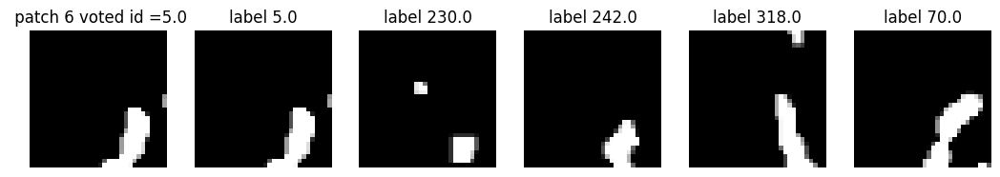

neighbors: [5.0, 192.0, 32.0, 188.0, 34.0] ; indices: [72008 13560 37760 81588 59134]


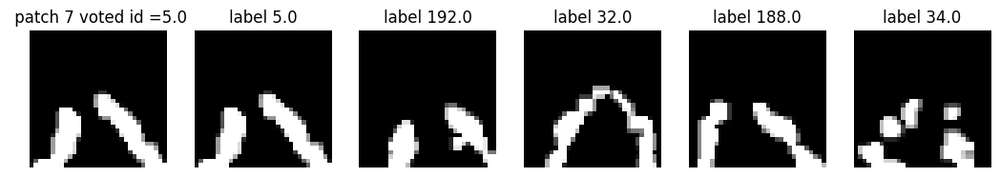

neighbors: [5.0, 174.0, 65.0, 256.0, 282.0] ; indices: [26386 66134  8900 22609 59174]


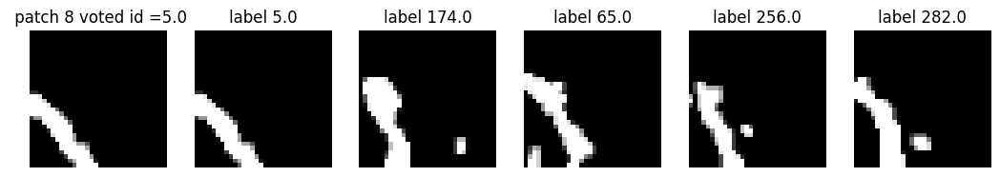

neighbors: [5.0, 218.0, 39.0, 93.0, 26.0] ; indices: [ 7030 80783 51074 14561 14072]


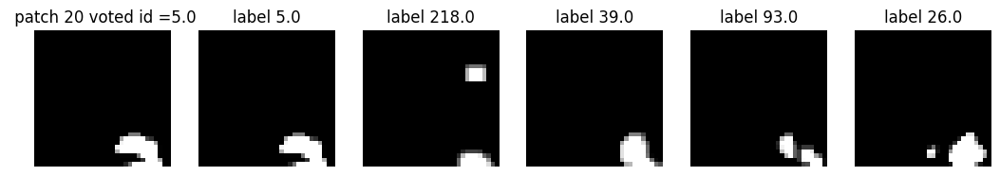

neighbors: [5.0, 165.0, 74.0, 296.0, 147.0] ; indices: [88839 89351 62195 55390 68243]


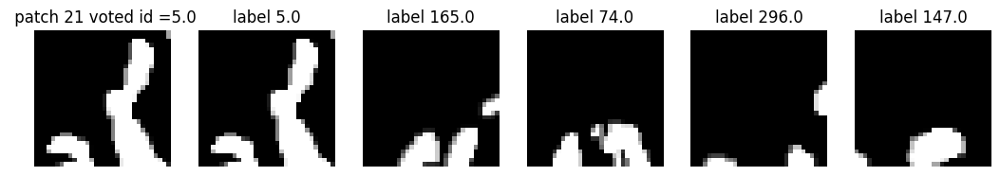

neighbors: [5.0, 222.0, 83.0, 74.0, 160.0] ; indices: [39665 53846 54155 61154 25405]


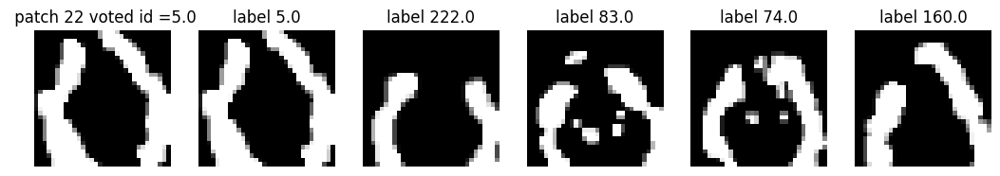

neighbors: [5.0, 77.0, 8.0, 59.0, 302.0] ; indices: [47383 32975 34216 33733 79265]


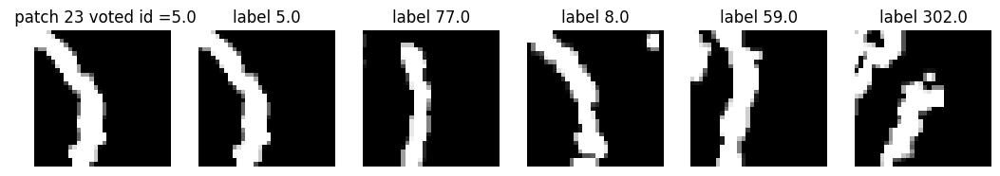

neighbors: [92.0, 142.0, 76.0, 87.0, 7.0] ; indices: [56231 56233 56230 56228 56232]


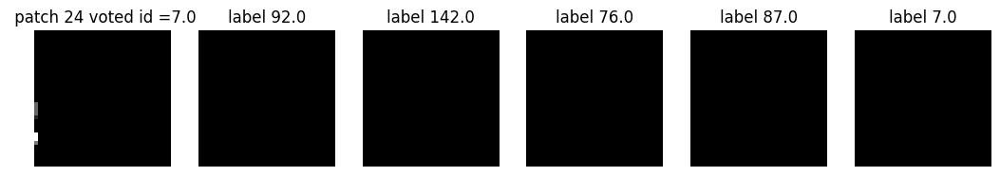

neighbors: [5.0, 61.0, 308.0, 8.0, 70.0] ; indices: [44065 11967 43256 32333 30261]


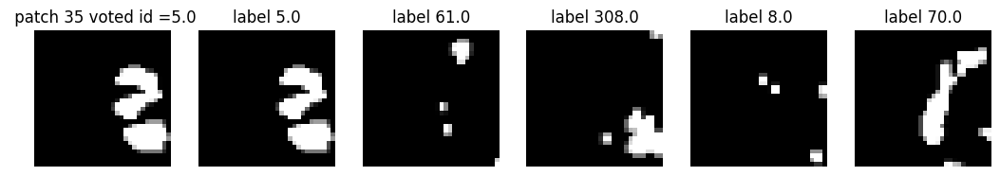

neighbors: [5.0, 70.0, 296.0, 59.0, 41.0] ; indices: [ 9427 47059 66609  4198 23884]


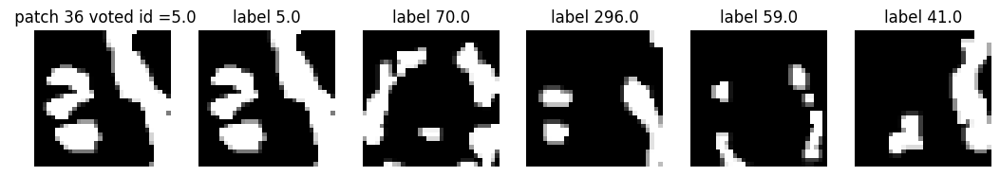

neighbors: [5.0, 32.0, 279.0, 96.0, 145.0] ; indices: [86075 54132  6007 35660 80602]


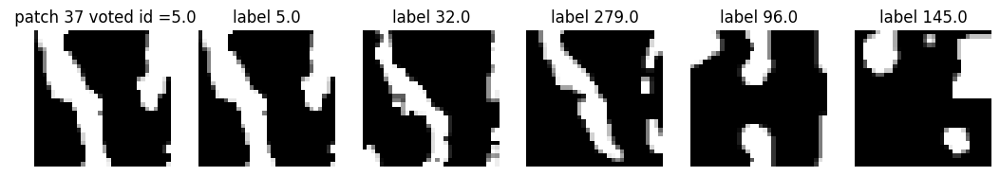

neighbors: [5.0, 162.0, 113.0, 85.0, 280.0] ; indices: [76535 55824 33170 29596 26798]


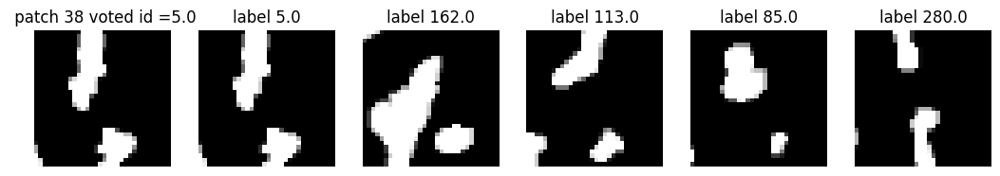

neighbors: [5.0, 181.0, 106.0, 1.0, 6.0] ; indices: [69448 89002 77900 39637  1179]


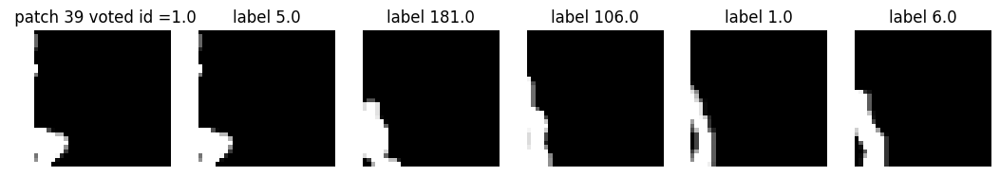

neighbors: [5.0, 222.0, 76.0, 320.0, 203.0] ; indices: [30479 85179 76133 87639 19289]


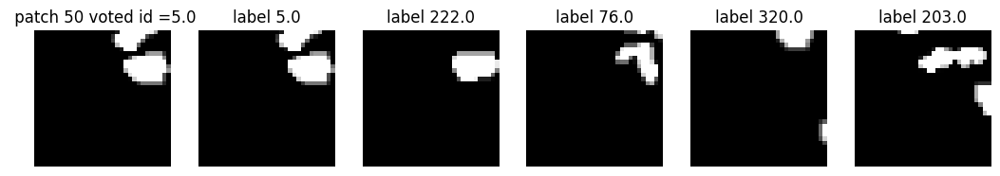

neighbors: [5.0, 160.0, 100.0, 182.0, 259.0] ; indices: [53577  5942 60329 73232 20591]


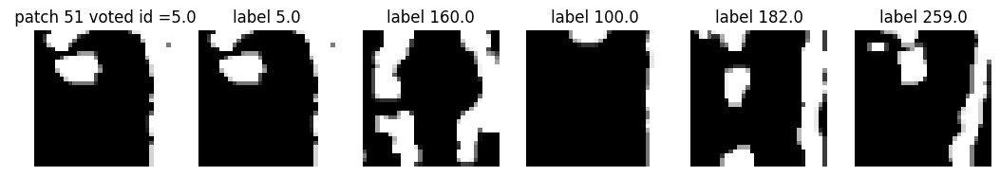

neighbors: [5.0, 8.0, 118.0, 107.0, 283.0] ; indices: [27142 84862 84491 77685 24053]


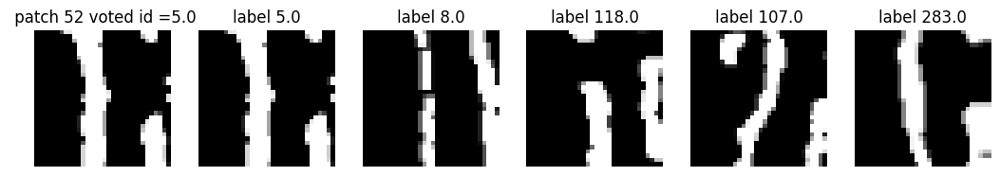

neighbors: [5.0, 199.0, 229.0, 119.0, 292.0] ; indices: [45086 75294  3586 13701 19965]


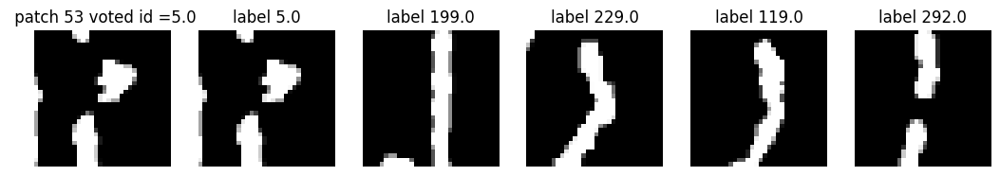

neighbors: [5.0, 216.0, 190.0, 136.0, 79.0] ; indices: [63302 69203 67654 28697 33769]


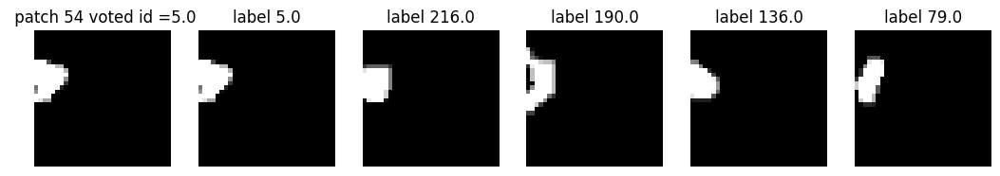

neighbors: [5.0, 262.0, 283.0, 14.0, 9.0] ; indices: [80673  7564 67360 83699 41738]


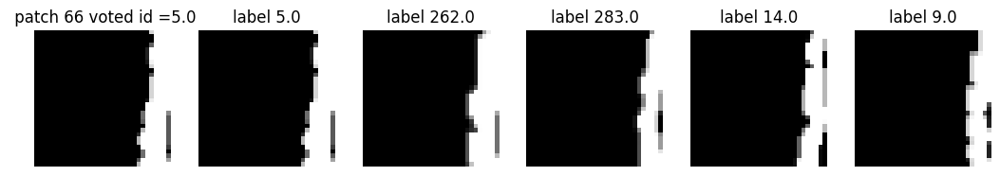

neighbors: [5.0, 69.0, 111.0, 100.0, 254.0] ; indices: [90180 19210 25095 44403 81429]


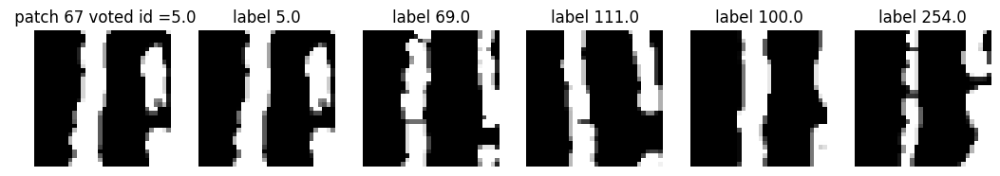

neighbors: [5.0, 55.0, 62.0, 70.0, 227.0] ; indices: [69180 75653 64384 16134 46902]


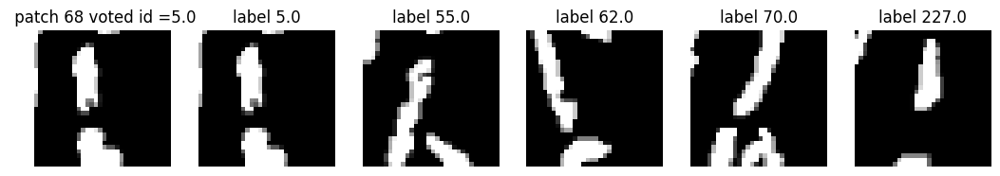

neighbors: [5.0, 2.0, 276.0, 57.0, 6.0] ; indices: [42394 31368 89308  5774 16813]


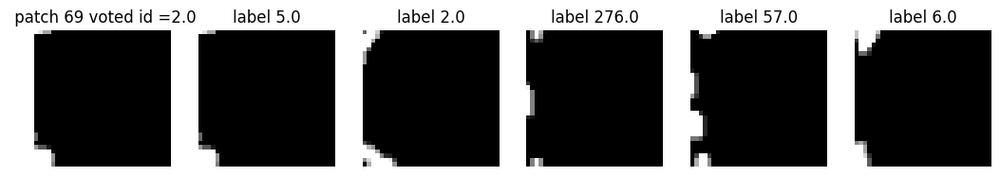

neighbors: [5.0, 4.0, 49.0, 69.0, 142.0] ; indices: [33398 86732 58510 70983 62405]


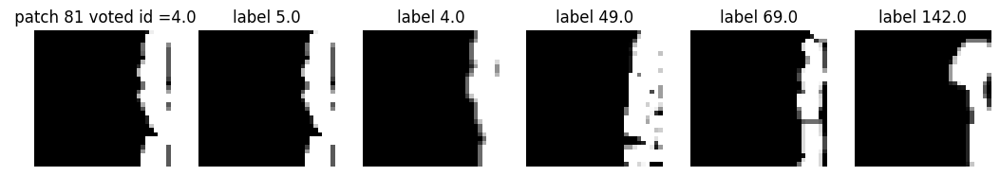

neighbors: [5.0, 37.0, 78.0, 140.0, 215.0] ; indices: [ 3631 81732  6544   377 56472]


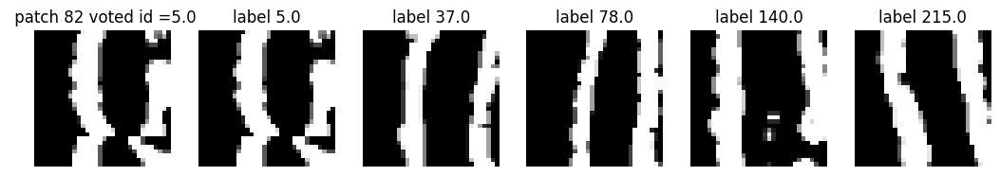

neighbors: [5.0, 186.0, 85.0, 87.0, 263.0] ; indices: [52930  9772 60845 32783 84400]


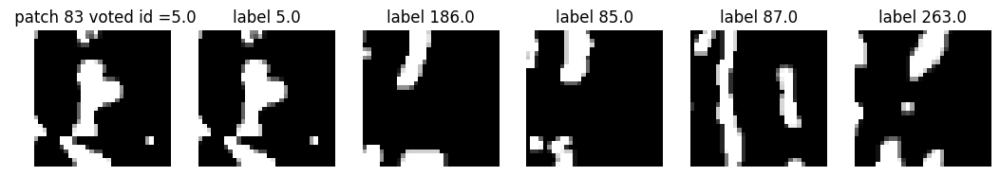

neighbors: [5.0, 163.0, 314.0, 18.0, 137.0] ; indices: [20180 31703 79036 78332 18210]


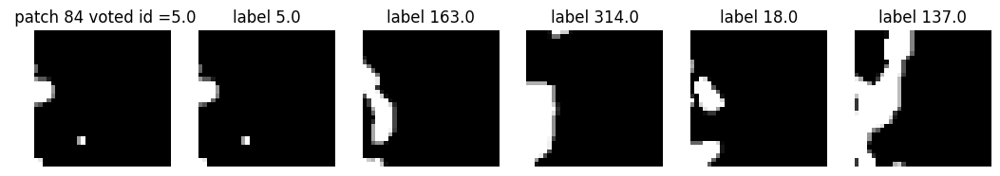

neighbors: [5.0, 9.0, 3.0, 228.0, 4.0] ; indices: [62262 44923 50942 86844 86732]


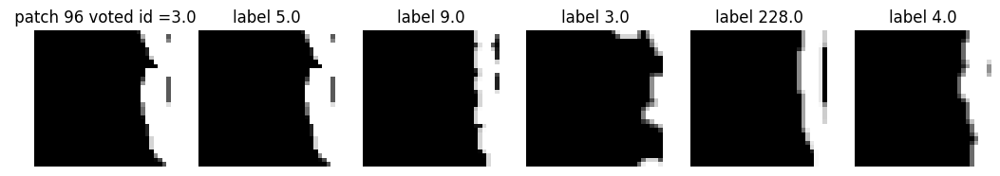

neighbors: [5.0, 119.0, 110.0, 156.0, 102.0] ; indices: [18927 54717 72124 83584 64201]


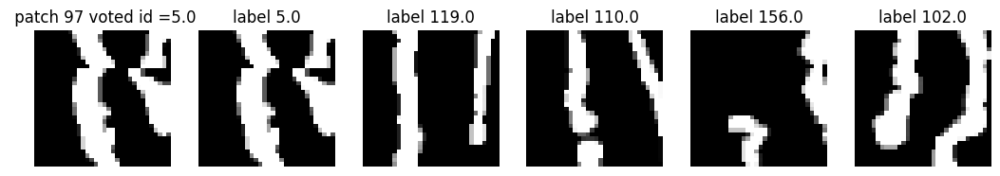

neighbors: [5.0, 190.0, 209.0, 150.0, 321.0] ; indices: [19983 76991 17279 78249 77065]


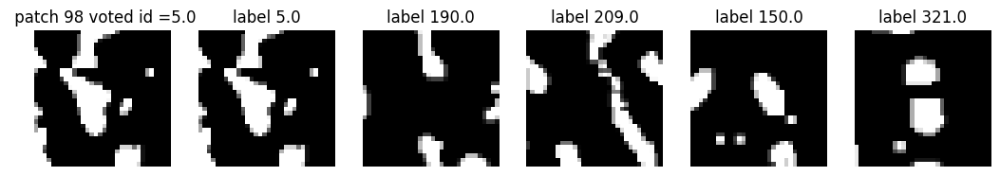

neighbors: [5.0, 179.0, 54.0, 54.0, 59.0] ; indices: [85811 21074 59422 31282 34969]


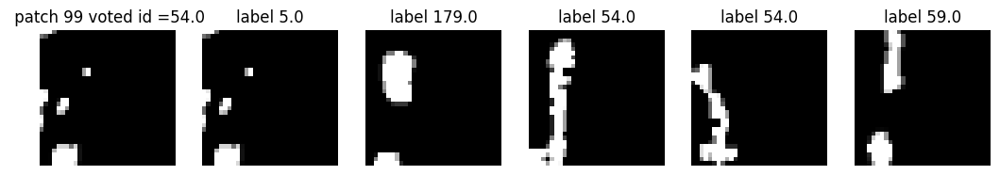

neighbors: [5.0, 261.0, 17.0, 132.0, 245.0] ; indices: [87587 87011 83057 65257 62348]


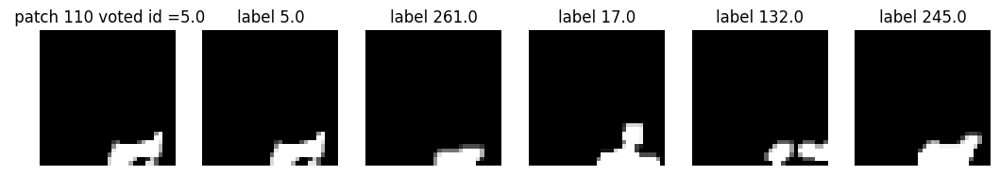

neighbors: [5.0, 97.0, 319.0, 267.0, 84.0] ; indices: [36366 22703 88322 36902 70257]


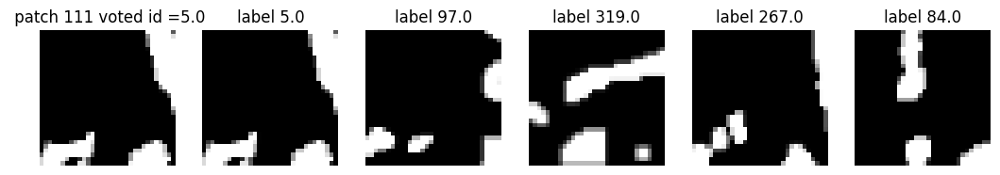

neighbors: [5.0, 121.0, 2.0, 150.0, 105.0] ; indices: [57016 74086 77308 70640 49959]


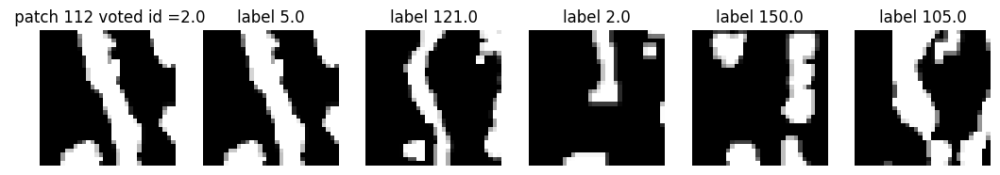

neighbors: [5.0, 68.0, 117.0, 21.0, 55.0] ; indices: [81455 32774 17409 71028 41828]


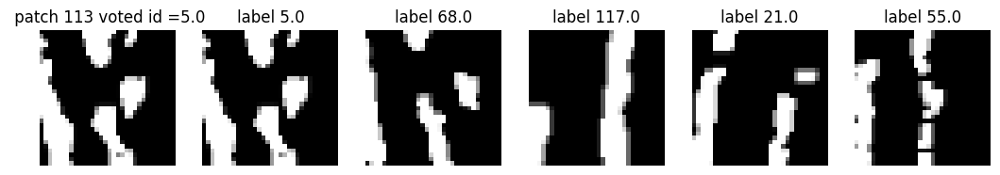

neighbors: [5.0, 70.0, 143.0, 316.0, 172.0] ; indices: [29443 46922 81740 28218 90270]


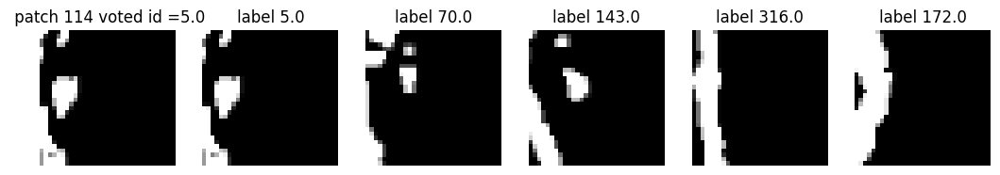

neighbors: [5.0, 82.0, 21.0, 19.0, 288.0] ; indices: [62752 78717 36964 51720 70087]


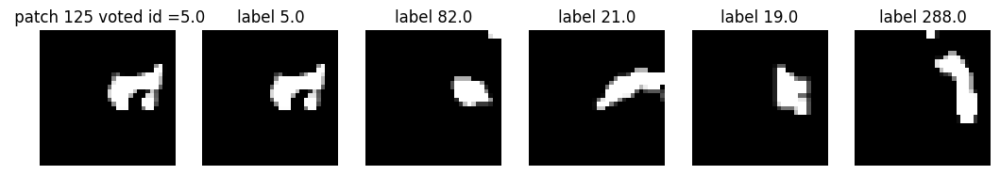

neighbors: [5.0, 267.0, 220.0, 4.0, 99.0] ; indices: [57665 15345 19003 27542 34013]


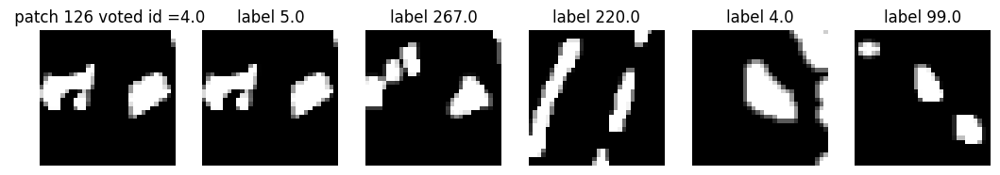

neighbors: [5.0, 28.0, 172.0, 291.0, 88.0] ; indices: [ 6403 81703 58516   350 57646]


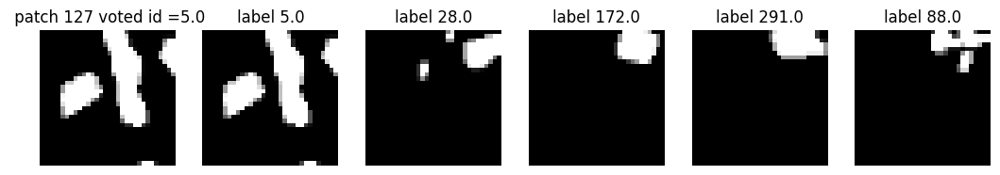

neighbors: [5.0, 141.0, 266.0, 277.0, 256.0] ; indices: [19646 14211 82282 63999 43445]


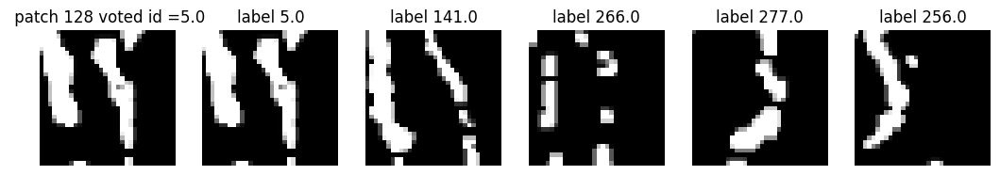

neighbors: [5.0, 159.0, 102.0, 162.0, 239.0] ; indices: [73079 68348 58153 31408 36451]


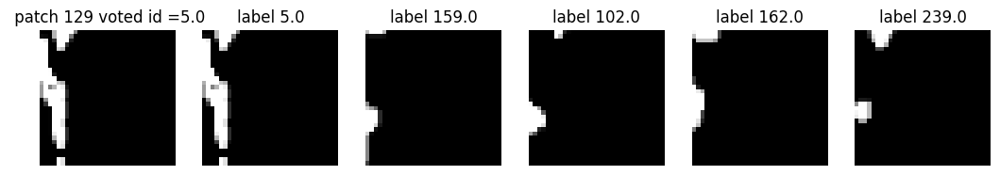

neighbors: [5.0, 107.0, 17.0, 39.0, 22.0] ; indices: [50931 63356 54966  7324 73938]


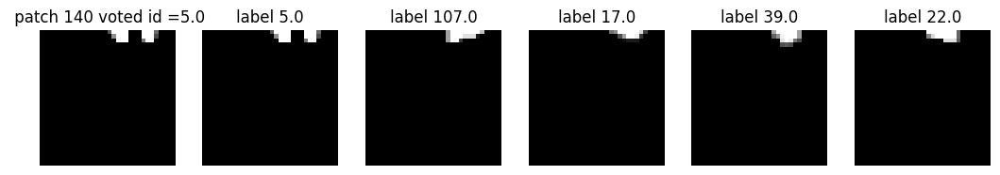

neighbors: [5.0, 319.0, 29.0, 69.0, 267.0] ; indices: [17890 80119 45925  6883 72526]


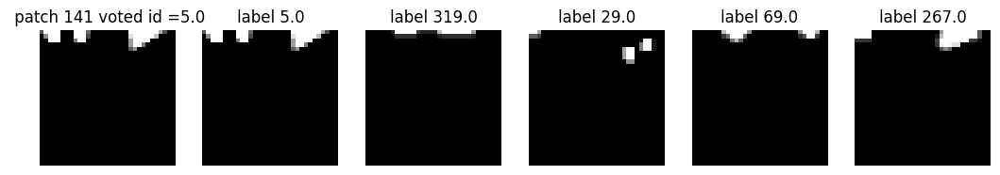

neighbors: [5.0, 10.0, 304.0, 267.0, 153.0] ; indices: [ 4351 52294 22744 23361 49265]


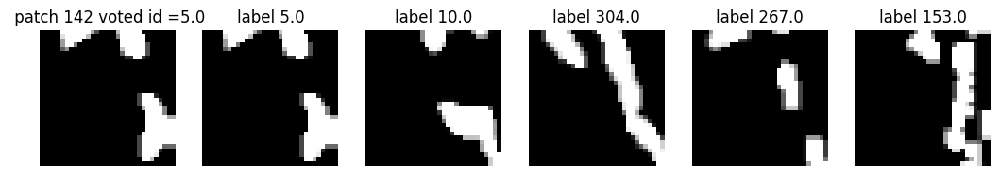

neighbors: [5.0, 228.0, 308.0, 109.0, 155.0] ; indices: [60210 33541 53634 60567 56131]


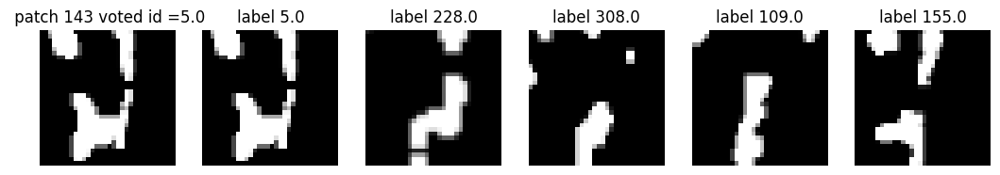

neighbors: [5.0, 23.0, 96.0, 200.0, 3.0] ; indices: [76349 11903 34284 29450 45201]


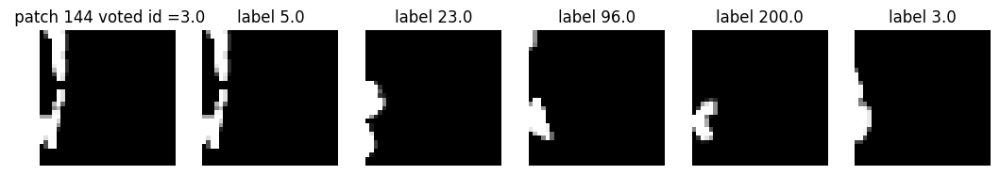

neighbors: [5.0, 214.0, 138.0, 19.0, 303.0] ; indices: [88174 75631 80769 42971 15607]


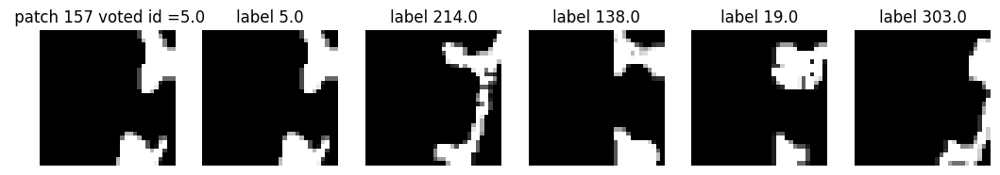

neighbors: [5.0, 219.0, 303.0, 111.0, 214.0] ; indices: [11721  9368  6805  1452 39258]


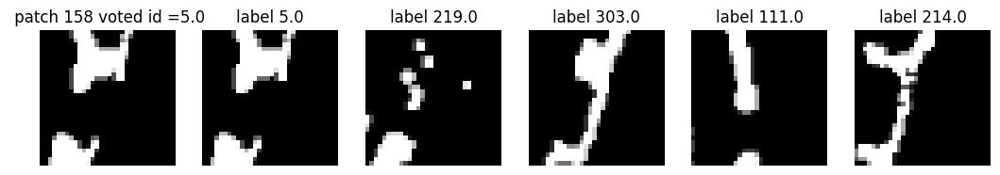

neighbors: [5.0, 291.0, 199.0, 176.0, 227.0] ; indices: [ 4262 16518 60889 49783  4645]


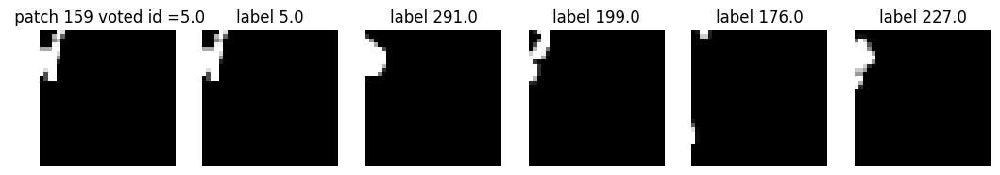

neighbors: [5.0, 68.0, 199.0, 124.0, 202.0] ; indices: [77933 46127 29232 82076 71543]


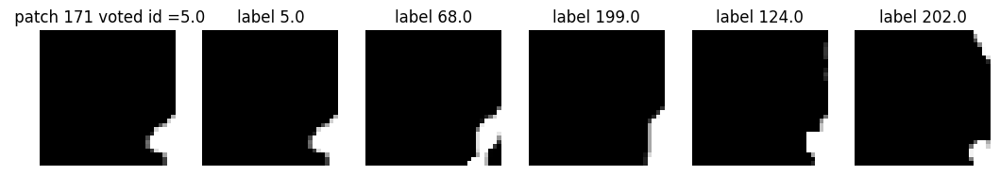

neighbors: [5.0, 263.0, 241.0, 229.0, 298.0] ; indices: [74474 80054 14739 41388 44168]


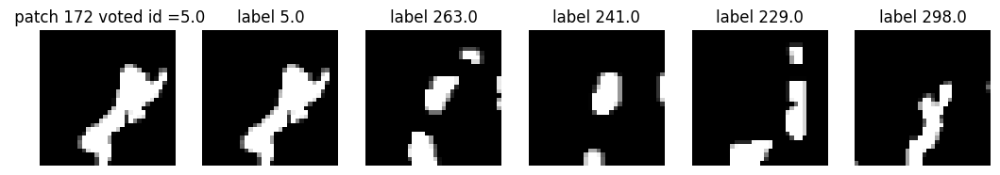

neighbors: [5.0, 112.0, 83.0, 44.0, 11.0] ; indices: [67725 35852 75905 17377 51167]


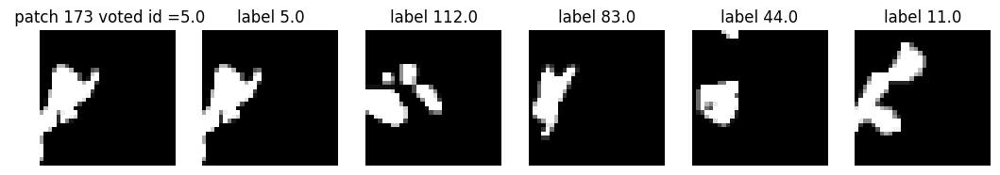

neighbors: [5.0, 79.0, 25.0, 88.0, 32.0] ; indices: [ 7018  2618 19693 39062 85414]


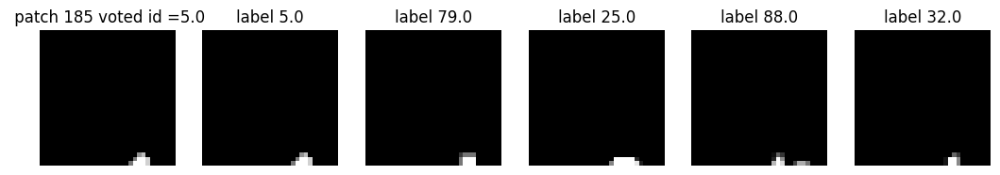

neighbors: [5.0, 26.0, 41.0, 88.0, 318.0] ; indices: [27110 60378 87054  5183 65862]


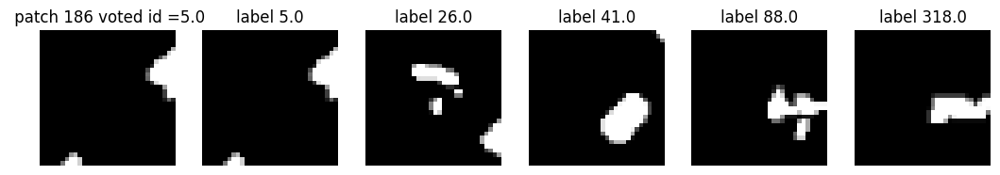

neighbors: [5.0, 79.0, 215.0, 228.0, 293.0] ; indices: [75260 56056 73843 83821 32859]


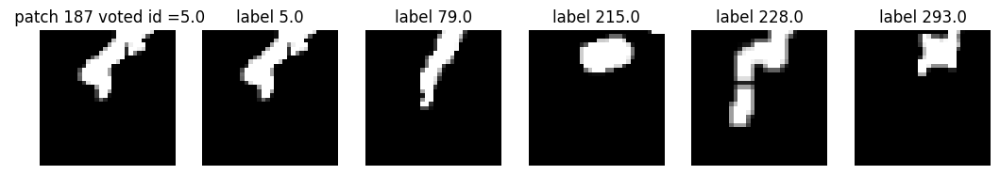

neighbors: [5.0, 6.0, 321.0, 100.0, 96.0] ; indices: [27886 40888 27656 54500 32791]


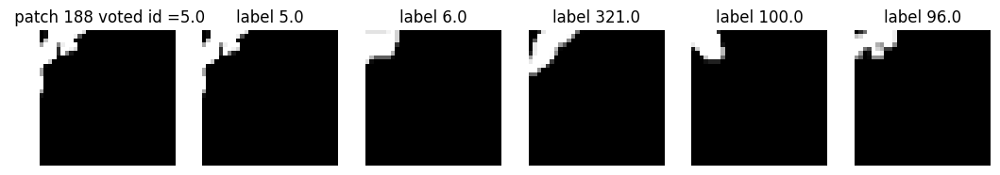

neighbors: [5.0, 309.0, 54.0, 47.0, 159.0] ; indices: [51839 85009 38506 26621  3793]


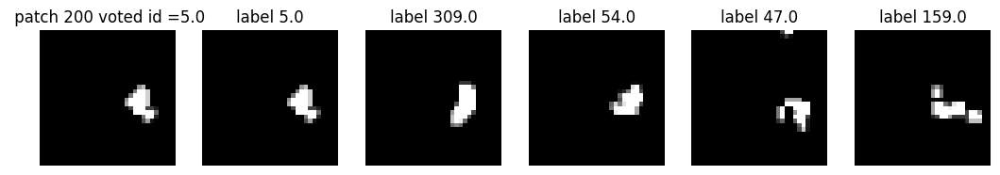

neighbors: [5.0, 68.0, 294.0, 183.0, 56.0] ; indices: [64995 23926 52878 74833 55653]


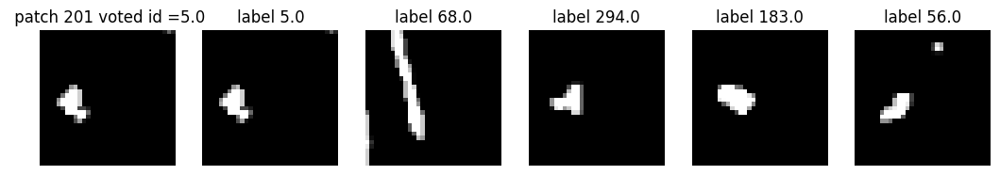

neighbors: [92.0, 142.0, 76.0, 87.0, 7.0] ; indices: [56231 56233 56230 56228 56232]


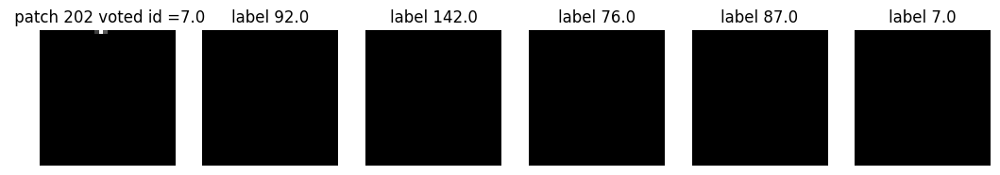

neighbors: [5.0, 46.0, 147.0, 87.0, 181.0] ; indices: [70538 76772  5766 81128 29307]


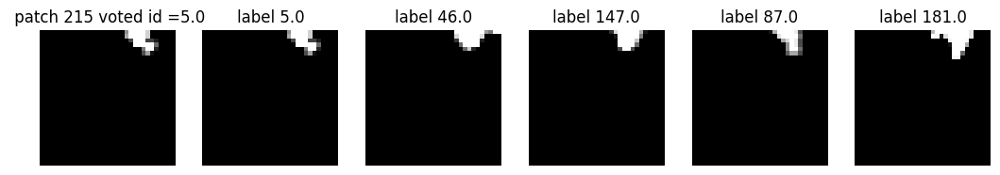

neighbors: [5.0, 87.0, 32.0, 55.0, 25.0] ; indices: [21275 80349  6902 63290 10053]


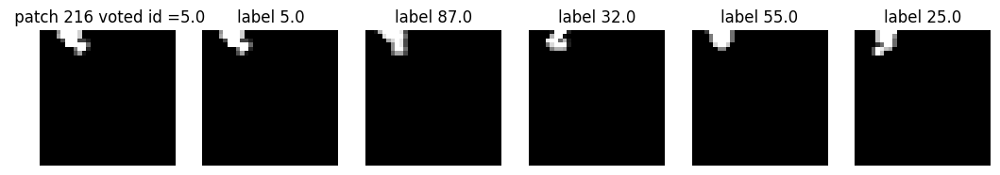

In [ ]:
display_solo_votes(list(dataset_dict.values())[8],reshaped_data,dataset_dict)

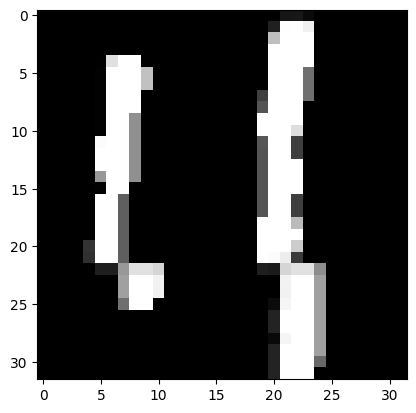

In [ ]:
plt.imshow(decode_features(SAMPLES[1748]),cmap="gray")
plt.show()

In [ ]:
dict_keys_path.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 22

In [ ]:
dict_keys_path[76]

['/content/drive/MyDrive/boleil_annotated/spot_masks/076.png',
 '/content/drive/MyDrive/boleil_annotated/spot_masks/076b.png',
 '/content/drive/MyDrive/boleil_annotated/spot_masks/076c.png',
 '/content/drive/MyDrive/boleil_annotated/spot_masks/076d.png',
 '/content/drive/MyDrive/boleil_annotated/spot_masks/076e.png']

In [ ]:
key1="/content/drive/MyDrive/boleil_annotated/spot_masks/005.png"
key2="/content/drive/MyDrive/boleil_annotated/spot_masks/076b.png"
plot_blocks(dataset_dict[key1])
plot_blocks(dataset_dict[key2])

In [ ]:
solo_knn_results(to_predict,reshaped_data,dataset_dict)

len(train)=33750. ; len(test)=100
shape of inv cov mat = (24, 24)
solo KNN vote 50/51
shape of input patch feature vector (1, 24)


,votes,indices,neighbours,dist
0,15.0,"[5856, 15156, 11331, 10206, 22447]","[15.0, 46.0, 32.0, 30.0, 64.0]","[0.0, 1.75060135365589, 1.944970427140264, 1.9..."
1,15.0,"[5857, 5407, 27097, 7673, 14046]","[15.0, 15.0, 76.0, 21.0, 42.0]","[0.0, 2.2931896092009727, 3.577471170104054, 3..."
2,15.0,"[5858, 5408, 8273, 15083, 27233]","[15.0, 15.0, 22.0, 46.0, 76.0]","[0.0, 1.0925007667828388, 1.5747945910017618, ..."
3,15.0,"[5870, 13584, 32944, 7207, 27996]","[15.0, 40.0, 93.0, 21.0, 76.0]","[0.0, 0.7198955451527073, 0.9405311018300961, ..."
4,15.0,"[5871, 12456, 16012, 29032, 25266]","[15.0, 36.0, 48.0, 79.0, 70.0]","[0.0, 3.1069519711013918, 3.1768493925522283, ..."
5,15.0,"[5872, 27127, 13763, 15817, 8902]","[15.0, 76.0, 41.0, 48.0, 25.0]","[0.0, 2.8792989347767635, 2.9424840980823954, ..."
6,15.0,"[5873, 18699, 10613, 12248, 29527]","[15.0, 55.0, 32.0, 35.0, 80.0]","[0.0, 1.1826823300578653, 1.680192762747188, 1..."
7,15.0,"[5885, 5496, 28820, 10821, 9560]","[15.0, 15.0, 79.0, 32.0, 28.0]","[0.0, 1.5727386220990447, 1.6523394807698433, ..."
8,15.0,"[5886, 3711, 23677, 17796, 20286]","[15.0, 11.0, 68.0, 54.0, 58.0]","[0.0, 4.050546219774563, 4.598956481877335, 4...."
9,15.0,"[5887, 10657, 28597, 12892, 9547]","[15.0, 32.0, 78.0, 38.0, 28.0]","[0.0, 5.613756140975273, 5.989750104813514, 7...."


[ 1.  1.  1. ... 95. 95. 95.]


,votes,frequency
0,15.0,51


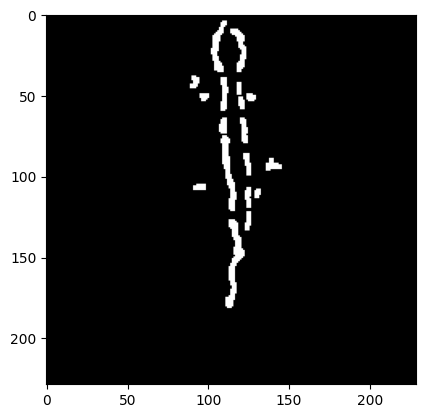

In [ ]:
plt.imshow(to_predict,cmap="gray")
plt.show()

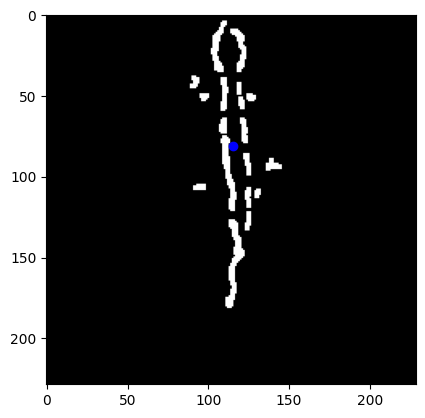

In [ ]:
contours, _ = cv2.findContours(to_predict, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt =np.concatenate(contours)
M = cv2.moments(cnt)
cnt = cnt.reshape(-1, 2)
centroid_to_predict = np.mean(cnt, axis=0)
cx = int(M['m10' ] /M['m00'])
cy = int(M['m01' ] /M['m00'])
centroid = (cx ,cy)
#plt.scatter(cx ,cy ,color="pink" ,linewidth=2.5 ,zorder=3 ,label="centroid point")
plt.scatter(centroid_to_predict[0], centroid_to_predict[1], color='blue')
plt.imshow(to_predict,cmap="gray")
plt.show()

In [ ]:
  # Approximate the contour with a polygonal curve
contours, _ = cv2.findContours(to_predict, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt =np.concatenate(contours)
perimeter = cv2.arcLength(cnt, True)

approx_curve = cv2.approxPolyDP(cnt, 0.02 * 0.1, True)
M = cv2.moments(cnt)
cx = int(M['m10'] / M['m00'])
cy = int(M['m01'] / M['m00'])

img = cv2.cvtColor(to_predict, cv2.COLOR_GRAY2BGR)
cv2.drawContours(img, [cnt], -1, (0, 0, 255), 2)
approx_curve = np.append(approx_curve, [approx_curve[0]], axis=0)

        # Extract the x and y coordinates of the approximated curve
x = approx_curve[:, 0, 0]
y = approx_curve[:, 0, 1]
head_point = min(approx_curve, key=lambda x: x[0][1])
tail_point = max(approx_curve, key=lambda x: x[0][1])

        # Plot the original image and the approximated curve
plt.imshow(img)
plt.scatter(head_point[0][0], head_point[0][1], color="orange", linewidth=2.5, zorder=3, label="head point")
plt.scatter(tail_point[0][0], tail_point[0][1], color="green", linewidth=2.5, zorder=3, label="tail point")
plt.scatter(cx, cy, color="pink", linewidth=2.5, zorder=3, label="centroid point")
plt.show()

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assuming `to_predict` is the binary image
contours, _ = cv2.findContours(to_predict, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = np.concatenate(contours)

# Find the minimum area rectangle
rect = cv2.minAreaRect(cnt)

# Get the rectangle's center, width, and height
center, size, angle = rect
width = size[0]
height = size[1]

# Adjust the width and height if the rectangle is tilted
if angle < -45:
    width, height = height, width

# Calculate the top-left corner of the upright rectangle
x = int(center[0] - width / 2)
y = int(center[1] - height / 2)

# Create the upright rectangle
upright_rect = np.array([[x, y], [x + width, y], [x + width, y + height], [x, y + height]], dtype=np.int0)

# Calculate the centroid of the upright rectangle
centroid = np.mean(upright_rect, axis=0)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(8, 8))

# Plot the binary image
ax.imshow(to_predict, cmap='gray')

# Plot the upright rectangle
rect_patch = plt.Polygon(upright_rect, fill=None, edgecolor='red', linewidth=1.5)
ax.add_patch(rect_patch)

# Plot the centroid as a pink point
ax.plot(centroid[0], centroid[1], marker='o', markersize=8, color='pink')

# Set axis limits
ax.set_xlim([0, to_predict.shape[1]])
ax.set_ylim([to_predict.shape[0], 0])  # Flip the y-axis

# Show the plot
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assuming `to_predict` is the binary image
contours, _ = cv2.findContours(to_predict, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = np.concatenate(contours)

# Calculate the minimum bounding rectangle that fits the contour
x, y, w, h = cv2.boundingRect(cnt)

# Create the rectangle
bounding_rect = np.array([[x, y], [x + w, y], [x + w, y + h], [x, y + h]], dtype=np.int0)

# Calculate the centroid of the rectangle
centroid = np.mean(bounding_rect, axis=0)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(8, 8))

# Plot the binary image
ax.imshow(to_predict, cmap='gray')

# Plot the rectangle
rect_patch = plt.Polygon(bounding_rect, fill=None, edgecolor='red', linewidth=1.5)
ax.add_patch(rect_patch)

# Plot the centroid as a pink point
ax.plot(centroid[0], centroid[1], marker='o', markersize=8, color='pink')

# Set axis limits
ax.set_xlim([0, to_predict.shape[1]])
ax.set_ylim([to_predict.shape[0], 0])  # Flip the y-axis

# Show the plot
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Assuming `to_predict` is the binary image
contours, _ = cv2.findContours(to_predict, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = np.concatenate(contours)

# Reshape the `cnt` array to 2D
cnt = cnt.reshape(-1, 2)

# Perform DBSCAN clustering on the contour points
clustering = DBSCAN(eps=30, min_samples=5).fit(cnt)
labels = clustering.labels_
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

# Find the largest cluster
largest_cluster_label = np.argmax(np.bincount(labels[labels != -1]))
largest_cluster_mask = labels == largest_cluster_label
largest_cluster_points = cnt[largest_cluster_mask]

# Find the minimum area rectangle for the largest cluster
rect = cv2.minAreaRect(largest_cluster_points)
box = cv2.boxPoints(rect)
box = np.int0(box)

# Calculate the centroid of the largest cluster
centroid_cluster = np.mean(largest_cluster_points, axis=0)

# Calculate the centroid of the entire `to_predict` binary image
centroid_to_predict = np.mean(cnt, axis=0)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(8, 8))

# Plot the binary image
ax.imshow(to_predict, cmap='gray')

# Plot the largest cluster points in blue
ax.scatter(largest_cluster_points[:, 0], largest_cluster_points[:, 1], c='blue', s=5, alpha=0.5)

# Plot the rectangle in red
rect_patch = plt.Polygon(box, fill=None, edgecolor='red', linewidth=1.5)
ax.add_patch(rect_patch)

# Plot the centroid of the largest cluster as a pink point
ax.plot(centroid_cluster[0], centroid_cluster[1], marker='o', markersize=8, color='pink')

# Plot the centroid of the entire `to_predict` binary image as a blue point
ax.plot(centroid_to_predict[0], centroid_to_predict[1], marker='o', markersize=8, color='blue')

# Set axis limits
ax.set_xlim([0, to_predict.shape[1]])
ax.set_ylim([to_predict.shape[0], 0])  # Flip the y-axis

# Show the plot
plt.show()


In [ ]:
"""
def get_data(reshaped=False,nu=True,images_too=False):
  """
    returns dataset made of the loaded batch
    if nu = True returns the moments vector
    if reshapred = True returns reshaped dataset
    if images_too= True returns original data as well
  """
  ZEROES=False
  STRIDE=16
  dataset= []
  data= load_batch(BATCH)
  for name,img in data.items():
    img= cv2.resize(img,(256,256))
    id= "".join(filter(str.isdigit, name))
    id = int(id)

   # patchs= get_patchs(img,stride=STRIDE) ## recouvrement

    if ZEROES:  #if we keep zero patches in data
      patchs= get_patchs(img,stride=STRIDE,)
      if nu:
        nu_patches  =[moments_reduction(p,id) for p in patchs]
      #nu_patches  =[centroid_reduction(p,c,pixel=True,nu=True,id=id) for (p,c) in zip(patchs,coords)] ##vector of coords, nu moments, pixels
      else:
        nu_patches=[vector_reduction(p,id) for p in patchs]
      #nu_patches  =[centroid_reduction(p,c,pixel=True,id=id) for (p,c) in zip(patchs,coords)]  ##vector of coords, pixels

      dataset.append(np.array(nu_patches))

    else: #if we filter out zero patches from data
      patchs= get_patchs(img,stride=STRIDE)
      if nu:
        nu_patches  =[dataset.append(moments_reduction(p,pix=True,id=id)) for p in patchs if np.sum(p) !=0]
        #nu_patches  =[dataset.append(centroid_reduction(p,c,pixel=True,nu=True,id=id)) for (p,c) in zip(patchs,coords)] ##vector of coords, nu moments, pixels
      else:
        nu_patches=[dataset.append(vector_reduction(p,id)) for p in patchs]
      #nu_patches  =[centroid_reduction(p,c,pixel=True,id=id) for (p,c) in zip(patchs,coords)]  ##vector of coords, pixels


  if reshaped:
    return reshape_data(np.array(dataset))
  if images_too:
    return np.array(dataset),data
  else:
    return np.array(dataset)

def patch_knns(dataset):
    patch_KNN = []
    nb_patchs = dataset.shape[0]
    for i in range(nb_patchs):
        trainset = dataset[i]
        #np.random.shuffle(trainset)
        train_samples, train_labels = trainset[:100, :-1], trainset[:100, -1]
        test_samples, test_labels = trainset[100:, :-1], trainset[100:, -1]

        train_samples = train_samples.astype(np.float32)
        train_labels = train_labels.astype(np.float32)

        test_samples = test_samples.astype(np.float32)
        test_labels = test_labels.astype(np.float32)

        # Compute the covariance matrix for Mahalanobis distance
        epsilon = 1e-6  # Small positive constant for regularization
        cov_matrix = np.cov(train_samples, rowvar=False)
        inv_cov_matrix = np.linalg.inv(cov_matrix + epsilon * np.eye(cov_matrix.shape[0]))


        def mahalanobis_distance(x, y):
            return mahalanobis(x, y, inv_cov_matrix)

        knn = KNeighborsClassifier(n_neighbors=5, metric=mahalanobis_distance)
        knn.fit(train_samples, train_labels)
        patch_KNN.append(knn)

        results = knn.predict(test_samples)

        matches = results == test_labels

        correct = np.count_nonzero(matches)
        accuracy = correct * 100.0 / results.size

        #print( "{} : {}".format(i,accuracy) )

    return patch_KNN

def get_knn_votes(image,patch_knns,nu=True):

  patch_votes=[]
  patch_neighbours=[]
  patch_dist=[]

  # resize image to 256,256
  image=cv2.resize(image,(256,256))
  # get patchs of the image
  patchs=get_patchs(image,stride=16) ####)
  # get nu moments vectors
  if nu:
    nu_patches  =[moments_reduction(p) for p in patchs]
  else :
    nu_patches  =[vector_reduction(p) for p in patchs]
  nu_patches  =np.asarray(nu_patches)
  #print("nu patches {} ; element of it {}".format(nu_patches.shape,nu_patches[0].shape))
  # get knn vote for each patch

  for i,knn in enumerate(patch_knns):
    #print("knn : {}".format(i))
    # run prediction for patch i on knn that was trained on patchs of position i
    nu_patches[i] = nu_patches[i].astype(np.float32)  # Convert to CV_32F

    tmp=np.asarray( [nu_patches[i]])
    tmp=tmp.astype(np.float32)

    distances, indices = knn.kneighbors(tmp, n_neighbors=5)

    results = knn.predict(tmp)
    patch_votes.append(results.flatten())
    patch_neighbours.append(indices.flatten())
    patch_dist.append(distances.flatten())

  return patch_votes,patch_neighbours,patch_dist

def knn_results(image,dataset,displayed=True,return_df=False):

    display intermediate results such as the KNN predictions for each patch and the selected non-zero patchs result and frequence of the selected votes

  nb_patchs,_,dims= dataset.shape

  nu=True
  if dims==1025:
    nu=False
  patch_KNN= patch_knns(dataset)
  patch_votes,patch_neighbours,patch_dist= get_knn_votes(image,patch_KNN,nu)
  df=pd.DataFrame(np.asarray(patch_votes).reshape(nb_patchs,),columns=["votes"])
  df["neighbors"]=patch_neighbours
  df["dist"]=patch_dist
  pd.set_option("display.max_rows", None)

  non_zero_idx=non_zero_patchs_idx(image)
  extracted_values = df.iloc[non_zero_idx]['votes']
  selected_rows = df.loc[non_zero_idx]
  if displayed:
    display(selected_rows)
    display(extracted_values)

  value_counts = extracted_values.value_counts()
  frequency_df = pd.DataFrame({'votes': value_counts.index, 'frequency': value_counts.values})

  if displayed:
    display(frequency_df)
  if return_df:
    return frequency_df
"""

'\ndef patch_knns(dataset):\n    patch_KNN = []\n    nb_patchs = dataset.shape[0]\n    for i in range(nb_patchs):\n        trainset = dataset[i]\n        #np.random.shuffle(trainset)\n        train_samples, train_labels = trainset[:100, :-1], trainset[:100, -1]\n        test_samples, test_labels = trainset[100:, :-1], trainset[100:, -1]\n\n        train_samples = train_samples.astype(np.float32)\n        train_labels = train_labels.astype(np.float32)\n\n        test_samples = test_samples.astype(np.float32)\n        test_labels = test_labels.astype(np.float32)\n\n        # Compute the covariance matrix for Mahalanobis distance\n        epsilon = 1e-6  # Small positive constant for regularization\n        cov_matrix = np.cov(train_samples, rowvar=False)\n        inv_cov_matrix = np.linalg.inv(cov_matrix + epsilon * np.eye(cov_matrix.shape[0]))\n\n\n        def mahalanobis_distance(x, y):\n            return mahalanobis(x, y, inv_cov_matrix)\n\n        knn = KNeighborsClassifier(n_neighb